In [1]:
import matplotlib as mpl
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

                        A
0 days 00:27:00 -0.039648
0 days 00:28:00 -0.039804
0 days 00:29:00 -0.039969
0 days 00:30:00 -0.039993
0 days 00:31:00 -0.039757
...                   ...
0 days 23:42:00  0.148256
0 days 23:43:00  0.148335
0 days 23:44:00  0.148425
0 days 23:45:00  0.148444
0 days 23:46:00  0.148480

[1400 rows x 1 columns]
(datetime.timedelta(seconds=1560), datetime.timedelta(seconds=85560)) 1400
[-3.44896751e-01  1.86344933e+03  3.09662842e-01]
[[ 1.89244051e-06 -1.51412575e-02 -1.97895624e-06]
 [-1.51412575e-02  1.23680378e+02  1.59421348e-02]
 [-1.97895624e-06  1.59421348e-02  2.07497677e-06]]
0.9995444153729263
-0.03964808352731808


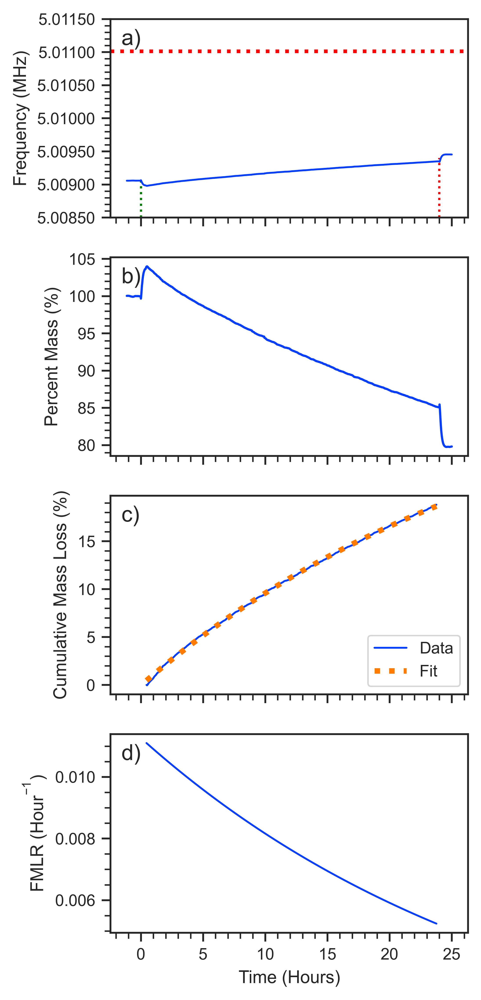

In [93]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
import seaborn as sns
from scipy.optimize import curve_fit
import datetime as dt
import matplotlib as mpl
from matplotlib.ticker import FormatStrFormatter
import matplotlib.dates as mdates
from datetime import datetime, timedelta
from matplotlib.dates import DateFormatter
%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set_style('ticks')
sns.set_context('paper')
sns.set_palette('dark')
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
'''
def bi_exp(x, k_1,t_1,k_2,t_2,c):
    return c+k_1*np.exp(-x/t_1) + k_2*np.exp(-x/t_2)
def d_bi_exp(x, k_1,t_1,k_2,t_2,c):
    return -k_1*(1/t_1)*np.exp(-x/t_1) + -k_2*(1/t_2)*np.exp(-x/t_2)
'''
def bi_exp(x, k_1,t_1,c):
    return c+k_1*np.exp(-x/t_1)
def d_bi_exp(x, k_1,t_1,c):
    return -k_1*(1/t_1)*np.exp(-x/t_1) 
def qcm_to_speed_plot(path_1,loading=(5000000,5000000),sma_window_size=100,savgol_para=(61,4),time_frame=['2022-06-08 14:00:00','2022-06-09 16:00:00'],plot_name='6_8_305nm_LED',b_switch=True,baseline_time=None,delta=10):
    data = pd.read_excel(path_1,header=0,parse_dates=True,usecols=['Time','Untitled'])
    data=data.set_index('Time')
    data.rename(columns = {'Untitled':'A'}, inplace = True)
    t0 = '02/23/2023 15:09:00'
    data['A']=data['A'].dropna()
    #print(data['A'])
    #data['A'] = data['A'] - data['A'][1]
    #print(data)
    data= data.asfreq(freq='60s',method='pad')
    #print('pass 1')
    #fig, axes = plt.subplots(4, 1,sharex=True,figsize=(6,12))
    fig, axes = plt.subplots(4, 1,sharex=True,figsize=(3.5,9))
    
    #fig, axes= plt.subplot_mosaic([['a)'], ['b)'], ['c)'],['d)']],sharex=True,figsize=(6,12))
    #axes[0].text(1,4,'a)')
    axes[3].set_xlabel('Time (Hours)')
    axes[0].set_ylabel('Frequency (MHz)')
    axes[1].set_ylabel('Percent Mass (%)')
    axes[2].set_ylabel('Cumulative Mass Loss (%)')
    axes[0].text(0.03, 0.95, 'a)',transform=axes[0].transAxes, fontsize=12,verticalalignment='top')
    axes[1].text(0.03, 0.95, 'b)',transform=axes[1].transAxes, fontsize=12,verticalalignment='top')
    axes[2].text(0.03, 0.95, 'c)',transform=axes[2].transAxes, fontsize=12,verticalalignment='top')
    axes[3].text(0.03, 0.95, 'd)',transform=axes[3].transAxes, fontsize=12,verticalalignment='top')
    
    axes[3].set_ylabel('FMLR ($\mathregular{Hour^{-1}}$)')
    axes[0].axvline(x=0, color='g', linestyle='dotted',ymax=0.2)
    axes[0].axvline(x=24, color='r', linestyle='dotted',ymax=0.3)
    
    #axes.set_ylim([5.00445e6,5.0046e6])
    #axes.set_ylim([5.0045e6,5.00475e6])
    #axes.set_ylim([5.00529e6,5.00545e6])

    #axes.set_ylim([5.0089e6,5.0095e6])
    #axes.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    axes[0].set_ylim([5.0085e6,5.0115e6])
    fmt = lambda x, pos: '{:.5f}'.format(x/1e6, pos)
    axes[0].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
    #axes.ticklabel_format(useMathText=True)
    #axes.xaxis.set_tick_params(labelsize=20)
    #axes.get_xaxis().set_visible(False)
   # axes.yaxis.set_tick_params(labelsize=20)
    roi = data[(data.index > time_frame[0]) & (data.index <= time_frame[1])]
    roi.index = pd.to_timedelta(roi.index - pd.to_datetime(t0))
    new_index = pd.timedelta_range(start='-68min', end='25hours', freq='1min')
    #(td / np.timedelta64(1, 'D')).astype(int)
    #print(new_index/np.timedelta64(1, 'h').astype(int))
    # Reindex the DataFrame using the new index, filling missing values with NaN
    roi = roi.reindex(new_index,method='ffill',fill_value=pd.NaT)
    num_index = np.linspace(0,1440,num=1441)
    roi = roi.reindex(new_index,method='ffill',fill_value=pd.NaT)
    roi = roi.reindex(new_index)
    #print(data)
    axes[0].axhline(y=5011014.656, color='r', linestyle='dotted',linewidth=2)
    #print(roi['A'])
    #roi['A'].plot(ax=axes,linewidth=4)
    axes[0].plot(roi.index.total_seconds()/(60*60),roi['A'].values,linewidth=1,color=sns.color_palette("bright")[0])
   # print(roi.index.total_seconds())

    norm_roi = (5011014.656-roi)/(5011014.656-5009058.51)
    axes[1].plot(roi.index.total_seconds()/(60*60),norm_roi['A'].values,color=sns.color_palette("bright")[0])
    fmt = lambda x, pos: '{:.0f}'.format(x*100, pos)
    axes[1].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
    for ax in axes:
        ax.xaxis.set_minor_locator(AutoMinorLocator())
        ax.yaxis.set_minor_locator(AutoMinorLocator())

        #ax.xaxis.set_minor_locator(AutoMinorLocator())
        ax.tick_params(which='both')
    #axes.plot(roi.index,roi['A'],label='Data')
    #axes.xaxis.set_major_formatter(DateFormatter('%H:%M:%S'))
    #plt.axhline(y = 5011014.656, color = 'r', linestyle = 'dotted')
    #print('pass 1')
    #axes.xaxis.set_tick_params(labelsize=20)
    #axes.set_xlabel('Time',fontsize=28,fontweight='bold')
    #axes.set_ylabel('Frequency(Hz)',fontsize=28,fontweight='bold')
    #axes.get_xaxis().set_visible(False)
    #axes.yaxis.set_tick_params(labelsize=20)
    #print(roi_diff['A'].values)i
    #print(roi['A'].rolling(sma_window_size).mean().head())
    #print(roi['A'].head)
    #print(data['A'])
    #print(roi['A'].rolling(sma_window_size,min_periods=1).mean().dropna())
    #holder = roi['A'].rolling(sma_window_size,min_periods=1).mean().dropna()/loading[0]
    #roi_diff_savgol = savgol_filter(holder,savgol_para[0],savgol_para[1],deriv=1,delta=1)
    #print('pass 2')

    #roi_diff_savgol_df = roi.copy()
    #roi_diff_savgol_df['A'] = roi_diff_savgol
    #roi_diff_savgol_df.plot(ax=axes[1],linewidth=5)
    
    #if baseline_time:
    #    index = roi_diff_savgol_df.index.get_indexer([baseline_time], method='nearest')
    #    print('Savgol Baseline is',roi_diff_savgol_df['A'][index], 'taken at', roi_diff_savgol_df.index[index][0])
    #    lin_index = holder.index.get_indexer([baseline_time], method='nearest')
        #print(roi_diff_savgol_df.index[index][0])
    #    holder = holder.iloc[(lin_index[0]-delta):(lin_index[0]+delta)].values
        
        #plt.axvline(x = roi_diff_savgol_df.index[index][0]-dt.timedelta(minutes=delta),ymax=0.3, color = 'b', label = 'Fit Region')
        #plt.axvline(x = roi_diff_savgol_df.index[index][0]+dt.timedelta(minutes=delta),ymax=0.3,color = 'b', label = 'Fit Region')
        
        #plt.axvline(x = lin_index[0]+10, color = 'b', label = 'Fit Region')
        
       # print(holder)
    #    y = holder
    #    x = np.linspace(0,y.shape[0]-1,num=y.shape[0])
    #    lin_fit = np.polyfit(x,y,1)
    #    print('linear fit slope = ')
    #    print(lin_fit[0])
    #plt.title('SRHA(Air) 305nm Exposure')
    #plt.tight_layout()
    #plt.show() 
    #fig.savefig('./SRHA_Air_Output/'+plot_name+'.png')
    #print('Done, check the dict for the graph.')
    
    offset = 0
    #####plot the fitted line 
    fit_time = ('2/23/2023 15:35:00','2/24/2023 14:55:00')
    delta_time = (datetime.strptime(fit_time[0],"%m/%d/%Y %H:%M:%S")-datetime.strptime(t0,"%m/%d/%Y %H:%M:%S"),datetime.strptime(fit_time[1],"%m/%d/%Y %H:%M:%S")-datetime.strptime(t0,"%m/%d/%Y %H:%M:%S"))
    #print(delta_time)
    roi_fit = 1-norm_roi[(norm_roi.index > delta_time[0]) & (norm_roi.index <= delta_time[1])]
    print(roi_fit)
    roi_fit.fillna(method='ffill',inplace=True)
    print(delta_time,len(roi_fit))
    x = np.linspace(1,len(roi_fit),num=len(roi_fit))
    y = (roi_fit['A'].values)
    
    
    popt, pcov = curve_fit(bi_exp, x, y,p0=[-0.1,0.1,0],maxfev=50000)
    print(popt)
    print(pcov)
    residuals = y- bi_exp(x, *popt)
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((y-np.mean(y))**2)
    print(1 - (ss_res / ss_tot))
    #popt, pcov = curve_fit(bi_exp, x, y,p0=[-0.1,0.1,-0.1,0.1,0],maxfev=50000)
    roi_fit['speed'] = d_bi_exp(x,*popt)
    print(roi_fit['A'].iloc[0])
    axes[2].plot(roi_fit.index.total_seconds()/(60*60),roi_fit['A']-roi_fit['A'].iloc[0],label='Data',linewidth=1,color=sns.color_palette("bright")[0])
    axes[2].plot(roi_fit.index.total_seconds()/(60*60),bi_exp(x,*popt)-roi_fit['A'].iloc[0],color=sns.color_palette("bright")[1],linestyle=':',label='Fit',linewidth=3)
    axes[2].legend(loc=4)
    fmt = lambda x, pos: '{:.0f}'.format(x*100, pos)
    axes[2].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
    #roi['speed'].dropna().plot(ax=axes[2])    
    axes[3].plot(roi_fit.index.total_seconds()/(60*60),60*(roi_fit['speed']),linewidth=1,color=sns.color_palette("bright")[0])
    #axes[3].plot(roi_fit.index.total_seconds()/(60*60),60*(roi_fit['speed']),linewidth=4,label='Photolysis Only',linestyle='dotted')
    fmt = lambda x, pos: '{:.3f}'.format(x, pos)
    axes[3].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
    #axes[3].legend()
    
    #axes[2].set_xlim([roi.index.total_seconds()[0]/(60*60),roi.index.total_seconds()[-1]/(60*60)])

    return roi

path_1 = './data/SRHA_Air/2_23_254_305_3_A_B/B.xlsx'
#diff,baseline =qcm_to_speed_plot(path_1,sma_window_size=10,savgol_para=(15,3),time_frame=['2/23/2023 11:06:35','2/24/2023 16:42:25'],plot_name='2_23_SRHA_Air_305',loading=(1,1),baseline_time='2/23/2023  14:51:00')
_=qcm_to_speed_plot(path_1,sma_window_size=10,savgol_para=(15,3),time_frame=['2023-02-23 14:00:00','2/24/2023 16:42:25'],plot_name='2_23_SRHA_Air_305',loading=(1,1))

In [90]:
3.09662842e-01+0.03964808352731808

0.3493109255273181

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import datetime as dt
import matplotlib as mpl
from matplotlib.ticker import FormatStrFormatter
import matplotlib.dates as mdates
from datetime import datetime, timedelta
from matplotlib.dates import DateFormatter
#plt.style.use('ggplot')
%matplotlib inline
%config InlineBackend.figure_format='retina'
from mpl_toolkits.axes_grid1 import make_axes_locatable
'''
def bi_exp(x, k_1,t_1,k_2,t_2,c):
    return c+k_1*np.exp(-x/t_1) + k_2*np.exp(-x/t_2)
def d_bi_exp(x, k_1,t_1,k_2,t_2,c):
    return -k_1*(1/t_1)*np.exp(-x/t_1) + -k_2*(1/t_2)*np.exp(-x/t_2)
'''

def bi_exp(x, k_1,t_1,c):
    return c+k_1*np.exp(-x/t_1) 
def d_bi_exp(x, k_1,t_1,c):
    return -k_1*(1/t_1)*np.exp(-x/t_1) 

def qcm_to_speed_plot(path_1,t0='02/23/2023 15:09:00',f0=500,f1=500,offset=0,loading=(5000000,5000000),sma_window_size=100,savgol_para=(61,4),fit_time=('2/25/2023 19:10:00','2/26/2023 20:06:00'),time_frame=['2022-06-08 14:00:00','2022-06-09 16:00:00'],plot_name='6_8_305nm_LED',b_switch=True,baseline_time=None,delta=10):
    data = pd.read_excel(path_1,header=0,parse_dates=True,usecols=['Time','Untitled'])
    #print(data)
    data=data.set_index('Time')
    data.rename(columns = {'Untitled':'A'}, inplace = True)
    data['A']=data['A'].dropna()
    data= data.asfreq(freq='60s',method='pad')
    #print('pass 1')
    fig, axes = plt.subplots(2, 1,sharex=True,figsize=(6,6))
    axes[1].set_xlabel('Time (Hours)')
    axes[0].set_ylabel('Percent Mass (%)')
    #axes[0].set_ylim([0.75,1.02])
    axes[0].text(0.95, 0.95, 'a)',transform=axes[0].transAxes, fontsize=12,verticalalignment='top')
    axes[1].text(0.95, 0.95, 'b)',transform=axes[1].transAxes, fontsize=12,verticalalignment='top')
    
    axes[0].axvline(x=0, color='g', linestyle='dotted',ymax=0.9)
    axes[0].axvline(x=24, color='r', linestyle='dotted',ymax=0.1)
    axes[1].set_ylabel('FMLR(Hour-1)')
    roi = data[(data.index > time_frame[0]) & (data.index <= time_frame[1])]
    
    #print(roi)
    roi.index = pd.to_timedelta(roi.index - pd.to_datetime(t0))
    new_index = pd.timedelta_range(start='-60min', end='25hours', freq='1min')
    #(td / np.timedelta64(1, 'D')).astype(int)
    #print(new_index/np.timedelta64(1, 'h').astype(int))
    # Reindex the DataFrame using the new index, filling missing values with NaN
    
    roi = roi.reindex(new_index,method='ffill',fill_value=pd.NaT)
    num_index = np.linspace(0,1440,num=1441)
    roi = roi.reindex(new_index,method='ffill',fill_value=pd.NaT)
    roi = roi.reindex(new_index)

    norm_roi = (f0-roi)/(f0-f1)
    print('Loading',f0-f1)
    print(norm_roi)
    axes[0].plot(roi.index.total_seconds()/(60*60),norm_roi['A'].values,linewidth=2)
    fmt = lambda x, pos: '{:.0f}'.format(x*100, pos)
    axes[0].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
    #fit_time = ('2/25/2023 19:10:00','2/26/2023 20:06:00')
    delta_time = (datetime.strptime(fit_time[0],"%m/%d/%Y %H:%M:%S")-datetime.strptime(t0,"%m/%d/%Y %H:%M:%S"),datetime.strptime(fit_time[1],"%m/%d/%Y %H:%M:%S")-datetime.strptime(t0,"%m/%d/%Y %H:%M:%S"))
    #print(delta_time)
    roi_fit = 1-norm_roi[(norm_roi.index > delta_time[0]) & (norm_roi.index <= delta_time[1])]
    #print(roi_fit)
    roi_fit.fillna(method='ffill',inplace=True)
    x = np.linspace(1,len(roi_fit),num=len(roi_fit))
    y = (roi_fit['A'].values)
    #print(y)
    
    #popt, pcov = curve_fit(bi_exp, x, y,p0=[-0.1,0.1,-0.1,0.1,0.1],bounds=(-1.2,np.inf),maxfev=50000)
    popt, pcov = curve_fit(bi_exp, x, y,p0=[-0.1,0.1,0.1],bounds=(-1.2,np.inf),maxfev=50000)
    
    #popt, pcov = curve_fit(bi_exp, x, y,p0=[0.1,0.1,0.1,0.1,0],bounds=(0,1),maxfev=50000)
    print(popt)
    print(np.sqrt(pcov))
    roi_fit['speed'] = d_bi_exp(x,*popt)
    print('top speed:',60*roi_fit['speed'].iloc[0],'end speed:',60*roi_fit['speed'].iloc[-1])
    axes[1].plot(roi_fit.index.total_seconds()/(60*60),60*(roi_fit['speed']),linewidth=2)
    fmt = lambda x, pos: '{:.3f}'.format(x, pos)
    axes[1].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
    axes[1].legend(loc=7)
    
    #axes[2].set_xlim([roi.index.total_seconds()[0]/(60*60),roi.index.total_seconds()[-1]/(60*60)])
    
    plt.figure()
    plt.plot(x,y,label='data')
    plt.plot(x,bi_exp(x,*popt),label='fit')
    plt.axvline(x=0, color='g', linestyle='dotted',ymax=0.2)
    return roi_fit,norm_roi,popt


/var/folders/zh/6yg0122j0tlgz3_2t6x64jkh0000gn/T/ipykernel_2320/1327704176.py:83: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 1160.238570000045
                          A
-1 days +23:00:00  1.002023
-1 days +23:01:00  1.002059
-1 days +23:02:00  1.002058
-1 days +23:03:00  1.002055
-1 days +23:04:00  1.001988
...                     ...
1 days 00:56:00    0.587676
1 days 00:57:00    0.587664
1 days 00:58:00    0.587684
1 days 00:59:00    0.587671
1 days 01:00:00    0.587632

[1561 rows x 1 columns]
[-6.49443483e-01  1.48133910e+03  6.23408956e-01]
[[9.71141050e-04            nan            nan]
 [           nan 3.74752660e+00 6.23545682e-02]
 [           nan 6.23545682e-02 1.04603249e-03]]
top speed: 0.02628723762724008 end speed: 0.010018324307074082


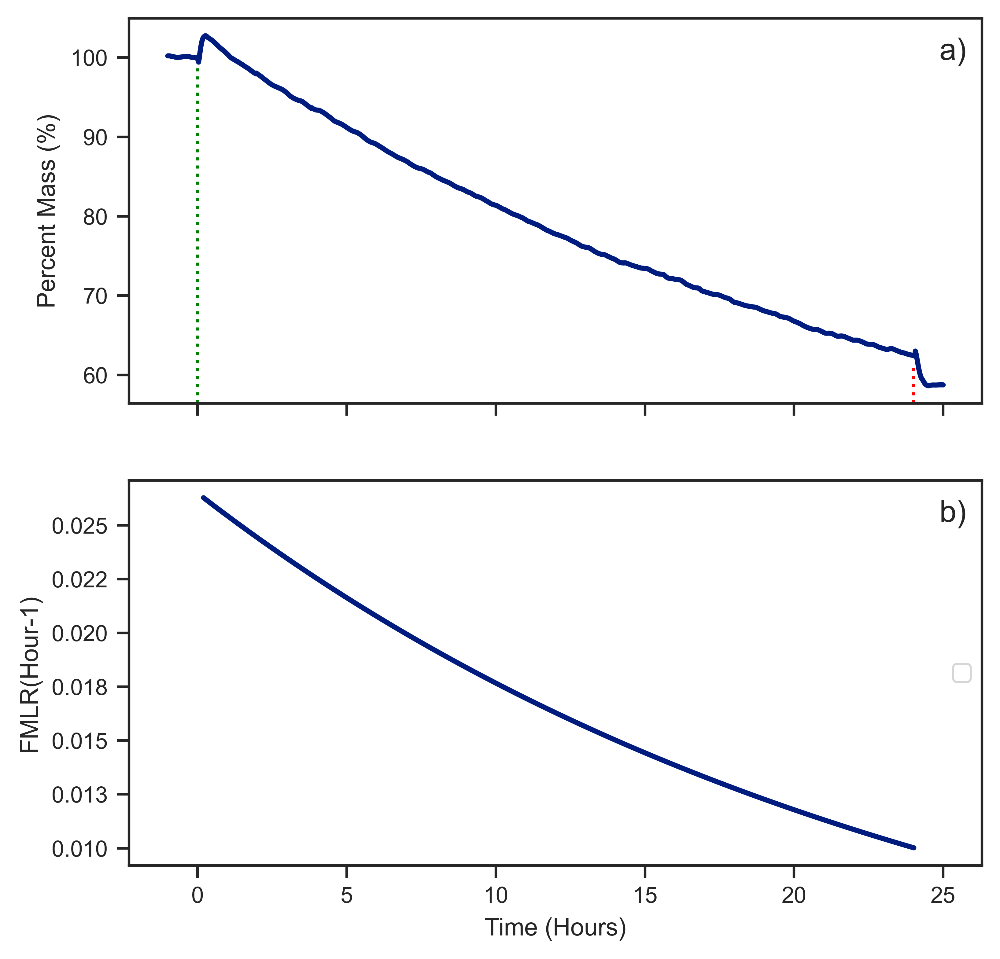

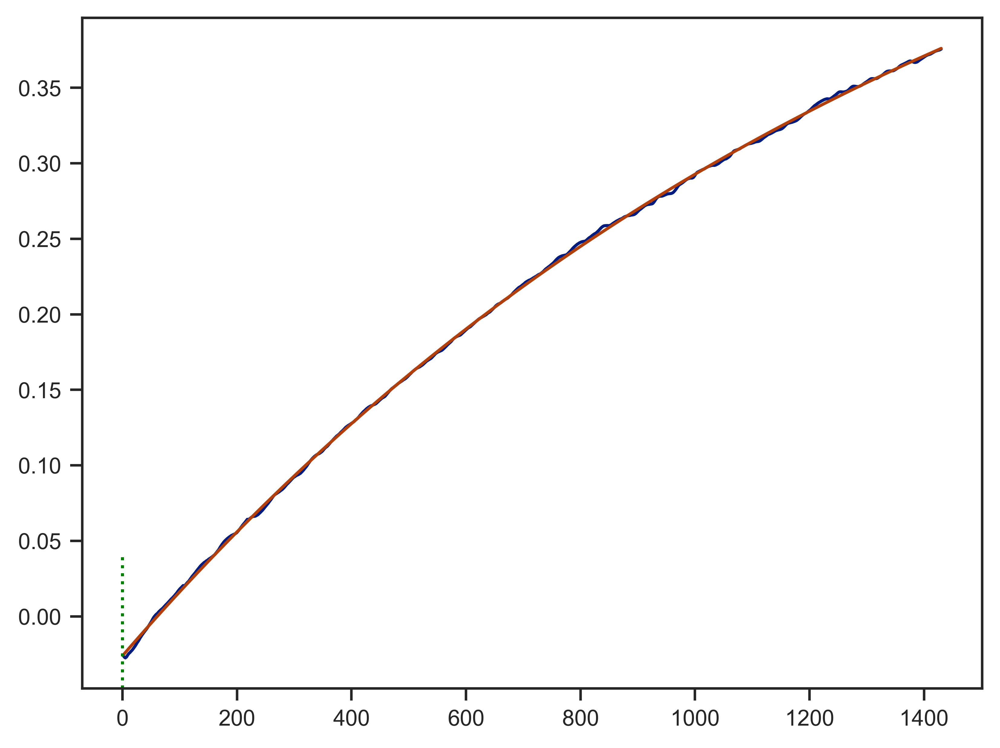

In [11]:
path_1 = 'data/SRHA_Air/3_23_305_254_2_A_B/B.xlsx'
HA_fit_254,HA_norm_254,HA_254_popt= qcm_to_speed_plot(path_1,t0='03/23/2023 13:04:0',f0=5008950.58357,f1=5007790.345,fit_time=('3/23/2023 13:15:00','3/24/2023 13:05:00'),time_frame=['3/23/2023 12:00:00','3/24/2023 14:20:00'])

/var/folders/zh/6yg0122j0tlgz3_2t6x64jkh0000gn/T/ipykernel_6583/1327704176.py:83: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 1897.2445700000972
                          A
-1 days +23:00:00  1.000235
-1 days +23:01:00  1.000219
-1 days +23:02:00  1.000192
-1 days +23:03:00  1.000177
-1 days +23:04:00  1.000190
...                     ...
1 days 00:56:00    0.508851
1 days 00:57:00    0.508889
1 days 00:58:00    0.508908
1 days 00:59:00    0.508948
1 days 01:00:00    0.509007

[1561 rows x 1 columns]
[-6.80556433e-01  1.27162092e+03  6.61993119e-01]
[[5.92903249e-04            nan            nan]
 [           nan 2.04404240e+00 3.63367083e-02]
 [           nan 3.63367083e-02 6.53156922e-04]]
top speed: 0.0320860461118089 end speed: 0.010528600702663416


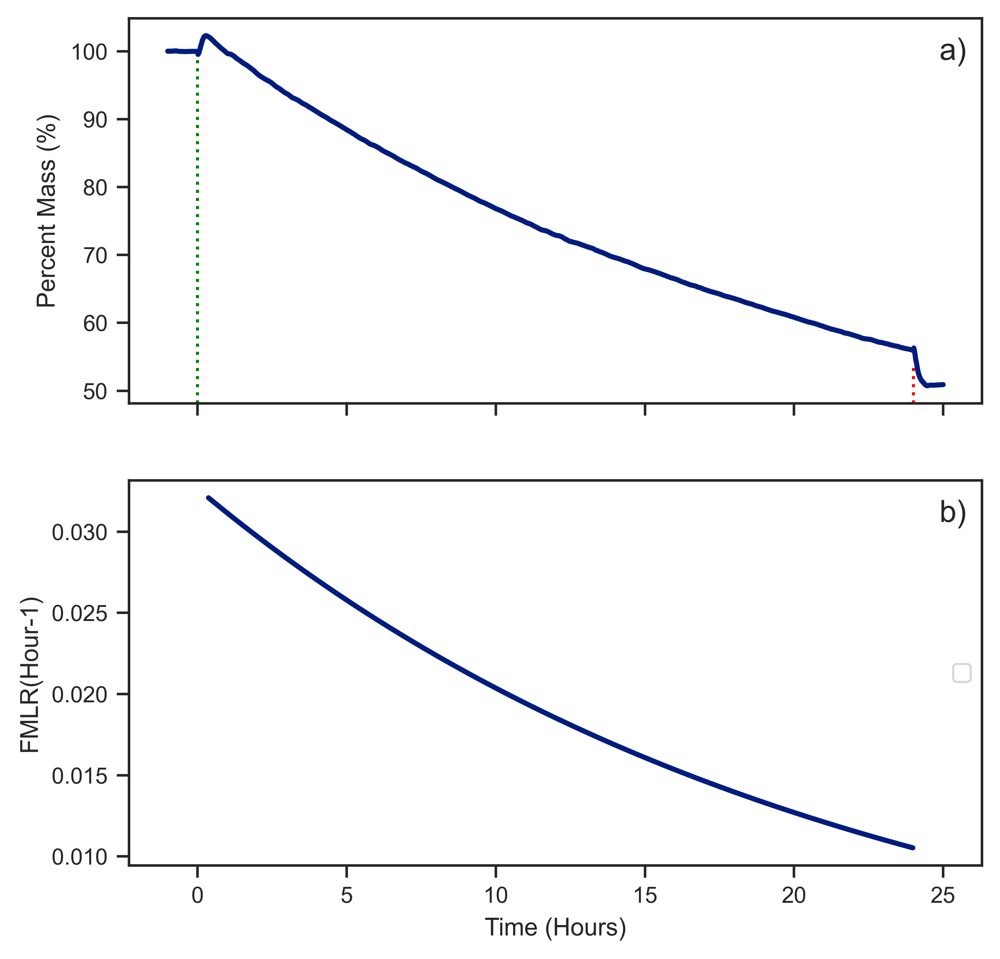

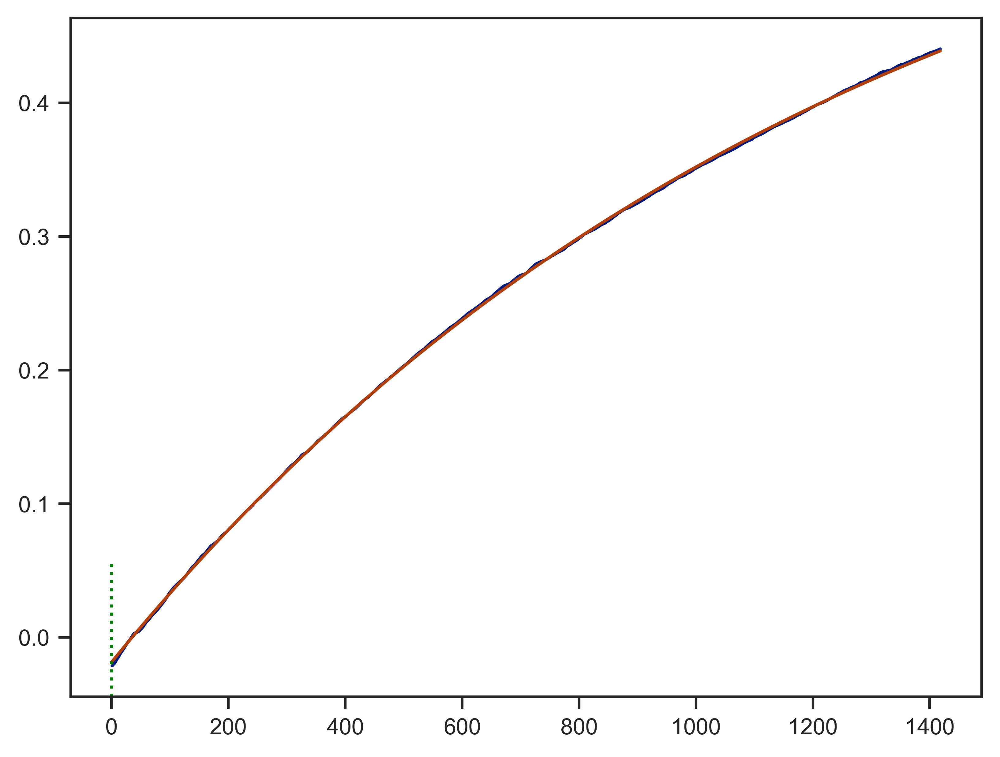

In [11]:
#path_1 = './data/SRFA_AIR/11_30_SRFA_4_C_D_254_305/C.xlsx'
path_1 = './data/SRFA_AIR/3_9_405_254_2_A_B/B.xlsx'
#FA_fit_254,FA_norm_254,FA_254_popt= qcm_to_speed_plot(path_1,t0='11/29/2022 15:50:0',f0=5004447.297,f1=5001384.05,fit_time=('11/29/2022 15:50:00','11/30/2022 15:50:00'),time_frame=['2022-11-29 14:30:00','2022-11-30 17:00:00'],offset=0.0922050699205107)
FA_fit_254,FA_norm_254,FA_254_popt= qcm_to_speed_plot(path_1,t0='3/9/2023 21:01:0',f0=5008950.58357,f1=5007053.339,fit_time=('3/9/2023 21:22:00','3/10/2023 21:00:00'),time_frame=['3/9/2023 10:02:20','3/10/2023 22:10:00'])

/var/folders/zh/6yg0122j0tlgz3_2t6x64jkh0000gn/T/ipykernel_6583/1327704176.py:83: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 1897.2445700000972
                          A
-1 days +23:00:00  1.000235
-1 days +23:01:00  1.000219
-1 days +23:02:00  1.000192
-1 days +23:03:00  1.000177
-1 days +23:04:00  1.000190
...                     ...
1 days 00:56:00    0.508851
1 days 00:57:00    0.508889
1 days 00:58:00    0.508908
1 days 00:59:00    0.508948
1 days 01:00:00    0.509007

[1561 rows x 1 columns]
[-6.80556433e-01  1.27162092e+03  6.61993119e-01]
[[5.92903249e-04            nan            nan]
 [           nan 2.04404240e+00 3.63367083e-02]
 [           nan 3.63367083e-02 6.53156922e-04]]
top speed: 0.0320860461118089 end speed: 0.010528600702663416


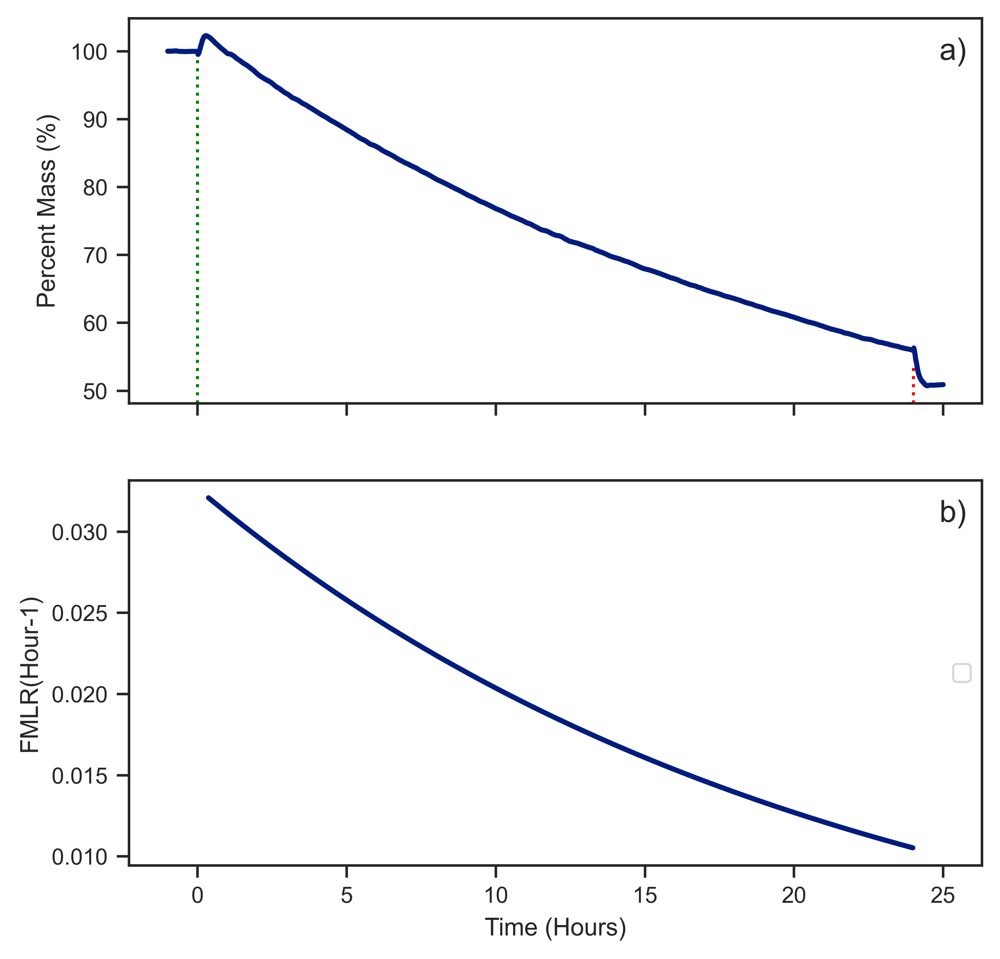

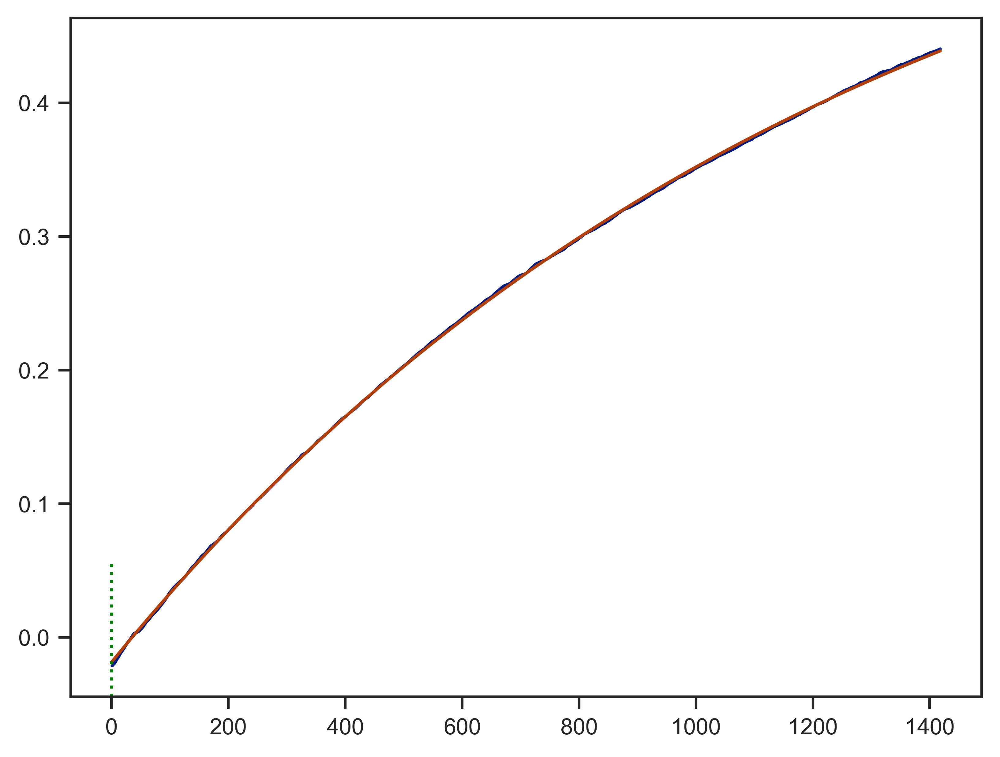

In [13]:
#path_1 = './data/SRFA_AIR/11_30_SRFA_4_C_D_254_305/C.xlsx'
path_1 = './data/SRFA_AIR/3_9_405_254_2_A_B/B.xlsx'
#FA_fit_254,FA_norm_254,FA_254_popt= qcm_to_speed_plot(path_1,t0='11/29/2022 15:50:0',f0=5004447.297,f1=5001384.05,fit_time=('11/29/2022 15:50:00','11/30/2022 15:50:00'),time_frame=['2022-11-29 14:30:00','2022-11-30 17:00:00'],offset=0.0922050699205107)
FA_fit_254,FA_norm_254,FA_254_popt= qcm_to_speed_plot(path_1,t0='3/9/2023 21:01:0',f0=5008950.58357,f1=5007053.339,fit_time=('3/9/2023 21:22:00','3/10/2023 21:00:00'),time_frame=['3/9/2023 10:02:20','3/10/2023 22:10:00'])

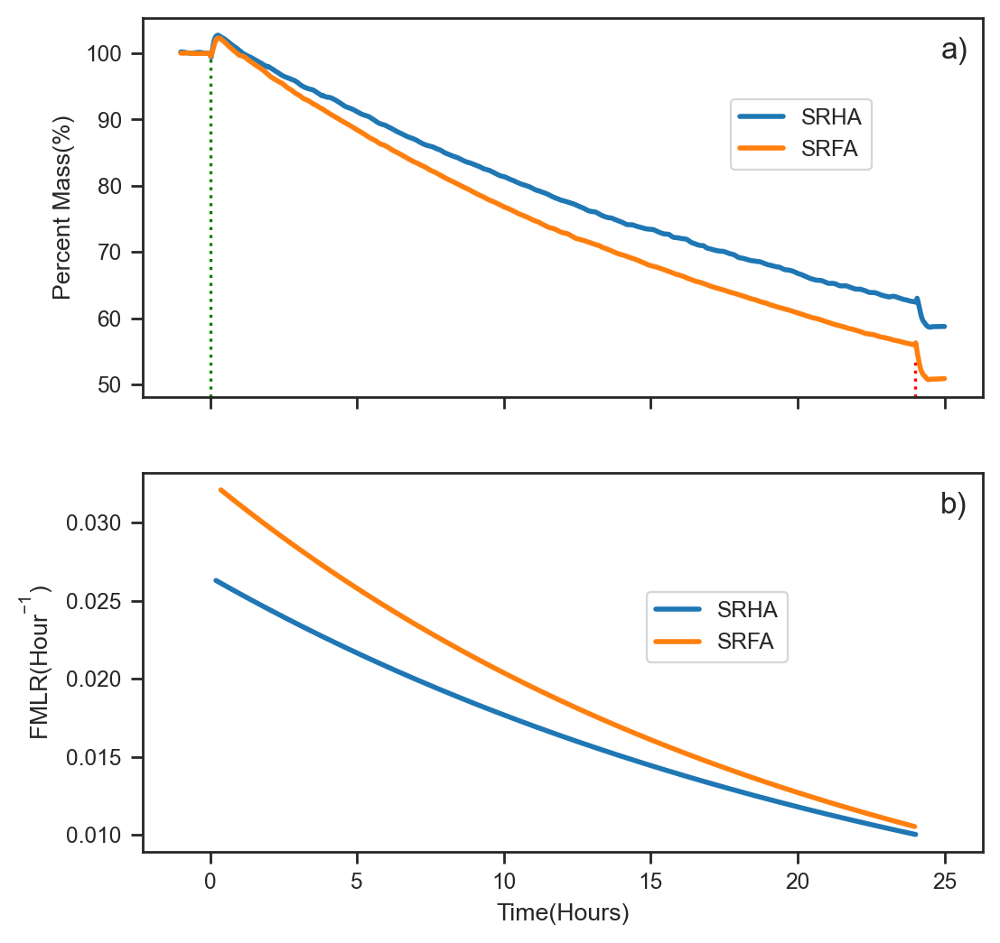

In [30]:

#####for 254
fig, axes = plt.subplots(2, 1,sharex=True,figsize=(6,6))
axes[1].set_xlabel('Time(Hours)')
axes[0].set_ylabel('Percent Mass(%)')
#axes[0].set_ylim([0.75,1.02])
axes[0].text(0.95, 0.95, 'a)',transform=axes[0].transAxes, fontsize=12,verticalalignment='top')
axes[1].text(0.95, 0.95, 'b)',transform=axes[1].transAxes, fontsize=12,verticalalignment='top')
axes[0].axvline(x=0, color='g', linestyle='dotted',ymax=0.9)
axes[0].axvline(x=24, color='r', linestyle='dotted',ymax=0.1)
axes[1].set_ylabel('FMLR($\mathregular{Hour^{-1}}$)')
axes[0].plot(HA_norm_254.index.total_seconds()/(60*60),HA_norm_254['A'].values,linewidth=2,label='SRHA')
axes[0].plot(FA_norm_254.index.total_seconds()/(60*60),FA_norm_254['A'].values,linewidth=2,label='SRFA')
axes[0].legend(loc=(0.7,0.6))
fmt = lambda x, pos: '{:.0f}'.format(x*100, pos)
axes[0].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
fmt = lambda x, pos: '{:.3f}'.format(x, pos)
axes[1].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
f0=5008950.58357
f1=5007790.345
axes[1].plot(HA_fit_254.index.total_seconds()/(60*60),60*(HA_fit_254['speed']),linewidth=2,label='SRHA')
#axes[1].plot(HA_fit_254.index.total_seconds()/(60*60),60*(HA_fit_254['speed']-0.00828318231752289/(f0-f1)),linewidth=2,label='SRHA UV Only',color='tab:blue',linestyle='dotted')
f0=5008950.58357
f1=5007053.339
axes[1].plot(FA_fit_254.index.total_seconds()/(60*60),60*(FA_fit_254['speed']),linewidth=2,label='SRFA')
#axes[1].plot(FA_fit_254.index.total_seconds()/(60*60),60*(FA_fit_254['speed']-0.0295271023849953/(f0-f1)),linewidth=2,label='SRFA UV Only',color='tab:orange',linestyle='dotted')
axes[1].legend(loc=(0.6,0.5))

/var/folders/zh/6yg0122j0tlgz3_2t6x64jkh0000gn/T/ipykernel_6583/1327704176.py:83: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 1431.5640000002459
                          A
-1 days +23:00:00       NaN
-1 days +23:01:00       NaN
-1 days +23:02:00       NaN
-1 days +23:03:00       NaN
-1 days +23:04:00       NaN
...                     ...
1 days 00:56:00    0.773771
1 days 00:57:00    0.773771
1 days 00:58:00    0.773771
1 days 00:59:00    0.773771
1 days 01:00:00    0.773771

[1561 rows x 1 columns]
[-4.86938712e-01  2.46672594e+03  4.95743718e-01]
[[3.41032173e-03            nan            nan]
 [           nan 2.34780162e+01 2.86507441e-01]
 [           nan 2.86507441e-01 3.50633007e-03]]
top speed: 0.011839369948897387 end speed: 0.006630728083619791


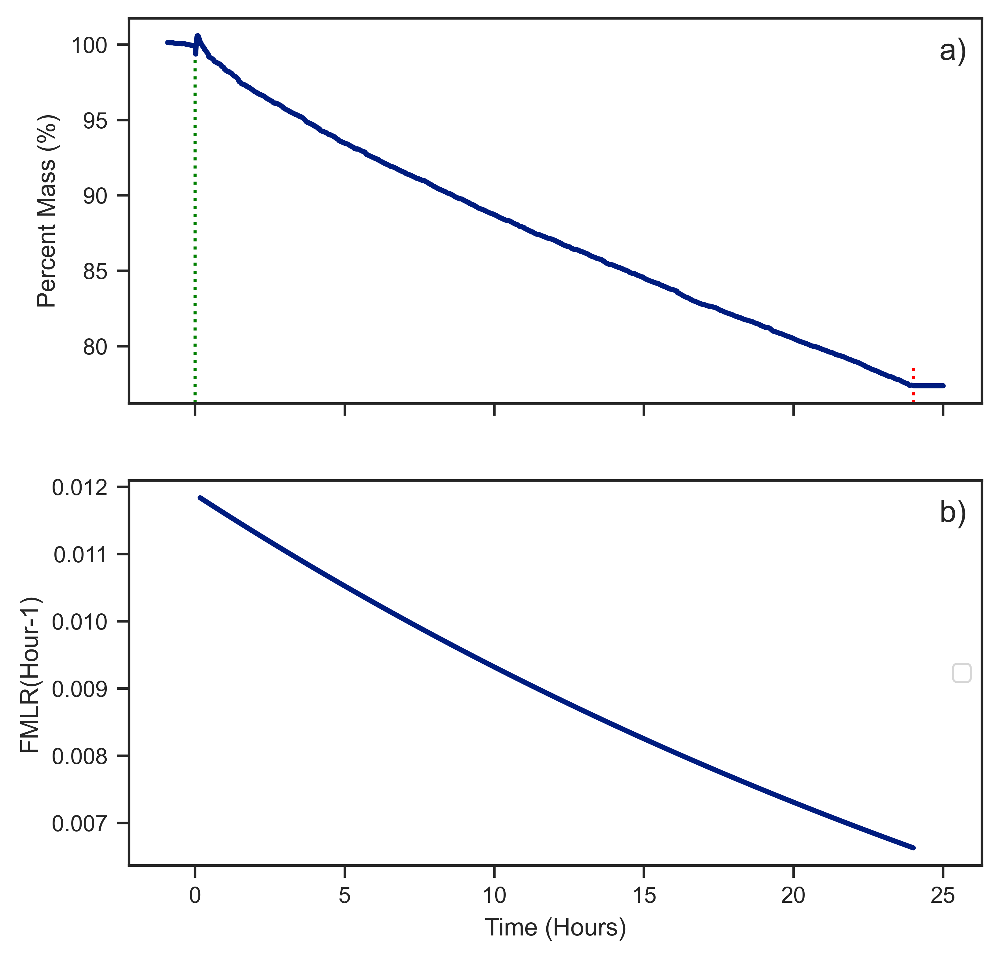

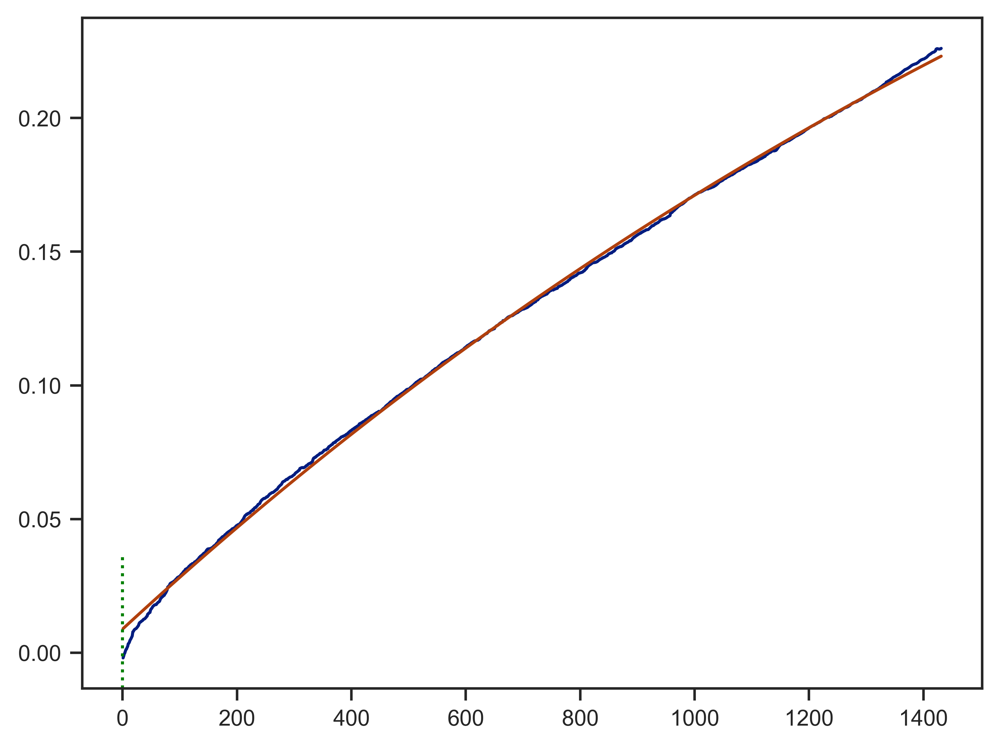

In [14]:
path_1 = 'data/SRHA_Air/2_25_305_254_3_C_D/A.xlsx'
HA_fit_305,HA_norm_305,HA_305_popt= qcm_to_speed_plot(path_1,t0='02/25/2023 20:05:18',f0=4999805.24,f1=4998373.676,fit_time=('2/25/2023 20:15:00','2/26/2023 20:06:00'),time_frame=['2/25/2023 19:09:00','2/26/2023 20:06:00'])

/var/folders/zh/6yg0122j0tlgz3_2t6x64jkh0000gn/T/ipykernel_6583/1327704176.py:83: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 3594.1560000004247
                          A
-1 days +23:00:00  0.999955
-1 days +23:01:00  0.999960
-1 days +23:02:00  0.999980
-1 days +23:03:00  0.999977
-1 days +23:04:00  0.999994
...                     ...
1 days 00:56:00    0.837520
1 days 00:57:00    0.837516
1 days 00:58:00    0.837488
1 days 00:59:00    0.837476
1 days 01:00:00    0.837476

[1561 rows x 1 columns]
[-3.15785347e-01  2.25168118e+03  3.20687617e-01]
[[1.81401070e-03            nan            nan]
 [           nan 1.81434054e+01 1.84149283e-01]
 [           nan 1.84149283e-01 1.87553179e-03]]
top speed: 0.008410918996475327 end speed: 0.004450949195637627


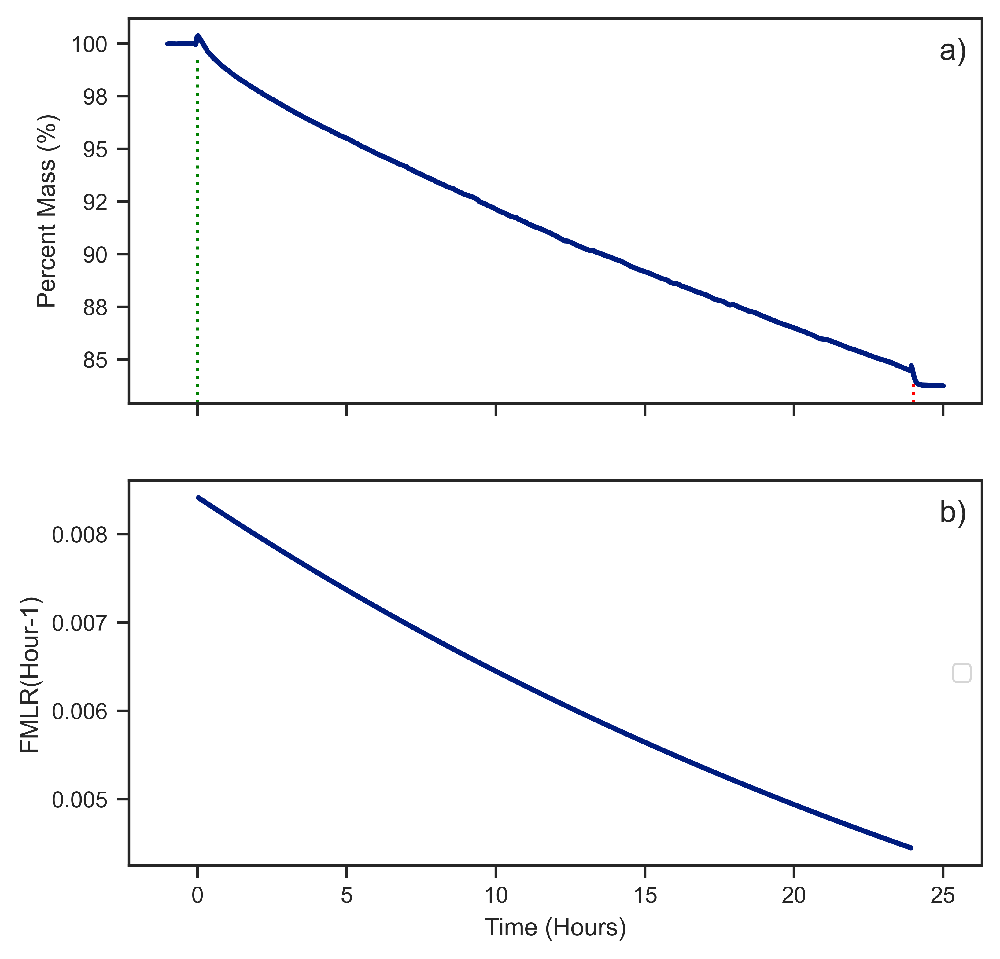

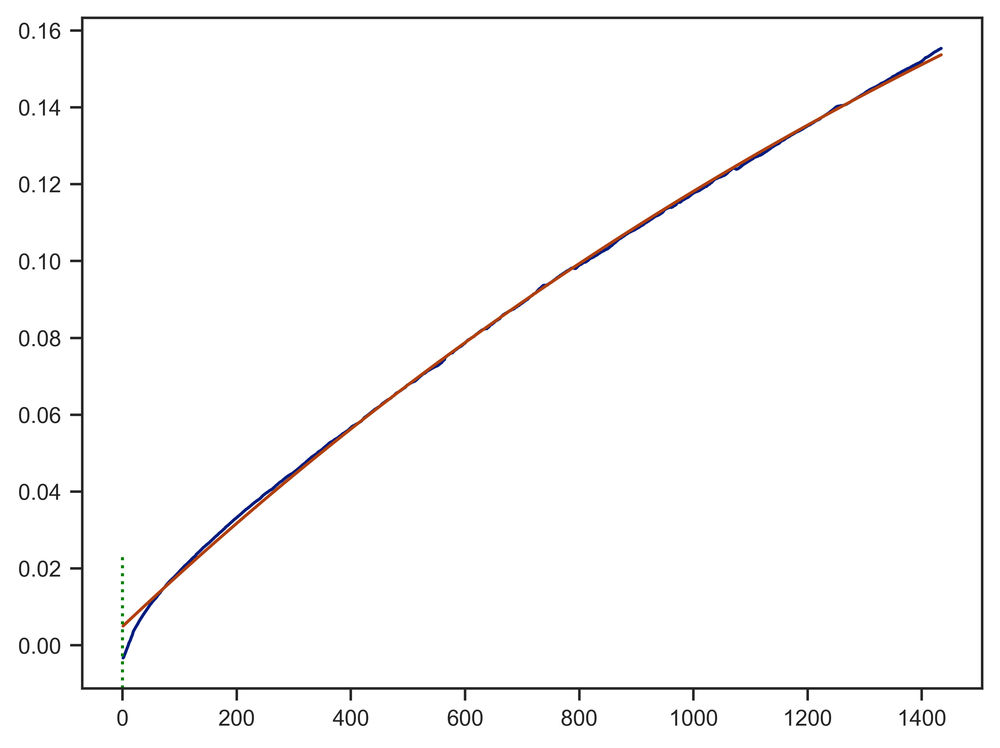

In [15]:
path_1 = './data/SRFA_AIR/11_30_SRFA_4_C_D_254_305/D.xlsx'
FA_fit_305,FA_norm_305,FA_305_popt= qcm_to_speed_plot(path_1,t0='11/29/2022 15:55:00',f0=5010307.568,f1=5006713.412,fit_time=('11/29/2022 15:56:00','11/30/2022 15:50:00'),time_frame=['11/29/2022 14:00:00','11/30/2022 17:50:00'])

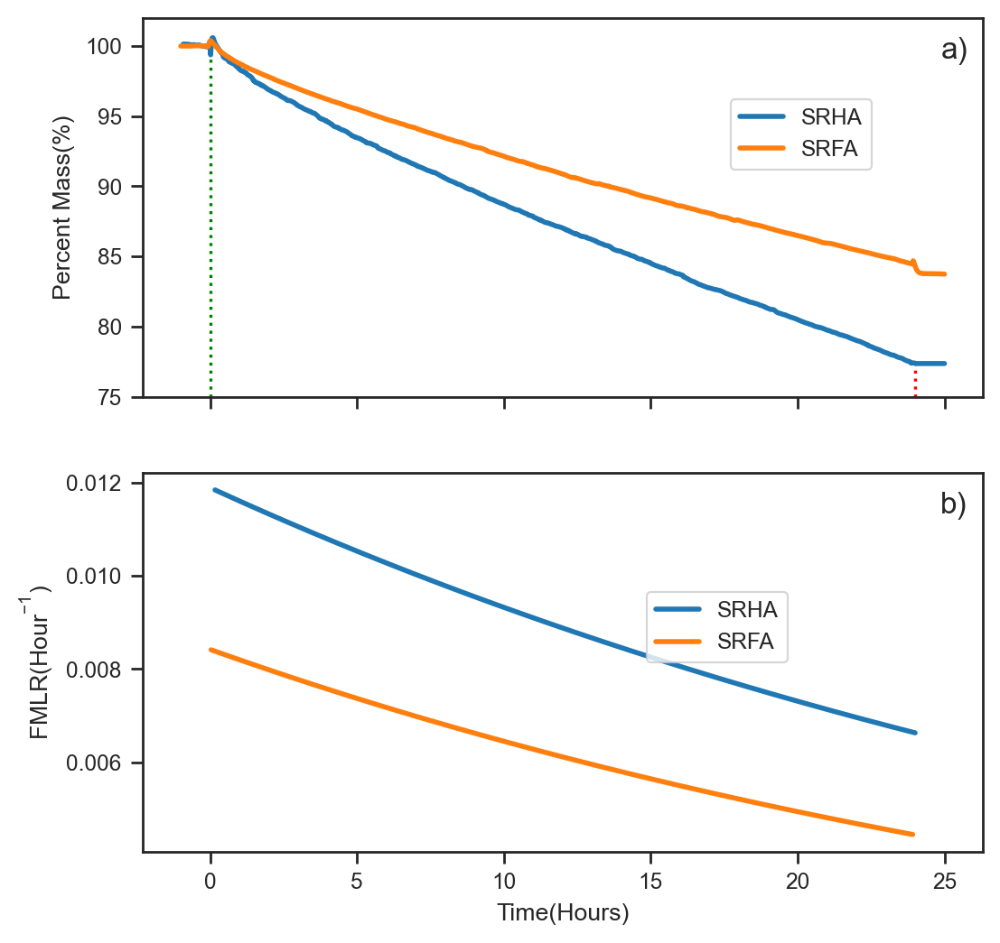

In [33]:

#####for 305
fig, axes = plt.subplots(2, 1,sharex=True,figsize=(6,6))
axes[1].set_xlabel('Time(Hours)')
axes[0].set_ylabel('Percent Mass(%)')
axes[0].set_ylim([0.75,1.02])
axes[0].text(0.95, 0.95, 'a)',transform=axes[0].transAxes, fontsize=12,verticalalignment='top')
axes[1].text(0.95, 0.95, 'b)',transform=axes[1].transAxes, fontsize=12,verticalalignment='top')
axes[0].axvline(x=0, color='g', linestyle='dotted',ymax=0.9)
axes[0].axvline(x=24, color='r', linestyle='dotted',ymax=0.1)
axes[1].set_ylabel('FMLR($\mathregular{Hour^{-1}}$)')
axes[0].plot(HA_norm_305.index.total_seconds()/(60*60),HA_norm_305['A'].values,linewidth=2,label='SRHA')
axes[0].plot(FA_norm_305.index.total_seconds()/(60*60),FA_norm_305['A'].values,linewidth=2,label='SRFA')
axes[0].legend(loc=(0.7,0.6))
fmt = lambda x, pos: '{:.0f}'.format(x*100, pos)
axes[0].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
fmt = lambda x, pos: '{:.3f}'.format(x, pos)
axes[1].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
f0=4999805.24
f1=4998373.676
axes[1].plot(HA_fit_305.index.total_seconds()/(60*60),60*(HA_fit_305['speed']),linewidth=2,label='SRHA')
#axes[1].plot(HA_fit_305.index.total_seconds()/(60*60),60*(HA_fit_305['speed']-0.030487437597015/(f0-f1)),linewidth=2,label='SRHA UV Only',color='tab:blue',linestyle='dotted')
f0=5010307.568
f1=5006713.412
axes[1].plot(FA_fit_305.index.total_seconds()/(60*60),60*(FA_fit_305['speed']),linewidth=2,label='SRFA')
#axes[1].plot(FA_fit_305.index.total_seconds()/(60*60),60*(FA_fit_305['speed']-0.0121483714291055/(f0-f1)),linewidth=2,label='SRFA UV Only',color='tab:orange',linestyle='dotted')
axes[1].legend(loc=(0.6,0.5))


/var/folders/zh/6yg0122j0tlgz3_2t6x64jkh0000gn/T/ipykernel_6583/1327704176.py:83: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 1651.8169999998063
                          A
-1 days +23:00:00  1.000780
-1 days +23:01:00  1.000797
-1 days +23:02:00  1.000764
-1 days +23:03:00  1.000736
-1 days +23:04:00  1.000668
...                     ...
1 days 00:56:00    0.819826
1 days 00:57:00    0.819739
1 days 00:58:00    0.819675
1 days 00:59:00    0.819638
1 days 01:00:00    0.819588

[1561 rows x 1 columns]
[-3.37024669e-01  2.06777990e+03  4.84958027e-01]
[[1.05986753e-03            nan            nan]
 [           nan 9.42929740e+00 1.01760215e-01]
 [           nan 1.01760215e-01 1.10275627e-03]]
top speed: 0.009774591185906421 end speed: 0.0048761424880557295


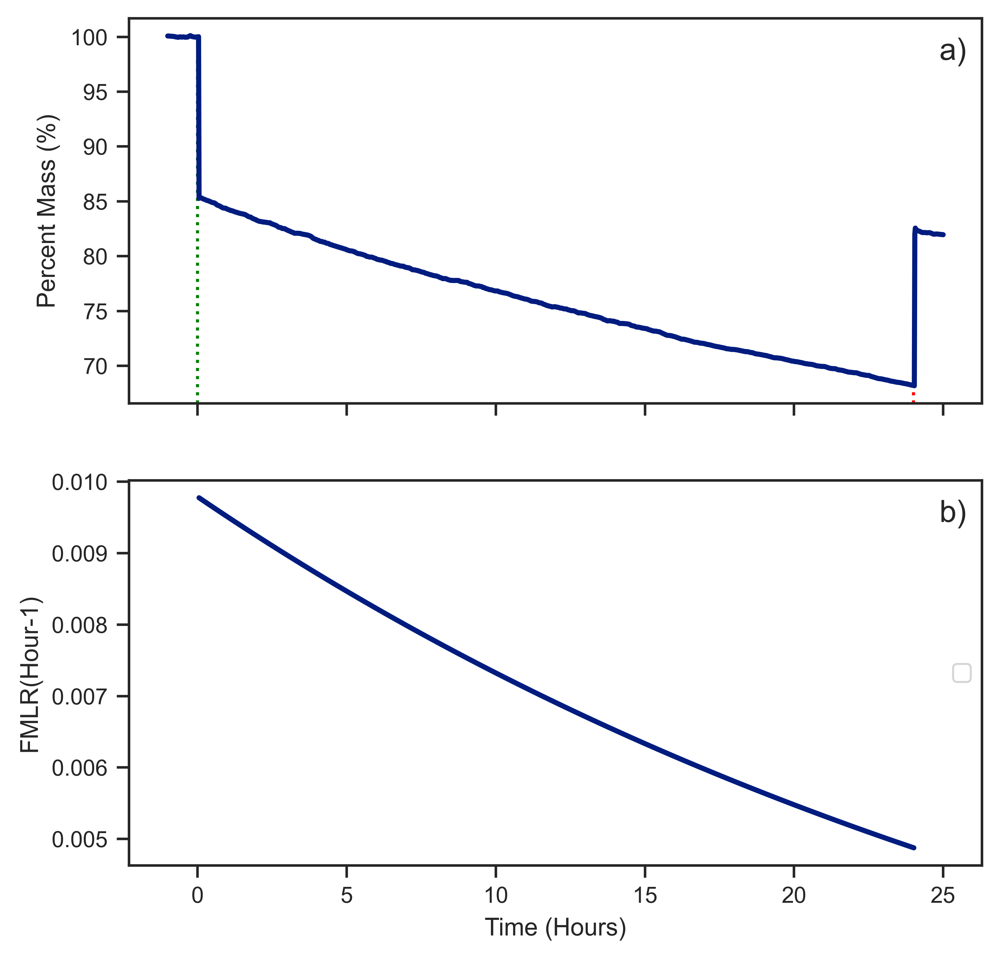

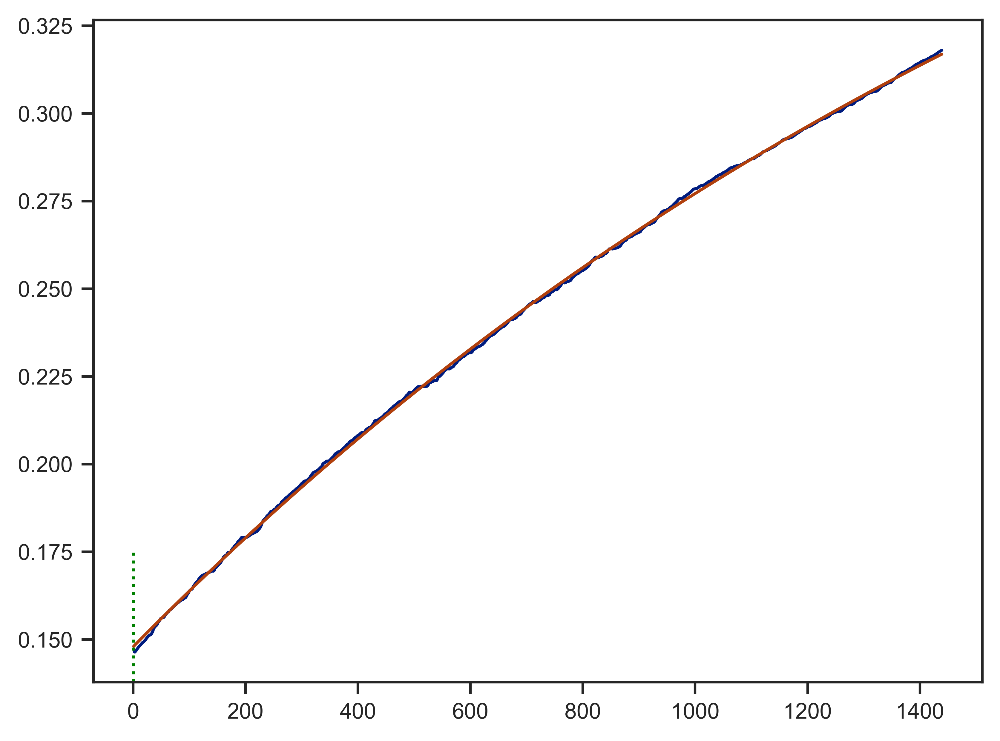

In [16]:
path_1 = './data/SRFA_AIR/3_12_405_254_3_A_G_B_FA_HA/A.xlsx'
FA_fit_405,FA_norm_405,FA_405_popt= qcm_to_speed_plot(path_1,t0='03/12/2023 21:03:00',f0=5010603.743,f1=5008951.926,fit_time=('3/12/2023 21:05:0','3/13/2023 21:04:00'),time_frame=['3/12/2023 20:00:18','3/13/2023 22:30:45'])

/var/folders/zh/6yg0122j0tlgz3_2t6x64jkh0000gn/T/ipykernel_6583/1327704176.py:83: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 2160.026999999769
                          A
-1 days +23:00:00       NaN
-1 days +23:01:00       NaN
-1 days +23:02:00       NaN
-1 days +23:03:00       NaN
-1 days +23:04:00       NaN
...                     ...
1 days 00:56:00    0.910134
1 days 00:57:00    0.910134
1 days 00:58:00    0.910134
1 days 00:59:00    0.910134
1 days 01:00:00    0.910134

[1561 rows x 1 columns]
[-1.20489512e-01  1.56673926e+03  2.23977041e-01]
[[9.53234004e-04            nan            nan]
 [           nan 2.03798771e+01 1.43622578e-01]
 [           nan 1.43622578e-01 1.01959388e-03]]
top speed: 0.004611333911402316 end speed: 0.0018464048631633722


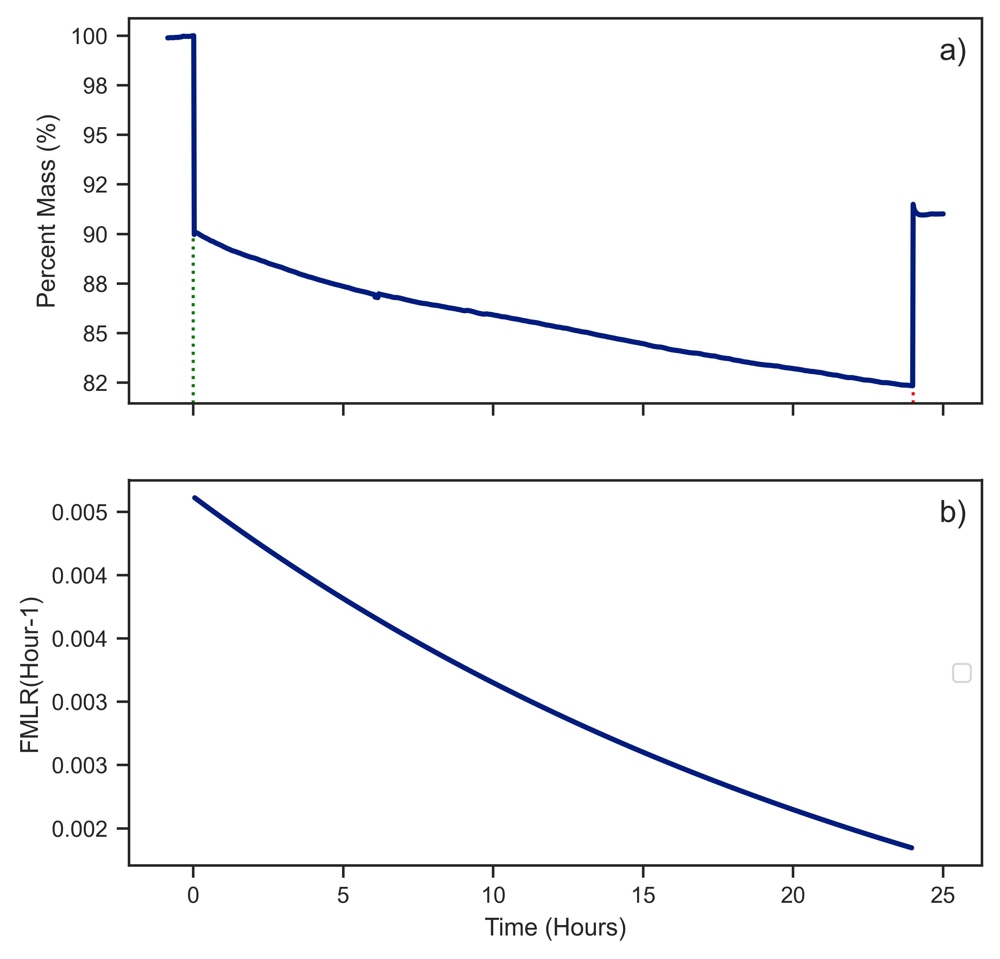

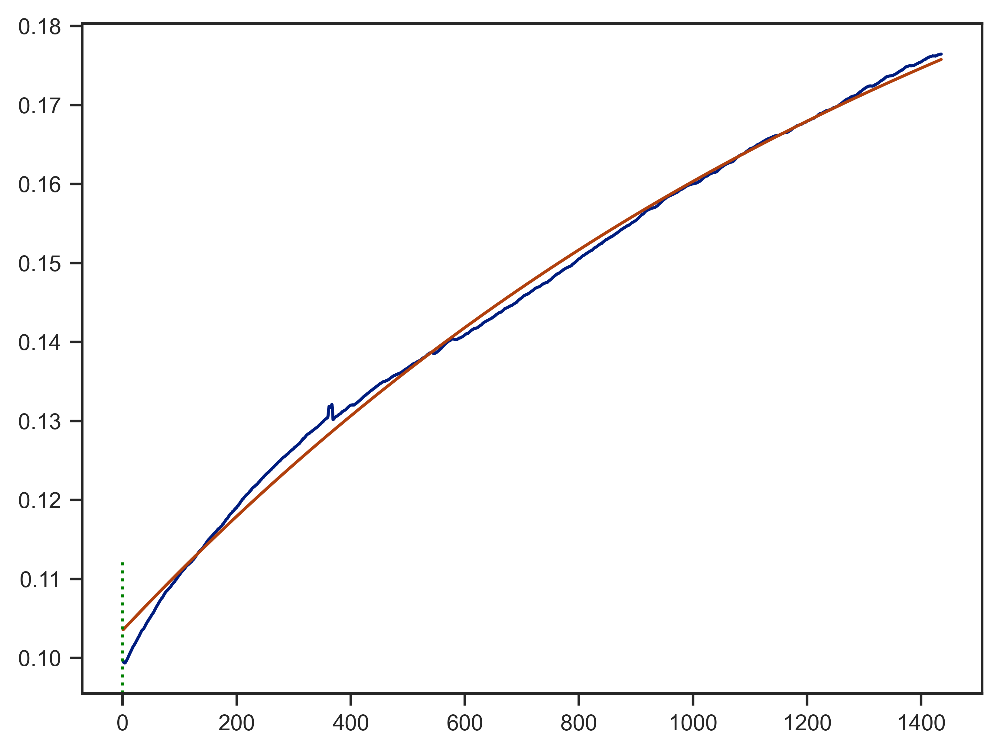

In [18]:
path_1 = './data/SRHA_Air/3_3_405_254_3_A_B/A.xlsx'
HA_fit_405,HA_norm_405,HA_405_popt= qcm_to_speed_plot(path_1,t0='03/03/2023 21:12:00',f0=5010822.949,f1=5008662.922,fit_time=('3/3/2023 21:14:0','3/4/2023 21:09:00'),time_frame=['3/3/2023 20:20:00','3/4/2023 22:06:20'])

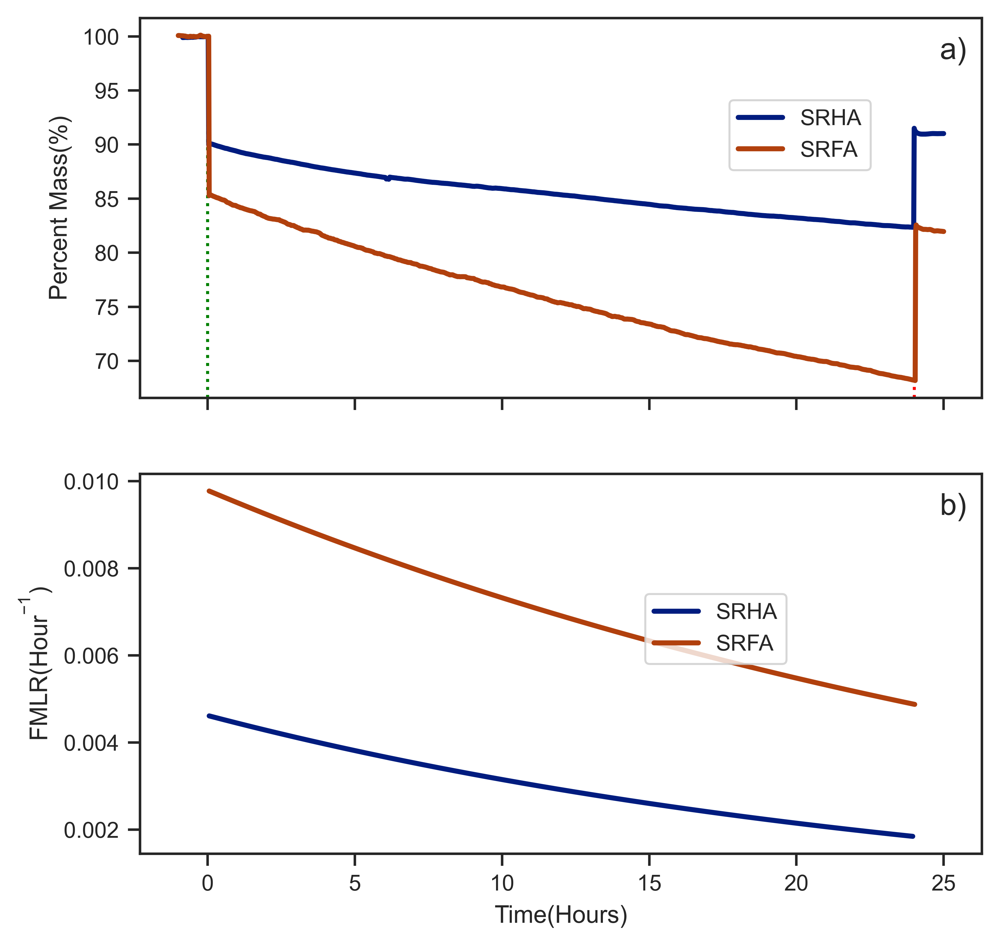

In [19]:

#####for 405
fig, axes = plt.subplots(2, 1,sharex=True,figsize=(6,6))
axes[1].set_xlabel('Time(Hours)')
axes[0].set_ylabel('Percent Mass(%)')
axes[0].text(0.95, 0.95, 'a)',transform=axes[0].transAxes, fontsize=12,verticalalignment='top')
axes[1].text(0.95, 0.95, 'b)',transform=axes[1].transAxes, fontsize=12,verticalalignment='top')
axes[0].axvline(x=0, color='g', linestyle='dotted',ymax=0.9)
axes[0].axvline(x=24, color='r', linestyle='dotted',ymax=0.1)
axes[1].set_ylabel('FMLR($\mathregular{Hour^{-1}}$)')
axes[0].plot(HA_norm_405.index.total_seconds()/(60*60),HA_norm_405['A'].values,linewidth=2,label='SRHA')
axes[0].plot(FA_norm_405.index.total_seconds()/(60*60),FA_norm_405['A'].values,linewidth=2,label='SRFA')
axes[0].legend(loc=(0.7,0.6))
fmt = lambda x, pos: '{:.0f}'.format(x*100, pos)
axes[0].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
fmt = lambda x, pos: '{:.3f}'.format(x, pos)
axes[1].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
f0=4999805.24
f1=4998373.676
axes[1].plot(HA_fit_405.index.total_seconds()/(60*60),60*(HA_fit_405['speed']),linewidth=2,label='SRHA')
#axes[1].plot(HA_fit_405.index.total_seconds()/(60*60),60*(HA_fit_405['speed']-0.030487437597015/(f0-f1)),linewidth=2,label='SRHA UV Only',color='tab:blue',linestyle='dotted')
f0=5010307.568
f1=5006713.412
axes[1].plot(FA_fit_405.index.total_seconds()/(60*60),60*(FA_fit_405['speed']),linewidth=2,label='SRFA')
#axes[1].plot(FA_fit_405.index.total_seconds()/(60*60),60*(FA_fit_405['speed']+0.0121483714291055/(f0-f1)),linewidth=2,label='SRFA UV Only',color='tab:orange',linestyle='dotted')
axes[1].legend(loc=(0.6,0.5))

In [39]:
HA_norm_254['A'].values

array([1.00202318, 1.00205928, 1.0020576 , ..., 0.58768405, 0.58767084,
       0.58763249])

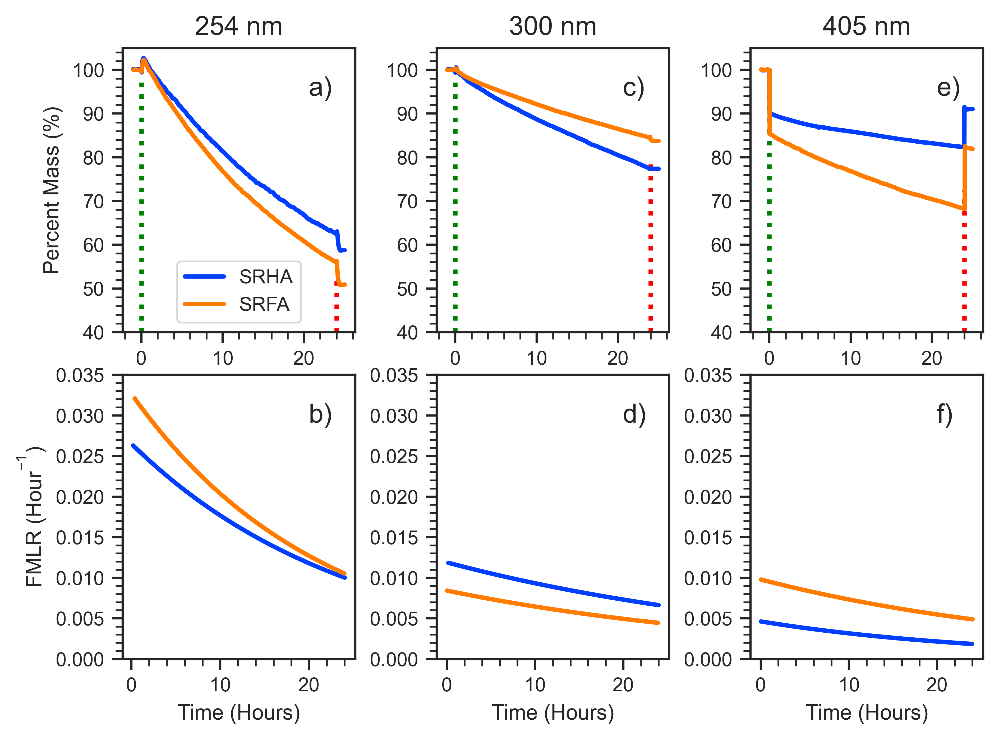

In [22]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import matplotlib as mpl

fig = plt.figure(figsize=(7, 5))

# Create a GridSpec with 2 rows and 3 columns
gs = gridspec.GridSpec(2, 3)

# Create the top row of subplots with shared y-axis
top_row_subplots = plt.subplot(gs[0, 0])
top_row_subplots.set_ylim(0.4, 1.03)

# Create the bottom row of subplots with shared y-axis
bottom_row_subplots = plt.subplot(gs[1, 0])
bottom_row_subplots.set_ylim(0.0, 0.1)

fig.subplots_adjust(wspace=0.35, hspace=0.15)
sns.set_palette("dark")

axes = [[None, None, None], [None, None, None]]

axes[0][0] = top_row_subplots
axes[1][0] = bottom_row_subplots
sub_loc = (0.8,0.9,12)
# Create the rest of the subplots
for i in range(2):
    for j in range(1, 3):
        if i == 0:
            ax = plt.subplot(gs[i, j], sharey=top_row_subplots)
            ax.set_ylim(0.4, 1.05)
        else:
            ax = plt.subplot(gs[i, j], sharey=bottom_row_subplots)
            ax.set_ylim(0.0, 0.035)
        axes[i][j] = ax
        if i != 0:
            ax.set_xlabel('')
        if j != 0:
            ax.set_ylabel('')

####254nm
axes[0][0].set_title('254 nm',fontsize=12)
axes[0][1].set_title('300 nm',fontsize=12)
axes[0][2].set_title('405 nm',fontsize=12)

axes[1][0].set_xlabel('Time (Hours)')
axes[0][0].set_ylabel('Percent Mass (%)')
#axes[0][0].set_ylim([0.4,1.03])
#axes[0][1].set_ylim([0.0,0.1])

axes[0][0].text(sub_loc[0], sub_loc[1], 'a)',transform=axes[0][0].transAxes, fontsize=sub_loc[2],verticalalignment='top')
axes[1][0].text(sub_loc[0], sub_loc[1],'b)',transform=axes[1][0].transAxes, fontsize=sub_loc[2],verticalalignment='top')
axes[0][0].axvline(x=0, color='g', linestyle='dotted',ymax=0.9,lw=2)
axes[0][0].axvline(x=24, color='r', linestyle='dotted',ymax=0.2,lw=2)
axes[1][0].set_ylabel('FMLR ($\mathregular{Hour^{-1}}$)')
axes[0][0].plot(HA_norm_254.index.total_seconds()/(60*60),HA_norm_254['A'].values,linewidth=2,label='SRHA',color=sns.color_palette("bright")[0])
axes[0][0].plot(FA_norm_254.index.total_seconds()/(60*60),FA_norm_254['A'].values,linewidth=2,label='SRFA',color=sns.color_palette("bright")[1])
axes[0][0].legend(frameon=True,loc='lower center')
#axes[0][0].legend()
fmt_1 = lambda x, pos: '{:.0f}'.format(x*100, pos)
axes[0][0].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt_1))
fmt_2 = lambda x, pos: '{:.3f}'.format(x, pos)
axes[1][0].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt_2))
f0=5008950.58357
f1=5007790.345
axes[1][0].plot(HA_fit_254.index.total_seconds()/(60*60),60*(HA_fit_254['speed']),linewidth=2,label='SRHA',color=sns.color_palette("bright")[0])
#axes[1].plot(HA_fit_254.index.total_seconds()/(60*60),60*(HA_fit_254['speed']-0.00828318231752289/(f0-f1)),linewidth=2,label='SRHA UV Only',color='tab:blue',linestyle='dotted')
f0=5008950.58357
f1=5007053.339
axes[1][0].plot(FA_fit_254.index.total_seconds()/(60*60),60*(FA_fit_254['speed']),linewidth=2,label='SRFA',color=sns.color_palette("bright")[1])
####300nm
axes[1][1].set_xlabel('Time (Hours)')
#axes[0][1].set_ylabel('Percent Mass(%)')
#axes[0][1].set_ylim([0.75,1.02])
axes[0][1].text(sub_loc[0], sub_loc[1], 'c)',transform=axes[0][1].transAxes, fontsize=sub_loc[2],verticalalignment='top')
axes[1][1].text(sub_loc[0], sub_loc[1], 'd)',transform=axes[1][1].transAxes, fontsize=sub_loc[2],verticalalignment='top')
axes[0][1].axvline(x=0, color='g', linestyle='dotted',ymax=0.9,lw=2)
axes[0][1].axvline(x=24, color='r', linestyle='dotted',ymax=0.6,lw=2)
#axes[1][1].set_ylabel('FMLR($\mathregular{Hour^{-1}}$)')
axes[0][1].plot(HA_norm_305.index.total_seconds()/(60*60),HA_norm_305['A'].values,linewidth=2,label='SRHA',color=sns.color_palette("bright")[0])
axes[0][1].plot(FA_norm_305.index.total_seconds()/(60*60),FA_norm_305['A'].values,linewidth=2,label='SRFA',color=sns.color_palette("bright")[1])
#axes[0][1].legend(loc=(0.7,0.6))
#fmt = lambda x, pos: '{:.0f}'.format(x*100, pos)
#axes[0][1].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
#fmt = lambda x, pos: '{:.3f}'.format(x, pos)
#axes[1][1].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
f0=4999805.24
f1=4998373.676
axes[1][1].plot(HA_fit_305.index.total_seconds()/(60*60),60*(HA_fit_305['speed']),linewidth=2,label='SRHA',color=sns.color_palette("bright")[0])
#axes[1].plot(HA_fit_305.index.total_seconds()/(60*60),60*(HA_fit_305['speed']-0.030487437597015/(f0-f1)),linewidth=2,label='SRHA UV Only',color='tab:blue',linestyle='dotted')
f0=5010307.568
f1=5006713.412
axes[1][1].plot(FA_fit_305.index.total_seconds()/(60*60),60*(FA_fit_305['speed']),linewidth=2,label='SRFA',color=sns.color_palette("bright")[1])
#axes[1].plot(FA_fit_305.index.total_seconds()/(60*60),60*(FA_fit_305['speed']-0.0121483714291055/(f0-f1)),linewidth=2,label='SRFA UV Only',color='tab:orange',linestyle='dotted')
#axes[1][1].legend(loc=(0.6,0.5))
####
#####for 405
axes[1][2].set_xlabel('Time (Hours)')
#axes[0][2].set_ylabel('Percent Mass(%)')
axes[0][2].text(sub_loc[0], sub_loc[1], 'e)',transform=axes[0][2].transAxes, fontsize=sub_loc[2],verticalalignment='top')
axes[1][2].text(sub_loc[0], sub_loc[1], 'f)',transform=axes[1][2].transAxes, fontsize=sub_loc[2],verticalalignment='top')
axes[0][2].axvline(x=0, color='g', linestyle='dotted',ymax=0.9,lw=2)
axes[0][2].axvline(x=24, color='r', linestyle='dotted',ymax=0.5,lw=2)
#axes[1][2].set_ylabel('FMLR($\mathregular{Hour^{-1}}$)')
axes[0][2].plot(HA_norm_405.index.total_seconds()/(60*60),HA_norm_405['A'].values,linewidth=2,label='SRHA',color=sns.color_palette("bright")[0])
axes[0][2].plot(FA_norm_405.index.total_seconds()/(60*60),FA_norm_405['A'].values,linewidth=2,label='SRFA',color=sns.color_palette("bright")[1])
#axes[0][2].legend(loc=(0.7,0.6))
#fmt = lambda x, pos: '{:.0f}'.format(x*100, pos)
#axes[0][2].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
#fmt = lambda x, pos: '{:.3f}'.format(x, pos)
#axes[1][2].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
f0=4999805.24
f1=4998373.676
axes[1][2].plot(HA_fit_405.index.total_seconds()/(60*60),60*(HA_fit_405['speed']),linewidth=2,label='SRHA',color=sns.color_palette("bright")[0])
#axes[1].plot(HA_fit_405.index.total_seconds()/(60*60),60*(HA_fit_405['speed']-0.030487437597015/(f0-f1)),linewidth=2,label='SRHA UV Only',color='tab:blue',linestyle='dotted')
f0=5010307.568
f1=5006713.412
axes[1][2].plot(FA_fit_405.index.total_seconds()/(60*60),60*(FA_fit_405['speed']),linewidth=2,label='SRFA',color=sns.color_palette("bright")[1])

#axes[1].plot(FA_fit_405.index.total_seconds()/(60*60),60*(FA_fit_405['speed']+0.0121483714291055/(f0-f1)),linewidth=2,label='SRFA UV Only',color='tab:orange',linestyle='dotted')
#axes[1].legend(loc=(0.6,0.5))
for axs in axes:
    for ax in axs:
        ax.xaxis.set_minor_locator(AutoMinorLocator())
        ax.yaxis.set_minor_locator(AutoMinorLocator())
        #ax.xaxis.set_minor_locator(AutoMinorLocator())
        ax.tick_params(which='both')

Text(0.5, 0, 'Wavelength(nm)')

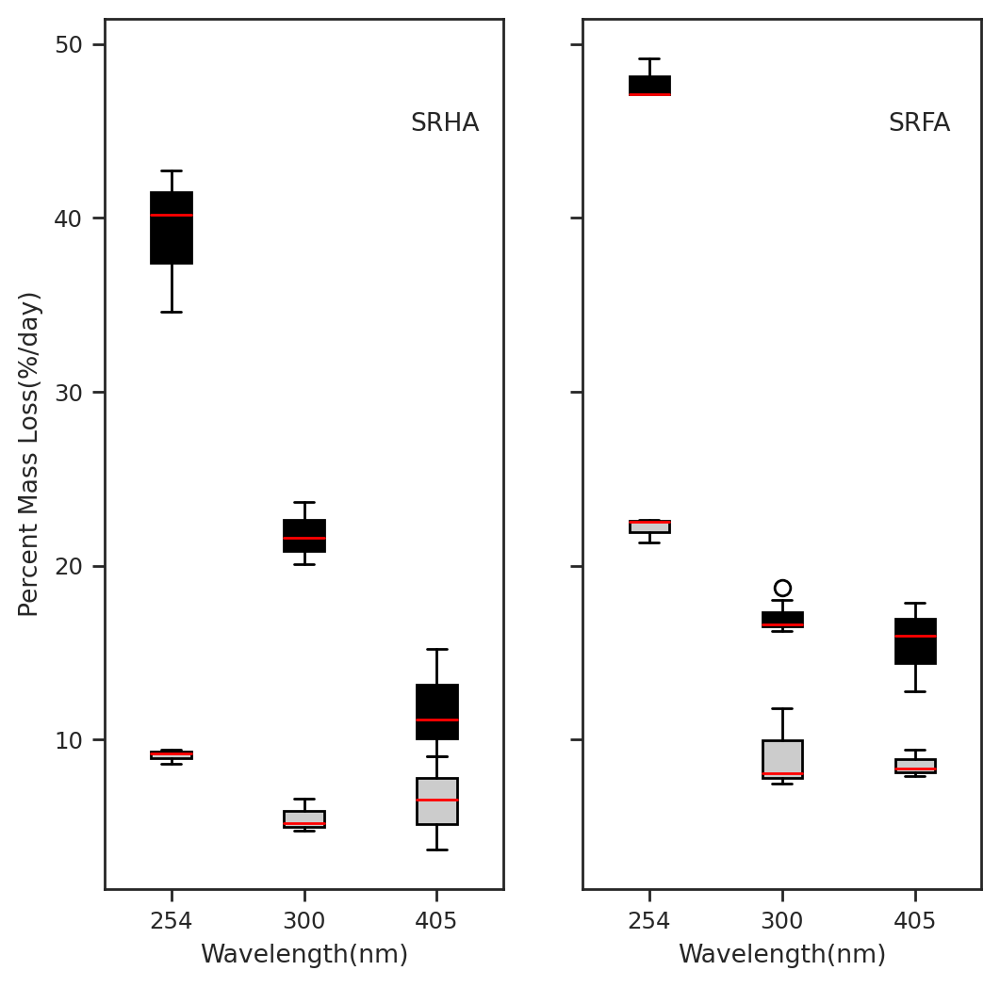

In [125]:
####integrat 24h 
SRHA_405_N2 = np.asarray((3.68,6.54,9.04))
SRHA_300_N2 = np.asarray((4.77,6.60,5.21))
SRHA_254_N2 = np.asarray((8.86,8.61,9.37))


SRHA_405_Air = np.asarray((9.01,15.21,11.12))
SRHA_300_Air = np.asarray((20.10,23.68,21.62))
SRHA_254_Air= np.asarray((42.74,40.17,34.61))

SRFA_405_N2 = np.asarray((9.42,7.90,8.31))
SRFA_300_N2 = np.asarray((11.81,7.48,8.06))
SRFA_254_N2 = np.asarray((21.35,22.63,22.54))


SRFA_405_Air = np.asarray((15.99,17.85,12.75))
SRFA_300_Air = np.asarray((18.75,16.26,16.50,16.51,18.01,16.59,16.64))
SRFA_254_Air = np.asarray((49.18,47.12,47.10))
fig, axes = plt.subplots(1, 2,sharey=True,figsize=(6,6))
box_HA_N2=axes[0].boxplot([SRHA_254_N2,SRHA_300_N2,SRHA_405_N2],patch_artist=True,medianprops=dict(color='red'))
box_HA_Air= axes[0].boxplot([SRHA_254_Air,SRHA_300_Air,SRHA_405_Air],patch_artist=True,medianprops=dict(color='red'))
for box in box_HA_Air['boxes']:
    box.set(facecolor='0')
for box in box_HA_N2['boxes']:
    box.set(facecolor='0.8')

#plt.legend()
axes[0].set_xticks([1,2,3],['254','300','405'])

box_FA_N2=axes[1].boxplot([SRFA_254_N2,SRFA_300_N2,SRFA_405_N2],patch_artist=True,medianprops=dict(color='red'))
box_FA_Air= axes[1].boxplot([SRFA_254_Air,SRFA_300_Air,SRFA_405_Air],patch_artist=True,medianprops=dict(color='red'))
for box in box_FA_Air['boxes']:
    box.set(facecolor='0')
for box in box_FA_N2['boxes']:
    box.set(facecolor='0.8')
axes[1].set_xticks([1,2,3],['254','300','405'])
axes[0].text(2.8,45,'SRHA')
axes[1].text(2.8,45,'SRFA')
axes[0].set_ylabel('Percent Mass Loss(%/day)')
axes[0].set_xlabel('Wavelength(nm)')
axes[1].set_xlabel('Wavelength(nm)')


#plt.boxplot([SRFA_254_N2,SRFA_300_N2,SRFA_405_N2],color='tab:orange')
#plt.boxplot([SRFA_254_Air,SRFA_300_Air,SRFA_405_Air],color='tab:orange')


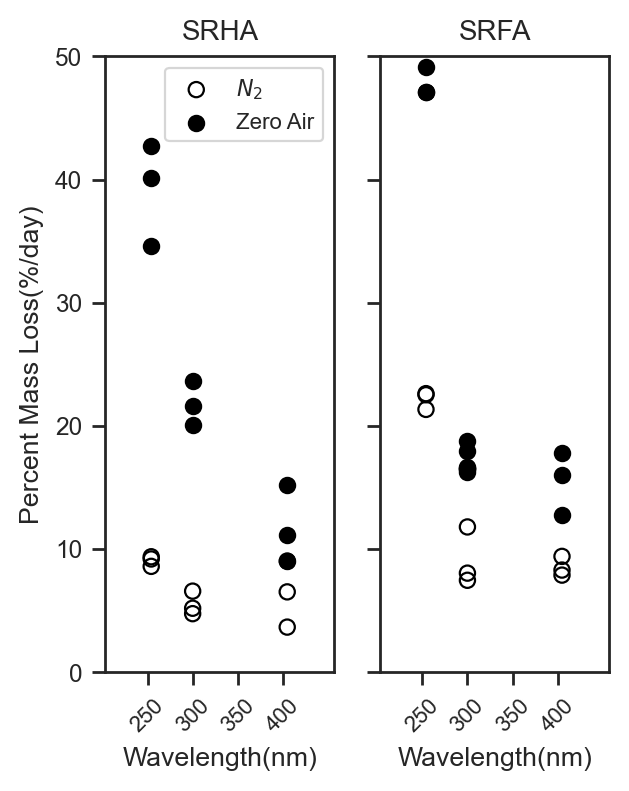

In [3]:
SRHA_405_N2 = [3.68,6.54,9.04]
SRHA_300_N2 = [4.77,6.60,5.21]
SRHA_254_N2 = [9.39,8.61,9.21]


SRHA_405_Air = [9.01,15.21,11.12]
SRHA_300_Air = [20.10,23.68,21.62]
SRHA_254_Air= [42.74,40.17,34.61]

SRFA_405_N2 = [9.42,7.90,8.31]
SRFA_300_N2 = [11.81,7.48,8.06]
SRFA_254_N2 = [21.35,22.63,22.54]


SRFA_405_Air = [15.99,17.85,12.75]
SRFA_300_Air = [18.75,16.26,16.50,16.51,18.01,16.59,16.64]
SRFA_254_Air = [49.18,47.12,47.10]
fig, axes = plt.subplots(1, 2,sharey=True,figsize=(3.25,4))
axes[0].set_title('SRHA',fontsize=10)
axes[1].set_title('SRFA',fontsize=10)

SRHA_N2_wavelength = [5]*len(SRHA_254_N2)+[5*1.181]*len(SRHA_300_N2)+[5*1.594]*len(SRHA_405_N2)
SRHA_Air_wavelength = [5]*len(SRHA_254_Air)+[5*1.181]*len(SRHA_300_Air)+[5*1.594]*len(SRHA_405_Air)
axes[0].scatter(SRHA_N2_wavelength,SRHA_254_N2+SRHA_300_N2+SRHA_405_N2,label='$N_{2}$',marker='o', facecolors='none', edgecolors='Black',s=30)
axes[0].scatter(SRHA_Air_wavelength,SRHA_254_Air+SRHA_300_Air+SRHA_405_Air,label='Zero Air',marker='o', c='Black',s=30)
axes[0].legend(prop = { "size": 8 })
#for box in box_HA_Air['boxes']:
#    box.set(facecolor='0')
#for box in box_HA_N2['boxes']:
#    box.set(facecolor='0.8')

#plt.legend()
#axes[0].set_xticks([5*250/254,5*250/254*6/5,7/5*5*250/254],['250','300','400'])
SRFA_N2_wavelength = [5]*len(SRFA_254_N2)+[5*1.181]*len(SRFA_300_N2)+[5*1.594]*len(SRFA_405_N2)
SRFA_Air_wavelength = [5]*len(SRFA_254_Air)+[5*1.181]*len(SRFA_300_Air)+[5*1.594]*len(SRFA_405_Air)
axes[1].scatter(SRFA_Air_wavelength,SRFA_254_Air+SRFA_300_Air+SRFA_405_Air,label='Zero Air',marker='o', c='Black',s=30)
        
axes[1].scatter(SRFA_N2_wavelength,SRFA_254_N2+SRFA_300_N2+SRFA_405_N2,label='$N_{2}$',marker='o', facecolors='none', edgecolors='Black',s=30)
#axes[1].scatter(SRFA_Air_wavelength,SRFA_254_Air+SRFA_300_Air+SRFA_405_Air,label='Zero Air',marker='o', c='Black',s=40)
axes[0].set_xticks([5*250/254,5*250/254*6/5,(7/5)*5*(250/254),(8/5)*5*(250/254)],['250','300','350','400'])
axes[1].set_xticks([5*250/254,5*250/254*6/5,(7/5)*5*(250/254),(8/5)*5*(250/254)],['250','300','350','400'])
#axes[0].text(10.8,40,'SRHA',fontsize=9)
#axes[1].text(10.8,40,'SRFA',fontsize=9)
axes[0].set_xlim(4,9)
axes[1].set_xlim(4,9)
axes[0].set_ylim(0,50)
axes[1].set_ylim(0,50)
#axes[1].legend(prop = { "size": 8 })
axes[0].set_ylabel('Percent Mass Loss(%/day)')
axes[0].set_xlabel('Wavelength(nm)')
axes[1].set_xlabel('Wavelength(nm)')
axes[0].tick_params(axis='x',labelsize=8,rotation=45)
axes[1].tick_params(axis='x',labelsize=8,rotation=45)

In [94]:
import seaborn as sns

In [95]:
import matplotlib.pyplot as plt

In [9]:
#plt.style.use('ggplot')
#plt.style.use('seaborn-v0_8-white')\
#plt.style.use('tableau-colorblind10')
#plt.style.use('seaborn-v0_8-talk')
#plt.style.use('_mpl-gallery')
#plt.style.use()
#sns.set_context("ggplot")


In [96]:
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)

/var/folders/zh/6yg0122j0tlgz3_2t6x64jkh0000gn/T/ipykernel_13003/1761179671.py:24: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axes.scatter(SRHA_Air_wavelength,SRHA_254_Air+SRHA_300_Air+SRHA_405_Air,label='SRHA / Zero Air',marker='o', c=sns.color_palette("bright")[0],s=40,linewidths=1)
/var/folders/zh/6yg0122j0tlgz3_2t6x64jkh0000gn/T/ipykernel_13003/1761179671.py:37: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axes.scatt

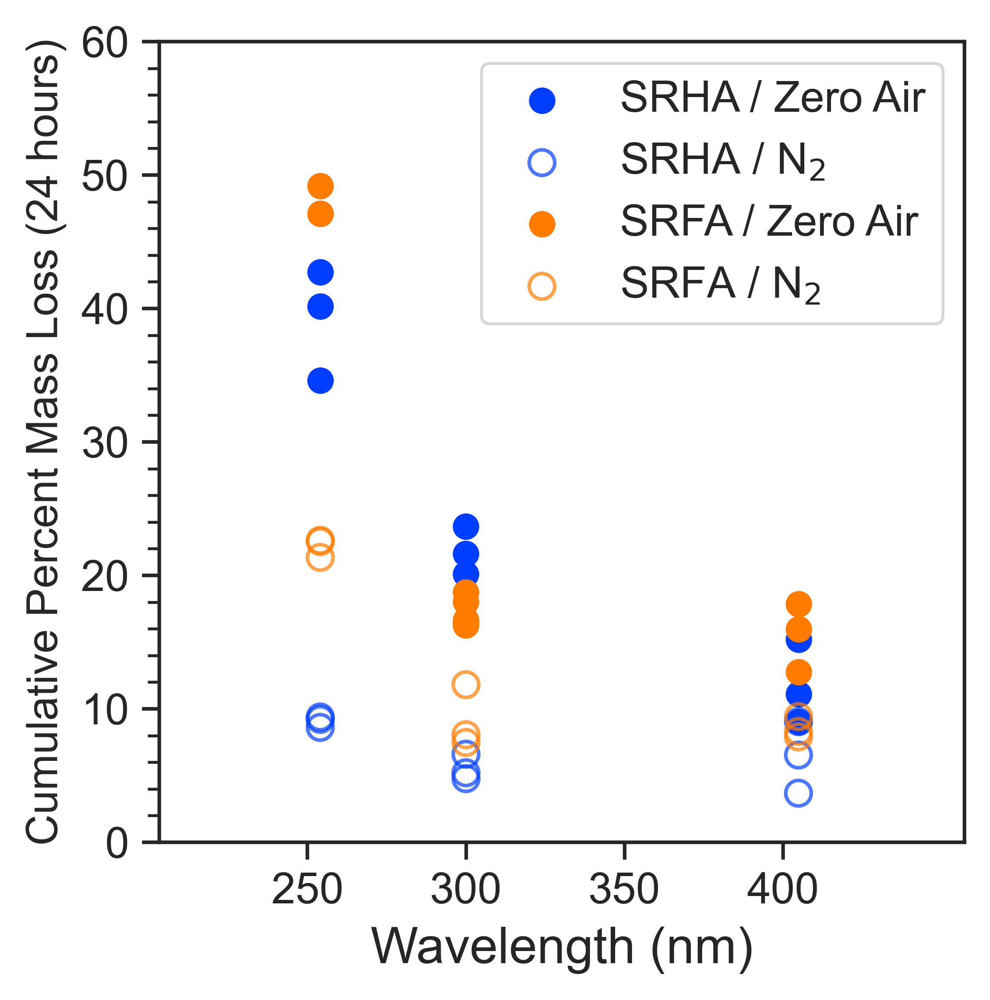

In [97]:
SRHA_405_N2 = [3.68,6.54,9.04]
SRHA_300_N2 = [4.77,6.60,5.21]
SRHA_254_N2 = [9.39,8.61,9.21]
SRFA_405_N2 = [9.42,7.90,8.31]
SRFA_300_N2 = [11.81,7.48,8.06]
SRFA_254_N2 = [21.35,22.63,22.54]


SRHA_405_Air = [9.01,15.21,11.12]
SRHA_300_Air = [20.10,23.68,21.62]
SRHA_254_Air= [42.74,40.17,34.61]



SRFA_405_Air = [15.99,17.85,12.75]
SRFA_300_Air = [18.75,16.26,16.50,16.51,18.01,16.59,16.64]
SRFA_254_Air = [49.18,47.12,47.10]
fig, axes = plt.subplots(figsize=(4,4))
#axes[0].set_title('SRHA',fontsize=10)
#axes[1].set_title('SRFA',fontsize=10)

SRHA_N2_wavelength = [5]*len(SRHA_254_N2)+[5*1.181]*len(SRHA_300_N2)+[5*1.594]*len(SRHA_405_N2)
SRHA_Air_wavelength = [5]*len(SRHA_254_Air)+[5*1.181]*len(SRHA_300_Air)+[5*1.594]*len(SRHA_405_Air)
axes.scatter(SRHA_Air_wavelength,SRHA_254_Air+SRHA_300_Air+SRHA_405_Air,label='SRHA / Zero Air',marker='o', c=sns.color_palette("bright")[0],s=40,linewidths=1)
axes.scatter(SRHA_N2_wavelength,SRHA_254_N2+SRHA_300_N2+SRHA_405_N2,label='SRHA / N$_{2}$',marker='o', facecolors='none', edgecolors=sns.color_palette("bright")[0],linewidths=1,s=50,alpha=0.7)
#axes.legend(prop = { "size": 8 })
#for box in box_HA_Air['boxes']:
#    box.set(facecolor='0')
#for box in box_HA_N2['boxes']:
#    box.set(facecolor='0.8')

#plt.legend()
#axes[0].set_xticks([5*250/254,5*250/254*6/5,7/5*5*250/254],['250','300','400'])
SRFA_N2_wavelength = [5]*len(SRFA_254_N2)+[5*1.181]*len(SRFA_300_N2)+[5*1.594]*len(SRFA_405_N2)
SRFA_Air_wavelength = [5]*len(SRFA_254_Air)+[5*1.181]*len(SRFA_300_Air)+[5*1.594]*len(SRFA_405_Air)
        
axes.scatter(SRFA_Air_wavelength,SRFA_254_Air+SRFA_300_Air+SRFA_405_Air,label='SRFA / Zero Air',marker='o', c=sns.color_palette("bright")[1],s=40,linewidths=1)
axes.scatter(SRFA_N2_wavelength,SRFA_254_N2+SRFA_300_N2+SRFA_405_N2,label='SRFA / N$_{2}$',marker='o', facecolors='none', edgecolors=sns.color_palette("bright")[1],linewidths=1,s=50,alpha=0.7)
#axes.legend(prop = { "size": 8 })
axes.legend(fontsize=12)
#axes[1].scatter(SRFA_Air_wavelength,SRFA_254_Air+SRFA_300_Air+SRFA_405_Air,label='Zero Air',marker='o', c='Black',s=40)
axes.set_xticks([5*250/254,5*250/254*6/5,(7/5)*5*(250/254),(8/5)*5*(250/254)],['250','300','350','400'])
axes.set_xticks([5*250/254,5*250/254*6/5,(7/5)*5*(250/254),(8/5)*5*(250/254)],['250','300','350','400'])
#axes[0].text(10.8,40,'SRHA',fontsize=9)
#axes[1].text(10.8,40,'SRFA',fontsize=9)
axes.set_xlim(4,9)
axes.set_xlim(4,9)
#axes.set_ylim(0,60)
axes.set_ylim(0,60)
#axes[1].legend(prop = { "size": 8 })
axes.set_ylabel('Cumulative Percent Mass Loss (24 hours)',fontsize=12)
axes.set_xlabel('Wavelength (nm)',fontsize=14)
axes.set_xlabel('Wavelength (nm)',fontsize=14)
#axes.tick_params(axis='x')
#axes.tick_params(axis='x')
axes.grid(False)
axes.yaxis.set_minor_locator(AutoMinorLocator())
#axes.yaxis.set_major_locator(AutoMinorLocator())

axes.tick_params(which='both',labelsize=12)
#axes.tick_params(which='minor', visible=True, length=5)

[43.48666666666667, 18.466, 13.655000000000001]
[15.621666666666664, 7.321666666666668, 7.4816666666666665]


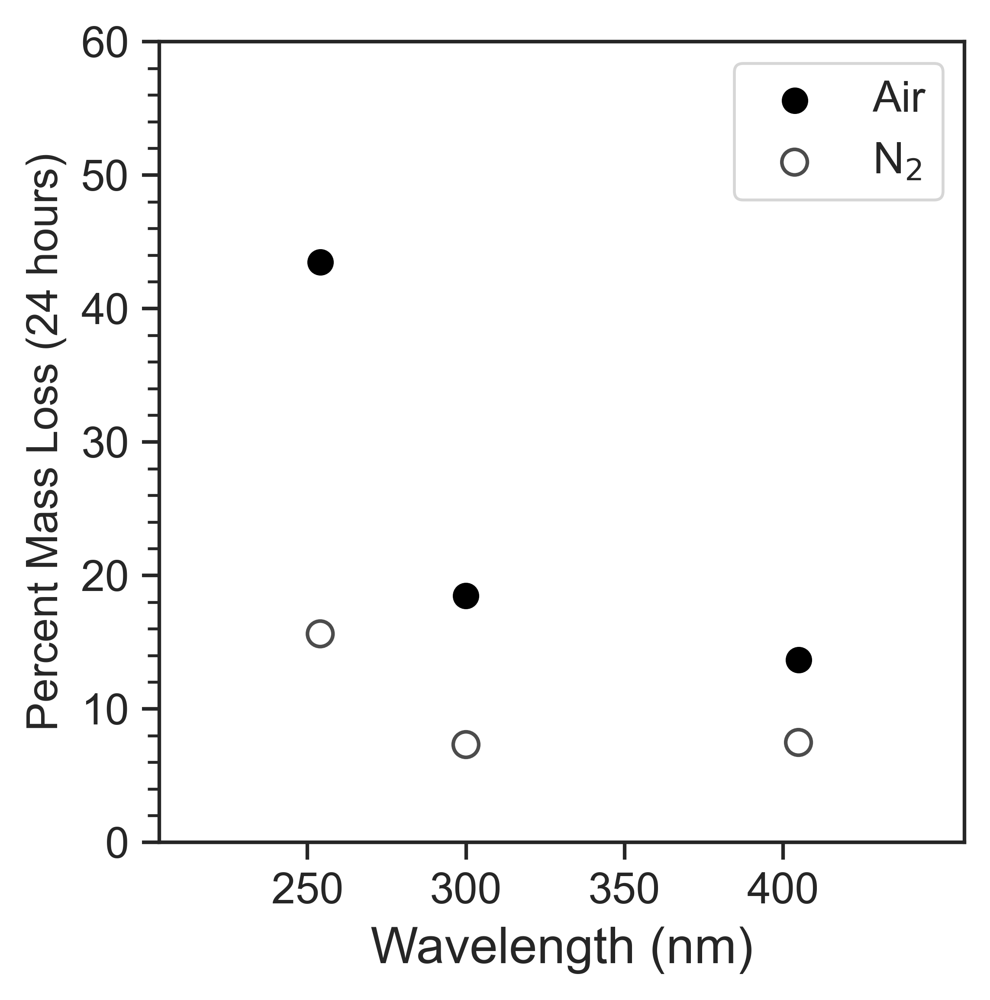

In [110]:
####for TOC
fig, axes = plt.subplots(figsize=(4,4))
#axes[0].set_title('SRHA',fontsize=10)
#axes[1].set_title('SRFA',fontsize=10)
#SRHA_N2_wavelength = [5]*len(SRHA_254_N2)+[5*1.181]*len(SRHA_300_N2)+[5*1.594]*len(SRHA_405_N2)
wavelength = [5,5*1.181,5*1.594]
Air = [np.mean(SRHA_254_Air+SRFA_254_Air),np.mean(SRHA_300_Air+SRFA_300_Air),np.mean(SRHA_405_Air+SRFA_405_Air)]
N2 = [np.mean(SRHA_254_N2+SRFA_254_N2),np.mean(SRHA_300_N2+SRFA_300_N2),np.mean(SRHA_405_N2+SRFA_405_N2)]
print(Air)
print(N2)

axes.scatter(wavelength,Air,label='Air',marker='o', c='black',s=40,linewidths=1)
axes.scatter(wavelength,N2,label='N$_{2}$',marker='o', facecolors='none', edgecolors='black',linewidths=1,s=50,alpha=0.7)
#axes.legend(prop = { "size": 8 })
#for box in box_HA_Air['boxes']:
#    box.set(facecolor='0')
#for box in box_HA_N2['boxes']:
#    box.set(facecolor='0.8')

#plt.legend()
#axes[0].set_xticks([5*250/254,5*250/254*6/5,7/5*5*250/254],['250','300','400'])
        
#axes.legend(prop = { "size": 8 })

axes.legend(fontsize=12)
#axes[1].scatter(SRFA_Air_wavelength,SRFA_254_Air+SRFA_300_Air+SRFA_405_Air,label='Zero Air',marker='o', c='Black',s=40)
axes.set_xticks([5*250/254,5*250/254*6/5,(7/5)*5*(250/254),(8/5)*5*(250/254)],['250','300','350','400'])
#axes.set_xticks([5*250/254,5*250/254*6/5,(7/5)*5*(250/254),(8/5)*5*(250/254)],['250','300','350','400'])
#axes[0].text(10.8,40,'SRHA',fontsize=9)
#axes[1].text(10.8,40,'SRFA',fontsize=9)
axes.set_xlim(4,9)
#axes.set_xlim(4,9)
axes.set_ylim(0,60)
#axes.set_ylim(0,60)
#axes[1].legend(prop = { "size": 8 })
axes.set_ylabel('Percent Mass Loss (24 hours)',fontsize=12)
axes.set_xlabel('Wavelength (nm)',fontsize=14)
axes.set_xlabel('Wavelength (nm)',fontsize=14)
#axes.tick_params(axis='x')
#axes.tick_params(axis='x')
axes.grid(False)
axes.yaxis.set_minor_locator(AutoMinorLocator())
#axes.yaxis.set_major_locator(AutoMinorLocator())

axes.tick_params(which='both',labelsize=12)
#axes.tick_params(which='minor', visible=True, length=5)


In [ ]:
sns.color_palette("bright")[0]

In [109]:
sns.color_palette("deep")

[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

In [108]:
sns.set_palette("Set2")

In [123]:
sns.color_palette("bright")

[(0.00784313725490196, 0.24313725490196078, 1.0),
 (1.0, 0.48627450980392156, 0.0),
 (0.10196078431372549, 0.788235294117647, 0.2196078431372549),
 (0.9098039215686274, 0.0, 0.043137254901960784),
 (0.5450980392156862, 0.16862745098039217, 0.8862745098039215),
 (0.6235294117647059, 0.2823529411764706, 0.0),
 (0.9450980392156862, 0.2980392156862745, 0.7568627450980392),
 (0.6392156862745098, 0.6392156862745098, 0.6392156862745098),
 (1.0, 0.7686274509803922, 0.0),
 (0.0, 0.8431372549019608, 1.0)]

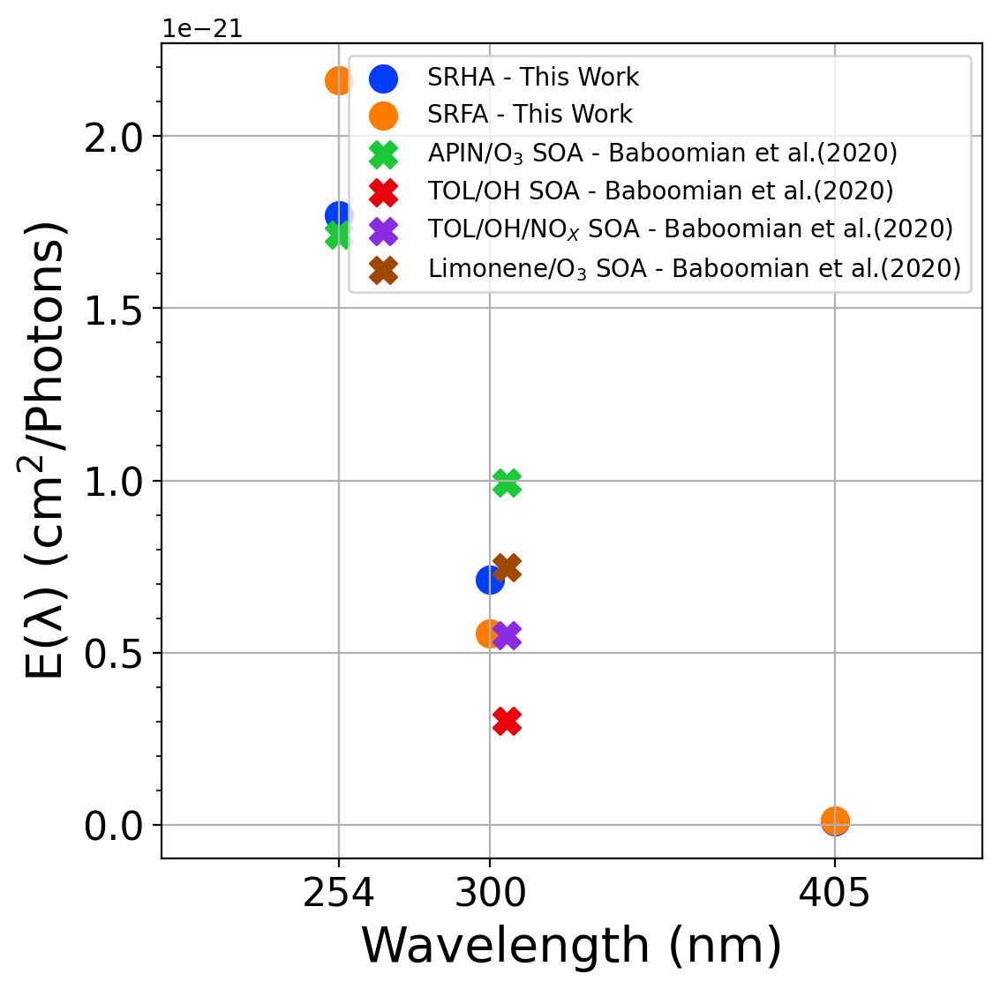

In [5]:
#sns.set_palette("Set2")\



##$#####normalize to flux 
sns.set_palette("bright")
SRHA_405_Air = list(np.array([9.01,15.21,11.12])/(100*60*60*24*1.63E+17))
SRHA_300_Air = list(np.array([20.10,23.68,21.62])/(100*60*60*24*3.55E+15))
SRHA_254_Air= list(np.array([42.74,40.17,34.61])/(100*60*60*24*2.56E+15))
SRHA = [np.mean(SRHA_254_Air),np.mean(SRHA_300_Air),np.mean(SRHA_405_Air)]
SRFA_405_Air = list(np.array([15.99,17.85,12.75])/(100*60*60*24*1.63E+17))
SRFA_300_Air = list(np.array([18.75,16.26,16.50,16.51,18.01,16.59,16.64])/(100*60*60*24*3.55E+15))
SRFA_254_Air = list(np.array([49.18,47.12,47.10])/(100*60*60*24*2.56E+15))
SRFA = [np.mean(SRFA_254_Air),np.mean(SRFA_300_Air),np.mean(SRFA_405_Air)]
wavelength = [254,300,405]
plt.figure(figsize=(6,6))
plt.scatter(wavelength,SRHA,label='SRHA - This Work',s=120)
plt.scatter(wavelength,SRFA,label='SRFA - This Work',s=120)
#plt.scatter((254,305),(9.6e-22,7.42e-22),label='APIN/O$_{3}$ SOA - Baboomian et al.(2020)',marker='X',s=120)
#plt.scatter((254,305),(3.13E-21,2.27E-22),label='TOL/OH SOA - Baboomian et al.(2020)',marker='X', s=120)
#plt.scatter((305),(3.97E-22),label='TOL/OH/NO$_{X}$ SOA - Baboomian et al.(2020)',marker='X', s=120)
#plt.scatter((305),(5.41E-22),label='Limonene/O$_{3}$ SOA - Baboomian et al.(2020)',marker='X',s=120)

plt.scatter((254,305),(1.713e-21,9.93e-22),label='APIN/O$_{3}$ SOA - Baboomian et al.(2020)',marker='X',s=120)
plt.scatter((305),(3.02e-22),label='TOL/OH SOA - Baboomian et al.(2020)',marker='X', s=120)
plt.scatter((305),(5.49e-22),label='TOL/OH/NO$_{X}$ SOA - Baboomian et al.(2020)',marker='X', s=120)
plt.scatter((305),(7.48e-22),label='Limonene/O$_{3}$ SOA - Baboomian et al.(2020)',marker='X',s=120)
plt.ylabel('E(λ) (cm$^{2}$/Photons)',fontsize=20)
plt.xlabel('Wavelength (nm)',fontsize=20)
plt.xlim((200,450))
plt.xticks((254,300,405),('254','300','405'),fontsize=16)
plt.yticks(fontsize=16)

plt.legend(frameon=True,fontsize=10)
#axes.yaxis.set_major_locator(AutoMinorLocator())


# Get current axes and set minor locator
current_axes = plt.gca()
current_axes.yaxis.set_minor_locator(AutoMinorLocator(n=5))
current_axes.tick_params(which='both', labelsize=16)
plt.grid(True)

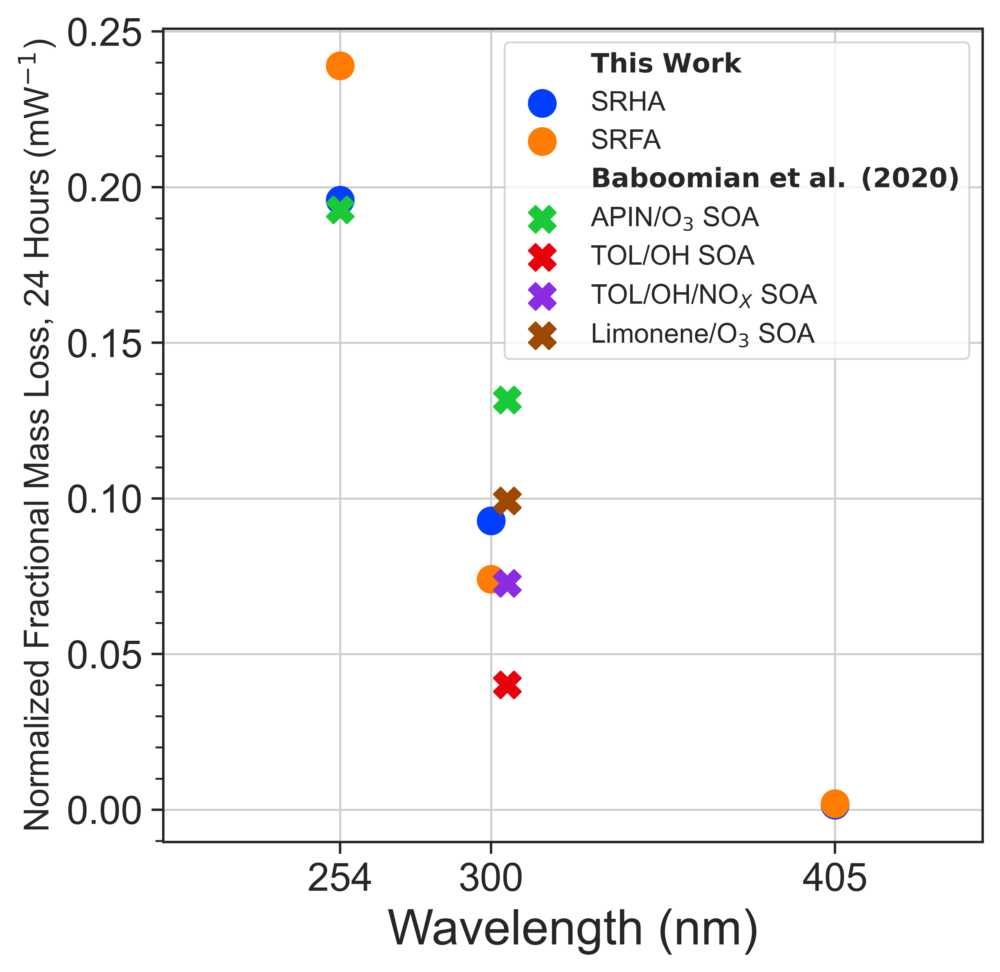

In [50]:

##$#####normalize to power 
sns.set_palette("bright")
SRHA_405_Air = list(np.array([9.01,15.21,11.12])/(80*100))
SRHA_300_Air = list(np.array([20.10,23.68,21.62])/(2.35*100))
SRHA_254_Air= list(np.array([42.74,40.17,34.61])/(2*100))
SRHA = [np.mean(SRHA_254_Air),np.mean(SRHA_300_Air),np.mean(SRHA_405_Air)]
SRFA_405_Air = list(np.array([15.99,17.85,12.75])/(80*100))
SRFA_300_Air = list(np.array([18.75,16.26,16.50,16.51,18.01,16.59,16.64])/(2.3*100))
SRFA_254_Air = list(np.array([49.18,47.12,47.10])/(2*100))
SRFA = [np.mean(SRFA_254_Air),np.mean(SRFA_300_Air),np.mean(SRFA_405_Air)]
wavelength = [254,300,405]
plt.figure(figsize=(6,6))
plt.plot([], [], ' ', label=r'$\bf{This\ Work}$')  # Bold title for 'This Work'
plt.scatter(wavelength, SRHA, label='SRHA', s=120)
plt.scatter(wavelength, SRFA, label='SRFA', s=120)

plt.plot([], [], ' ', label=r'$\bf{Baboomian\ et\ al.\ (2020)}$')  # Bold title for 'Baboomian et al. (2020)'
plt.scatter((254, 305), (0.713/3.7, 0.3423/2.6), label='APIN/O$_{3}$ SOA', marker='X', s=120)
plt.scatter((305,), (0.1042/2.6), label='TOL/OH SOA', marker='X', s=120)
plt.scatter((305,), (0.1891/2.6), label='TOL/OH/NO$_{X}$ SOA', marker='X', s=120)
plt.scatter((305,), (0.258/2.6), label='Limonene/O$_{3}$ SOA', marker='X', s=120)

plt.ylabel('Normalized Fractional Mass Loss, 24 Hours (mW$^{-1}$)',fontsize=14)
plt.xlabel('Wavelength (nm)',fontsize=20)
plt.xlim((200,450))
plt.xticks((254,300,405),('254','300','405'),fontsize=16)
plt.yticks(fontsize=16)

plt.legend(frameon=True,fontsize=11)
#axes.yaxis.set_major_locator(AutoMinorLocator())


# Get current axes and set minor locator
current_axes = plt.gca()
current_axes.yaxis.set_minor_locator(AutoMinorLocator(n=5))
current_axes.tick_params(which='both', labelsize=16)
plt.grid(True)

In [24]:
import pandas as pd 

In [51]:
solar_path = 'Athens_2023_summer.xlsx'
solar_df = pd.read_excel(solar_path,usecols=['AVG']).dropna()
#solar_wavelength = solar_df['Wavelength']
solar_Flux = solar_df['AVG']

In [27]:
print(solar_Flux_2)

0      0.000000e+00
1      0.000000e+00
2      0.000000e+00
3      0.000000e+00
4      0.000000e+00
           ...     
120    1.730000e+14
121    1.780000e+14
122    1.850000e+14
123    1.700000e+14
124    1.670000e+14
Name: Flux, Length: 125, dtype: float64


In [18]:
print(solar_df)

     Wavelength          Flux
0         280.5  0.000000e+00
1         281.5  0.000000e+00
2         282.5  0.000000e+00
3         283.5  0.000000e+00
4         284.5  0.000000e+00
..          ...           ...
120       400.5  1.757868e+14
121       401.5  1.813097e+14
122       402.5  1.886924e+14
123       403.5  1.731363e+14
124       404.5  1.702263e+14

[125 rows x 2 columns]


[[3.64571370e-38 4.04974340e-22]
 [4.04974340e-22 4.51666064e-06]]
[3.44622631e-19 2.07361103e-02]
r2= 0.9804243750874038


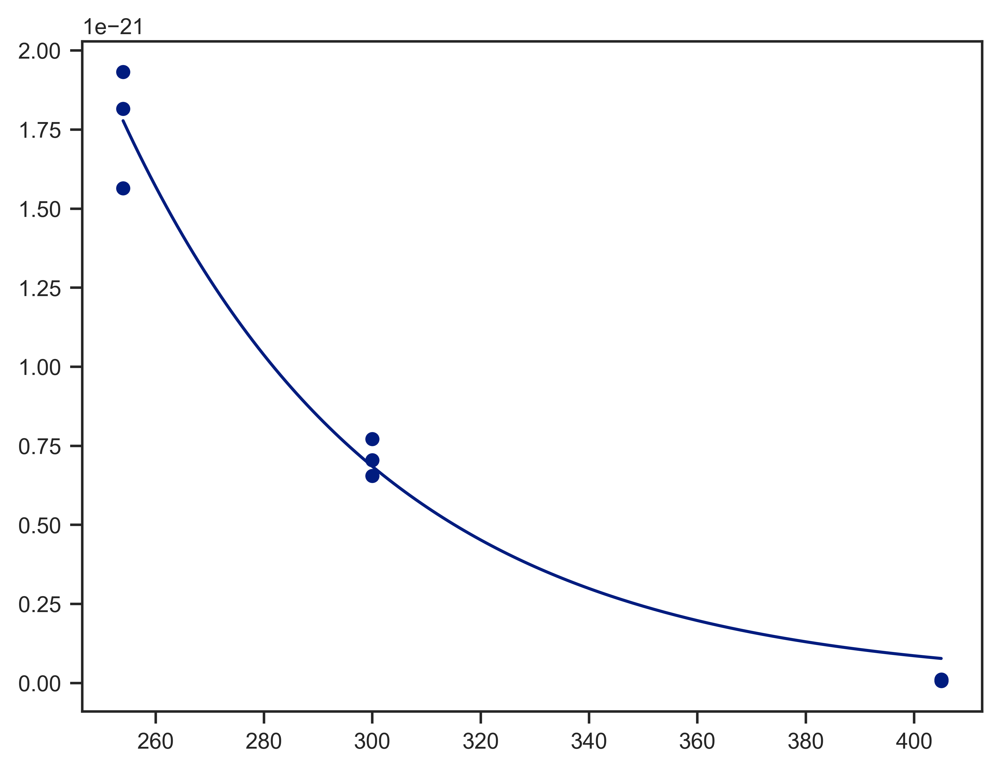

In [26]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt 


SRHA_405_Air = list(np.array([9.01,15.21,11.1])/(100*60*60*24*1.63E+17))
SRHA_300_Air = list(np.array([20.10,23.68,21.62])/(100*60*60*24*3.55E+15))
SRHA_254_Air= list(np.array([42.74,40.17,34.61])/(100*60*60*24*2.56E+15))


SRFA_405_Air = list(np.array([15.99,17.85,12.75])/(100*60*60*24*1.63E+17))
SRFA_300_Air = list(np.array([18.75,16.26,16.50,16.51,18.01,16.59,16.64])/(100*60*60*24*3.55E+15))
SRFA_254_Air = list(np.array([49.18,47.12,47.10])/(100*60*60*24*2.56E+15))


SRHA_mean = [np.mean(SRHA_405_Air),np.mean(SRHA_300_Air),np.mean(SRHA_254_Air)]

#x_HA = np.asarray([405]*3+[300]*3+[254]*3)
#y_HA = np.asarray(SRHA_405_Air+SRHA_300_Air+SRHA_254_Air)

x_HA = np.asarray([405]*3+[300]*3+[254]*3)

y_HA = np.asarray(SRHA_405_Air+SRHA_300_Air+SRHA_254_Air)
def func(x, a, b):
  #return a*np.exp(-b*x)
  return a*np.exp(-b*x)

#def func(x, a, b):
#  return a*x**(b)
plt.scatter(x_HA,y_HA)
#popt, pcov = curve_fit(func, x_HA, y_HA,p0 = (-1e-25, 1e-2),method='lm',maxfev=100000)
#popt, pcov = curve_fit(func, x_HA, y_HA,p0 = (1e-25, 1e-2),method='lm',maxfev=100000000)
popt, pcov = curve_fit(func, x_HA, y_HA,p0 = (0.1e-7, 0.1e-0),method='lm',maxfev=10000000)
#popt, pcov = curve_fit(func,[405,300,254],SRHA_mean,p0 = (0.1e-7, 0.1e-0),method='lm',maxfev=10000000)

#p0 = (0.1e-7, 0.1e-7)
#popt, pcov = curve_fit(func, x_HA, y_HA,p0 = (1e-20, 1),method='lm',maxfev=100000)

print(pcov)
print(popt)
x_curve = np.linspace(254,405,152)
plt.plot(x_curve,func(x_curve, *popt))

y_pred = func(x_HA, *popt)

# Calculate the residuals
residuals = y_HA - y_pred

# Calculate the total sum of squares
tss = np.sum((y_HA - np.mean(y_HA))**2)

# Calculate the residual sum of squares
rss = np.sum(residuals**2)

# Calculate the R-squared value
r_squared = 1 - (rss / tss)
print('r2=',r_squared)

popt_HA = popt


[[3.73041786e-37 1.01336265e-21]
 [1.01336265e-21 2.76303185e-06]]
[1.40952414e-18 2.58829473e-02]


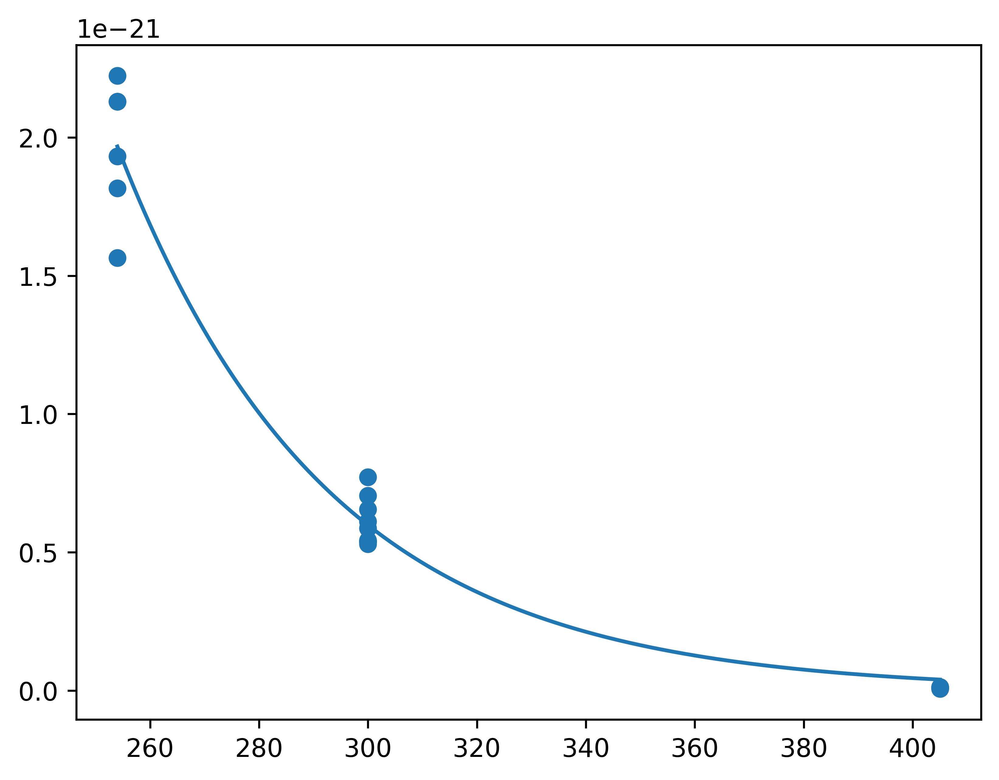

In [64]:
SRHA_405_Air = list(np.array([9.01,15.21,11.1])/(100*60*60*24*1.63E+17))
SRHA_300_Air = list(np.array([20.10,23.68,21.62])/(100*60*60*24*3.55E+15))
SRHA_254_Air= list(np.array([42.74,40.17,34.61])/(100*60*60*24*2.56E+15))


SRFA_405_Air = list(np.array([15.99,17.85,12.75])/(100*60*60*24*1.63E+17))
SRFA_300_Air = list(np.array([18.75,16.26,16.50,16.51,18.01,16.59,16.64])/(100*60*60*24*3.55E+15))
SRFA_254_Air = list(np.array([49.18,47.12,47.10])/(100*60*60*24*2.56E+15))


SRHA_mean = [np.mean(SRHA_405_Air),np.mean(SRHA_300_Air),np.mean(SRHA_254_Air)]

#x_HA = np.asarray([405]*3+[300]*3+[254]*3)
#y_HA = np.asarray(SRHA_405_Air+SRHA_300_Air+SRHA_254_Air)

x_HA = np.asarray([405]*6+[300]*10+[254]*6)

y_HA = np.asarray(SRHA_405_Air+SRFA_405_Air+SRHA_300_Air+SRFA_300_Air+SRHA_254_Air+SRFA_254_Air)
popt, pcov = curve_fit(func, x_HA, y_HA,p0 = (0.1e-7, 0.1e-0),method='lm',maxfev=10000000)
#popt, pcov = curve_fit(func,[405,300,254],SRHA_mean,p0 = (0.1e-7, 0.1e-0),method='lm',maxfev=10000000)

#p0 = (0.1e-7, 0.1e-7)
#popt, pcov = curve_fit(func, x_HA, y_HA,p0 = (1e-20, 1),method='lm',maxfev=100000)

print(pcov)
print(popt)
x_curve = np.linspace(254,405,152)
plt.plot(x_curve,func(x_curve, *popt))
plt.scatter(x_HA,y_HA)
popt_all = popt

[[2.94449140e-37 2.85343674e-22]
 [2.85343674e-22 2.77527494e-07]]
[3.95231862e-18 2.95719445e-02]
r2= 0.9984501576450671


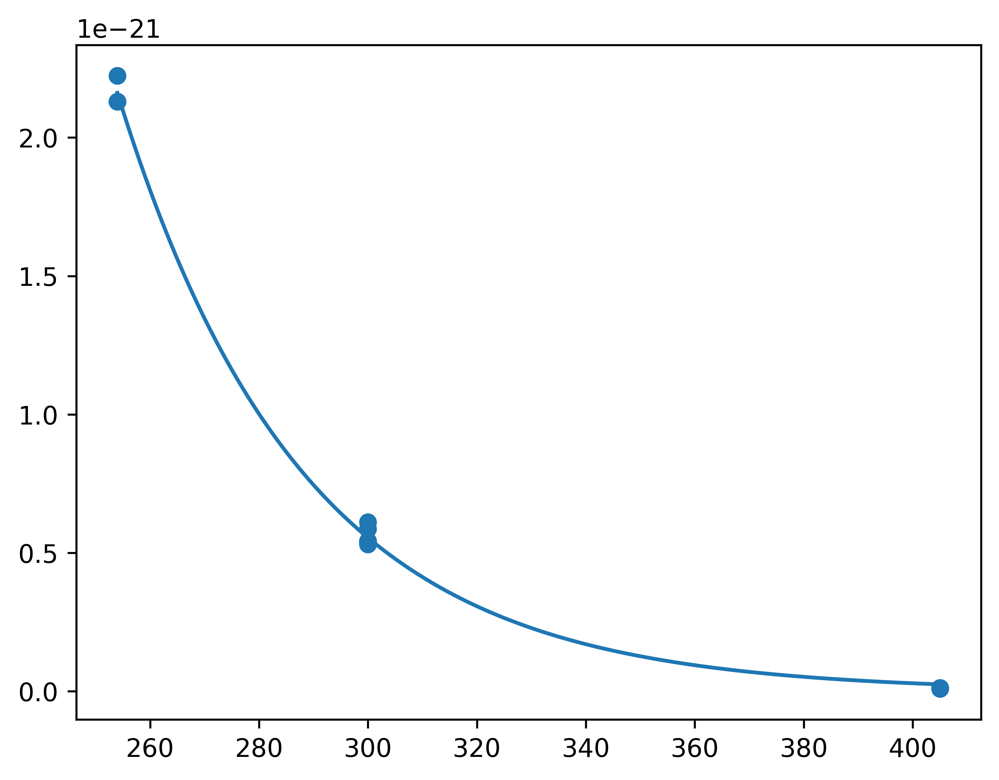

In [63]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt 
x_FA = np.asarray([405]*3+[300]*7+[254]*3)
y_FA = np.asarray(SRFA_405_Air+SRFA_300_Air+SRFA_254_Air)
def func(x, a, b):
  return a*np.exp(-b*x)
plt.scatter(x_FA,y_FA)

popt, pcov = curve_fit(func, x_FA, y_FA,p0 = (1e-20, 1e-2),method='lm')
print(pcov)
print(popt)
x_curve = np.linspace(254,405,152)
plt.plot(x_curve,func(x_curve, *popt))



y_pred = func(x_FA, *popt)

# Calculate the residuals
residuals = y_FA - y_pred

# Calculate the total sum of squares
tss = np.sum((y_FA - np.mean(y_FA))**2)

# Calculate the residual sum of squares
rss = np.sum(residuals**2)

# Calculate the R-squared value
r_squared = 1 - (rss / tss)
print('r2=',r_squared)
popt_FA = popt

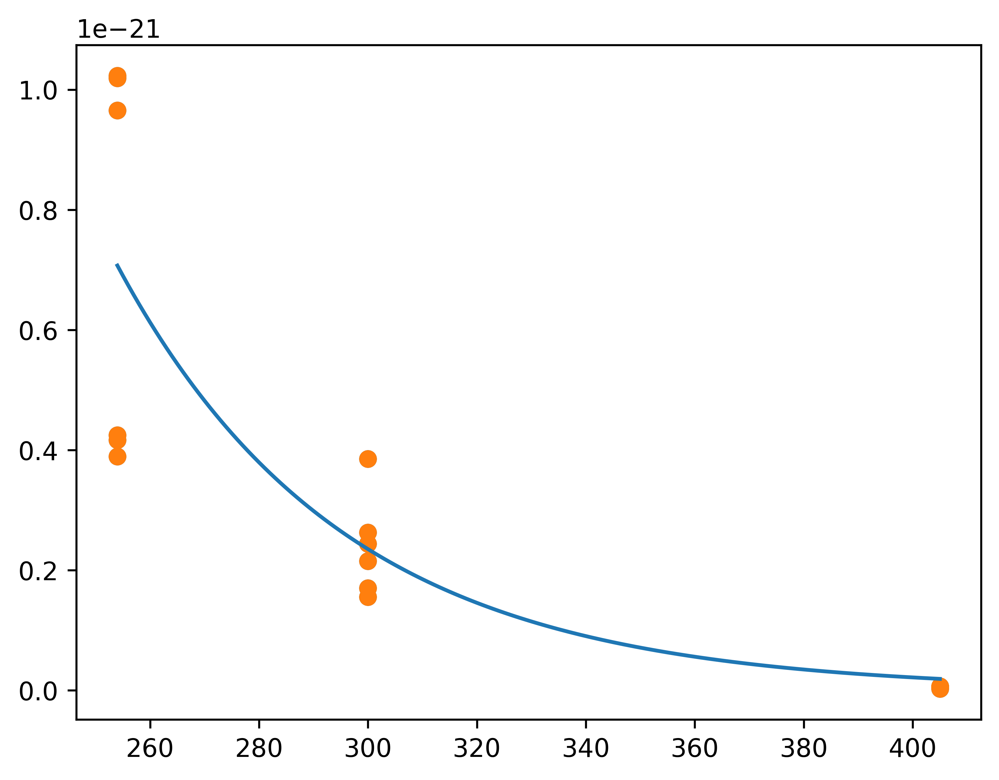

In [72]:
SRHA_405_N2 = list(np.array([3.68,6.54,9.04])/(100*60*60*24*1.63E+17))
SRHA_300_N2 = list(np.array([4.77,6.60,5.21])/(100*60*60*24*3.55E+15))
SRHA_254_N2 = list(np.array([9.39,8.61,9.21])/(100*60*60*24*2.56E+15))
SRFA_405_N2 = list(np.array([9.42,7.90,8.31])/(100*60*60*24*1.63E+17))
SRFA_300_N2 = list(np.array([11.81,7.48,8.06])/(100*60*60*24*3.55E+15))
SRFA_254_N2 = list(np.array([21.35,22.63,22.54])/(100*60*60*24*2.56E+15))




#SRHA_mean = [np.mean(SRHA_405_N2+SRFA_405_N2),np.mean(SRHA_300_N2+SRFA_300_N2),np.mean(SRHA_254_N2+SRFA_254_N2)]

#x_HA = np.asarray([405]*3+[300]*3+[254]*3)
#y_HA = np.asarray(SRHA_405_Air+SRHA_300_Air+SRHA_254_Air)

x_HA_n2 = np.asarray([405]*6+[300]*6+[254]*6)

y_HA_n2 = np.asarray(SRHA_405_N2+SRFA_405_N2+SRHA_300_N2+SRFA_300_N2+SRHA_254_N2+SRFA_254_N2)
popt_n2, pcov_n2 = curve_fit(func, x_HA_n2, y_HA_n2,p0 = (0.1e-7, 0.1e-0),method='lm',maxfev=10000000)
#popt, pcov = curve_fit(func,[405,300,254],SRHA_mean,p0 = (0.1e-7, 0.1e-0),method='lm',maxfev=10000000)

#p0 = (0.1e-7, 0.1e-7)
#popt, pcov = curve_fit(func, x_HA, y_HA,p0 = (1e-20, 1),method='lm',maxfev=100000)

x_curve = np.linspace(254,405,152)
plt.plot(x_curve,func(x_curve, *popt_n2))
plt.scatter(x_HA_n2,y_HA_n2)
plt.scatter(x_HA_n2,y_HA_n2)


In [73]:
SRHA_405_N2 = list(np.array([3.68,6.54,9.04])/(100*60*60*24*1.63E+17))
SRHA_300_N2 = list(np.array([4.77,6.60,5.21])/(100*60*60*24*3.55E+15))
SRHA_254_N2 = list(np.array([9.39,8.61,9.21])/(100*60*60*24*2.56E+15))
SRFA_405_N2 = list(np.array([9.42,7.90,8.31])/(100*60*60*24*1.63E+17))
SRFA_300_N2 = list(np.array([11.81,7.48,8.06])/(100*60*60*24*3.55E+15))
SRFA_254_N2 = list(np.array([21.35,22.63,22.54])/(100*60*60*24*2.56E+15))
x_HA_n2 = np.asarray([405]*3+[300]*3+[254]*3)
x_FA_n2 = np.asarray([405]*3+[300]*3+[254]*3)
y_HA_n2 = SRHA_405_N2 + SRHA_300_N2 + SRHA_254_N2
y_FA_n2 = SRFA_405_N2 + SRFA_300_N2 + SRFA_254_N2


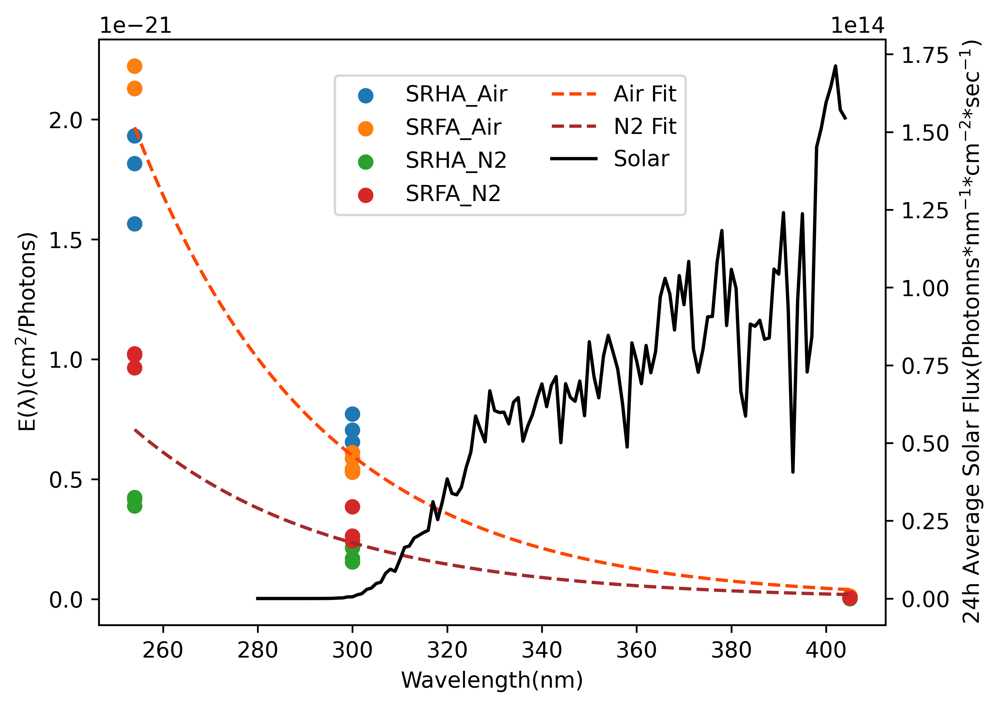

In [83]:
#showcase%matplotlib inline
%config InlineBackend.figure_format='retina'
fig, ax1 = plt.subplots()
ax1.scatter(x_HA,y_HA,label='SRHA_Air')
#ax1.plot(x_curve,func(x_curve, *popt_HA),label='SRHA Fit')
ax1.scatter(x_FA,y_FA,label='SRFA_Air')
ax1.scatter(x_HA_n2,y_HA_n2,label='SRHA_N2')
#ax1.plot(x_curve,func(x_curve, *popt_HA),label='SRHA Fit')
ax1.scatter(x_FA_n2,y_FA_n2,label='SRFA_N2')
ax1.plot(x_curve,func(x_curve, *popt_all),label='Air Fit',linestyle='dashed',color='orangered')
ax1.plot(x_curve,func(x_curve, *popt_n2),label='N2 Fit',linestyle='dashed',color='brown')
ax1.set_xlabel('Wavelength(nm)')
ax1.set_ylabel('E(λ)($\mathregular{cm^{2}}$/Photons)')
ax2 = ax1.twinx() 
ax2.set_ylabel('24h Average Solar Flux(Photonns*$\mathregular{nm^{-1}}$*$\mathregular{cm^{-2}}$*$\mathregular{sec^{-1}}$)')

ax2.plot(range(280,405),solar_Flux,color='0',label='Solar')

# Collect all handles and labels from both ax1 and ax2
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()

# Combine handles and labels
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend
ax1.legend(handles, labels, loc=(0.3, 0.7),ncol=2)

In [75]:
print(sum(100*60*60*24*solar_Flux*func(range(280,405), *popt_all)))
print(sum(100*60*60*24*solar_Flux*func(range(280,405), *popt_n2)))



8.257854370293861
3.574994088563549


In [ ]:
print(sum(100*60*60*24*solar_Flux*func(range(280,405), *popt_FA)))
print(sum(100*60*60*24*solar_Flux*func(range(280,405), *popt_HA)))
print(sum(100*60*60*24*solar_Flux*func(range(280,405), *popt_HA)))



In [47]:
print(sum(100*60*60*24*solar_Flux*func(range(280,405), *popt_FA)))
print(sum(100*60*60*24*solar_Flux*func(range(280,405), *popt_HA)))


6.41276398884062
8.257854370293861


In [37]:
print(100*sum(solar_Flux*func(solar_wavelength, *popt_FA))/3.85e-3)
print(100*sum(solar_Flux*func(solar_wavelength, *popt_HA))/3.85e-3)

0.01899543828629821
0.024505994805096264


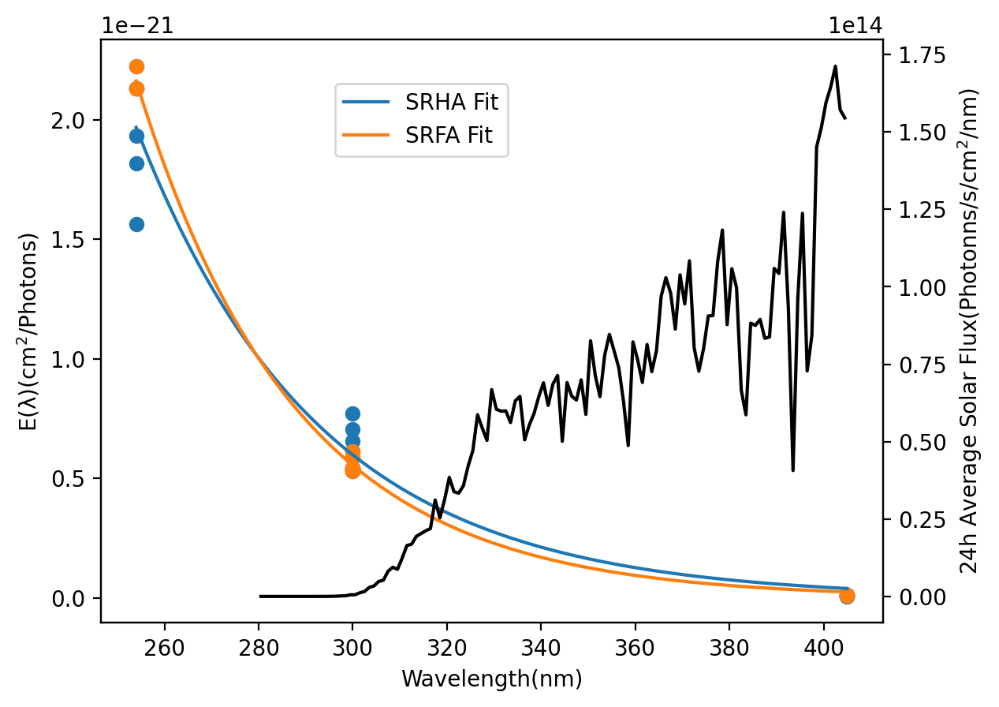

In [42]:
#showcase%matplotlib inline
%config InlineBackend.figure_format='retina'
fig, ax1 = plt.subplots()
ax1.scatter(x_HA,y_HA)
ax1.plot(x_curve,func(x_curve, *popt_HA),label='SRHA Fit')
ax1.scatter(x_FA,y_FA)
ax1.plot(x_curve,func(x_curve, *popt_FA),label='SRFA Fit')
ax1.set_xlabel('Wavelength(nm)')
ax1.set_ylabel('E(λ)($\mathregular{cm^{2}}$/Photons)')
ax2 = ax1.twinx() 
ax2.set_ylabel('24h Average Solar Flux(Photonns/s/$\mathregular{cm^{2}}$/nm)')

ax2.plot(solar_wavelength,solar_Flux,color='0',label='Solar')
#ax2.plot(solar_wavelength,solar_Flux_2,color='0',label='Solar')

ax1.legend(loc=(0.3,0.8))

#plt.legend()

[[4.69753475e-48 3.69665864e-27]
 [3.69665864e-27 2.92306714e-06]]
[4.83867578e-24 1.88127286e-02]
r2= 0.9837674819925782


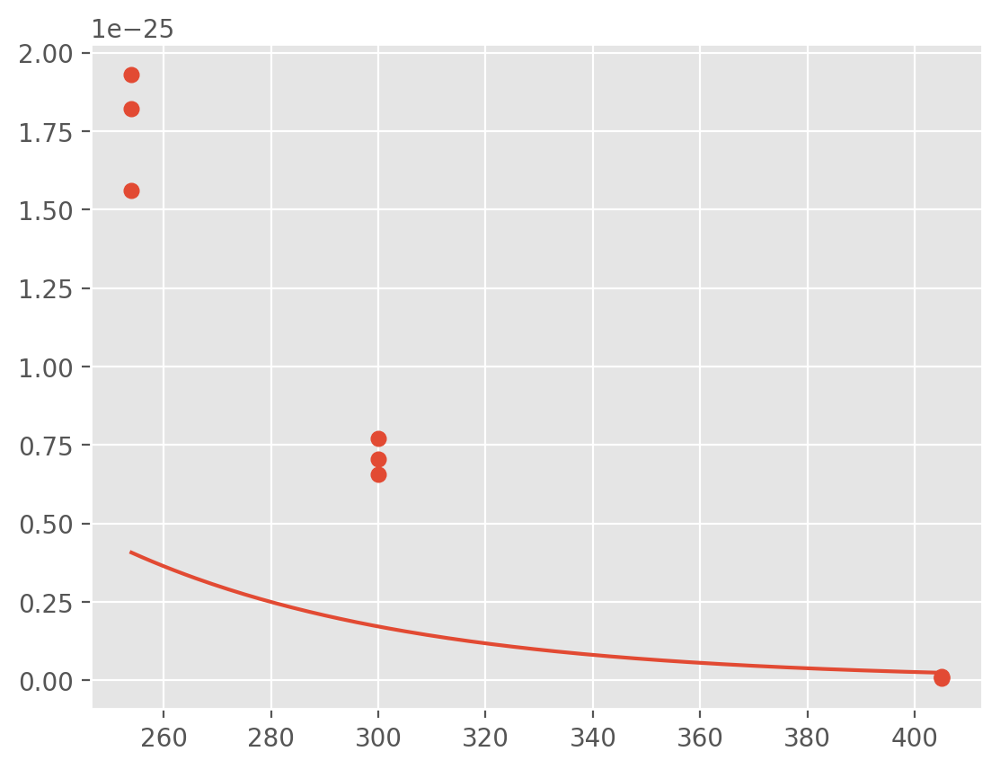

In [76]:
###N2 only fit 
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt 
x_HA_N2 = np.asarray([405,405,300,254,300,405,300,254,254])
y_HA_N2 = np.asarray([2.61e-28,4.64e-28,1.55e-26,4.24e-26,2.15e-26,6.41e-28,1.7e-26,3.89e-26,4.00e-26])
def func(x, a, b):
  return a*np.exp(-b*x)
plt.scatter(x_HA,y_HA)
popt, pcov = curve_fit(func, x_HA_N2, y_HA_N2,p0 = (1e-24, 1e-4),method='lm',maxfev=1000000)
print(pcov)
print(popt)
x_curve = np.linspace(254,405,152)
plt.plot(x_curve,func(x_curve, *popt))
#plt.yscale('log')
y_pred = func(x_HA_N2, *popt)

# Calculate the residuals
residuals = y_HA_N2 - y_pred

# Calculate the total sum of squares
tss = np.sum((y_HA_N2 - np.mean(y_HA_N2))**2)

# Calculate the residual sum of squares
rss = np.sum(residuals**2)

# Calculate the R-squared value
r_squared = 1 - (rss / tss)
print('r2=',r_squared)

popt_HA = popt


Text(0, 0.5, 'E(λ)($\\mathregular{cm^{2}}$/Photons)')

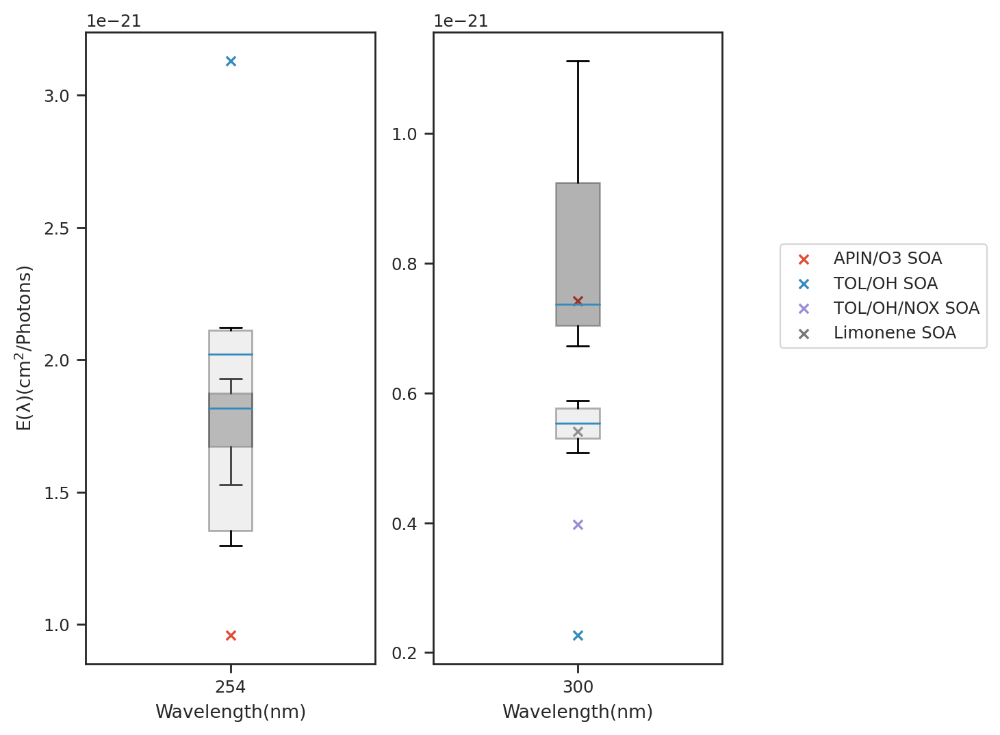

In [132]:
SRFA_300_Air = np.asarray((17.9244566739,15.7735597771,16.7786665025,17.4398277005,18.0455910367,16.9789145091,15.5727397130))
SRFA_254_Air = np.asarray((28.7033236077,29.9871262156,46.9359083508,46.6935519036,44.7270581821))

SRHA_300_Air = np.asarray((22.59158727,20.61773626,34.10606934))
SRHA_254_Air= np.asarray((40.17210163,33.79559552,42.67530322))
fig, axes = plt.subplots(1, 2,figsize=(6,6))
box_HA_254=axes[0].boxplot(SRHA_254_Air/(100*60*60*24*2.56E+15),patch_artist=True,boxprops=dict(alpha=.3))
box_FA_254=axes[0].boxplot(SRFA_254_Air/(100*60*60*24*2.56E+15),patch_artist=True,boxprops=dict(alpha=.3))

#box_FA=axes[1].boxplot([SRHA_254_Air/(100*60*60*24*2.56E+15),SRHA_300_Air/(100*60*60*24*3.61E+15)],patch_artist=True,boxprops=dict(alpha=.3))

box_HA_300=axes[1].boxplot(SRHA_300_Air/(100*60*60*24*3.55E+15),patch_artist=True,boxprops=dict(alpha=.3))
box_FA_300=axes[1].boxplot(SRFA_300_Air/(100*60*60*24*3.55E+15),patch_artist=True,boxprops=dict(alpha=.3))

axes[0].set_xticks([1],['254'])
axes[1].set_xticks([1],['300'])

for box in box_HA_254['boxes']:
    box.set(facecolor='0')
for box in box_FA_254['boxes']:
    box.set(facecolor='0.8')
    
for box in box_HA_300['boxes']:
    box.set(facecolor='0')
for box in box_FA_300['boxes']:
    box.set(facecolor='0.8')
axes[0].scatter((1),(9.6e-22),label='APIN/O3 SOA',marker='x')
axes[0].scatter((1),(3.13E-21),label='TOL/OH SOA',marker='x')
axes[1].scatter((1),(7.42e-22),label='APIN/O3 SOA',marker='x')
axes[1].scatter((1),(2.27E-22),label='TOL/OH SOA',marker='x')
axes[1].scatter((1),(3.97E-22),label='TOL/OH/NOX SOA',marker='x')
axes[1].scatter((1),(5.41E-22),label='Limonene SOA',marker='x')
axes[1].legend(loc=(1.2,0.5))
axes[0].set_xlabel('Wavelength(nm)')
axes[1].set_xlabel('Wavelength(nm)')
axes[0].set_ylabel('E(λ)($\mathregular{cm^{2}}$/Photons)')


In [ ]:
#######lamp/laser artifact showcase
## 1,2 for 254/305  3, for 405   405 one need a reference 



Text(0.05, 0.95, '4)')

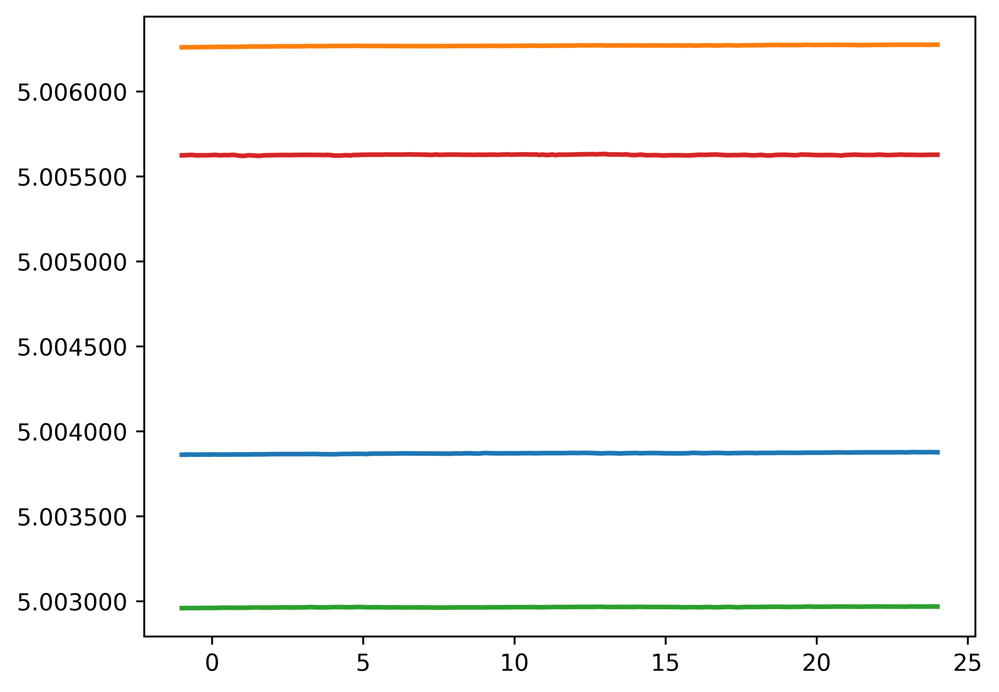

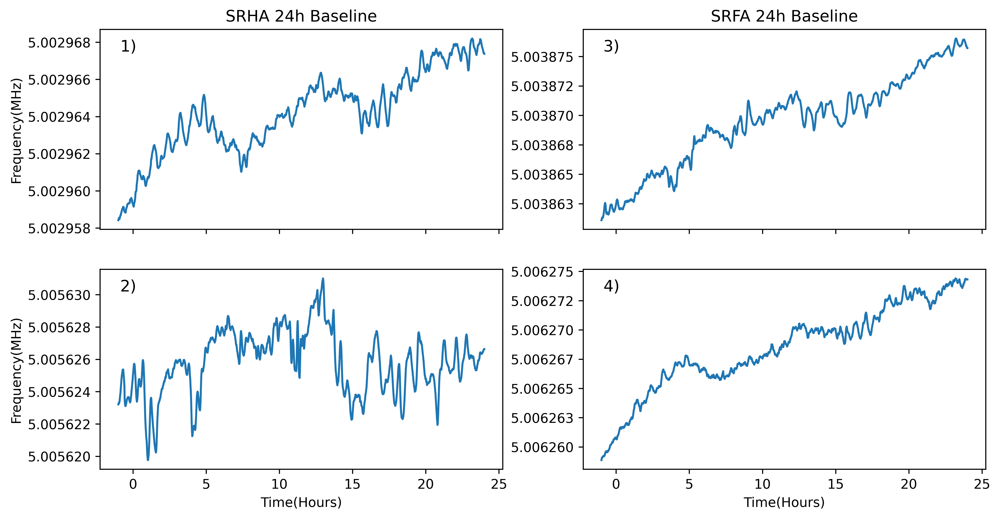

In [3]:
########baseline figure show that the baseline only drift 10~20hz during the 24h for both SRFA and SRHA,
####### then the correction is unnessary
fig, ax = plt.subplots()
def baseline_plot(path,time_frame,t0):
    data = pd.read_excel(path,header=0,parse_dates=True,usecols=['Time','Untitled'])
    data=data.set_index('Time')
    data.rename(columns = {'Untitled':'A'}, inplace = True)
    #print(data)
    data['A']=data['A'].dropna()
    #print(data['A'])
    #data['A'] = data['A'] - data['A'][1]
    #print(data)
    data= data.asfreq(freq='60s',method='pad')
    roi = data[(data.index > time_frame[0]) & (data.index <= time_frame[1])]
    roi.index = pd.to_timedelta(roi.index - pd.to_datetime(t0))
    new_index = pd.timedelta_range(start='-60min', end='24hours', freq='1min')
    #(td / np.timedelta64(1, 'D')).astype(int)
    #print(new_index/np.timedelta64(1, 'h').astype(int))
    # Reindex the DataFrame using the new index, filling missing values with NaN
    roi = roi.reindex(new_index,method='ffill',fill_value=pd.NaT)
    num_index = np.linspace(0,1440,num=1441)
    roi = roi.reindex(new_index,method='ffill',fill_value=pd.NaT)
    roi = roi.reindex(new_index)
    #print(roi['A'].values)
    ax.plot(roi['A'].index.total_seconds()/(60*60),roi['A'].values,linewidth=2)
    fmt = lambda x, pos: '{:.6f}'.format(x/1e6, pos)
    ax.yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
    return roi
path_1 ='data/Special/HA_FA_Blank_Exp_24h/SRFA_1.xlsx'
path_2='data/Special/HA_FA_Blank_Exp_24h/SRFA_2.xlsx'
path_3='data/Special/HA_FA_Blank_Exp_24h/SRHA_1.xlsx'
path_4='data/Special/HA_FA_Blank_Exp_24h/SRHA_2.xlsx'
SRFA_1=baseline_plot(path_1,['2023-04-22 23:31:30','4/24/2023 1:31:30'],t0='2023-04-23 1:31:30')
SRFA_2=baseline_plot(path_2,['2023-04-25 20:22:00','4/26/2023 21:22:00'],t0='2023-04-25 21:22:30')
SRHA_1=baseline_plot(path_3,['2023-04-25 20:22:00','4/26/2023 21:22:00'],t0='2023-04-25 21:22:30')
SRHA_2=baseline_plot(path_4,['2023-04-17 19:01:00','4/18/2023 20:01:00'],t0='2023-04-17 20:01:30')
fig, axs = plt.subplots(2,2,sharex=True,figsize=(12,6))
axs[0,1].plot(SRFA_1['A'].index.total_seconds()/(60*60),SRFA_1['A'].values)
axs[1,1].plot(SRFA_2['A'].index.total_seconds()/(60*60),SRFA_2['A'].values)
axs[0,0].plot(SRHA_1['A'].index.total_seconds()/(60*60),SRHA_1['A'].values)
axs[1,0].plot(SRHA_2['A'].index.total_seconds()/(60*60),SRHA_2['A'].values)
axs[1,0].set_xlabel('Time(Hours)')
axs[1,1].set_xlabel('Time(Hours)')

axs[0,0].set_ylabel('Frequency(MHz)')
axs[1,0].set_ylabel('Frequency(MHz)')


fmt = lambda x, pos: '{:.6f}'.format(x/1e6, pos)
axs[0,0].set_title('SRHA 24h Baseline')
axs[0,1].set_title('SRFA 24h Baseline')

axs[0,0].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
axs[0,1].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
axs[1,0].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
axs[1,1].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))

axs[0,0].text(0.05, 0.95, '1)',transform=axs[0,0].transAxes,fontsize=12,verticalalignment='top')
axs[1,0].text(0.05, 0.95, '2)',transform=axs[1,0].transAxes,fontsize=12,verticalalignment='top')
axs[0,1].text(0.05, 0.95, '3)',transform=axs[0,1].transAxes,fontsize=12,verticalalignment='top')
axs[1,1].text(0.05, 0.95, '4)',transform=axs[1,1].transAxes,fontsize=12,verticalalignment='top')

Text(0, 0.5, 'Frequency (MHz)')

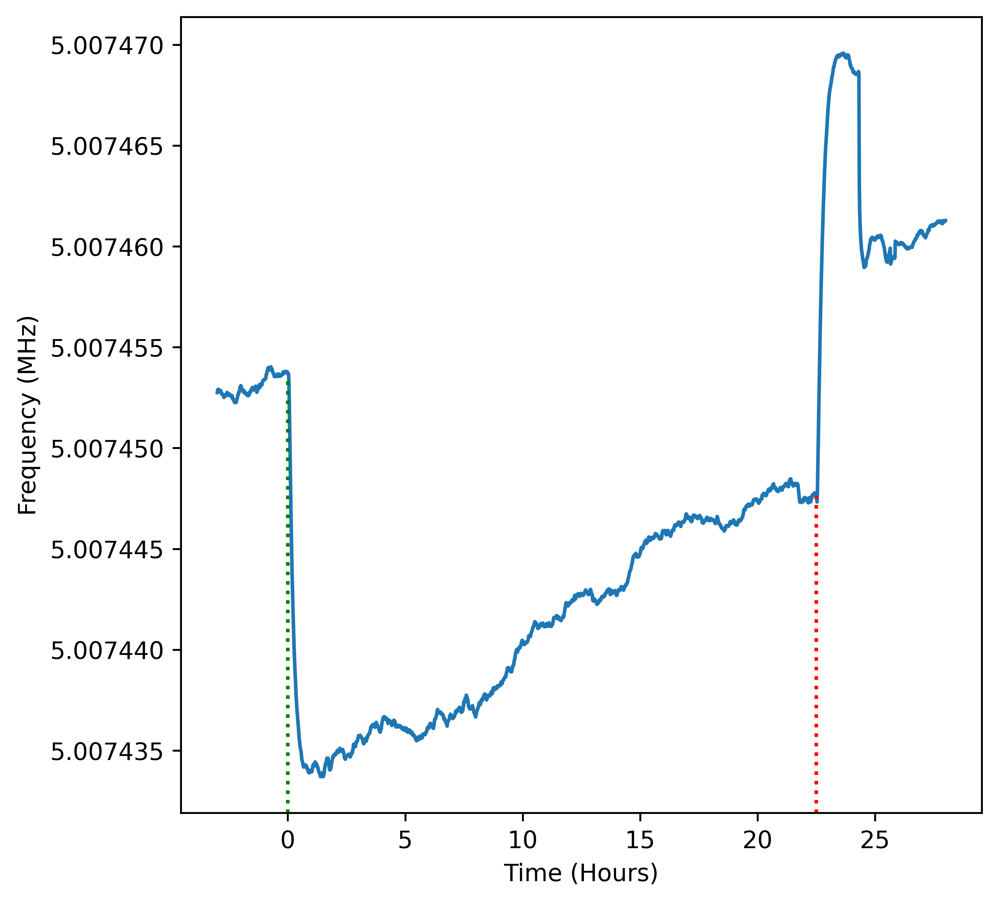

In [40]:
def baseline_plot(path,time_frame,t0):
    data = pd.read_excel(path,header=0,parse_dates=True,usecols=['Time','Untitled'])
    data=data.set_index('Time')
    data.rename(columns = {'Untitled':'A'}, inplace = True)
    #print(data)
    data['A']=data['A'].dropna()
    #print(data['A'])
    #data['A'] = data['A'] - data['A'][1]
    #print(data)
    data= data.asfreq(freq='60s',method='pad')
    roi = data[(data.index > time_frame[0]) & (data.index <= time_frame[1])]
    roi.index = pd.to_timedelta(roi.index - pd.to_datetime(t0))
    new_index = pd.timedelta_range(start='-3hours', end='28hours', freq='1min')
    #(td / np.timedelta64(1, 'D')).astype(int)
    #print(new_index/np.timedelta64(1, 'h').astype(int))
    # Reindex the DataFrame using the new index, filling missing values with NaN
    roi = roi.reindex(new_index,method='ffill',fill_value=pd.NaT)
    num_index = np.linspace(0,1440,num=1441)
    roi = roi.reindex(new_index,method='ffill',fill_value=pd.NaT)
    roi = roi.reindex(new_index)
    #print(roi['A'].values)
    ax.plot(roi['A'].index.total_seconds()/(60*60),roi['A'].values,linewidth=2)
    fmt = lambda x, pos: '{:.6f}'.format(x/1e6, pos)
    ax.yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
    return roi
##254 heat 24h 
path ='data/Special/254_heat.xlsx'

SRFA=baseline_plot(path,['2022-10-13 00:30:30','2022-10-14 20:00:30'],t0='2022-10-13 9:48:00')
fig, axs = plt.subplots(1,1,sharex=True,figsize=(6,6))
axs.plot(SRFA['A'].index.total_seconds()/(60*60),SRFA['A'].values)

fmt = lambda x, pos: '{:.6f}'.format(x/1e6, pos)

axs.yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
axs.axvline(x=0, color='g', linestyle='dotted',ymax=0.55)
axs.axvline(x=22.5, color='r', linestyle='dotted',ymax=0.4)
axs.set_xlabel('Time (Hours)')
axs.set_ylabel('Frequency (MHz)')



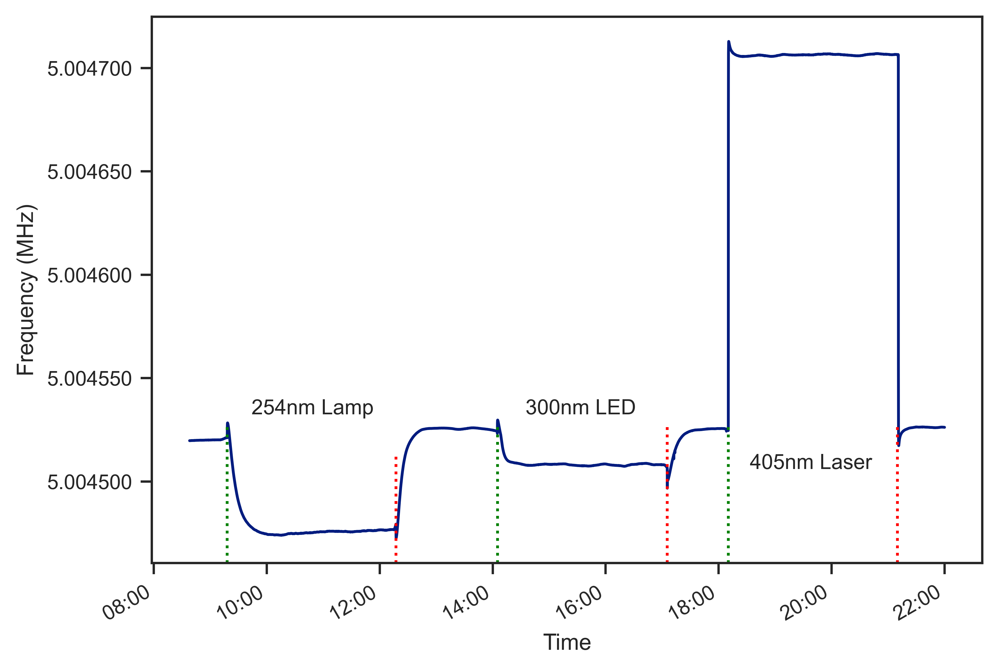

In [6]:
fig, ax = plt.subplots(1,1)
import matplotlib.dates as md
def baseline_plot(path,time_frame):
    data = pd.read_excel(path,header=0,parse_dates=True,usecols=['Time','Untitled'])
    data=data.set_index('Time')
    data.rename(columns = {'Untitled':'A'}, inplace = True)
    data['A']=data['A'].dropna()
    #print(data['A'])
    #data['A'] = data['A'] - data['A'][1]
    #print(data)
    #data= data.asfreq(freq='60s',method='pad')
    roi = data[(data.index > time_frame[0]) & (data.index <= time_frame[1])]

    #(td / np.timedelta64(1, 'D')).astype(int)
    #print(new_index/np.timedelta64(1, 'h').astype(int))
    #print(roi['A'].values)
    roi['A'].plot(ax=ax)
    fmt = lambda x, pos: '{:.6f}'.format(x/1e6, pos)
    ax.yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
    xfmt = md.DateFormatter('%H:%M')
    ax.xaxis.set_major_formatter(xfmt)
    
    ax.text(0.12, 0.3, '254nm Lamp',transform=ax.transAxes, fontsize=9,verticalalignment='top')
    ax.text(0.45, 0.3, '300nm LED',transform=ax.transAxes, fontsize=9,verticalalignment='top')
    ax.text(0.72, 0.2, '405nm Laser',transform=ax.transAxes, fontsize=9,verticalalignment='top')
    ax.axvline(x=pd.to_datetime('8/21/2022 9:18:00'), color='g', linestyle='dotted',ymax=0.25)
    ax.axvline(x=pd.to_datetime('8/21/2022 12:17:23'), color='r', linestyle='dotted',ymax=0.2)
    ax.axvline(x=pd.to_datetime('8/21/2022 14:05:10'), color='g', linestyle='dotted',ymax=0.25)
    ax.axvline(x=pd.to_datetime('8/21/2022 17:05:30'), color='r', linestyle='dotted',ymax=0.25)
    ax.axvline(x=pd.to_datetime('8/21/2022 18:10:10'), color='g', linestyle='dotted',ymax=0.25)
    ax.axvline(x=pd.to_datetime('8/21/2022 21:09:58'), color='r', linestyle='dotted',ymax=0.25)
    ax.set_ylabel('Frequency (MHz)')
    
    return roi
path_response ='data/Special/Blank_Response.xlsx'
SRFA_1=baseline_plot(path_response,['8/21/2022 08:38:00','8/21/2022 22:00:00'])

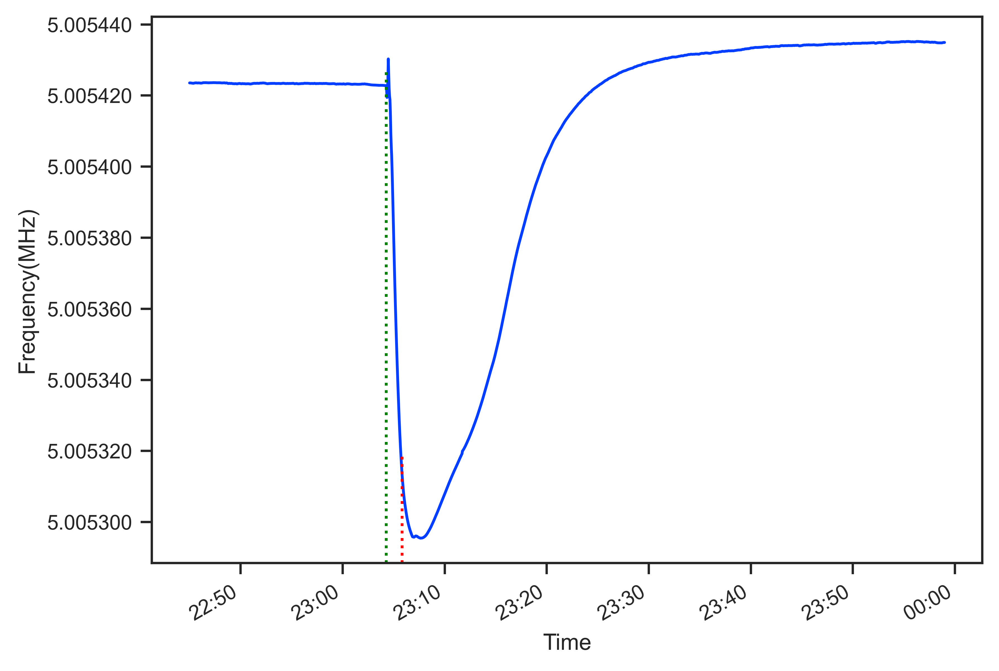

In [37]:
path_heat ='data/Special/FA_Heat.xlsx'
Heat=baseline_plot(path_heat,['3/26/2023 22:45:00','3/26/2023 23:59:00'])
fig, ax = plt.subplots()
Heat['A'].plot(ax=ax)
fmt = lambda x, pos: '{:.6f}'.format(x/1e6, pos)
ax.yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
xfmt = md.DateFormatter('%H:%M')
ax.set_ylabel('Frequency(MHz)')
ax.xaxis.set_major_formatter(xfmt)
ax.axvline(x=pd.to_datetime('3/26/2023 23:04:16'), color='g', linestyle='dotted',ymax=0.9)
ax.axvline(x=pd.to_datetime('3/26/2023 23:05:49'), color='r', linestyle='dotted',ymax=0.2)

/tmp/ipykernel_169020/2193780711.py:81: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[-1.92387832e-02  1.32949198e+02 -7.88261459e-01  4.75792454e+03
  8.08824624e-01]
[[2.69767201e-04            nan 1.75096891e-03            nan
             nan]
 [           nan 2.95772613e+00            nan 1.52977850e+01
  1.76555763e-01]
 [1.75096891e-03            nan 1.24516685e-02            nan
             nan]
 [           nan 1.52977850e+01            nan 9.44197218e+01
  1.09651308e+00]
 [           nan 1.76555763e-01            nan 1.09651308e+00
  1.27383879e-02]]


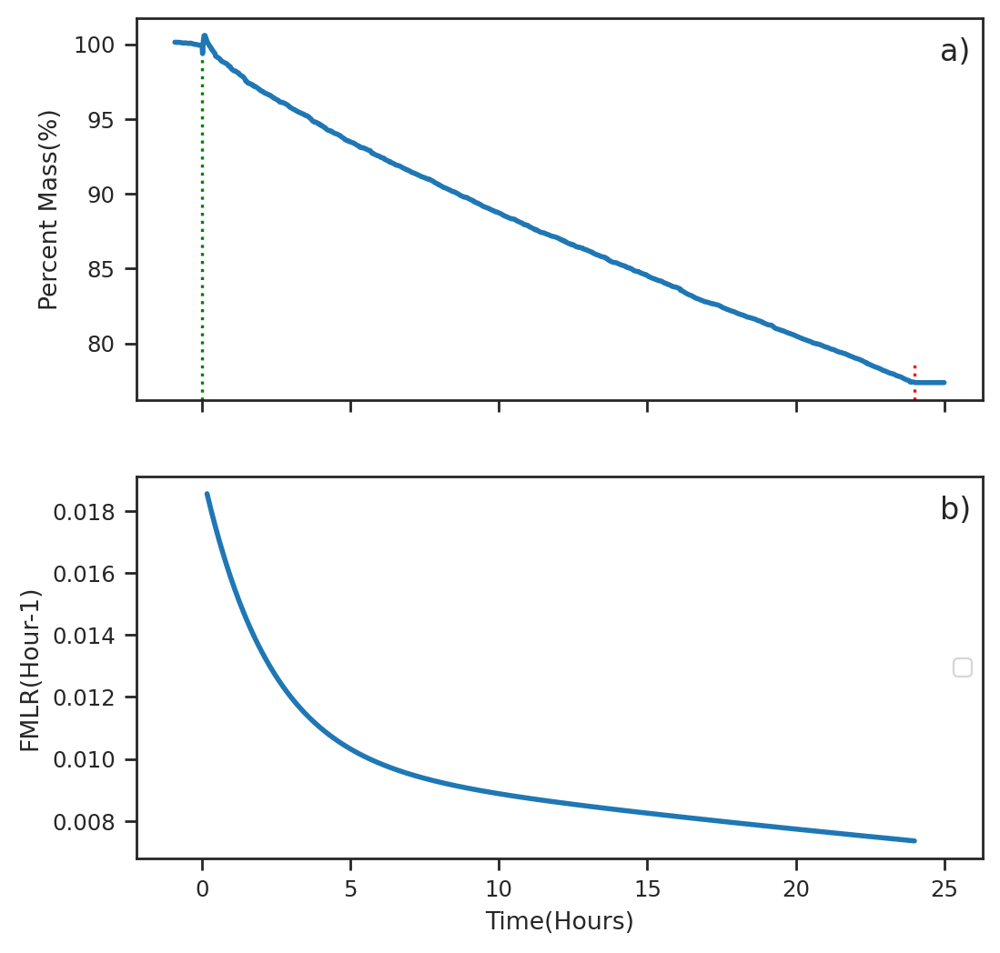

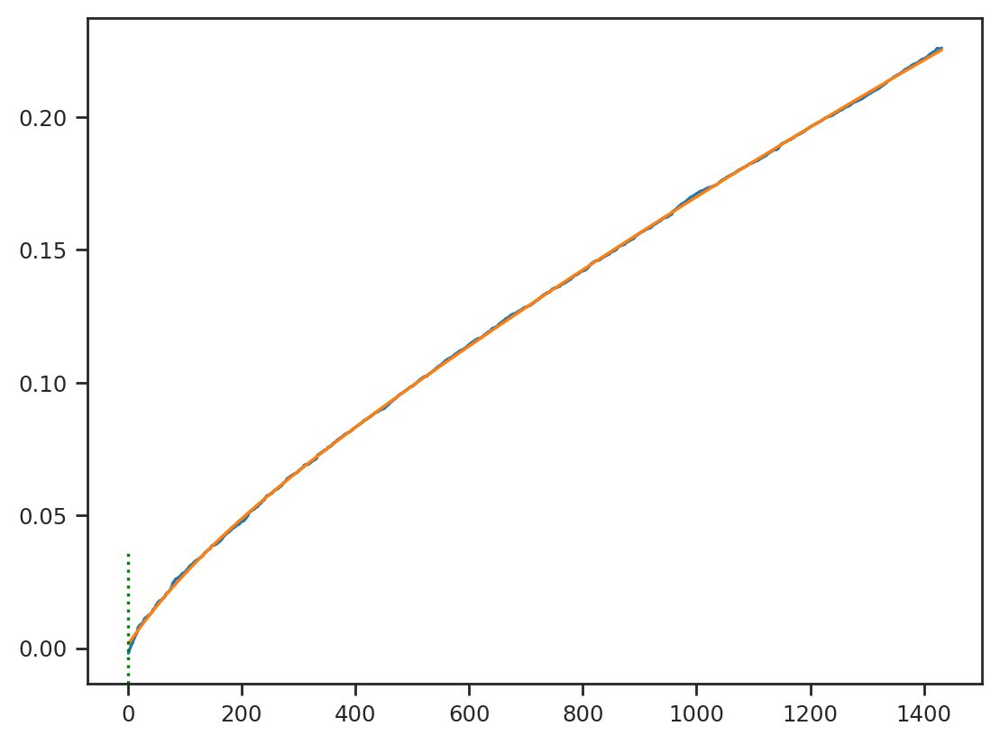

In [4]:
path_1 = 'data/SRHA_Air/2_25_305_254_3_C_D/A.xlsx'
_= qcm_to_speed_plot(path_1,t0='02/25/2023 20:05:18',f0=4999805.24,f1=4998373.676,fit_time=('2/25/2023 20:15:00','2/26/2023 20:06:00'),time_frame=['2/25/2023 19:09:00','2/26/2023 20:06:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2023-02-25 19:09:24.981  5.005433e+06
2023-02-25 19:10:24.981  5.005433e+06
2023-02-25 19:11:24.981  5.005434e+06
2023-02-25 19:12:24.981  5.005434e+06
2023-02-25 19:13:24.981  5.005434e+06
...                               ...
2023-02-26 20:01:24.981  5.005953e+06
2023-02-26 20:02:24.981  5.005953e+06
2023-02-26 20:03:24.981  5.005954e+06
2023-02-26 20:04:24.981  5.005954e+06
2023-02-26 20:05:24.981  5.005954e+06

[1497 rows x 1 columns]
Loading 1492.7819999996573
[-6.17495291e-01  1.45226656e+03  5.77012659e-01]
[[1.62132640e-03            nan            nan]
 [           nan 6.48218306e+00 1.06017907e-01]
 [           nan 1.06017907e-01 1.74845688e-03]]
top speed: 0.02549409016803803 end speed: 0.009635794786911126


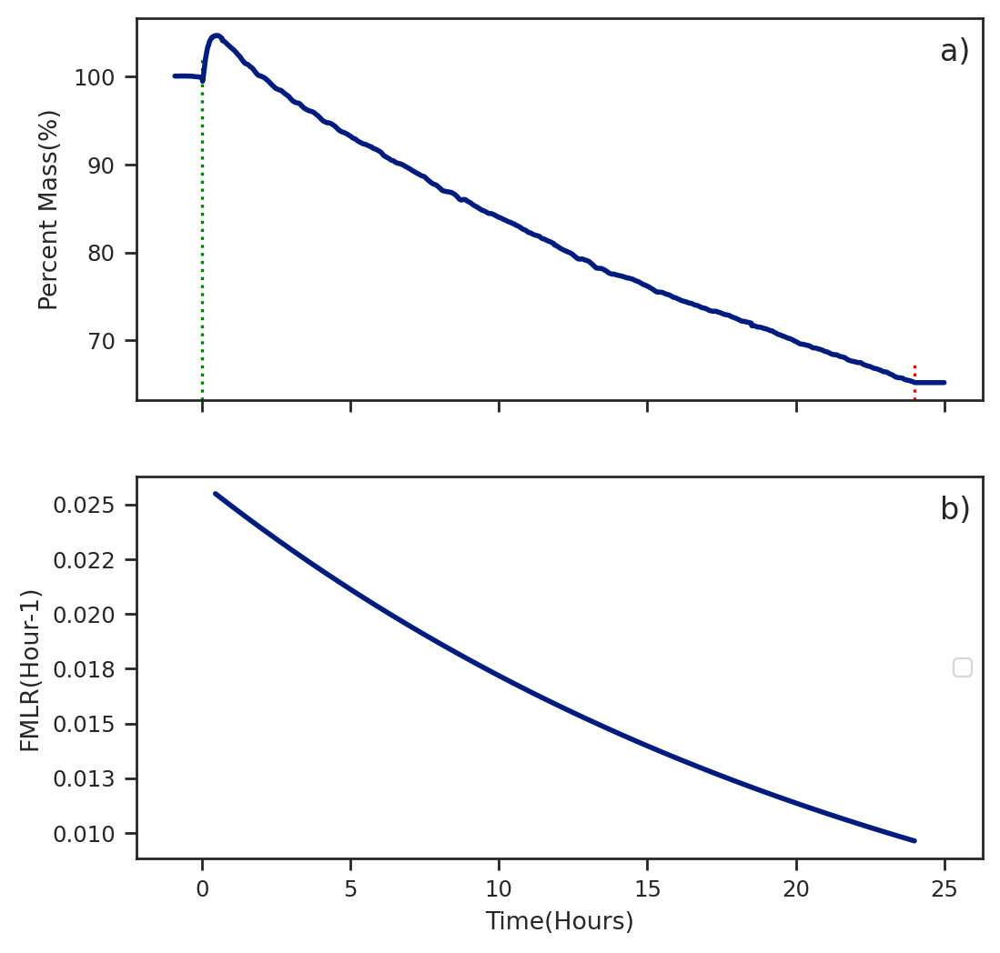

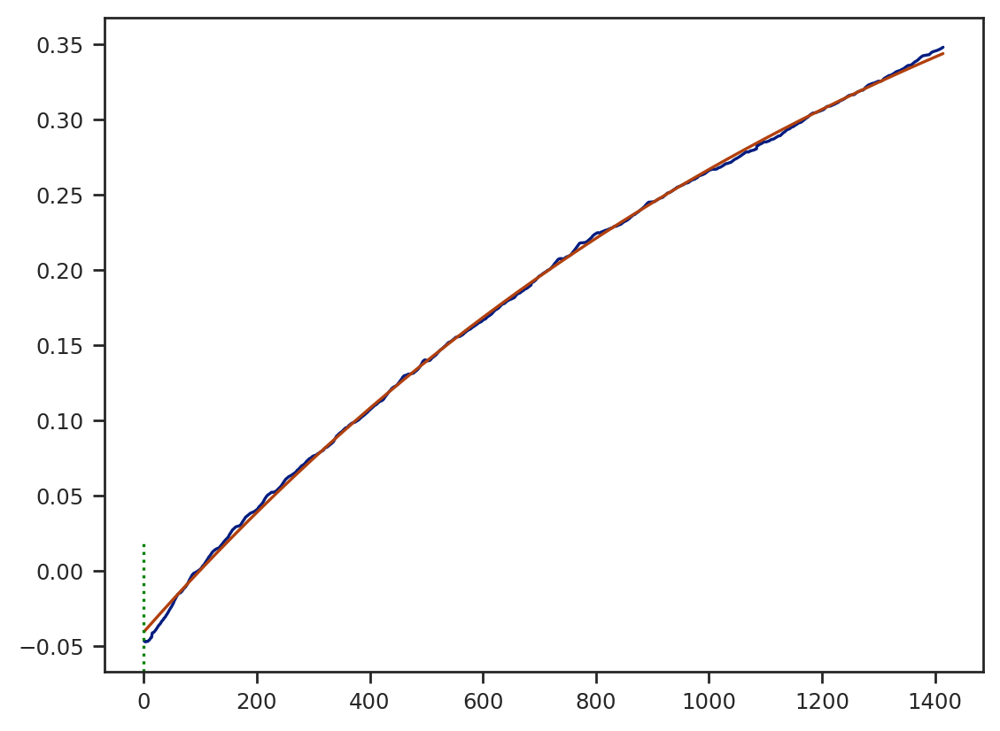

In [120]:
path_1 = 'data/SRHA_Air/2_25_305_254_3_C_D/B.xlsx'
_= qcm_to_speed_plot(path_1,t0='02/25/2023 20:05:18',f0=5006927.356,f1=5005434.574,fit_time=('2/25/2023 20:32:00','2/26/2023 20:06:00'),time_frame=['2/25/2023 19:09:00','2/26/2023 20:06:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2023-02-27 09:56:21.508  5.009452e+06
2023-02-27 09:57:21.508  5.009452e+06
2023-02-27 09:58:21.508  5.009452e+06
2023-02-27 09:59:21.508  5.009452e+06
2023-02-27 10:00:21.508  5.009452e+06
...                               ...
2023-02-28 16:15:21.508  5.010142e+06
2023-02-28 16:16:21.508  5.010142e+06
2023-02-28 16:17:21.508  5.010142e+06
2023-02-28 16:18:21.508  5.010142e+06
2023-02-28 16:19:21.508  5.010142e+06

[1824 rows x 1 columns]
Loading 1702.9150000000373
[-5.89587309e-01  1.46871774e+03  5.48994465e-01]
[[2.43647513e-03            nan            nan]
 [           nan 1.02570554e+01 1.63378587e-01]
 [           nan 1.63378587e-01 2.62365145e-03]]
top speed: 0.024069404239050803 end speed: 0.009190744533784535


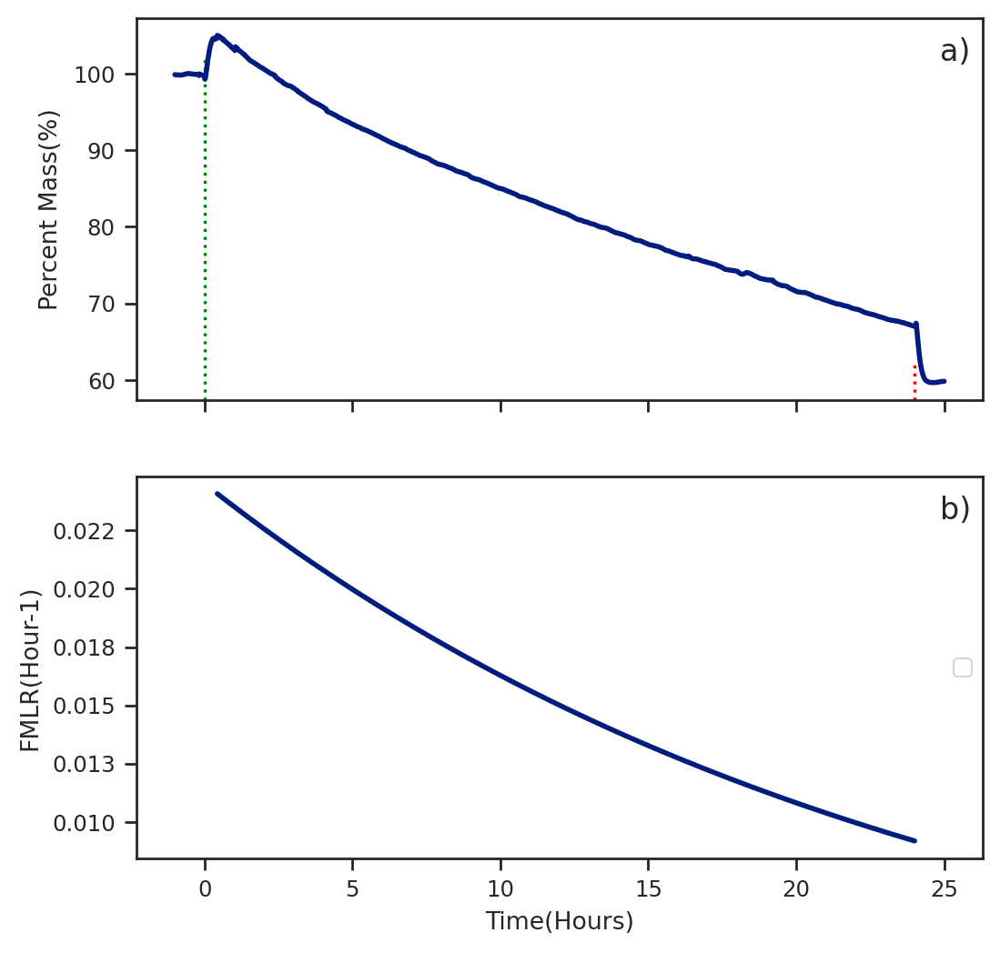

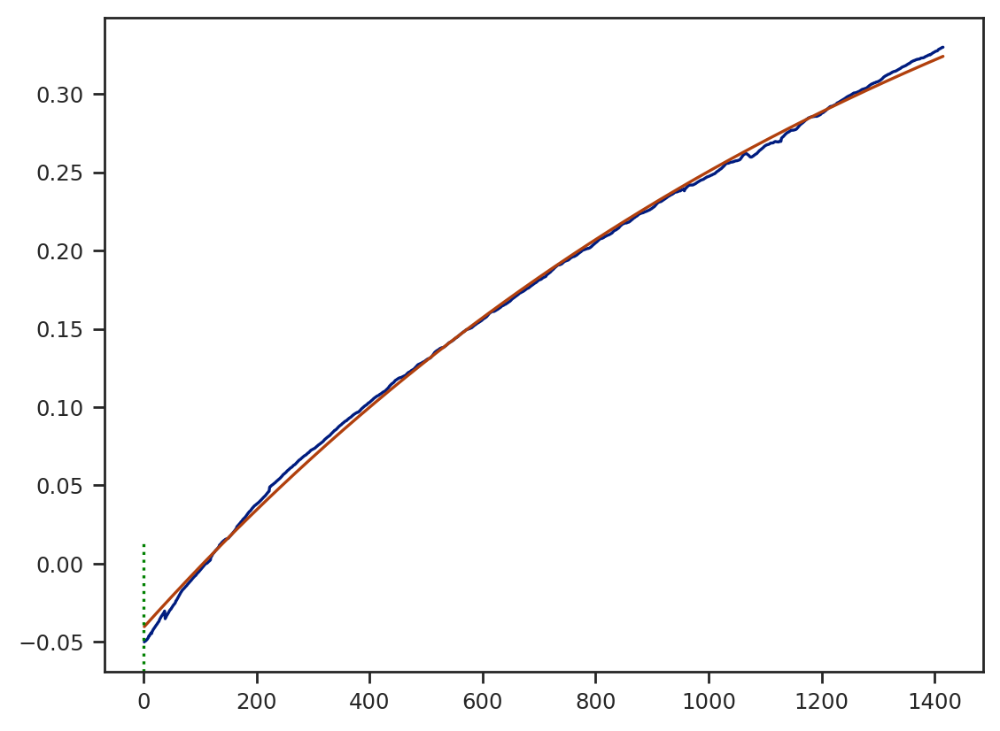

In [119]:
path_1 = './data/SRHA_Air/2_27_405_254_3_A_B/B.xlsx'
_ =qcm_to_speed_plot(path_1,t0='2/27/2023 15:11:00',f0=5011161.309,f1=5009458.394,time_frame=['2/27/2023 9:55:23','2/28/2023 16:20:17'],fit_time=('2/27/2023 15:36:15','2/28/2023 15:11:00'))

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2023-03-03 12:50:05.147  5.009051e+06
2023-03-03 12:51:05.147  5.009051e+06
2023-03-03 12:52:05.147  5.009051e+06
2023-03-03 12:53:05.147  5.009051e+06
2023-03-03 12:54:05.147  5.009051e+06
...                               ...
2023-03-04 22:04:05.147  5.009758e+06
2023-03-04 22:05:05.147  5.009758e+06
2023-03-04 22:06:05.147  5.009758e+06
2023-03-04 22:07:05.147  5.009758e+06
2023-03-04 22:08:05.147  5.009757e+06

[1999 rows x 1 columns]
Loading 2006.1830000001937
[-4.88833725e-01  1.48248544e+03  4.65554781e-01]
[[2.01357863e-03            nan            nan]
 [           nan 1.02505308e+01 1.48368947e-01]
 [           nan 1.48368947e-01 2.16465768e-03]]
top speed: 0.019771017703483423 end speed: 0.007637815613299725


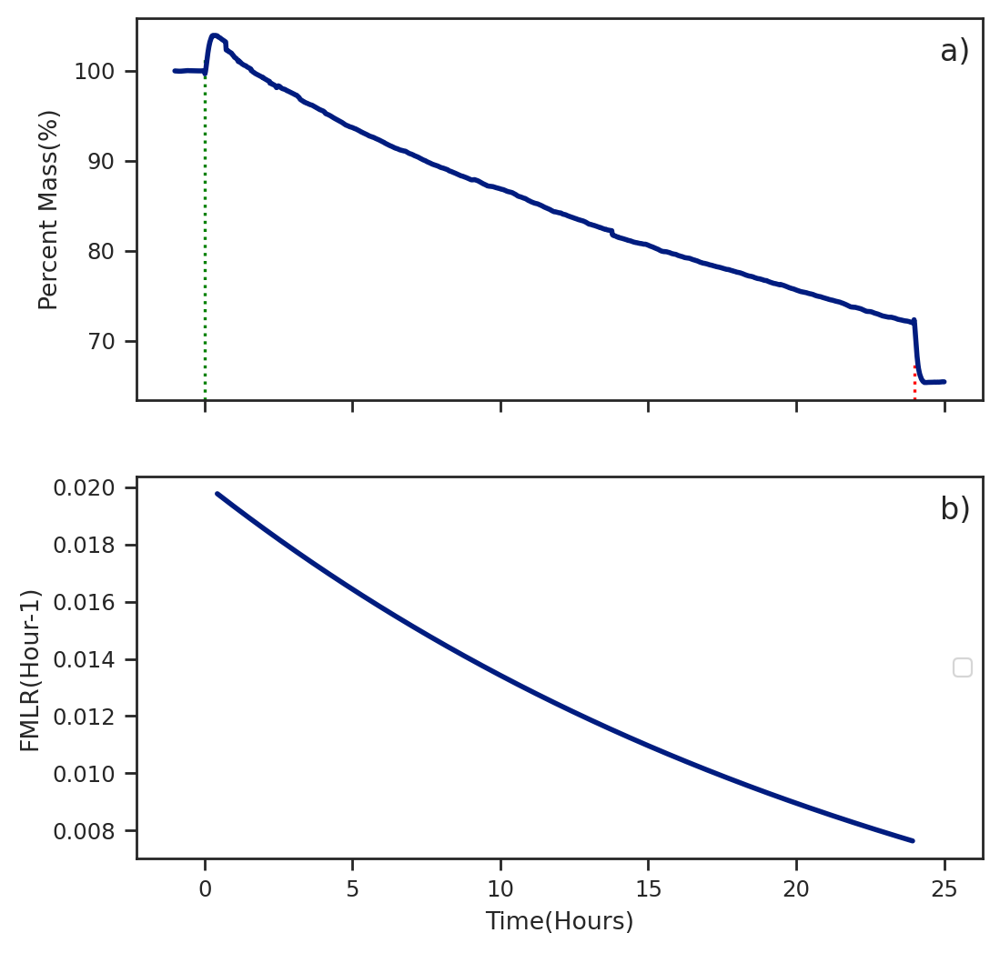

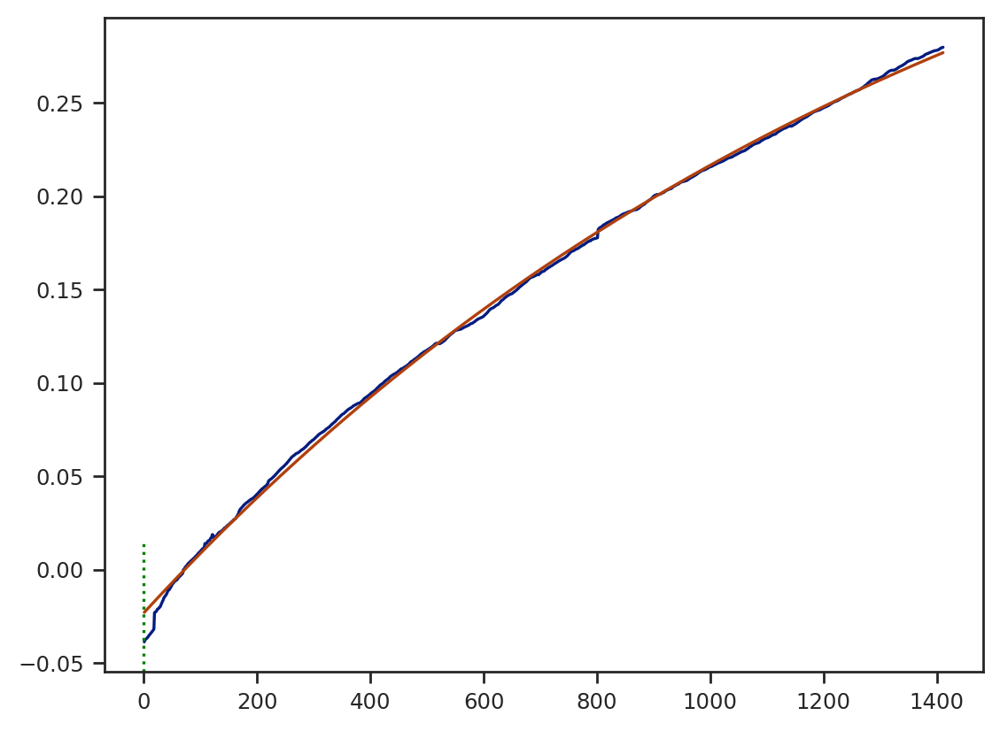

In [118]:
path_1 = './data/SRHA_Air/3_3_405_254_3_A_B/B.xlsx'
_ =qcm_to_speed_plot(path_1,t0='3/3/2023 21:12:27',f0=5011070.398,f1=5009064.215,time_frame=['3/3/2023 12:50:00','3/4/2023  10:08:46 PM'],fit_time=['3/3/2023 21:38:09','3/4/2023  21:09:24'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2023-02-23 14:00:34.043  5.009058e+06
2023-02-23 14:01:34.043  5.009058e+06
2023-02-23 14:02:34.043  5.009058e+06
2023-02-23 14:03:34.043  5.009058e+06
2023-02-23 14:04:34.043  5.009058e+06
...                               ...
2023-02-24 16:37:34.043  5.009452e+06
2023-02-24 16:38:34.043  5.009452e+06
2023-02-24 16:39:34.043  5.009452e+06
2023-02-24 16:40:34.043  5.009452e+06
2023-02-24 16:41:34.043  5.009452e+06

[1602 rows x 1 columns]
Loading 1956.1460000006482
[-3.46189334e-01  1.87301943e+03  3.10993260e-01]
[[1.36029878e-03            nan            nan]
 [           nan 1.10315770e+01 1.25068886e-01]
 [           nan 1.25068886e-01 1.42491679e-03]]
top speed: 0.011083853679242832 end speed: 0.005215455604956334


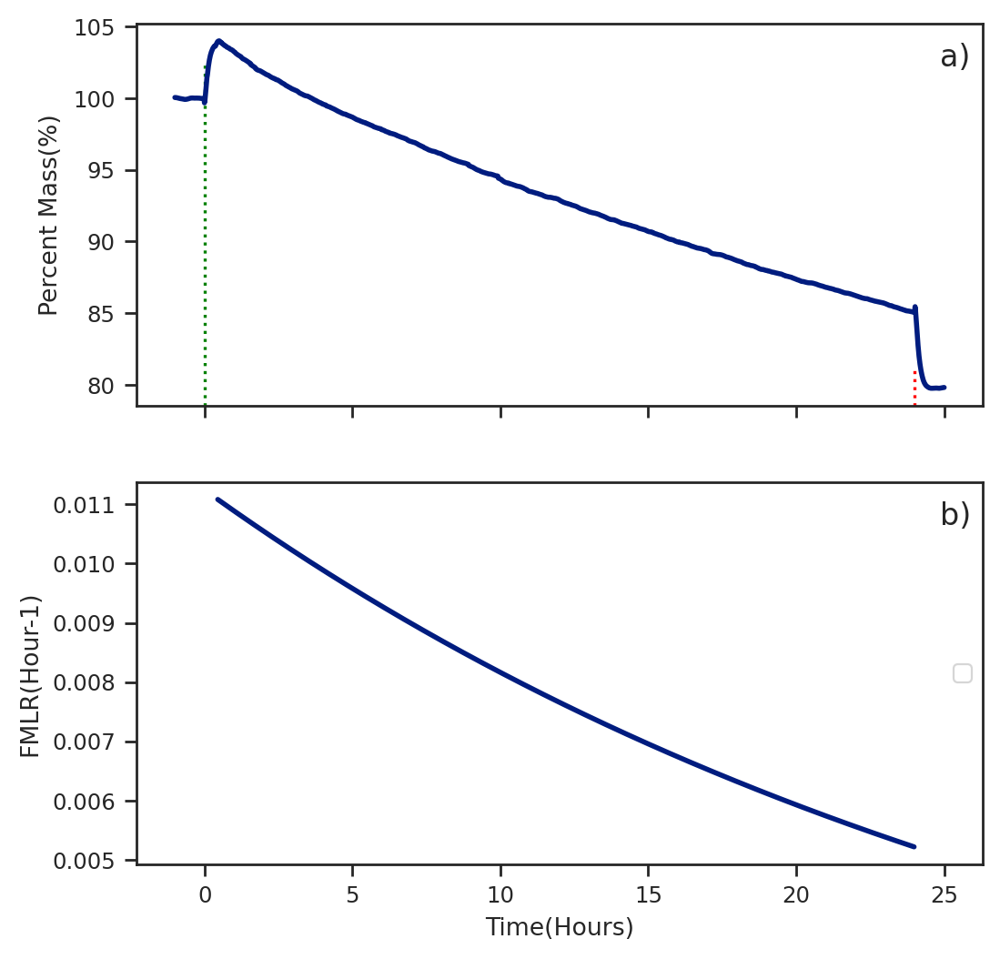

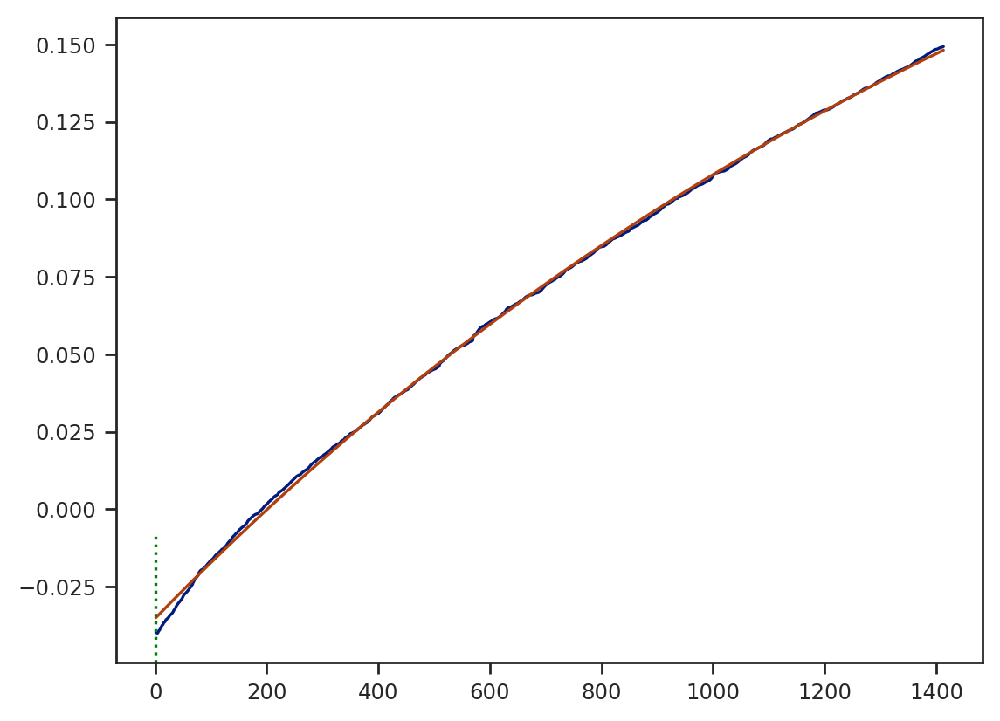

In [117]:
path_1 = './data/SRHA_Air/2_23_254_305_3_A_B/B.xlsx'
_=qcm_to_speed_plot(path_1,t0='02/23/2023 15:09:00',f0=5011014.656,f1=5009058.51,time_frame=['02/23/2023 14:00:00','2/24/2023 16:42:25'],fit_time=['02/23/2023 15:35:00','2/24/2023 15:8:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2023-02-25 11:41:26.293  4.998317e+06
2023-02-25 11:42:26.293  4.998317e+06
2023-02-25 11:43:26.293  4.998318e+06
2023-02-25 11:44:26.293  4.998318e+06
2023-02-25 11:45:26.293  4.998318e+06
...                               ...
2023-02-26 21:29:26.293  4.998720e+06
2023-02-26 21:30:26.293  4.998720e+06
2023-02-26 21:31:26.293  4.998720e+06
2023-02-26 21:32:26.293  4.998720e+06
2023-02-26 21:33:26.293  4.998720e+06

[2033 rows x 1 columns]
Loading 1431.5640000002459
[-4.81799899e-01  2.41897374e+03  4.89172762e-01]
[[3.53119343e-03            nan            nan]
 [           nan 2.43202984e+01 2.96937014e-01]
 [           nan 2.96937014e-01 3.63644282e-03]]
top speed: 0.011945580653950572 end speed: 0.0065786359659441435


ValueError: too many values to unpack (expected 2)

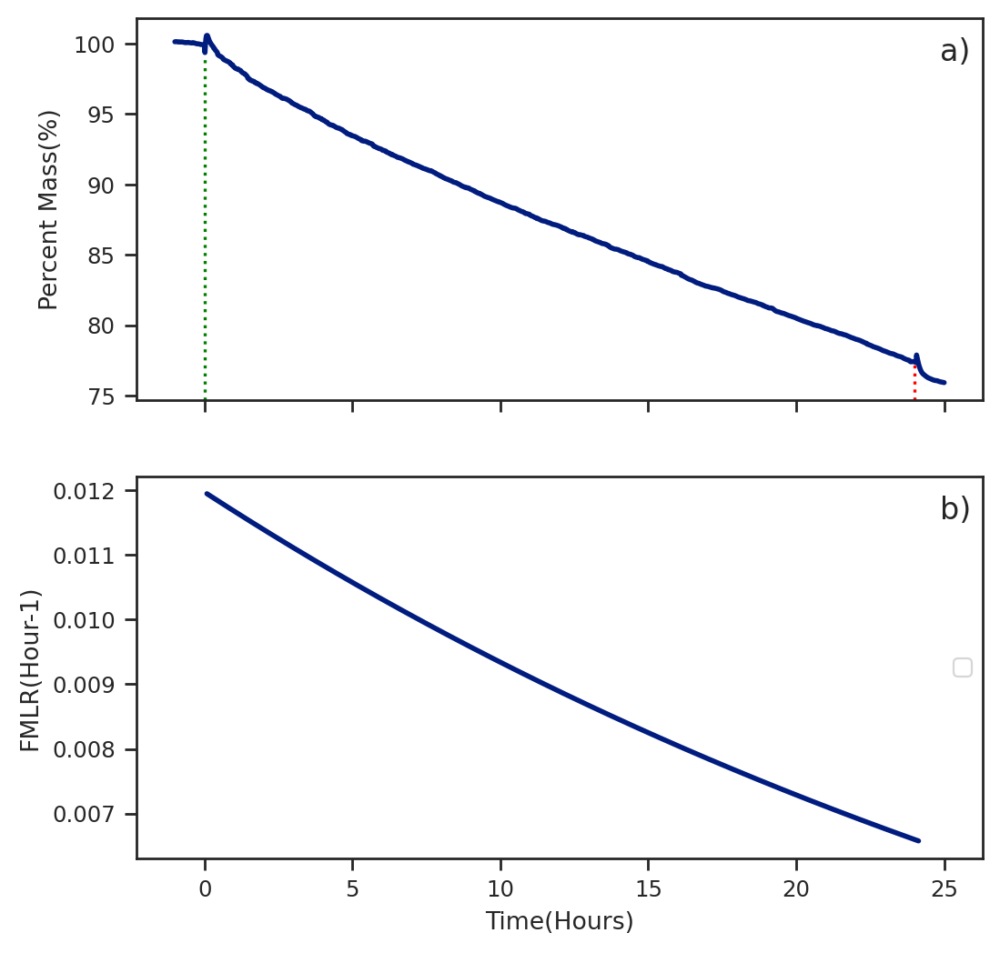

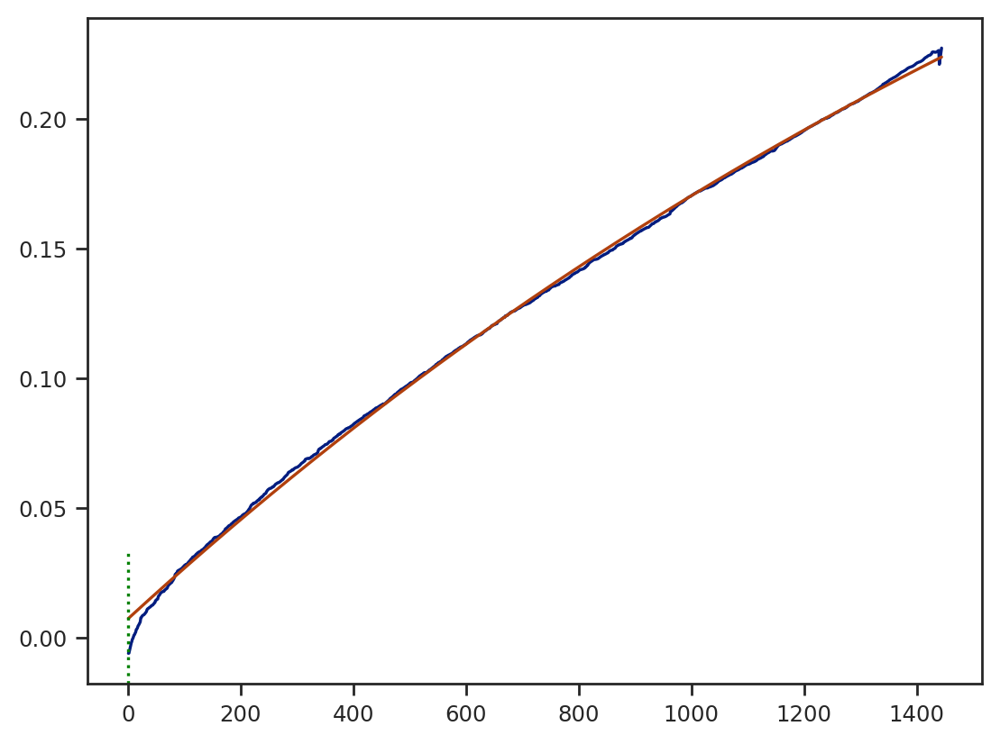

In [116]:
path_1 = './data/SRHA_Air/2_25_305_254_3_C_D/A.xlsx'
diff,baseline =qcm_to_speed_plot(path_1,t0='2/25/2023 20:05:00',f0=4999805.24,f1=4998373.676,time_frame=['2/25/2023 11:41:24','2/26/2023 21:34:25'],fit_time=['2/25/2023 20:09:00','2/26/2023 20:13:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2023-03-01 10:46:22.450  5.005399e+06
2023-03-01 10:47:22.450  5.005426e+06
2023-03-01 10:48:22.450  5.005444e+06
2023-03-01 10:49:22.450  5.005452e+06
2023-03-01 10:50:22.450  5.005460e+06
...                               ...
2023-03-02 22:59:22.450  5.005867e+06
2023-03-02 23:00:22.450  5.005867e+06
2023-03-02 23:01:22.450  5.005867e+06
2023-03-02 23:02:22.450  5.005867e+06
2023-03-02 23:03:22.450  5.005867e+06

[2178 rows x 1 columns]
Loading 1665.7400000002235
[-5.19135123e-01  3.06276737e+03  4.87551910e-01]
[[5.00575040e-03            nan            nan]
 [           nan 3.76282915e+01 4.37480565e-01]
 [           nan 4.37480565e-01 5.09552292e-03]]
top speed: 0.010166602722731207 end speed: 0.006401002507328911


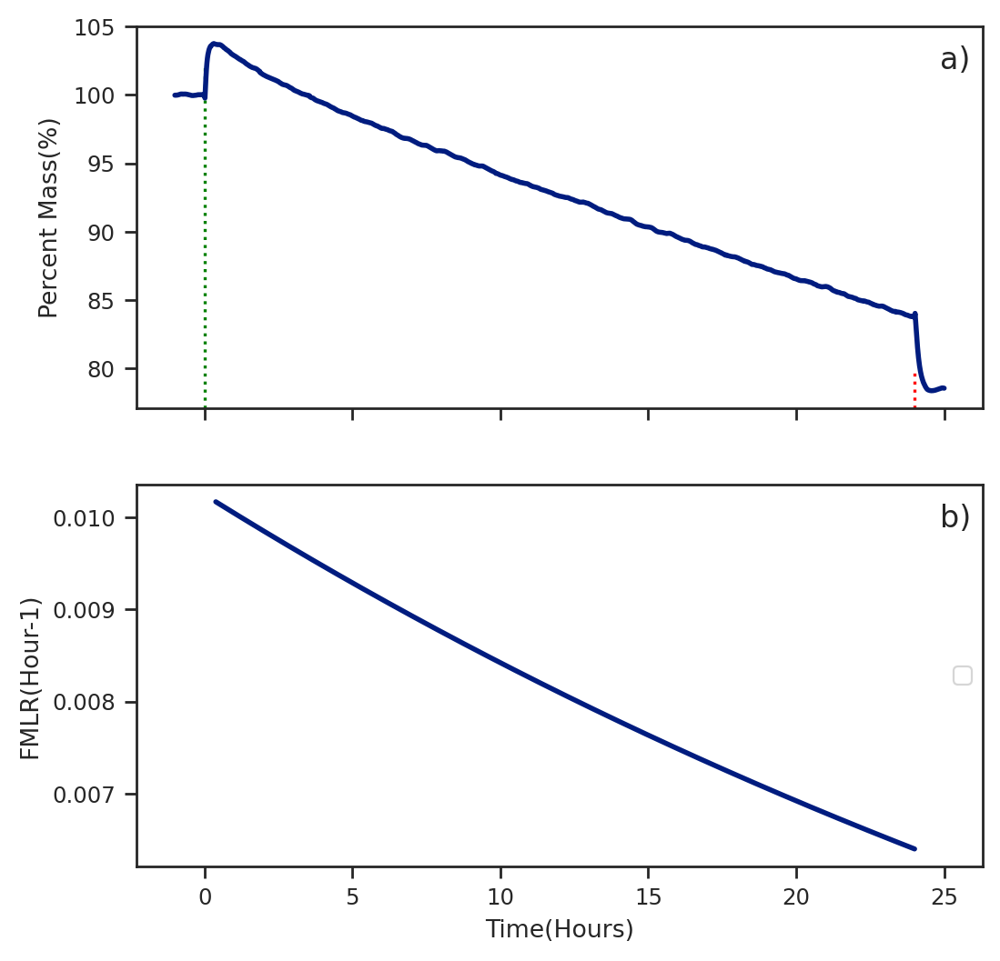

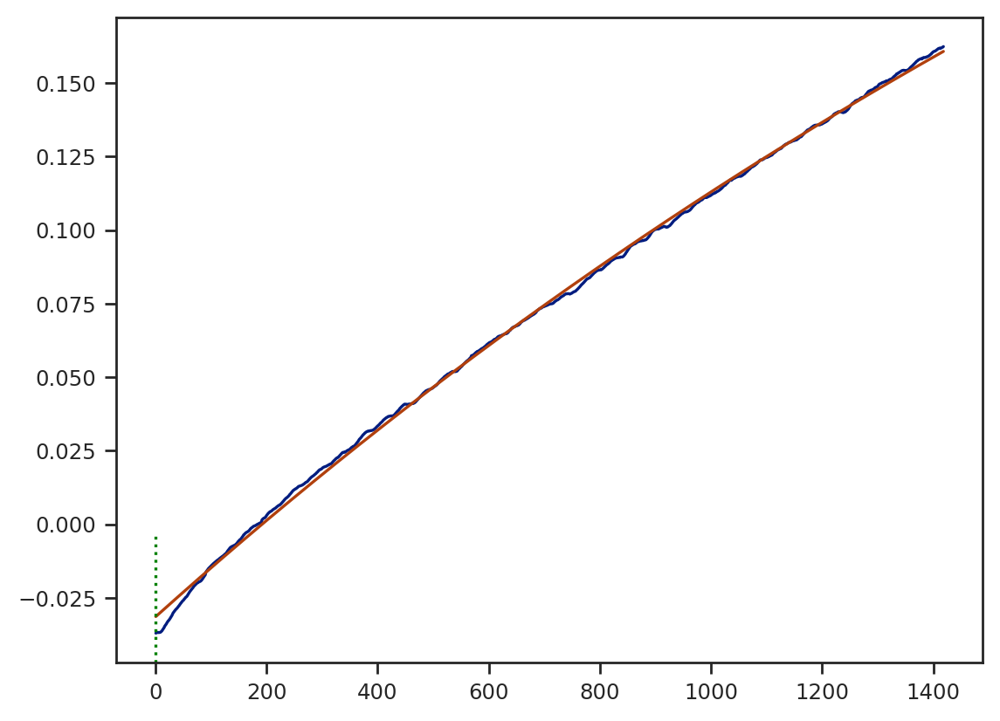

In [115]:
path_1 = './data/SRHA_Air/3_1_405_305_3_C_D/B.xlsx'
_ =qcm_to_speed_plot(path_1,t0='3/1/2023 22:02:00',f0=5007175.745,f1=5005510.005,time_frame=['3/1/2023 10:46:21','3/2/2023 23:03:44'],fit_time=['3/1/2023 22:24:00','3/2/2023 22:02:0'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2023-03-03 12:50:06.441  5.008652e+06
2023-03-03 12:51:06.441  5.008652e+06
2023-03-03 12:52:06.441  5.008652e+06
2023-03-03 12:53:06.441  5.008652e+06
2023-03-03 12:54:06.441  5.008653e+06
...                               ...
2023-03-04 22:04:06.441  5.008857e+06
2023-03-04 22:05:06.441  5.008857e+06
2023-03-04 22:06:06.441  5.008857e+06
2023-03-04 22:07:06.441  5.008857e+06
2023-03-04 22:08:06.441  5.008857e+06

[1999 rows x 1 columns]
Loading 2159.94000000041
[-1.20494365e-01  1.56673926e+03  2.23945784e-01]
[[9.53272384e-04            nan            nan]
 [           nan 2.03798769e+01 1.43625468e-01]
 [           nan 1.43625468e-01 1.01963493e-03]]
top speed: 0.004611519657861139 end speed: 0.0018464792307801051


ValueError: too many values to unpack (expected 2)

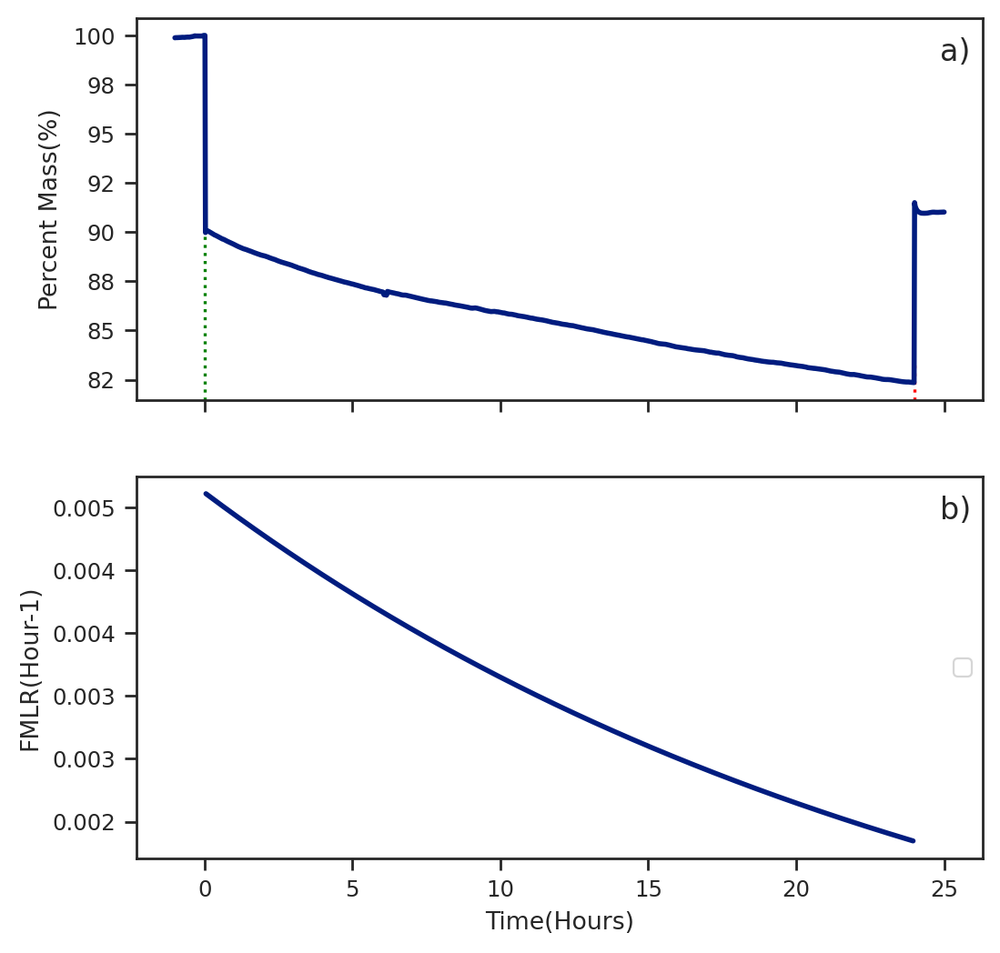

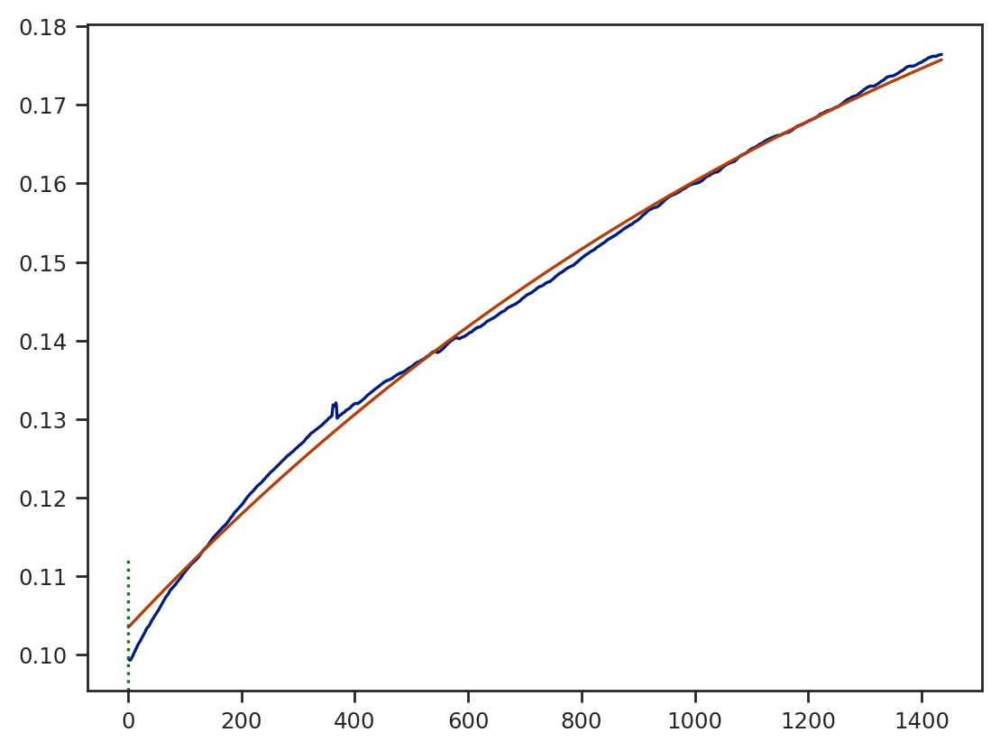

In [114]:
path_1 = './data/SRHA_Air/3_3_405_254_3_A_B/A.xlsx'
diff,baseline =qcm_to_speed_plot(path_1,t0='3/3/2023 21:11:49',f0=5010822.949,f1=5008663.009,time_frame=['3/3/2023 12:50:00','3/4/2023  10:08:46 PM'],fit_time=['3/3/2023 21:14:00','3/4/2023  21:09:00'])

/tmp/ipykernel_238543/929660577.py:81: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 653.4460000004619
[-4.67104109e-01  6.09216296e+03  8.69033535e-01]
[[4.12920809e-02            nan            nan]
 [           nan 6.07804051e+02 5.02023573e+00]
 [           nan 5.02023573e+00 4.14846312e-02]]
top speed: 0.004599621964693761 end speed: 0.0036325437391245452


ValueError: too many values to unpack (expected 2)

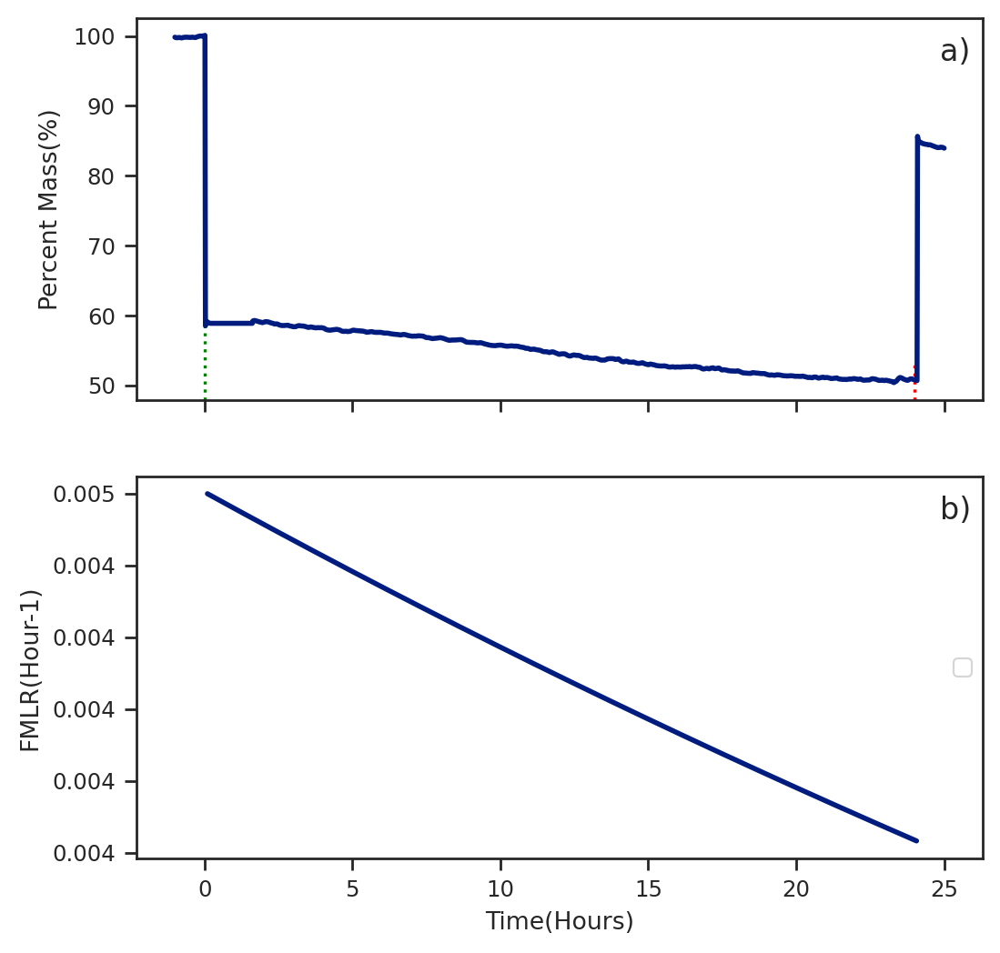

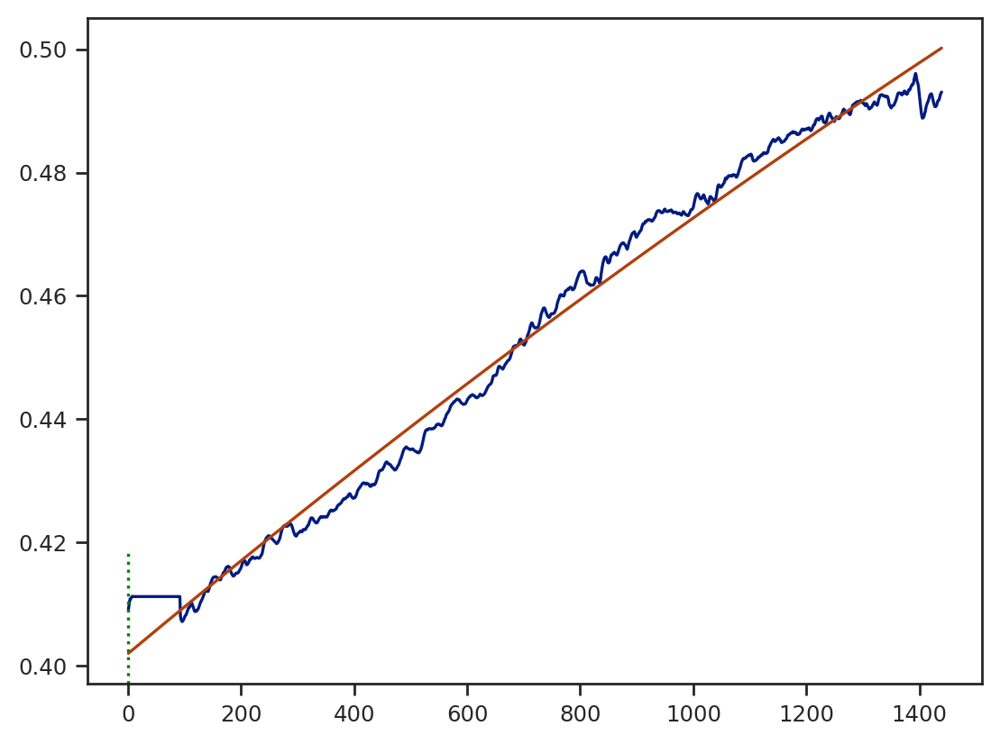

In [111]:
path_1 = 'data/SRHA_Air/3_20_SRHA_405_254_5_A_B/A.xlsx'
diff,baseline =qcm_to_speed_plot(path_1,t0='3/21/2023 10:02:0',f0=4999943.372,f1=4999289.926,time_frame=['3/20/2023 21:34:24','3/22/2023  11:13:32 AM'],fit_time=['3/21/2023 10:07:0','3/22/2023  10:06:00'])

/tmp/ipykernel_238543/929660577.py:81: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 9846.533999999985
[-1.71028768e-01  1.75039132e+03  2.11838721e-01]
[[9.04220846e-04            nan            nan]
 [           nan 1.42954649e+01 1.16411968e-01]
 [           nan 1.16411968e-01 9.53334279e-04]]
top speed: 0.0058591842312505854 end speed: 0.0026151818158621715


ValueError: too many values to unpack (expected 2)

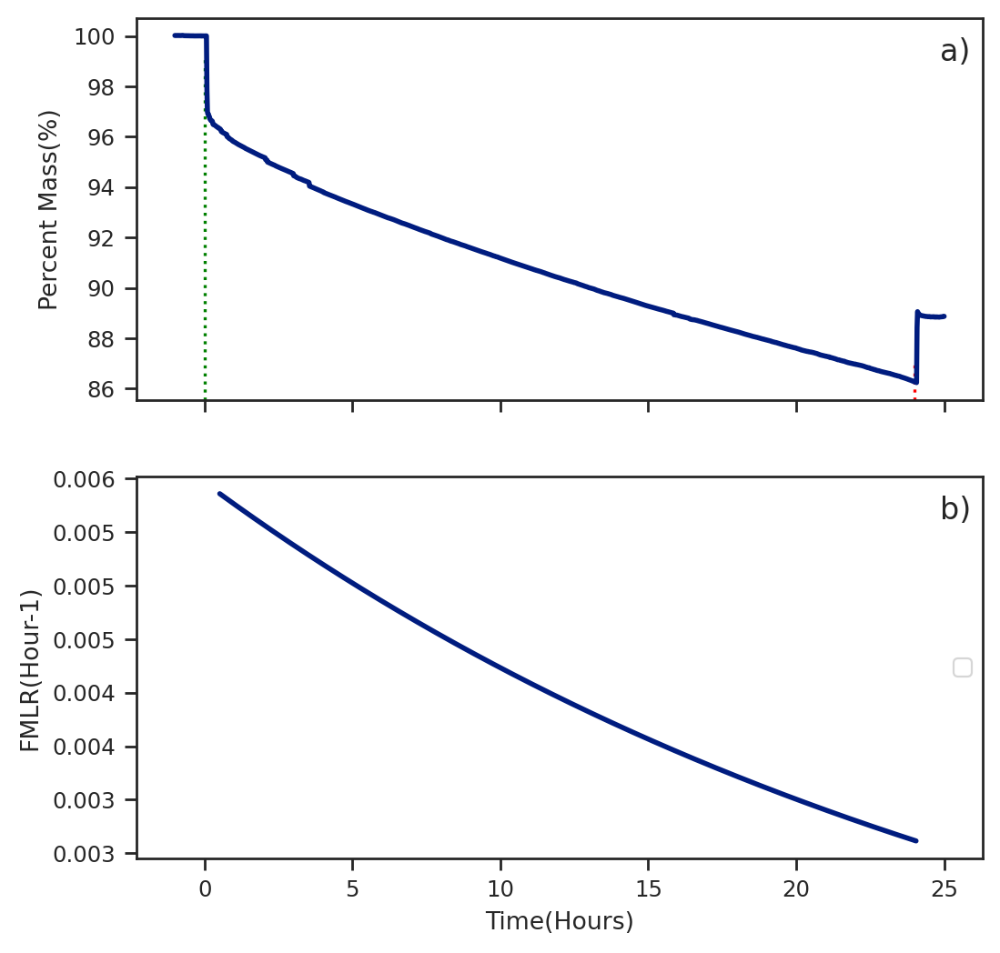

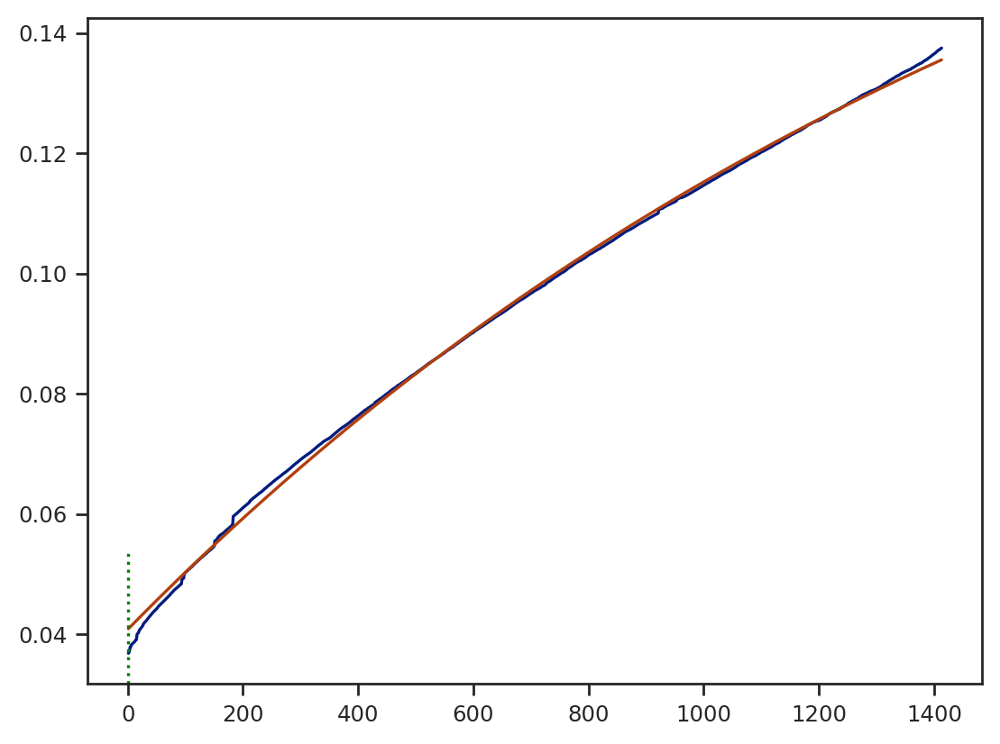

In [110]:
path_1 = 'data/SRHA_Air/4_14_SRHA_405_305_3A_3B/A.xlsx'
diff,baseline =qcm_to_speed_plot(path_1,t0='4/15/2023 20:59:31',f0=5010419,f1=5000572.466,time_frame=['4/15/2023 19:00:00','4/16/2023  22:10:0'],fit_time=['4/15/2023 21:30:00','4/16/2023  21:03:0'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2023-03-15 11:48:03.990  5.003734e+06
2023-03-15 11:49:03.990  5.003734e+06
2023-03-15 11:50:03.990  5.003735e+06
2023-03-15 11:51:03.990  5.003735e+06
2023-03-15 11:52:03.990  5.003735e+06
...                               ...
2023-03-16 17:18:03.990  5.004718e+06
2023-03-16 17:19:03.990  5.004718e+06
2023-03-16 17:20:03.990  5.004718e+06
2023-03-16 17:21:03.990  5.004718e+06
2023-03-16 17:22:03.990  5.004718e+06

[1775 rows x 1 columns]
Loading 2068.8790000006557
[-6.55878772e-01  1.33009645e+03  6.54671305e-01]
[[1.21046911e-03            nan            nan]
 [           nan 4.38715608e+00 7.57850801e-02]
 [           nan 7.57850801e-02 1.32224287e-03]]
top speed: 0.029564135051885862 end speed: 0.010249616577064628


ValueError: too many values to unpack (expected 2)

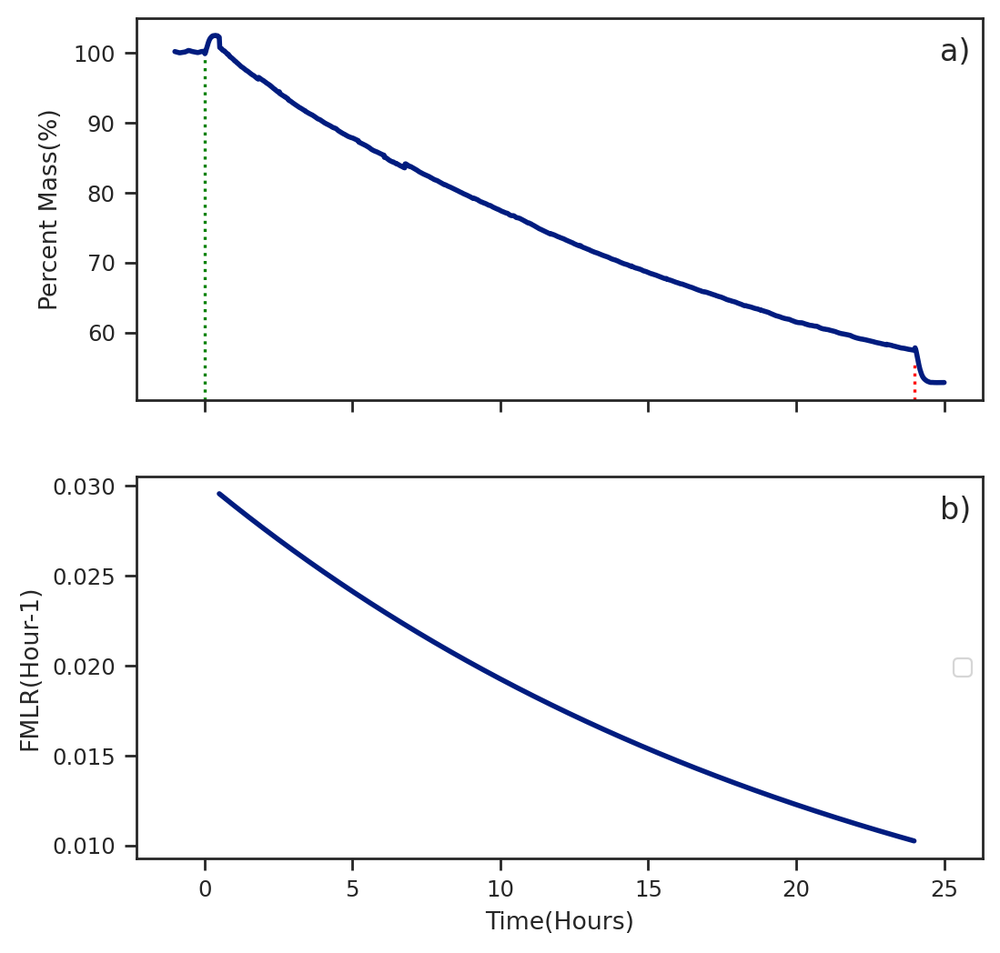

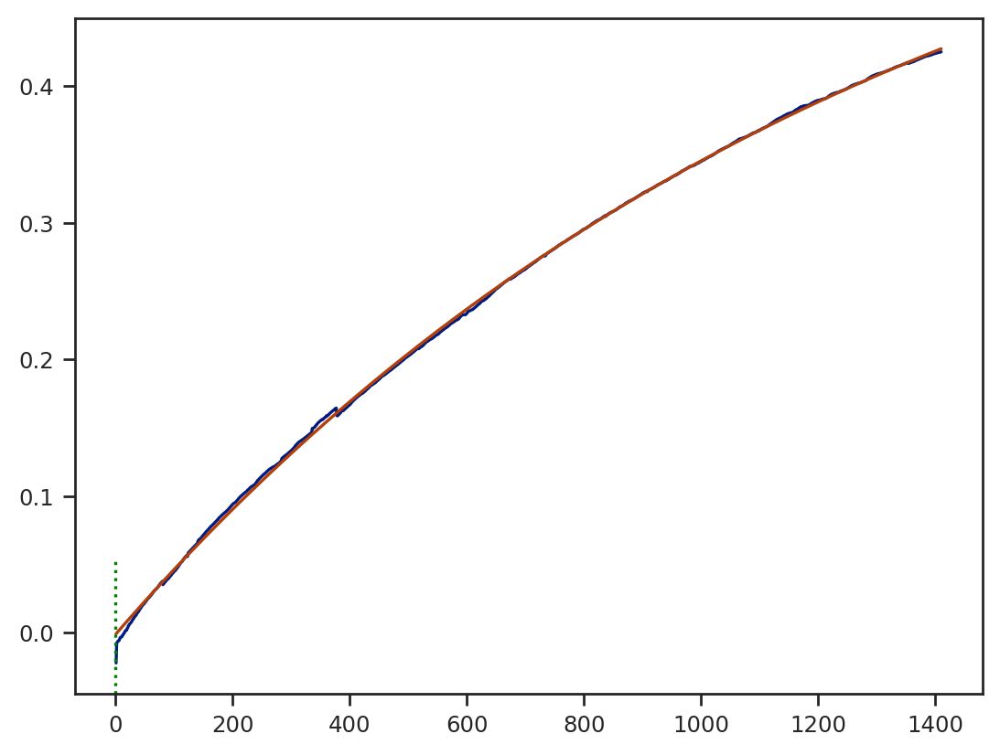

In [122]:
Path = 'data/SRFA_AIR/3_15_405_254_2_C_D/B.xlsx'
_,_=qcm_to_speed_plot(Path,t0='3/15/2023 15:05:36',f0=5005813.843,f1=5003744.964,time_frame=('3/15/2023  11:48:03 AM','3/16/2023 5:22:47 PM'),fit_time=('3/15/2023  15:35:03','3/16/2023 15:05:00'))

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2023-03-18 10:04:20.264  5.003802e+06
2023-03-18 10:05:20.264  5.003802e+06
2023-03-18 10:06:20.264  5.003802e+06
2023-03-18 10:07:20.264  5.003803e+06
2023-03-18 10:08:20.264  5.003803e+06
...                               ...
2023-03-20 10:05:20.264  5.004683e+06
2023-03-20 10:06:20.264  5.004683e+06
2023-03-20 10:07:20.264  5.004683e+06
2023-03-20 10:08:20.264  5.004683e+06
2023-03-20 10:09:20.264  5.004683e+06

[2886 rows x 1 columns]
Loading 1825.734999999404
[-7.17089027e-01  1.45159890e+03  7.06769649e-01]
[[1.30787811e-03            nan            nan]
 [           nan 4.53964730e+00 7.97607899e-02]
 [           nan 7.97607899e-02 1.41348707e-03]]
top speed: 0.02961955378960157 end speed: 0.011029335107759284


ValueError: too many values to unpack (expected 2)

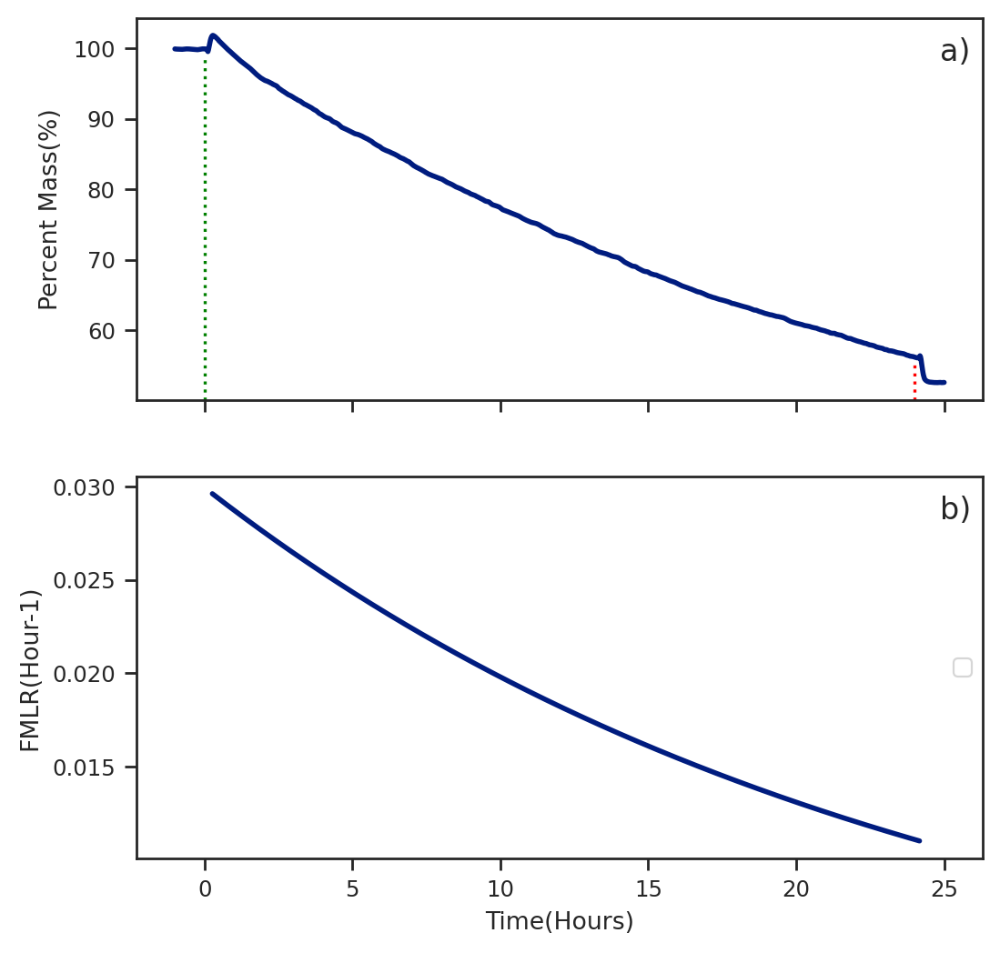

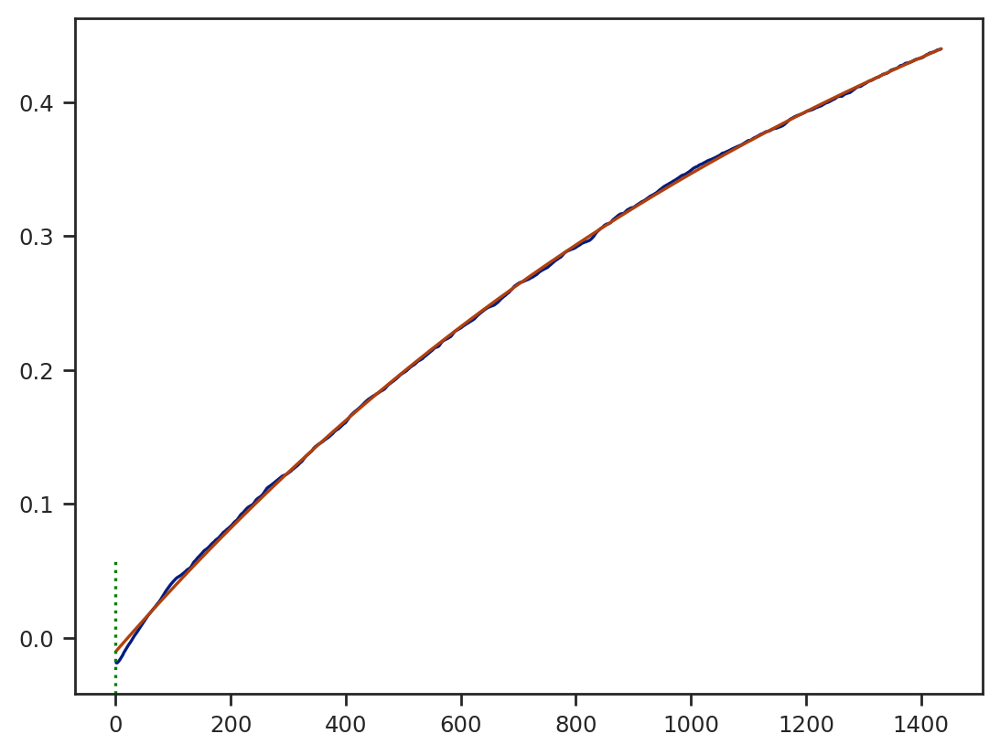

In [123]:
Path = './data/SRFA_AIR/3_18_254_FA_3_D/B.xlsx'
_,_=qcm_to_speed_plot(Path,t0='3/18/2023 23:26:23',f0=5005650.993,f1=5003825.258,time_frame=['3/18/2023 10:04:20','3/20/2023 10:10:20'],fit_time=['3/18/2023 23:41:37','3/19/2023 23:37:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-10-26 23:01:14.288  4.999501e+06
2022-10-26 23:02:14.288  4.999501e+06
2022-10-26 23:03:14.288  4.999500e+06
2022-10-26 23:04:14.288  4.999500e+06
2022-10-26 23:05:14.288  4.999499e+06
...                               ...
2022-10-28 00:53:14.288  5.000281e+06
2022-10-28 00:54:14.288  5.000281e+06
2022-10-28 00:55:14.288  5.000282e+06
2022-10-28 00:56:14.288  5.000282e+06
2022-10-28 00:57:14.288  5.000282e+06

[1557 rows x 1 columns]
Loading 4191.409000000916
[-3.64532491e-01  2.24202088e+03  3.67860449e-01]
[[3.68334833e-03            nan            nan]
 [           nan 3.18495377e+01 3.47732306e-01]
 [           nan 3.47732306e-01 3.80986775e-03]]
top speed: 0.009751111738371605 end speed: 0.00513915009585149


ValueError: too many values to unpack (expected 2)

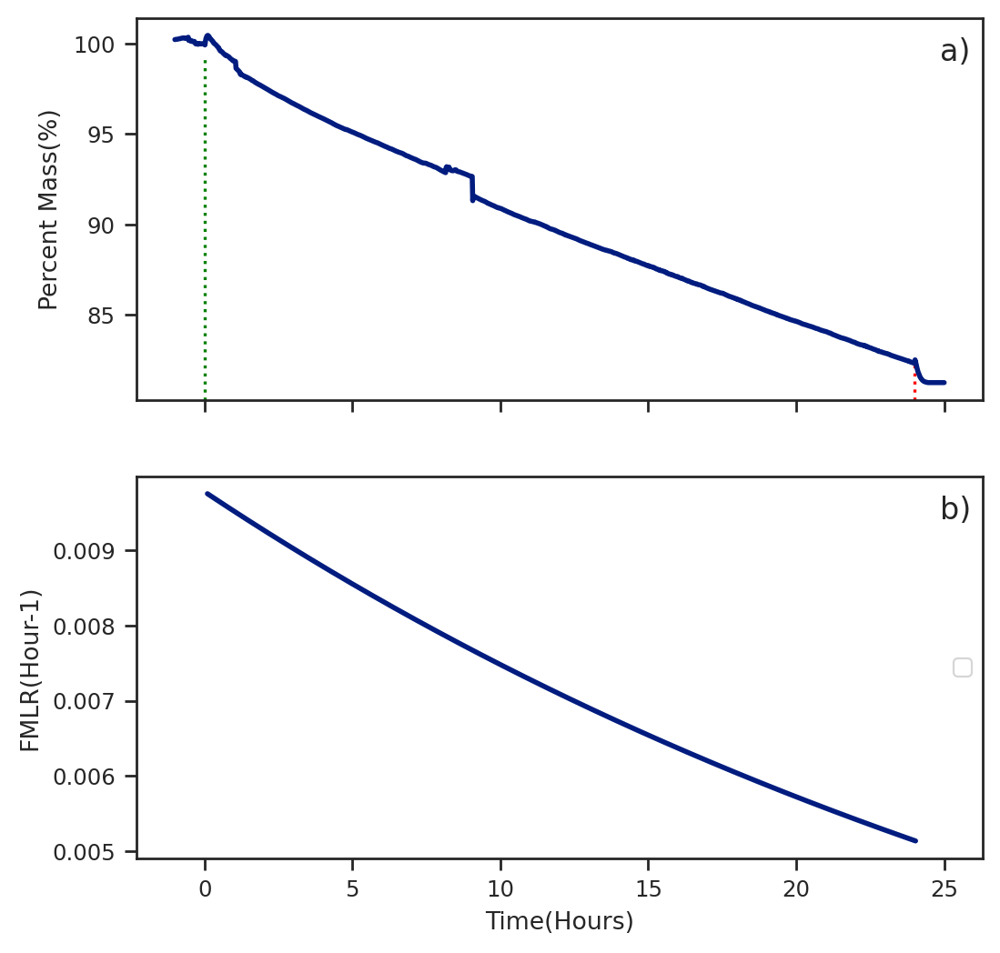

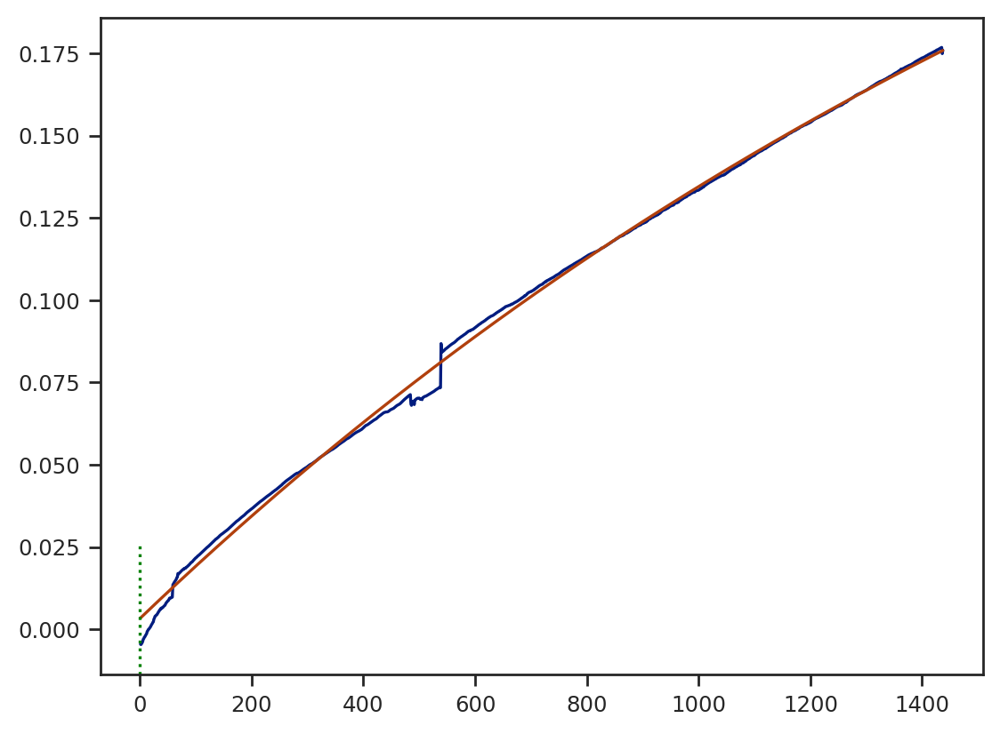

In [124]:
Path = 'data/SRFA_AIR/10_26_Air_1_C_D_254_305/B.xlsx'
_,_=qcm_to_speed_plot(Path,t0='10/27/2022 00:30:31',f0=5003687.821,f1=4999496.412,time_frame=['10/26/2022 23:00:20','10/28/2022 00:58:00'],fit_time=['10/27/2022 00:36:15','10/28/2022 00:33:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-11-29 14:56:48.943  5.006713e+06
2022-11-29 14:57:48.943  5.006713e+06
2022-11-29 14:58:48.943  5.006713e+06
2022-11-29 14:59:48.943  5.006713e+06
2022-11-29 15:00:48.943  5.006713e+06
...                               ...
2022-11-30 16:55:48.943  5.007298e+06
2022-11-30 16:56:48.943  5.007298e+06
2022-11-30 16:57:48.943  5.007298e+06
2022-11-30 16:58:48.943  5.007298e+06
2022-11-30 16:59:48.943  5.007298e+06

[1564 rows x 1 columns]
Loading 3594.1560000004247
[-3.15435329e-01  2.24842938e+03  3.20330280e-01]
[[1.81317357e-03            nan            nan]
 [           nan 1.81292649e+01 1.84035306e-01]
 [           nan 1.84035306e-01 1.87467257e-03]]
top speed: 0.008413741722348113 end speed: 0.004452305346513681


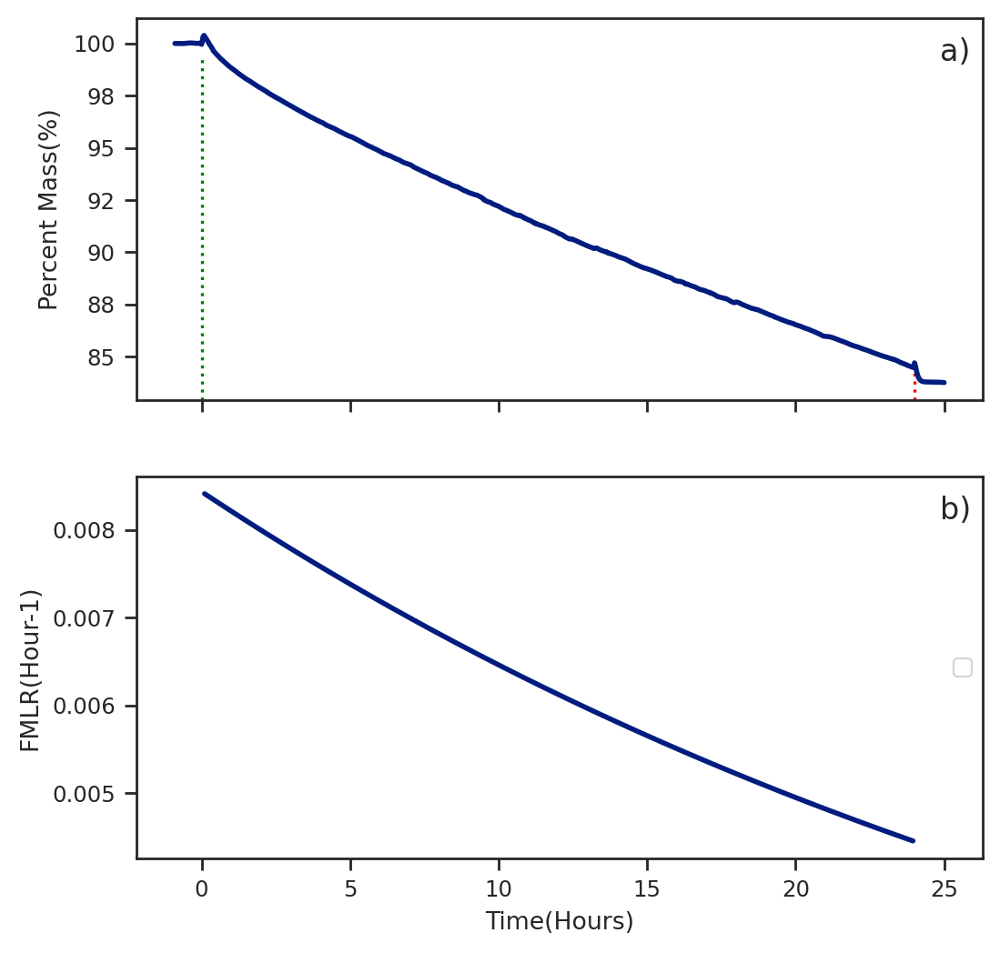

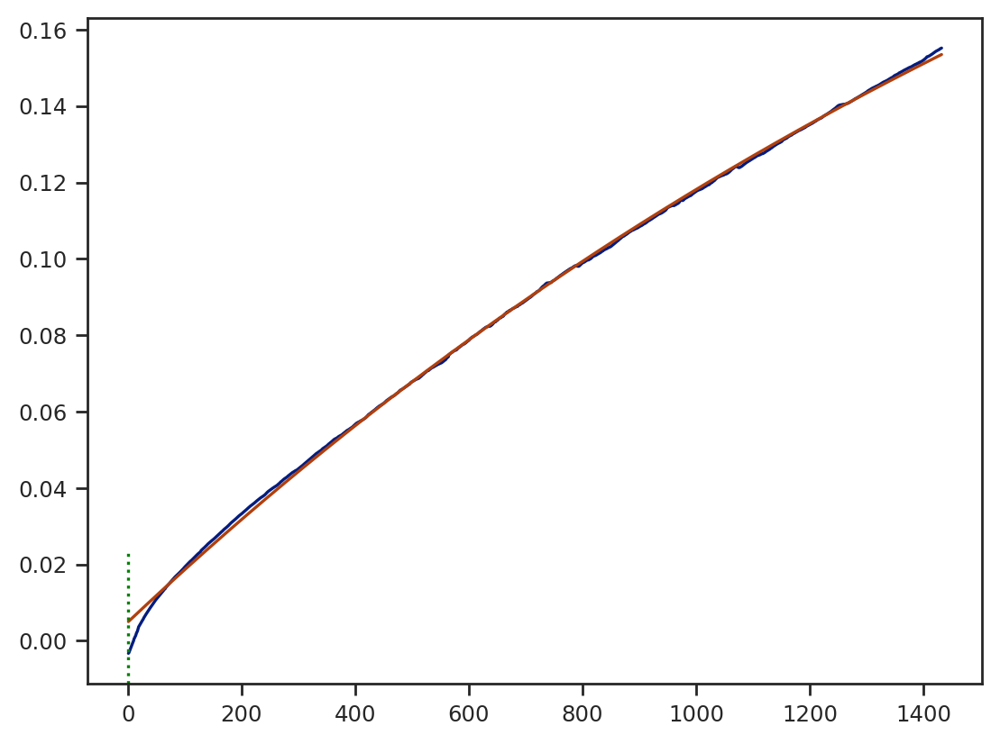

In [125]:
path_1 = './data/SRFA_AIR/11_30_SRFA_4_C_D_254_305/D.xlsx'
_=qcm_to_speed_plot(path_1,t0='11/29/2022 15:51:00',f0=5010307.568,f1=5006713.412,time_frame=['11/29/2022 14:56:00','11/30/2022 17:00:00'],fit_time=['11/29/2022 15:56:00','11/30/2022 15:48:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-12-01 20:30:11.421  5.000484e+06
2022-12-01 20:31:11.421  5.000484e+06
2022-12-01 20:32:11.421  5.000484e+06
2022-12-01 20:33:11.421  5.000484e+06
2022-12-01 20:34:11.421  5.000484e+06
...                               ...
2022-12-02 22:06:11.421  5.001154e+06
2022-12-02 22:07:11.421  5.001154e+06
2022-12-02 22:08:11.421  5.001154e+06
2022-12-02 22:09:11.421  5.001154e+06
2022-12-02 22:10:11.421  5.001154e+06

[1541 rows x 1 columns]
Loading 4065.2179999994114
[-3.21511119e-01  2.24619558e+03  3.20744503e-01]
[[1.97945945e-03            nan            nan]
 [           nan 1.94006349e+01 1.98919058e-01]
 [           nan 1.98919058e-01 2.04663821e-03]]
top speed: 0.008584328570363791 end speed: 0.004541722180808219


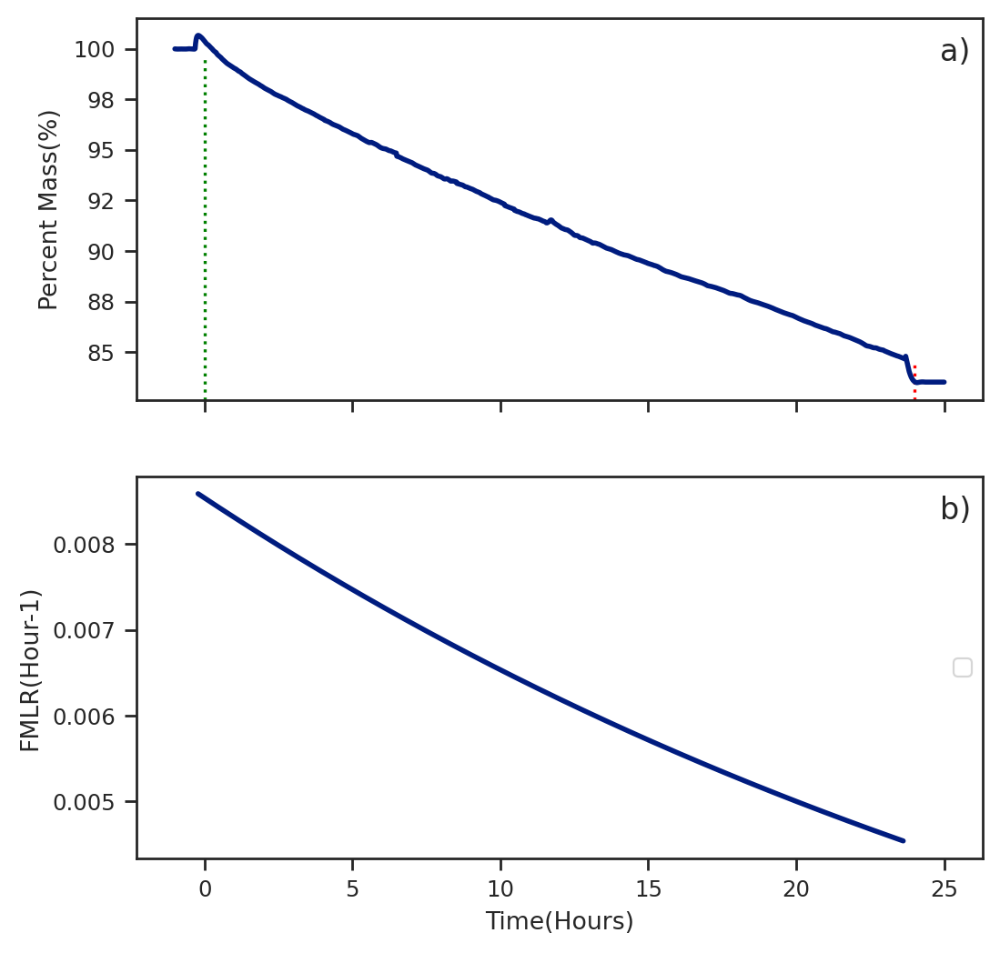

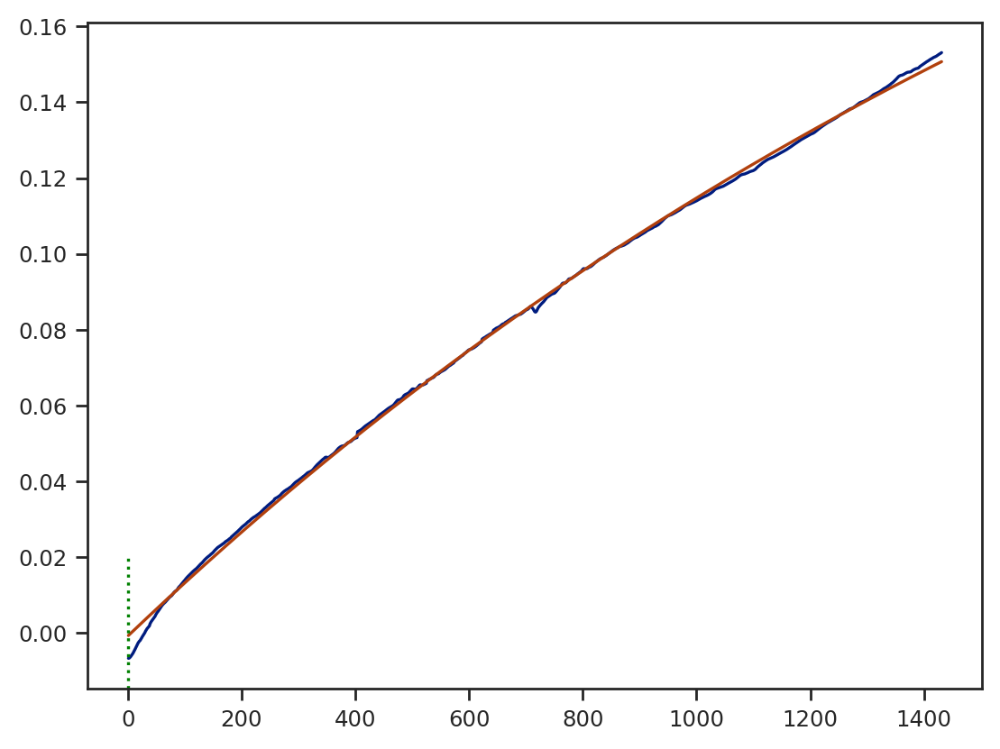

In [126]:
path_1 = 'data/SRFA_AIR/12_2_SRFA_4_A_B_405_305/B.xlsx'
_=qcm_to_speed_plot(path_1,t0='12/1/2022 21:49:43',f0=5004549.05,f1=5000483.832,time_frame=['12/1/2022 20:30:00','12/2/2022 22:11:00'],fit_time=['12/1/2022 21:36:22','12/2/2022 21:27:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-12-04 10:30:47.134  4.998252e+06
2022-12-04 10:31:47.134  4.998252e+06
2022-12-04 10:32:47.134  4.998252e+06
2022-12-04 10:33:47.134  4.998252e+06
2022-12-04 10:34:47.134  4.998252e+06
...                               ...
2022-12-05 12:55:47.134  4.998987e+06
2022-12-05 12:56:47.134  4.998988e+06
2022-12-05 12:57:47.134  4.998988e+06
2022-12-05 12:58:47.134  4.998988e+06
2022-12-05 12:59:47.134  4.998988e+06

[1590 rows x 1 columns]
Loading 4455.012000000104
[-3.92578308e-01  2.98589099e+03  3.94730475e-01]
[[4.28253294e-03            nan            nan]
 [           nan 4.18562449e+01 4.27004247e-01]
 [           nan 4.27004247e-01 4.36459983e-03]]
top speed: 0.007886025036450231 end speed: 0.004888292220623975


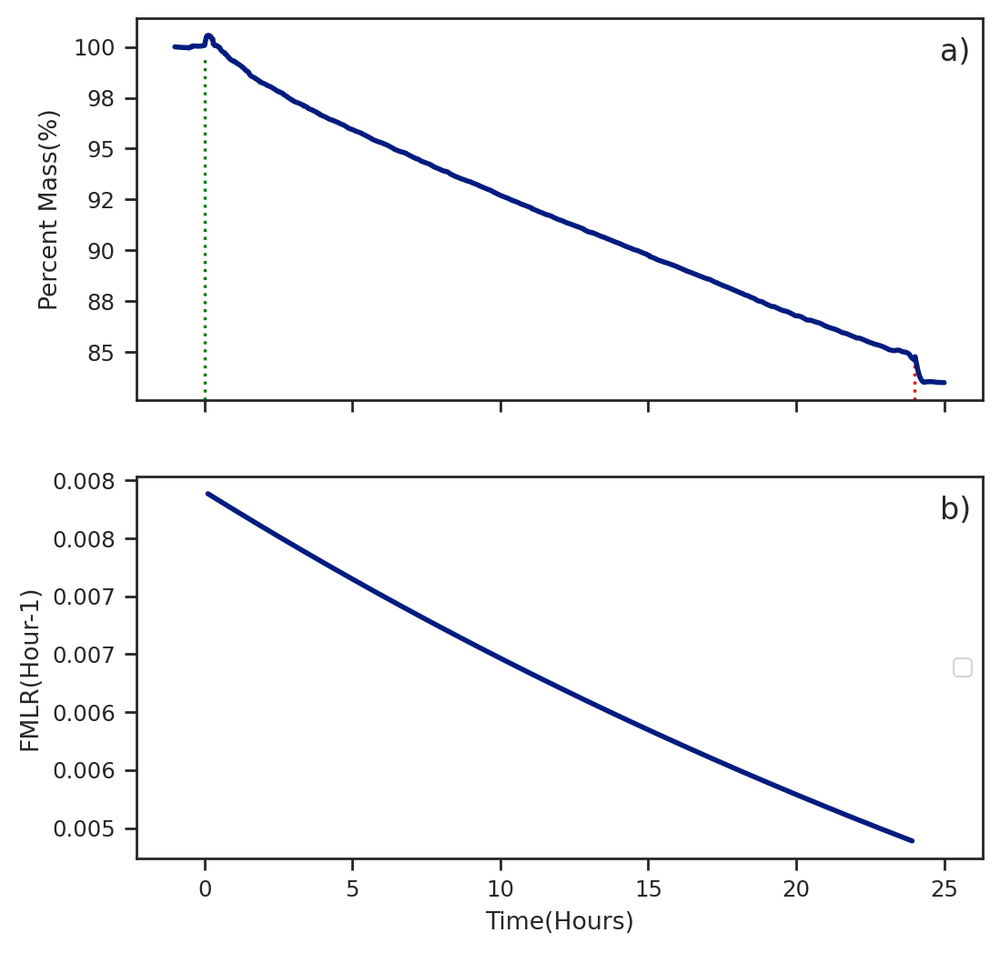

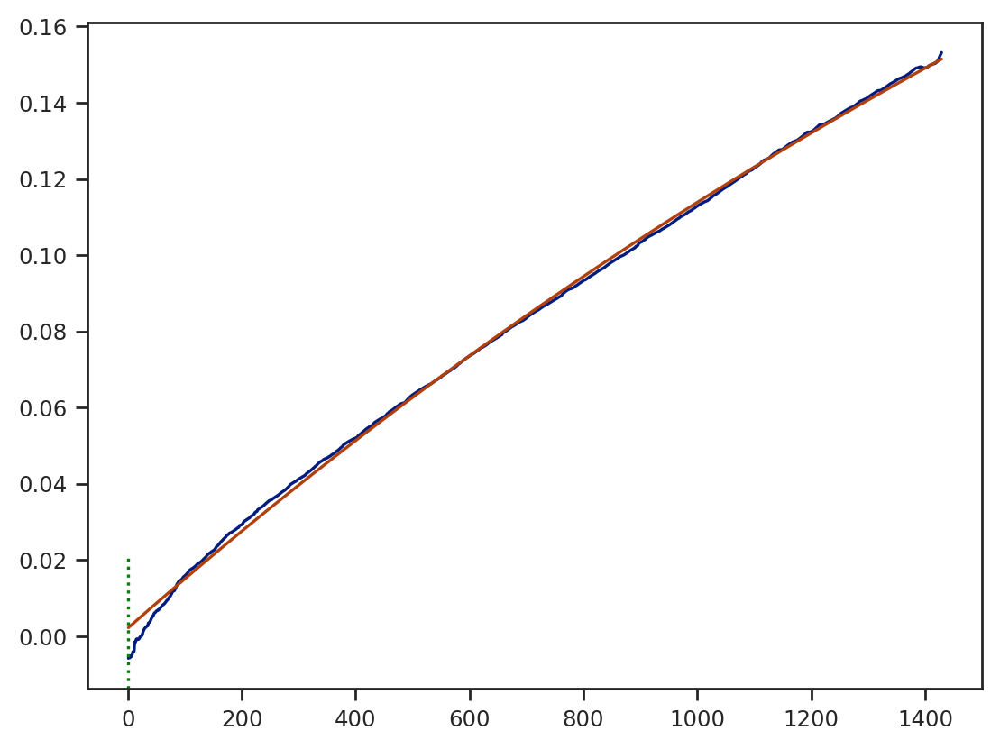

In [127]:
path_1 = 'data/SRFA_AIR/12_4_SRFA_1_A_B_405_305/B.xlsx'
_=qcm_to_speed_plot(path_1,t0='12/4/2022 11:35:00',f0=5002707.176,f1=4998252.164,time_frame=['12/4/2022 10:30:00','12/5/2022 13:00:00'],fit_time=['12/4/2022 11:41:36','12/5/2022 11:30:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-12-08 15:00:51.466  5.005703e+06
2022-12-08 15:01:51.466  5.005704e+06
2022-12-08 15:02:51.466  5.005704e+06
2022-12-08 15:03:51.466  5.005704e+06
2022-12-08 15:04:51.466  5.005704e+06
...                               ...
2022-12-09 16:25:51.466  5.006535e+06
2022-12-09 16:26:51.466  5.006536e+06
2022-12-09 16:27:51.466  5.006536e+06
2022-12-09 16:28:51.466  5.006536e+06
2022-12-09 16:29:51.466  5.006536e+06

[1530 rows x 1 columns]
Loading 4603.415000000037
[-3.25018428e-01  2.26878896e+03  3.44016192e-01]
[[3.37885924e-03            nan            nan]
 [           nan 3.30197475e+01 3.38995204e-01]
 [           nan 3.38995204e-01 3.49220539e-03]]
top speed: 0.008591593390186659 end speed: 0.004562393710838139


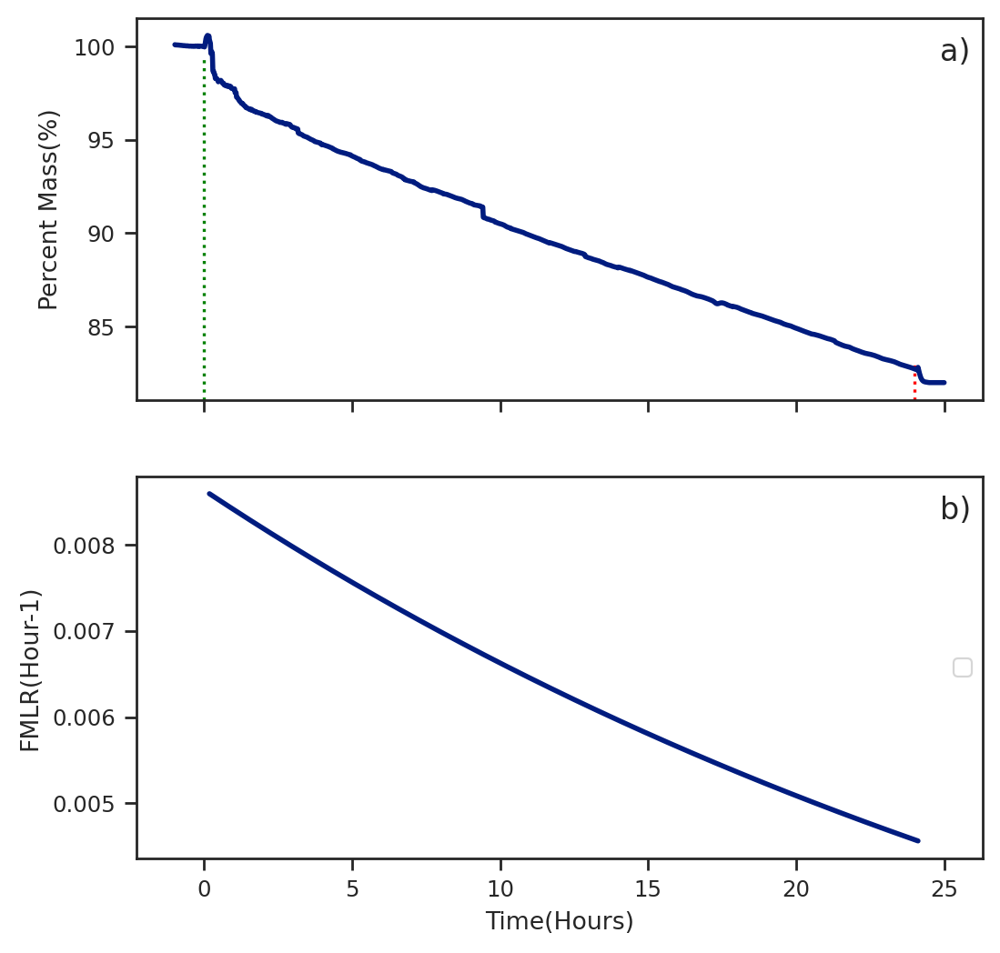

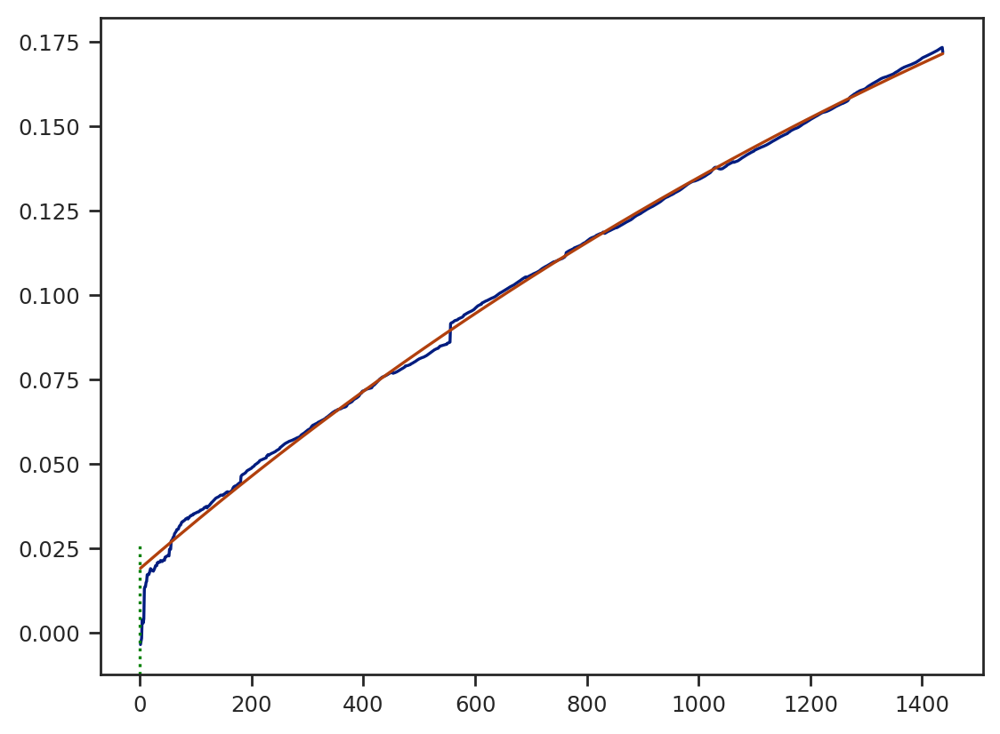

In [128]:
path_1 = 'data/SRFA_AIR/12_8_SRFA_4_C_D_405_305/B.xlsx'
_=qcm_to_speed_plot(path_1,t0='12/8/2022 16:00:00',f0=5010310.626,f1=5005707.211,time_frame=['12/08/2022 15:00:00','12/09/2022 16:30:00'],fit_time=['12/08/2022 16:10:33','12/09/2022 16:07:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-12-10 14:00:31.699  4.999814e+06
2022-12-10 14:01:31.699  4.999812e+06
2022-12-10 14:02:31.699  4.999812e+06
2022-12-10 14:03:31.699  4.999814e+06
2022-12-10 14:04:31.699  4.999813e+06
...                               ...
2022-12-11 15:53:31.699  5.000582e+06
2022-12-11 15:54:31.699  5.000582e+06
2022-12-11 15:55:31.699  5.000582e+06
2022-12-11 15:56:31.699  5.000582e+06
2022-12-11 15:57:31.699  5.000583e+06

[1558 rows x 1 columns]
Loading 4611.350999999791
[-2.97251981e-01  2.12763407e+03  3.10475086e-01]
[[3.11001626e-03            nan            nan]
 [           nan 3.18825388e+01 3.20188528e-01]
 [           nan 3.20188528e-01 3.22809880e-03]]
top speed: 0.008378667401098784 end speed: 0.004272378962501899


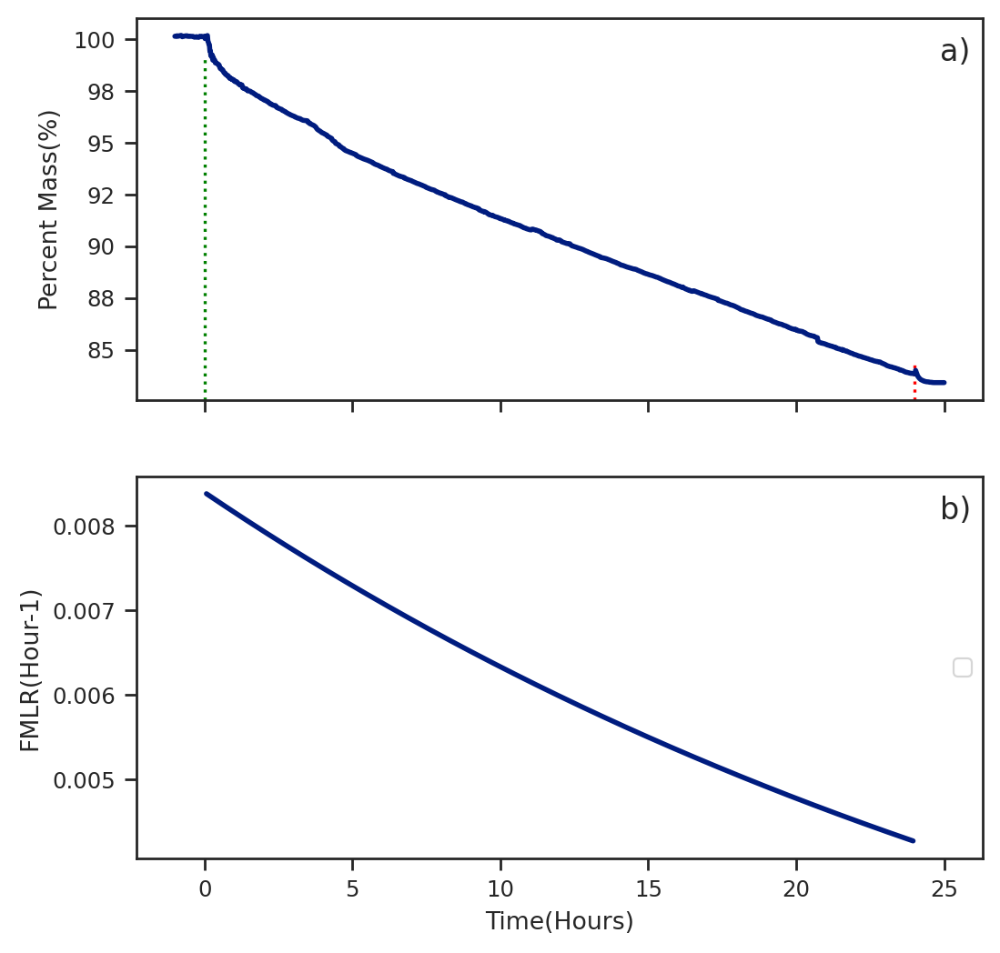

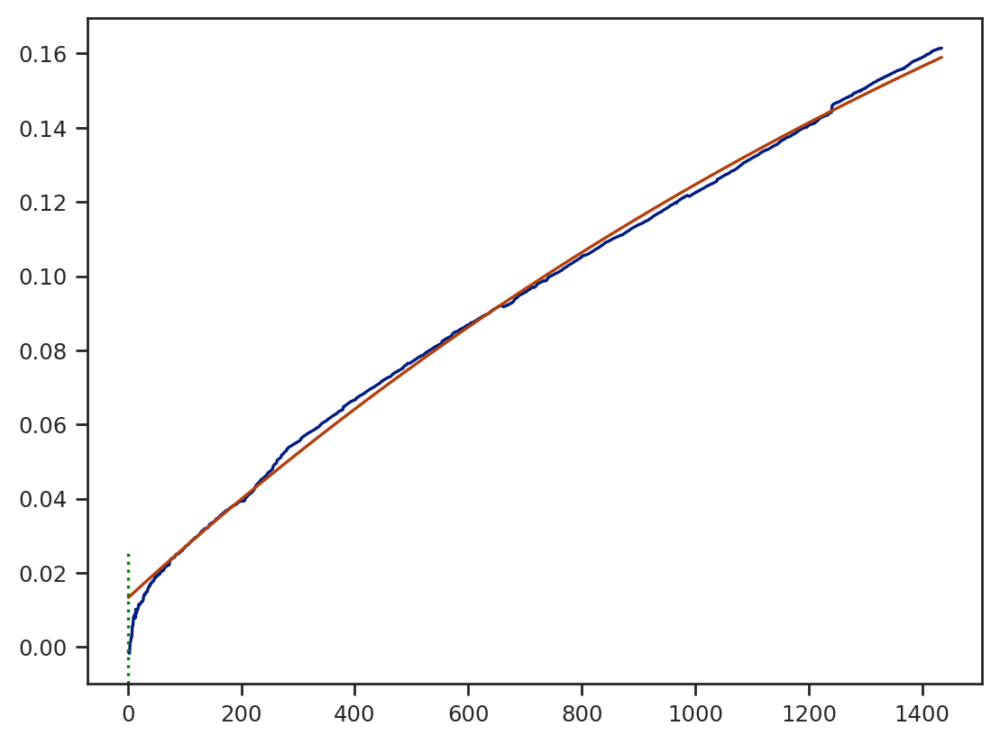

In [129]:
path_1 = 'data/SRFA_AIR/12_10_SRFA_4_A_B_405_305/B.xlsx'
_=qcm_to_speed_plot(path_1,t0='12/10/2022 15:20:00',f0=5004429.335,f1=4999817.984,time_frame=['12/10/2022 14:00:00','12/11/2022 15:58:00'],fit_time=['12/10/2022 15:23:57','12/11/2022 15:17:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2023-03-06 19:00:14.707  5.007947e+06
2023-03-06 19:01:14.707  5.007947e+06
2023-03-06 19:02:14.707  5.007947e+06
2023-03-06 19:03:14.707  5.007947e+06
2023-03-06 19:04:14.707  5.007947e+06
...                               ...
2023-03-07 21:13:14.707  5.008435e+06
2023-03-07 21:14:14.707  5.008435e+06
2023-03-07 21:15:14.707  5.008435e+06
2023-03-07 21:16:14.707  5.008434e+06
2023-03-07 21:17:14.707  5.008434e+06

[1578 rows x 1 columns]
Loading 2867.713999999687
[-4.33821271e-01  3.16987750e+03  4.17711666e-01]
[[5.32531781e-03            nan            nan]
 [           nan 4.91994734e+01 5.15720631e-01]
 [           nan 5.15720631e-01 5.41510288e-03]]
top speed: 0.008208855420028655 end speed: 0.00524154197077143


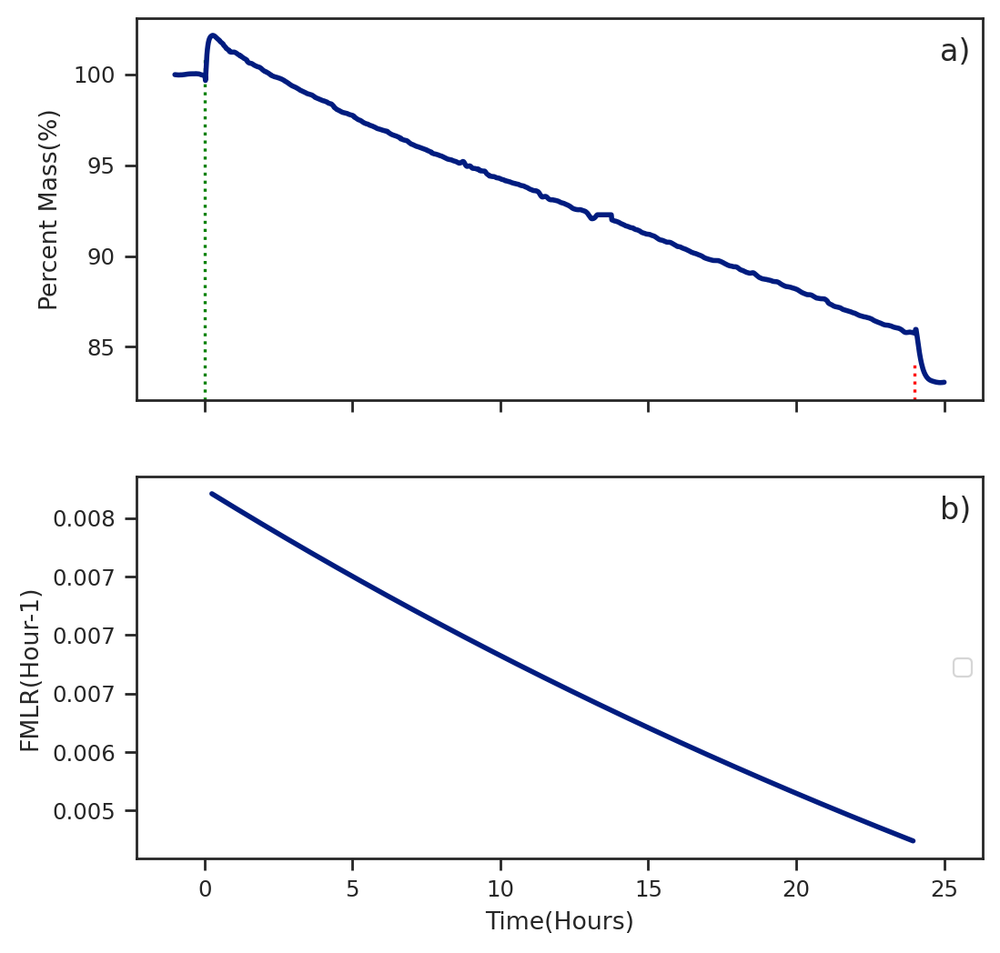

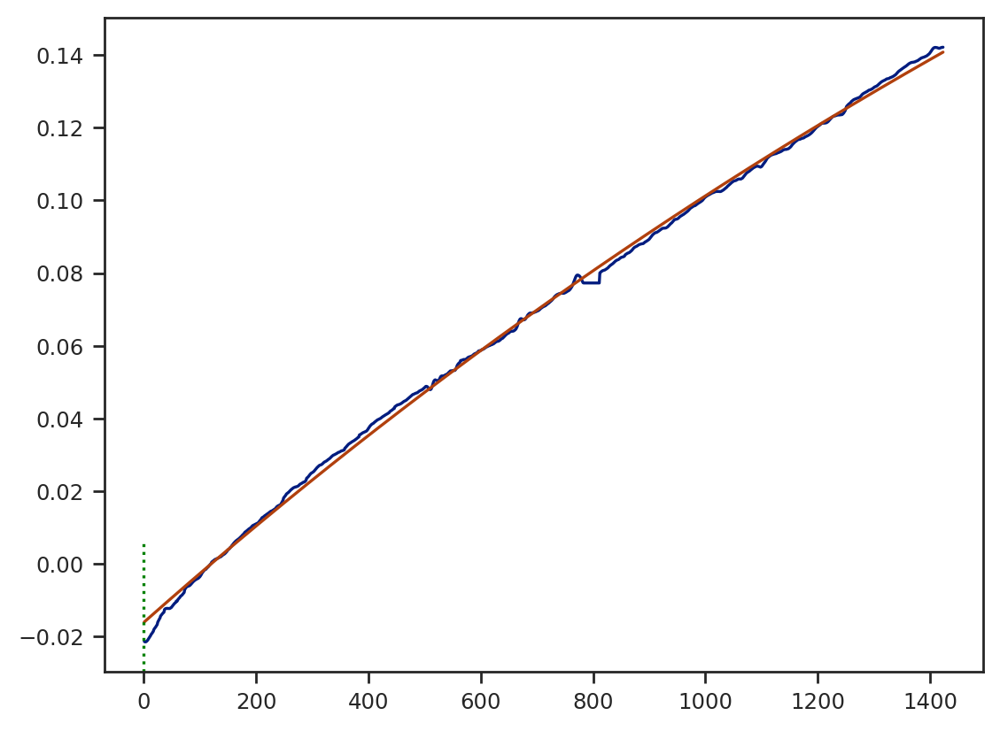

In [130]:
path_1 = 'data/SRFA_AIR/3_6_254_305_3_A_B/B.xlsx'
_=qcm_to_speed_plot(path_1,t0='3/6/2023 20:15:4',f0=5010816.595,f1=5007948.881,time_frame=['3/6/2023 19:00:00','3/7/2023 21:18:00'],fit_time=['3/6/2023 20:29:57','3/7/2023 20:13:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-12-01 20:36:12.734  4.999279e+06
2022-12-01 20:37:12.734  4.999279e+06
2022-12-01 20:38:12.734  4.999279e+06
2022-12-01 20:39:12.734  4.999279e+06
2022-12-01 20:40:12.734  4.999279e+06
...                               ...
2022-12-02 22:20:12.734  4.999835e+06
2022-12-02 22:21:12.734  4.999835e+06
2022-12-02 22:22:12.734  4.999835e+06
2022-12-02 22:23:12.734  4.999835e+06
2022-12-02 22:24:12.734  4.999835e+06

[1549 rows x 1 columns]
Loading 3487.8980000000447
[-2.25448312e-01  1.49544328e+03  3.06077149e-01]
[[9.28508992e-04            nan            nan]
 [           nan 1.03891259e+01 1.01484075e-01]
 [           nan 1.01484075e-01 9.99380693e-04]]
top speed: 0.009039364126412923 end speed: 0.0034625563158675347


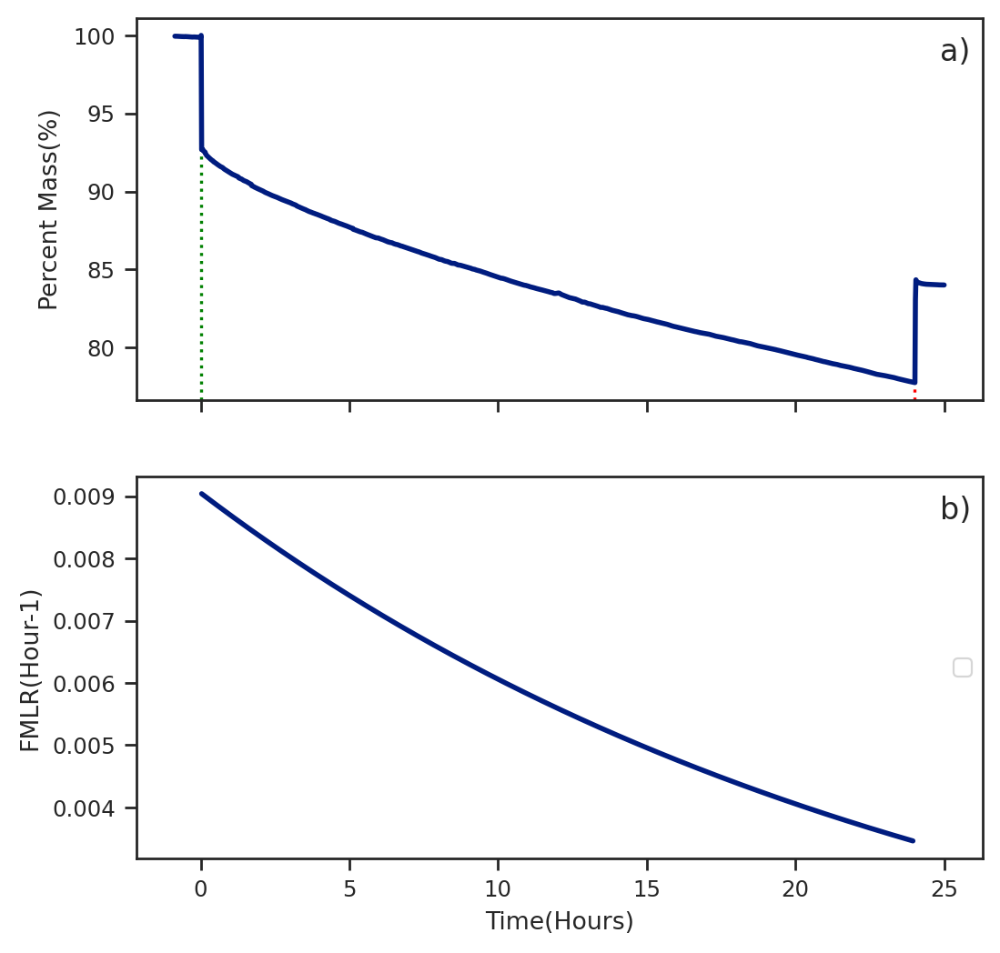

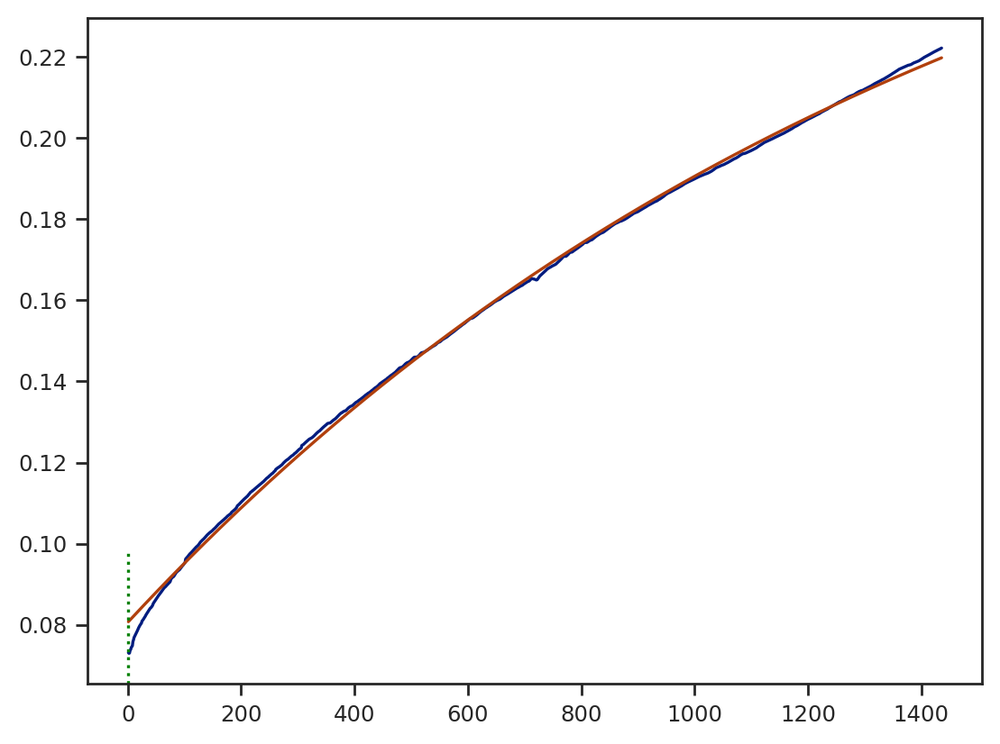

In [131]:

path_1 = 'data/SRFA_AIR/12_2_SRFA_4_A_B_405_305/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='12/1/2022 21:29:10',f0=5002765.231,f1=4999277.333,time_frame=['12/01/2022 20:36:00','12/02/2022 22:25:00'],fit_time=['12/01/2022 21:31:0','12/02/2022 21:27:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2023-03-12 12:42:20.005  5.009192e+06
2023-03-12 12:43:20.005  5.009186e+06
2023-03-12 12:44:20.005  5.009185e+06
2023-03-12 12:45:20.005  5.009186e+06
2023-03-12 12:46:20.005  5.009186e+06
...                               ...
2023-03-13 21:28:20.005  5.009247e+06
2023-03-13 21:29:20.005  5.009247e+06
2023-03-13 21:30:20.005  5.009247e+06
2023-03-13 21:31:20.005  5.009247e+06
2023-03-13 21:32:20.005  5.009247e+06

[1971 rows x 1 columns]
Loading 1651.8169999998063
[-3.37024669e-01  2.06777990e+03  4.84958026e-01]
[[1.05986750e-03            nan            nan]
 [           nan 9.42929719e+00 1.01760213e-01]
 [           nan 1.01760213e-01 1.10275624e-03]]
top speed: 0.00977459119006448 end speed: 0.0048761424855379015


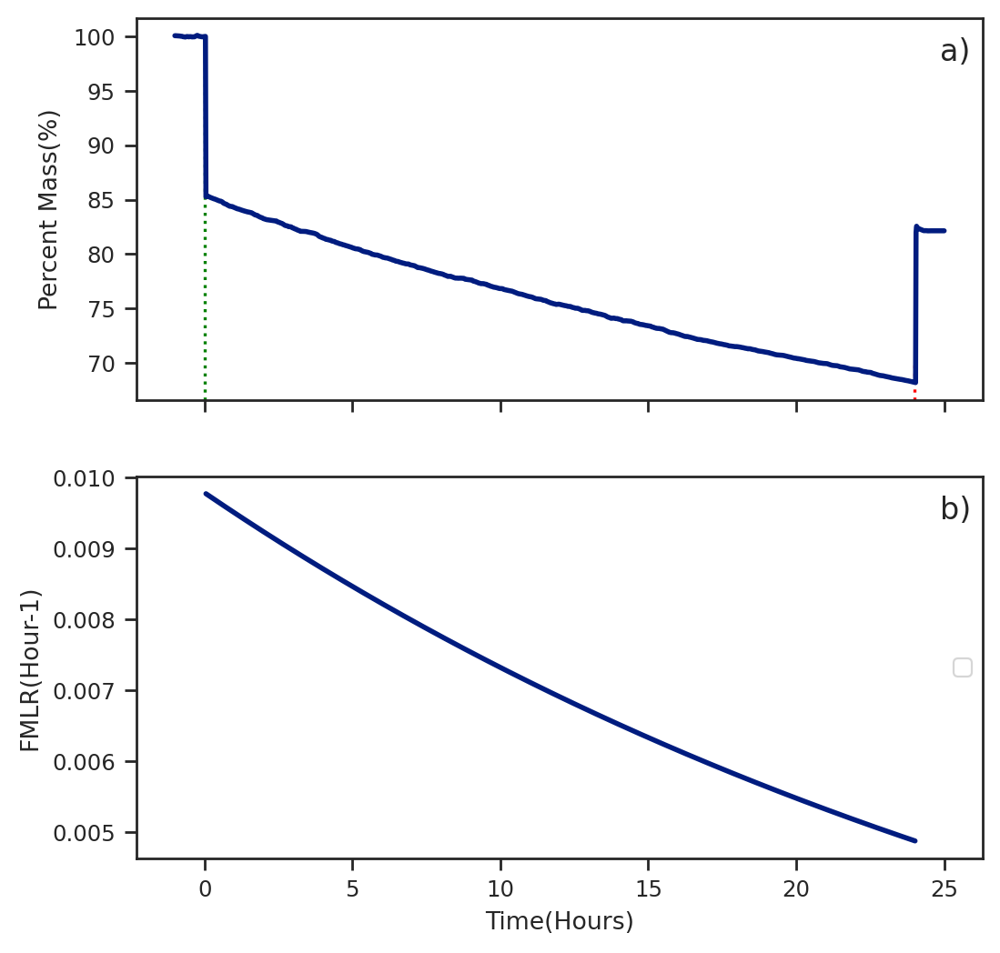

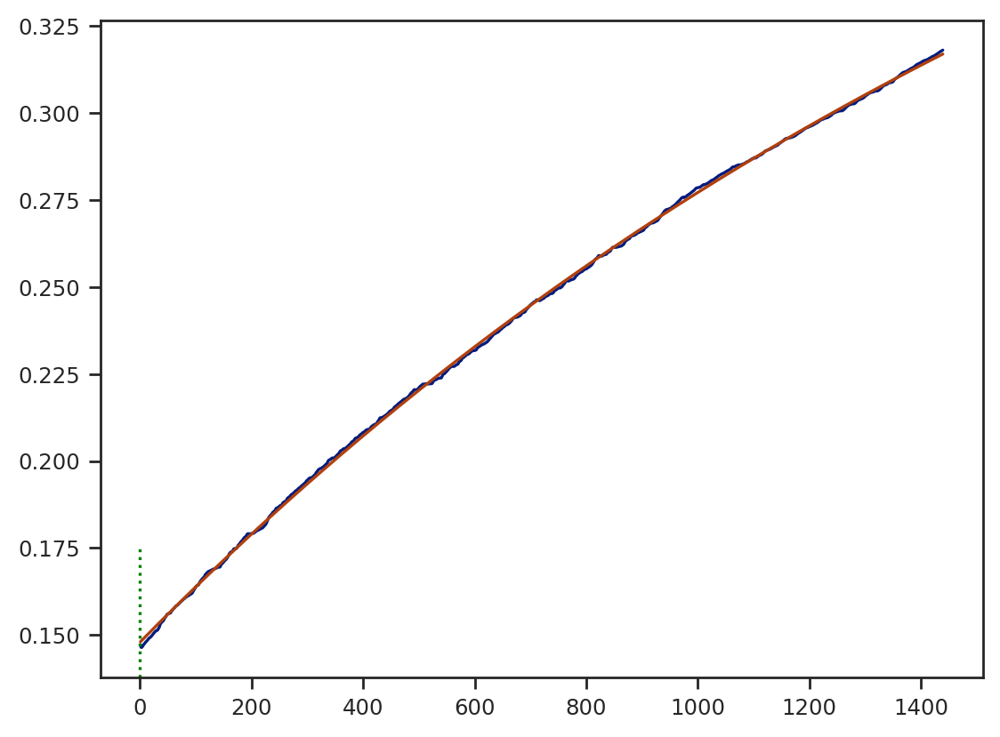

In [132]:

path_1 = 'data/SRFA_AIR/3_12_405_254_3_A_G_B_FA_HA/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='3/12/2023 21:02:57',f0=5010603.743,f1=5008951.926,time_frame=['3/12/2022 20:00:00','3/13/2023 21:33:00'],fit_time=['3/12/2023 21:05:0','3/13/2023 21:04:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2023-03-15 14:00:02.821  4.998737e+06
2023-03-15 14:01:02.821  4.998737e+06
2023-03-15 14:02:02.821  4.998737e+06
2023-03-15 14:03:02.821  4.998738e+06
2023-03-15 14:04:02.821  4.998738e+06
...                               ...
2023-03-16 16:28:02.821  4.999040e+06
2023-03-16 16:29:02.821  4.999040e+06
2023-03-16 16:30:02.821  4.999040e+06
2023-03-16 16:31:02.821  4.999040e+06
2023-03-16 16:32:02.821  4.999040e+06

[1593 rows x 1 columns]
Loading 2419.928999999538
[-1.37261183e-01  9.81562228e+02  2.45330369e-01]
[[4.40158399e-04            nan            nan]
 [           nan 7.08404366e+00 5.96486946e-02]
 [           nan 5.96486946e-02 5.12366716e-04]]
top speed: 0.00838182707845776 end speed: 0.0019388076176274664


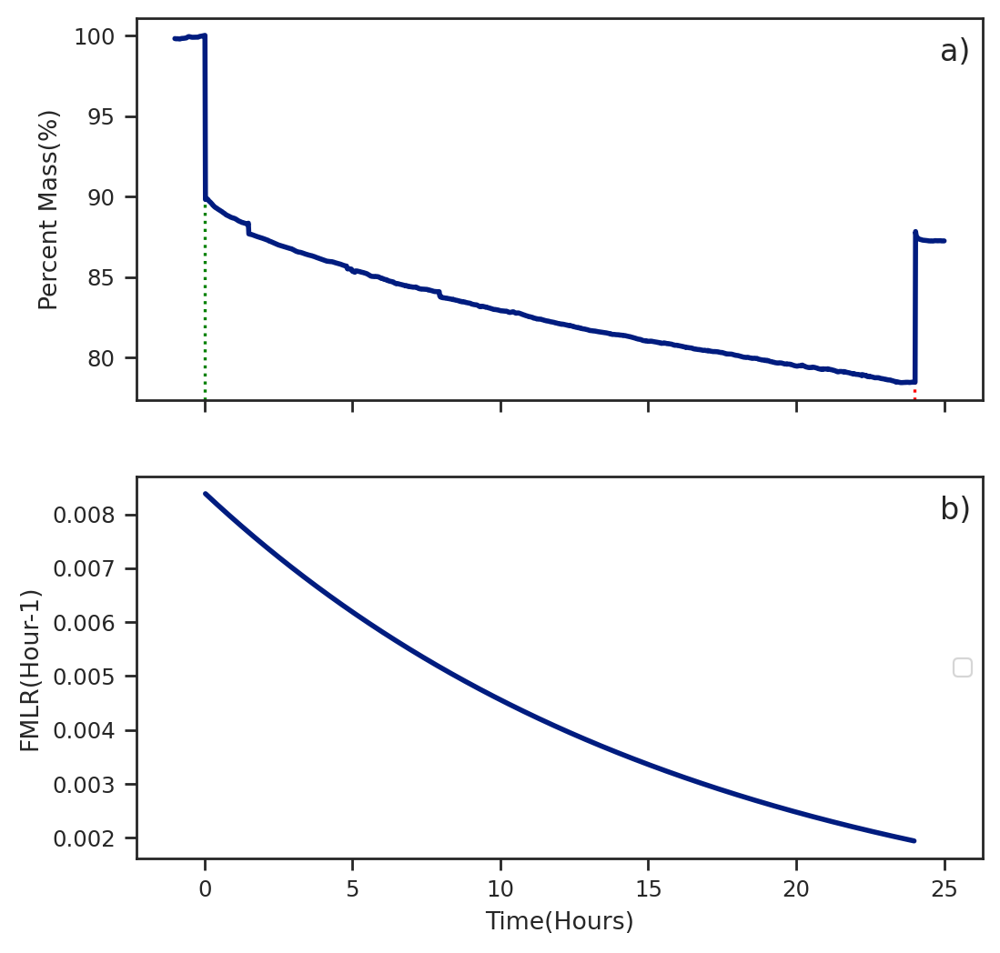

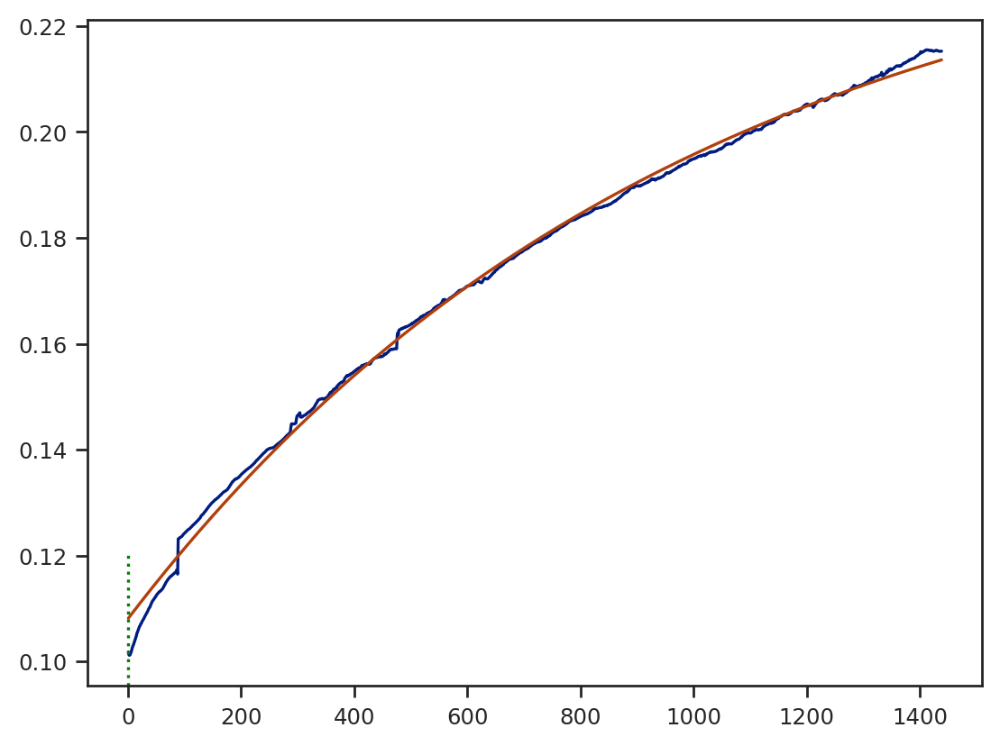

In [133]:

path_1 = 'data/SRFA_AIR/3_15_405_254_2_C_D/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='3/15/2023 15:04:11',f0=5001152.942,f1=4998733.013,time_frame=['3/15/2023 14:00:00','3/16/2023 16:33:00'],fit_time=['3/15/2023 15:06:0','3/16/2023 15:04:00'])

In [ ]:
#########N2
#########N2
#########

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-07-31 17:49:55.805  4.994678e+06
2022-07-31 17:50:55.805  4.994678e+06
2022-07-31 17:51:55.805  4.994678e+06
2022-07-31 17:52:55.805  4.994677e+06
2022-07-31 17:53:55.805  4.994677e+06
...                               ...
2022-08-01 19:47:55.805  4.995451e+06
2022-08-01 19:48:55.805  4.995452e+06
2022-08-01 19:49:55.805  4.995452e+06
2022-08-01 19:50:55.805  4.995452e+06
2022-08-01 19:51:55.805  4.995452e+06

[1563 rows x 1 columns]
Loading 8253.973000000231
[-8.30907990e-02  5.27096519e+02  8.88848754e-02]
[[1.49041608e-04            nan            nan]
 [           nan 3.01327458e+00 2.09636742e-02]
 [           nan 2.09636742e-02 1.58082615e-04]]
top speed: 0.009440393568188247 end speed: 0.0006133331704110544


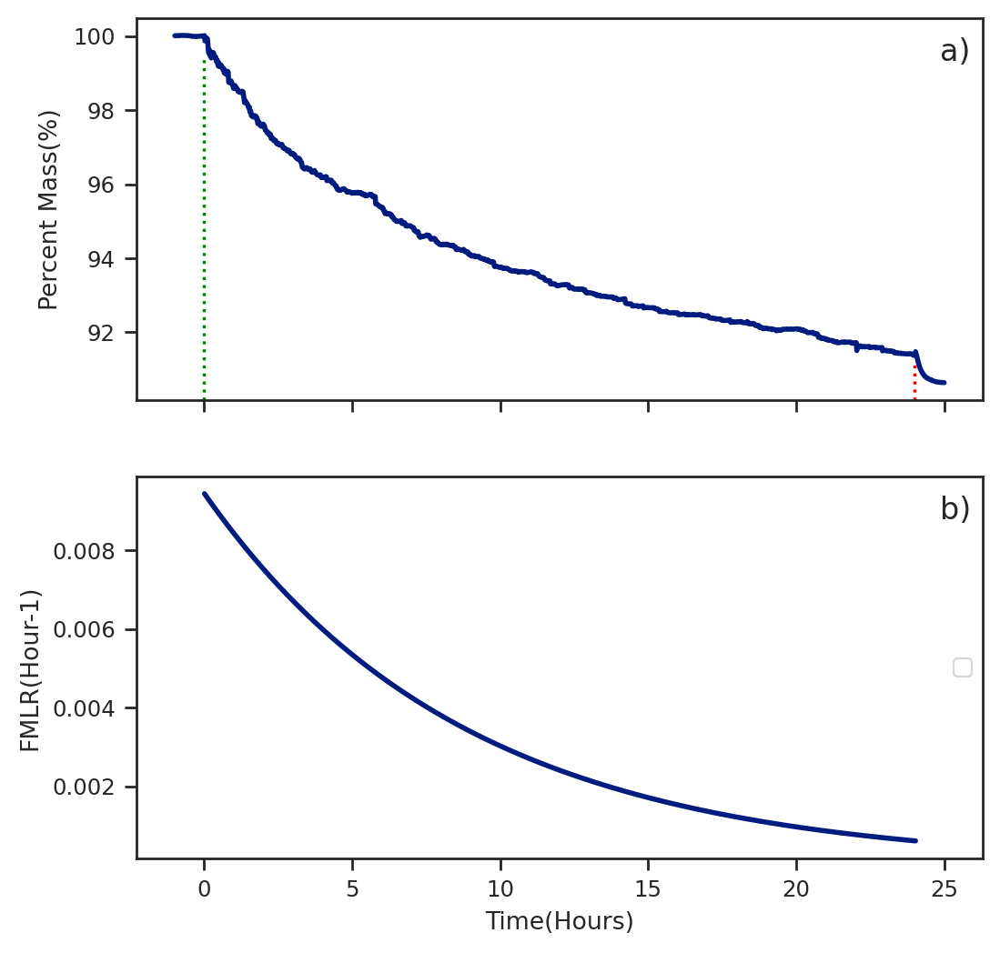

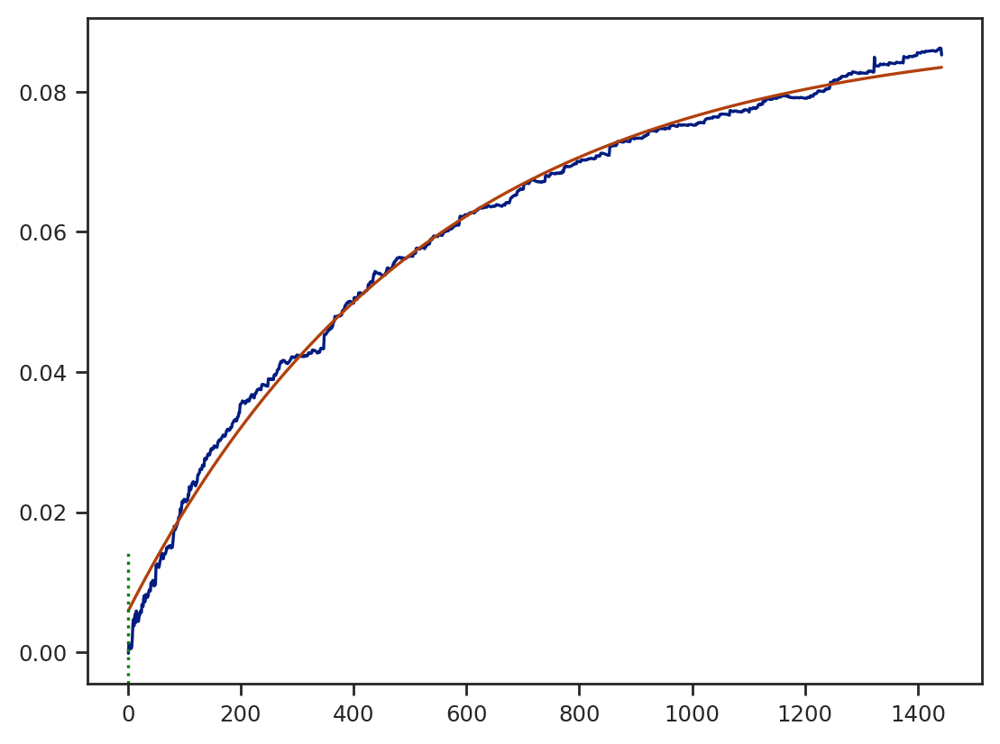

In [134]:
###SRHA 254 8-1

path_1 = 'data/8_1_254nm_SRHA/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='7/31/2022 18:49:37',f0=5002932.784,f1=4994678.811,time_frame=['7/31/2022 17:49:37','8/1/2022 19:52:00'],fit_time=['7/31/2022 18:49:38','8/1/2022 18:52:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-08-17 07:00:17.635  5.003369e+06
2022-08-17 07:01:17.635  5.003369e+06
2022-08-17 07:02:17.635  5.003369e+06
2022-08-17 07:03:17.635  5.003369e+06
2022-08-17 07:04:17.635  5.003369e+06
...                               ...
2022-08-18 10:21:17.635  5.003955e+06
2022-08-18 10:22:17.635  5.003955e+06
2022-08-18 10:23:17.635  5.003955e+06
2022-08-18 10:24:17.635  5.003955e+06
2022-08-18 10:25:17.635  5.003955e+06

[1646 rows x 1 columns]
Loading 6782.120000000112
[-7.93270042e-02  6.09306505e+02  8.65170856e-02]
[[1.19038929e-04            nan            nan]
 [           nan 2.88108685e+00 1.95772670e-02]
 [           nan 1.95772670e-02 1.40843383e-04]]
top speed: 0.007798727044284762 end speed: 0.0007460445636189891


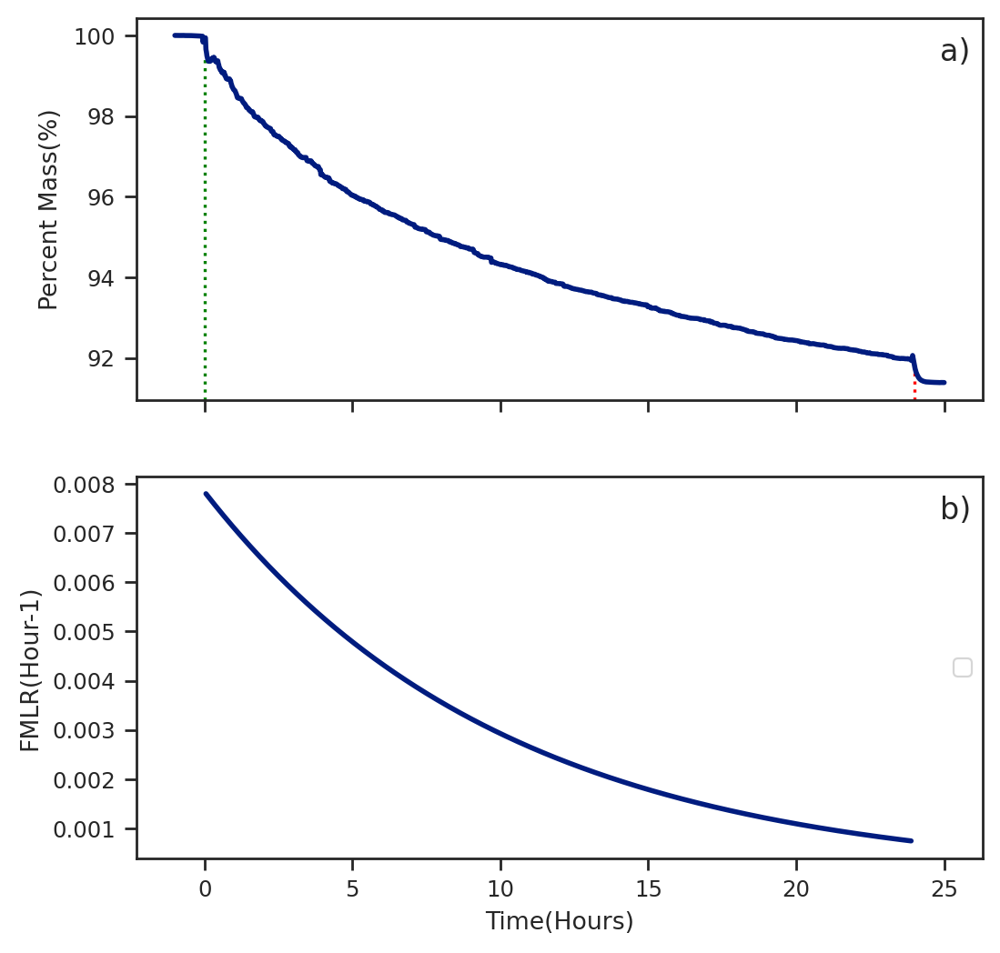

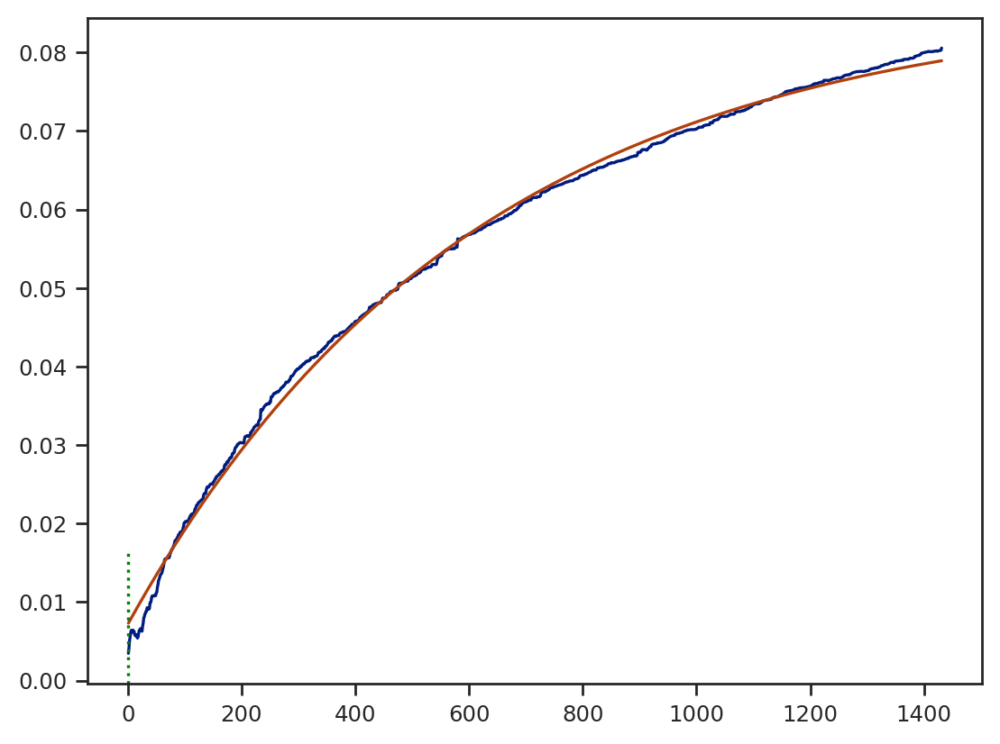

In [136]:
####SRHA 254 8-17

path_1 = 'data/8_17_SRHA_254_4b/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='8/17/2022 9:10:00',f0=5010152.487,f1=5003370.367,time_frame=['8/17/2022 7:00:00','8/18/2022 10:26:00'],fit_time=['8/17/2022 9:12:00','8/18/2022 9:03:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-08-19 08:00:16.083  5.003331e+06
2022-08-19 08:01:16.083  5.003331e+06
2022-08-19 08:02:16.083  5.003331e+06
2022-08-19 08:03:16.083  5.003330e+06
2022-08-19 08:04:16.083  5.003330e+06
...                               ...
2022-08-20 11:55:16.083  5.003929e+06
2022-08-20 11:56:16.083  5.003929e+06
2022-08-20 11:57:16.083  5.003929e+06
2022-08-20 11:58:16.083  5.003930e+06
2022-08-20 11:59:16.083  5.003930e+06

[1680 rows x 1 columns]
Loading 6829.055999999866
[-5.37455362e-02  4.21144970e+02  6.94587671e-02]
[[4.26674658e-04 1.59671822e-02            nan]
 [1.59671822e-02 9.62857081e+00 5.39129702e-02]
 [           nan 5.39129702e-02 3.43319842e-04]]
top speed: 0.0076388997305058106 end speed: 0.0002609945000904092


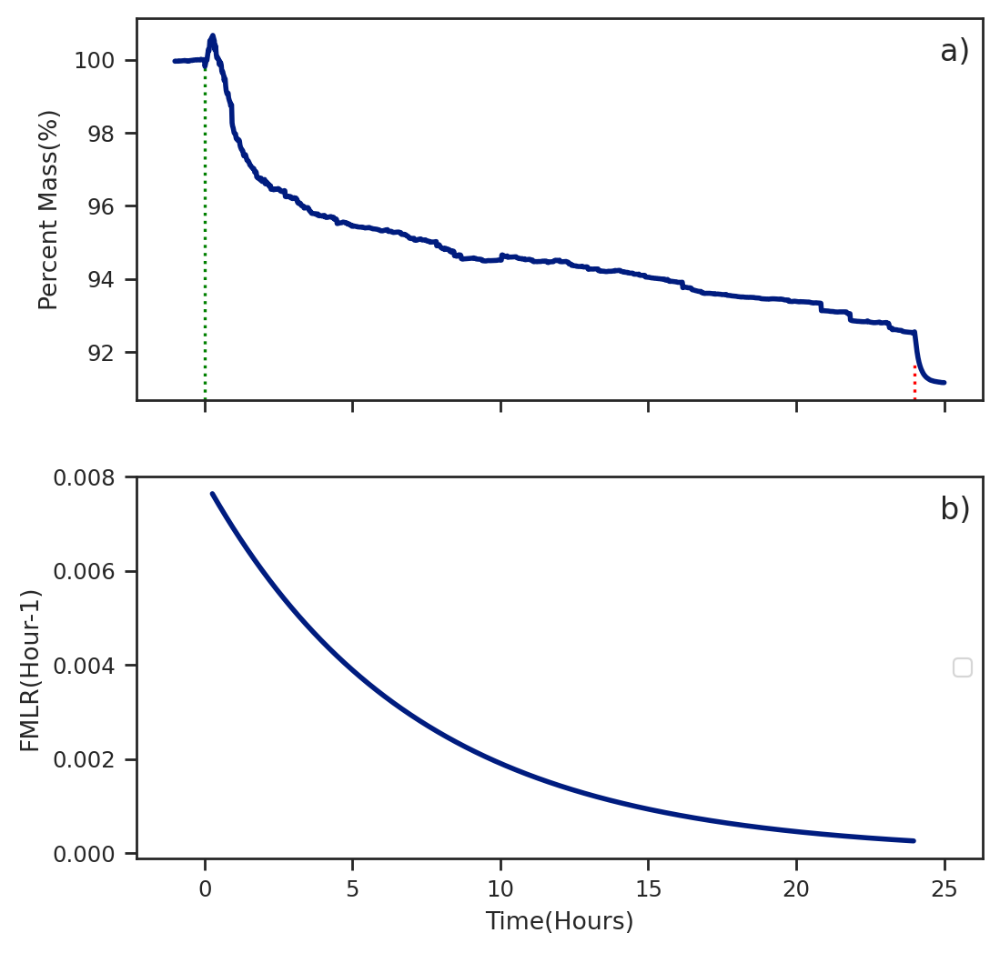

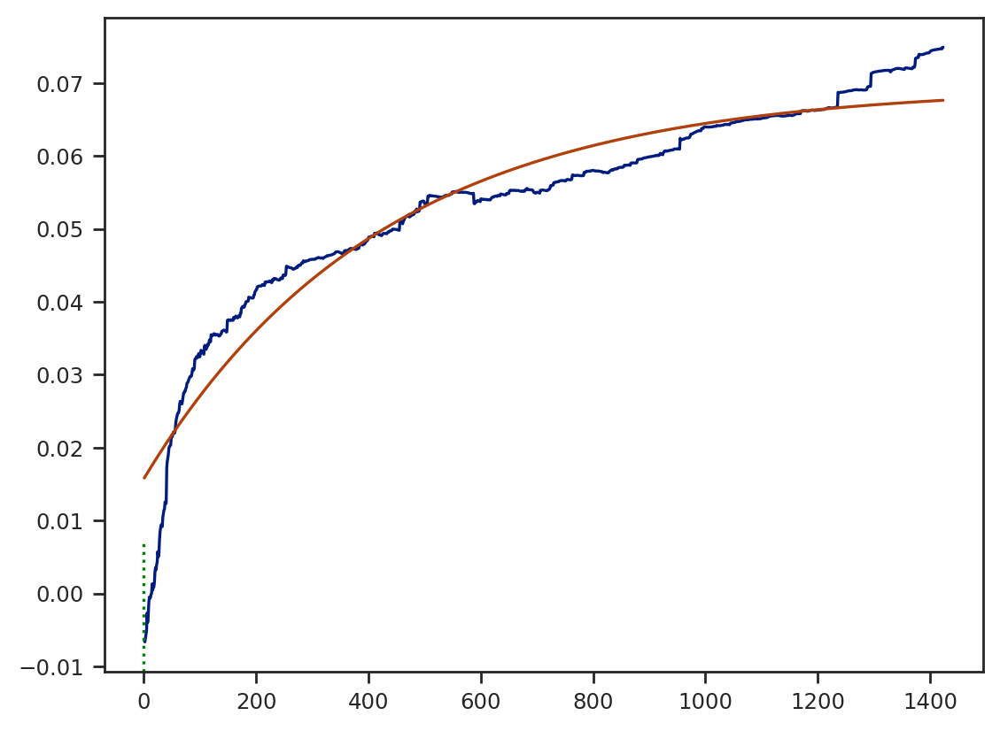

In [137]:
####SRHA 254 8-18

path_1 = 'data/8_18_SRHA_254_4b/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='8/19/2022 9:52:00',f0=5010152.487,f1=5003323.431,time_frame=['8/19/2022 8:00:00','8/20/2022 12:00:00'],fit_time=['8/19/2022 10:07:00','8/20/2022 9:50:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-07-29 02:00:16.681  4.995794e+06
2022-07-29 02:01:16.681  4.995794e+06
2022-07-29 02:02:16.681  4.995794e+06
2022-07-29 02:03:16.681  4.995793e+06
2022-07-29 02:04:16.681  4.995793e+06
...                               ...
2022-07-30 11:55:16.681  4.996230e+06
2022-07-30 11:56:16.681  4.996230e+06
2022-07-30 11:57:16.681  4.996230e+06
2022-07-30 11:58:16.681  4.996230e+06
2022-07-30 11:59:16.681  4.996230e+06

[2040 rows x 1 columns]
Loading 8947.92100000009
[-4.90220456e-02  8.49824588e+02  5.25052038e-02]
[[2.16946345e-04            nan            nan]
 [           nan 9.50654958e+00 4.90589819e-02]
 [           nan 4.90589819e-02 2.60151521e-04]]
top speed: 0.0034570236237171396 end speed: 0.0006402975170585982


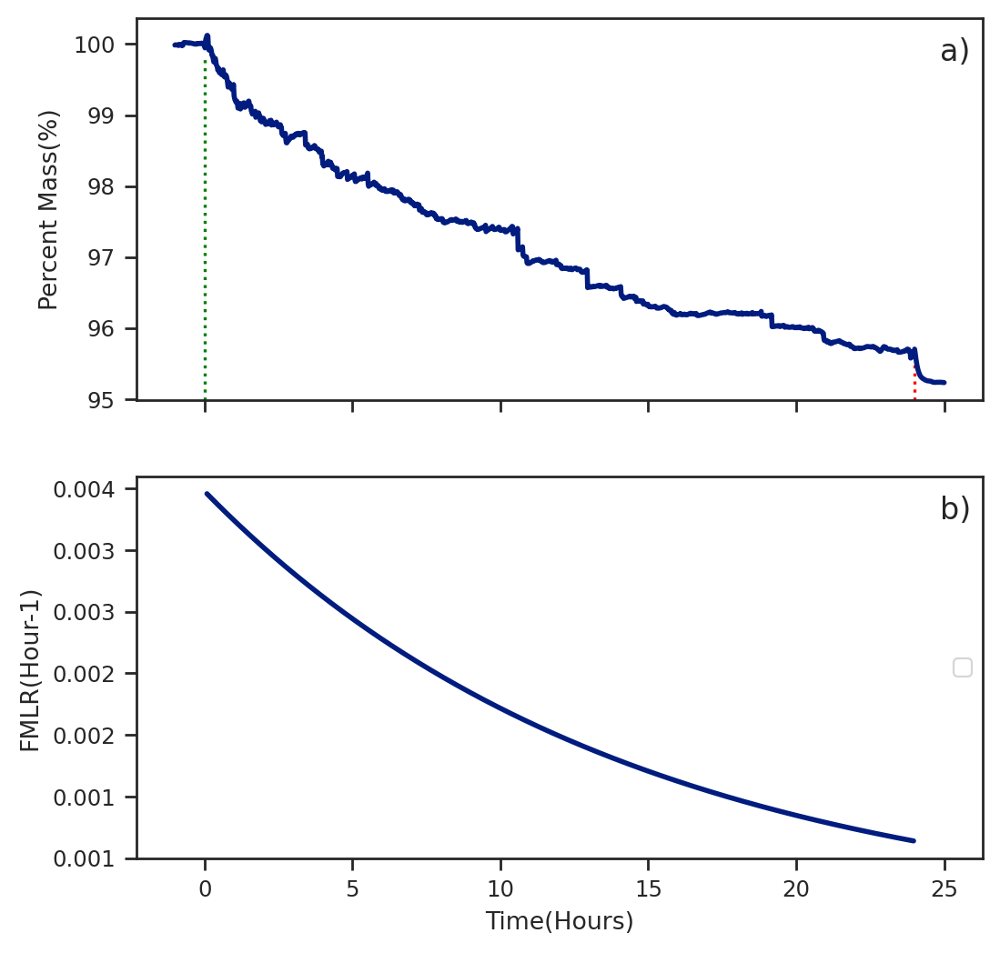

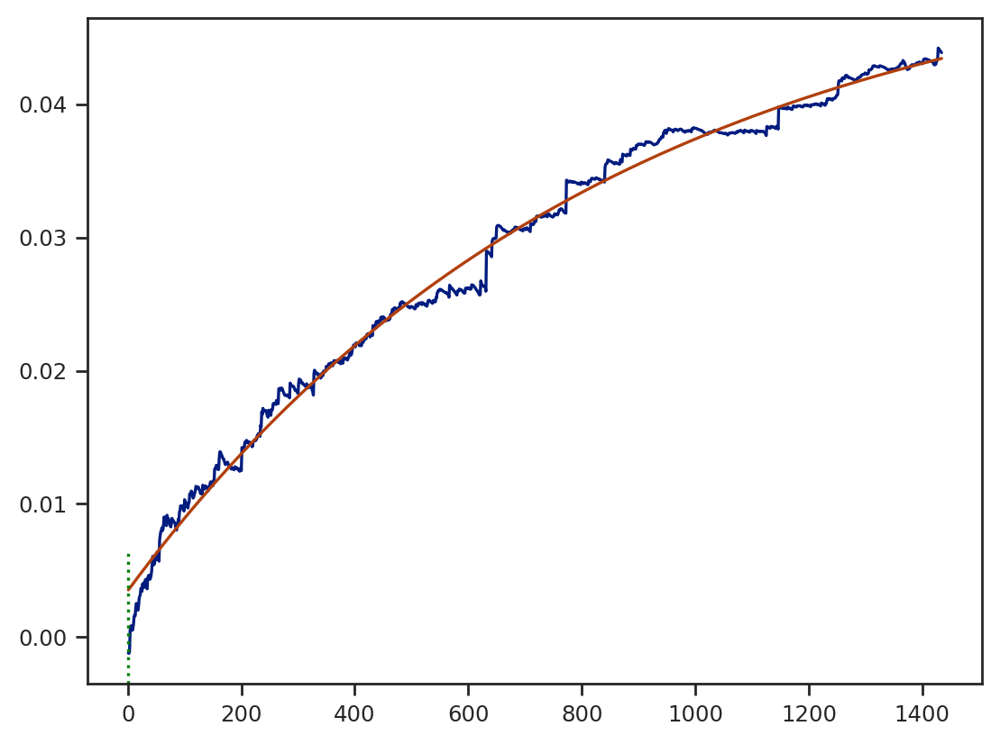

In [138]:
###SRHA N2 07-28 305

path_1 = 'data/7_28_305nm_SRHA/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='7/29/2022 10:31:42',f0=5004752.459,f1=4995804.538,time_frame=['7/29/2022 2:00:00','7/30/2022 12:00:00'],fit_time=['7/29/2022 10:36:00','7/30/2022 10:30:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-08-05 07:00:39.152  4.997536e+06
2022-08-05 07:01:39.152  4.997535e+06
2022-08-05 07:02:39.152  4.997536e+06
2022-08-05 07:03:39.152  4.997536e+06
2022-08-05 07:04:39.152  4.997535e+06
...                               ...
2022-08-06 11:32:39.152  4.997894e+06
2022-08-06 11:33:39.152  4.997894e+06
2022-08-06 11:34:39.152  4.997894e+06
2022-08-06 11:35:39.152  4.997894e+06
2022-08-06 11:36:39.152  4.997894e+06

[1717 rows x 1 columns]
Loading 5412.48900000006
[-6.15023474e-02  5.05919649e+02  6.12268885e-02]
[[1.50085360e-04            nan            nan]
 [           nan 3.90070428e+00 2.34112356e-02]
 [           nan 2.34112356e-02 1.53318060e-04]]
top speed: 0.007279523794858135 end speed: 0.0004285275925208245


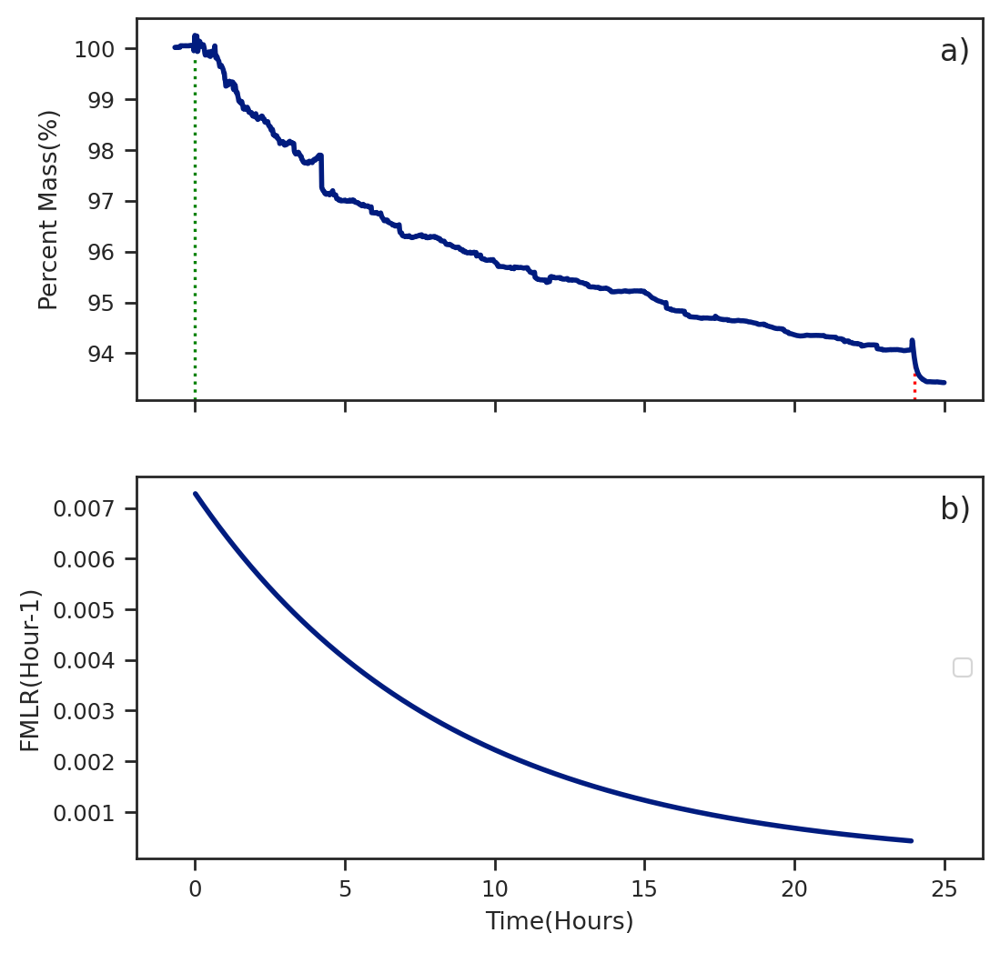

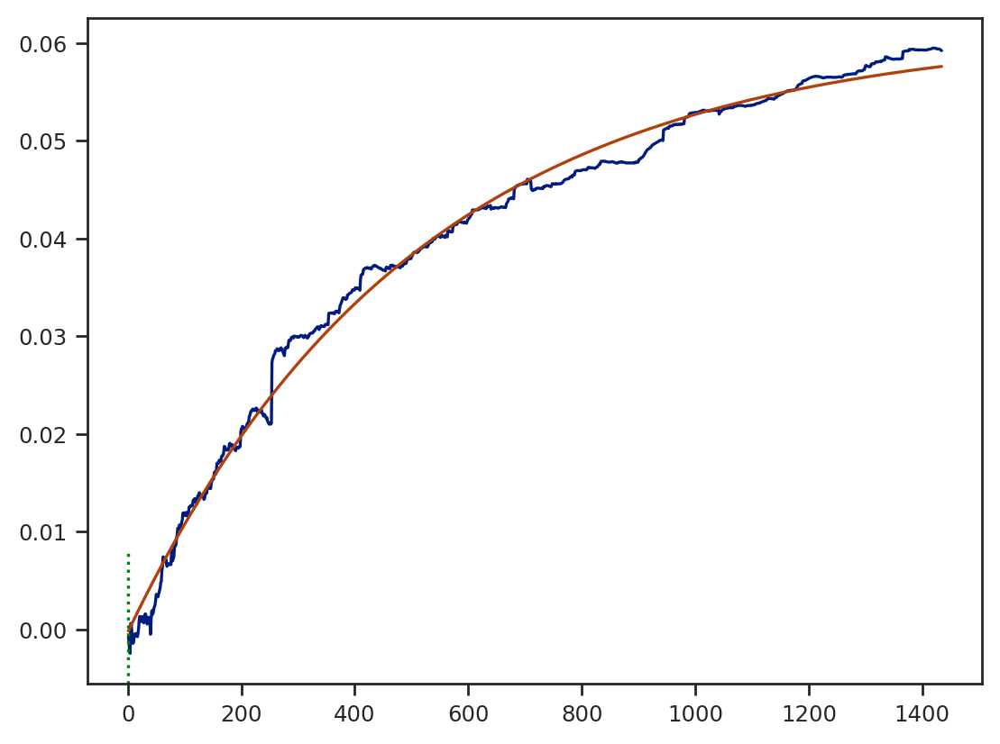

In [139]:
###SRHA N2 08-04 305

path_1 = 'data/8_4_405_305_SRHA/B.xlsx'
_=qcm_to_speed_plot(path_1,t0='8/5/2022 7:41:00',f0=5002949.062,f1=4997536.573,time_frame=['8/5/2022 7:00:00','8/6/2022 23:00:00'],fit_time=['8/5/2022 7:41:00','8/6/2022 7:35:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-08-15 12:00:56.386  4.993545e+06
2022-08-15 12:01:56.386  4.993545e+06
2022-08-15 12:02:56.386  4.993545e+06
2022-08-15 12:03:56.386  4.993545e+06
2022-08-15 12:04:56.386  4.993545e+06
...                               ...
2022-08-16 17:55:56.386  4.994047e+06
2022-08-16 17:56:56.386  4.994047e+06
2022-08-16 17:57:56.386  4.994047e+06
2022-08-16 17:58:56.386  4.994047e+06
2022-08-16 17:59:56.386  4.994047e+06

[1800 rows x 1 columns]
Loading 9445.407999999821
[-5.94439524e-02  9.49204571e+02  6.31214450e-02]
[[3.02512326e-04            nan            nan]
 [           nan 1.09498677e+01 6.15282529e-02]
 [           nan 6.15282529e-02 3.52833589e-04]]
top speed: 0.00375354452682576 end speed: 0.0008569929572742551


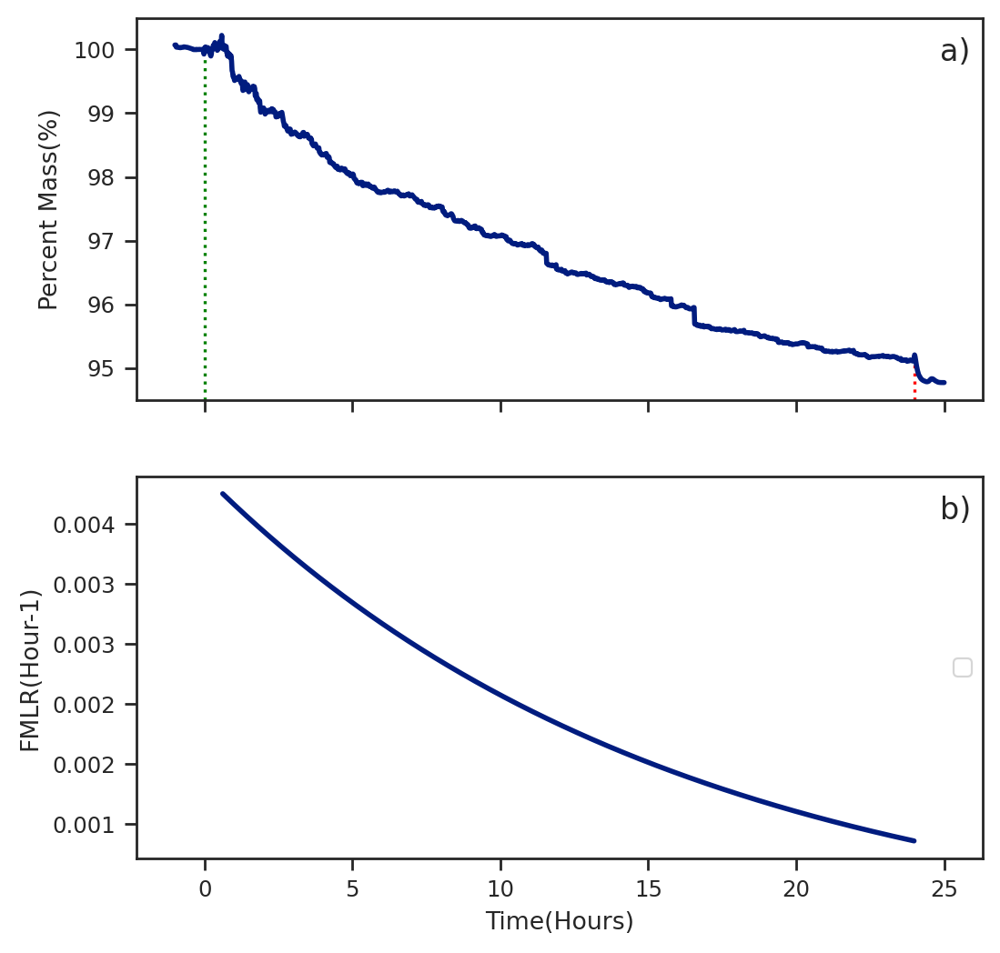

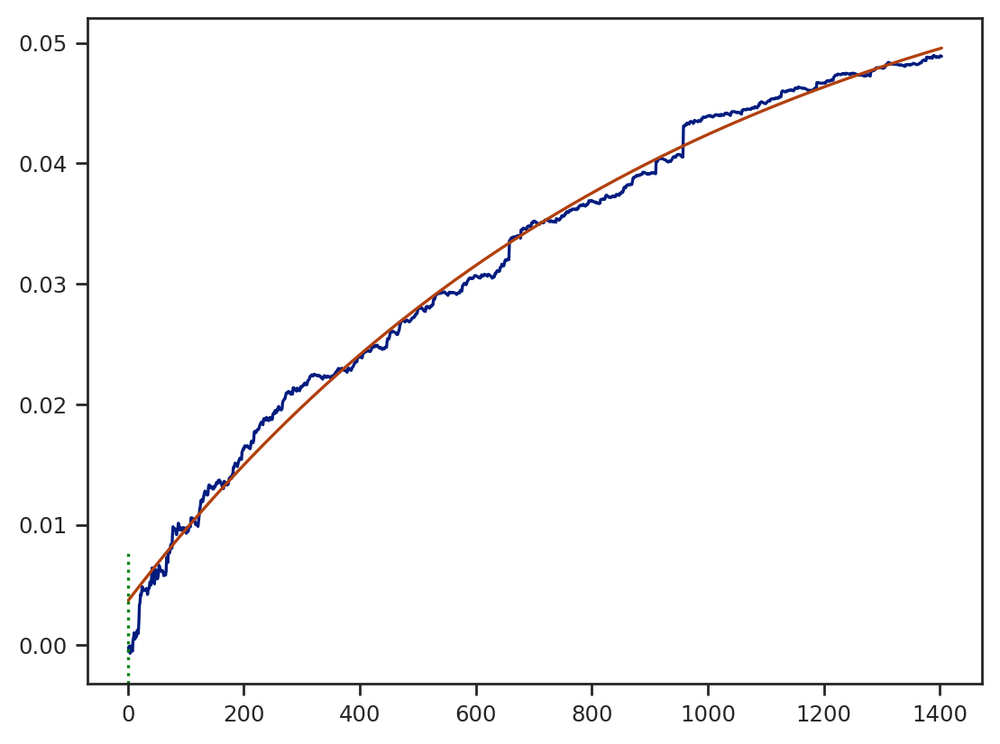

In [140]:
###SRHA N2 08-16 305

path_1 = 'data/8_16_SRHA_305_crystal_1b/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='8/15/2022 14:02:00',f0=5003001.302,f1=4993555.894,time_frame=['8/15/2022 12:00:00','8/16/2022 18:00:00'],fit_time=['8/15/2022 14:38:00','8/16/2022 14:01:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-07-23 04:00:35.907  4.994512e+06
2022-07-23 04:01:35.907  4.994512e+06
2022-07-23 04:02:35.907  4.994511e+06
2022-07-23 04:03:35.907  4.994511e+06
2022-07-23 04:04:35.907  4.994511e+06
...                               ...
2022-07-24 11:55:35.907  4.994870e+06
2022-07-24 11:56:35.907  4.994870e+06
2022-07-24 11:57:35.907  4.994870e+06
2022-07-24 11:58:35.907  4.994870e+06
2022-07-24 11:59:35.907  4.994869e+06

[1920 rows x 1 columns]
Loading 9662.753999999724
[-2.94443500e-02  5.43070768e+02  6.29775949e-02]
[[1.39573296e-04            nan            nan]
 [           nan 8.24036584e+00 3.41760470e-02]
 [           nan 3.41760470e-02 1.52740503e-04]]
top speed: 0.0032471106902807255 end speed: 0.00023074155165555662


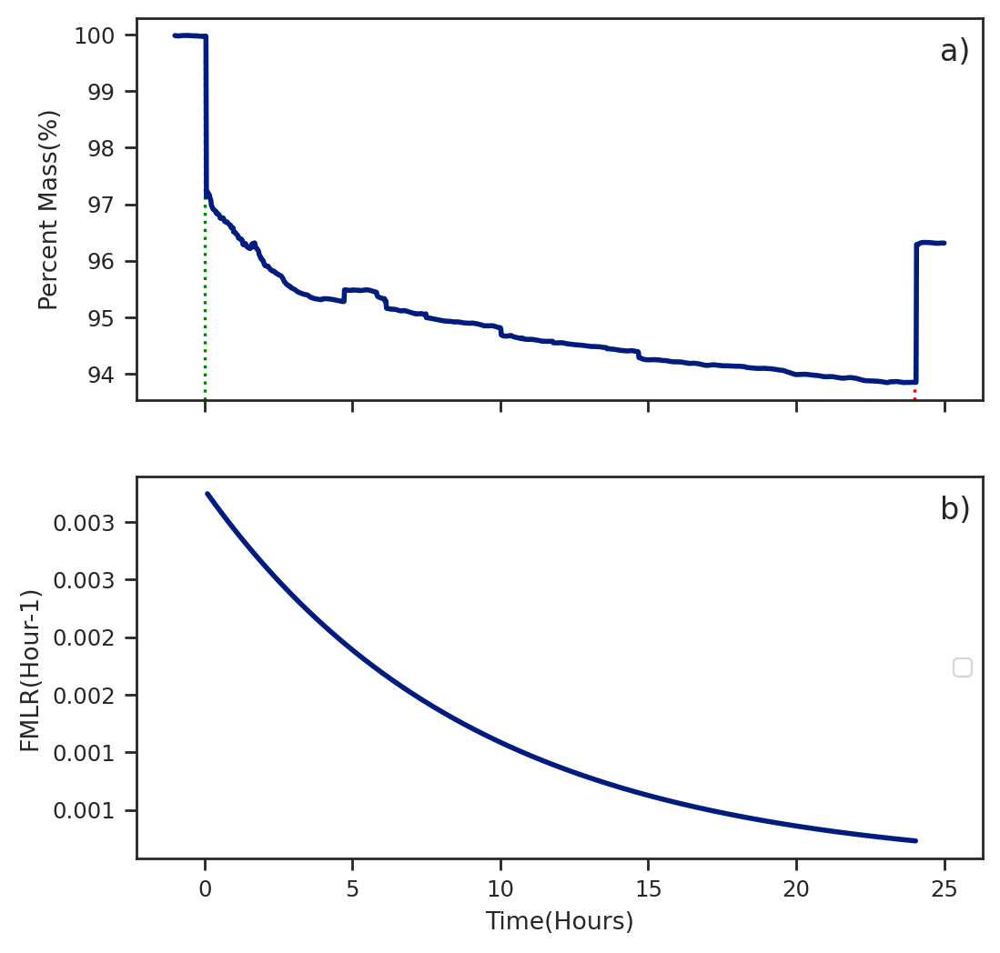

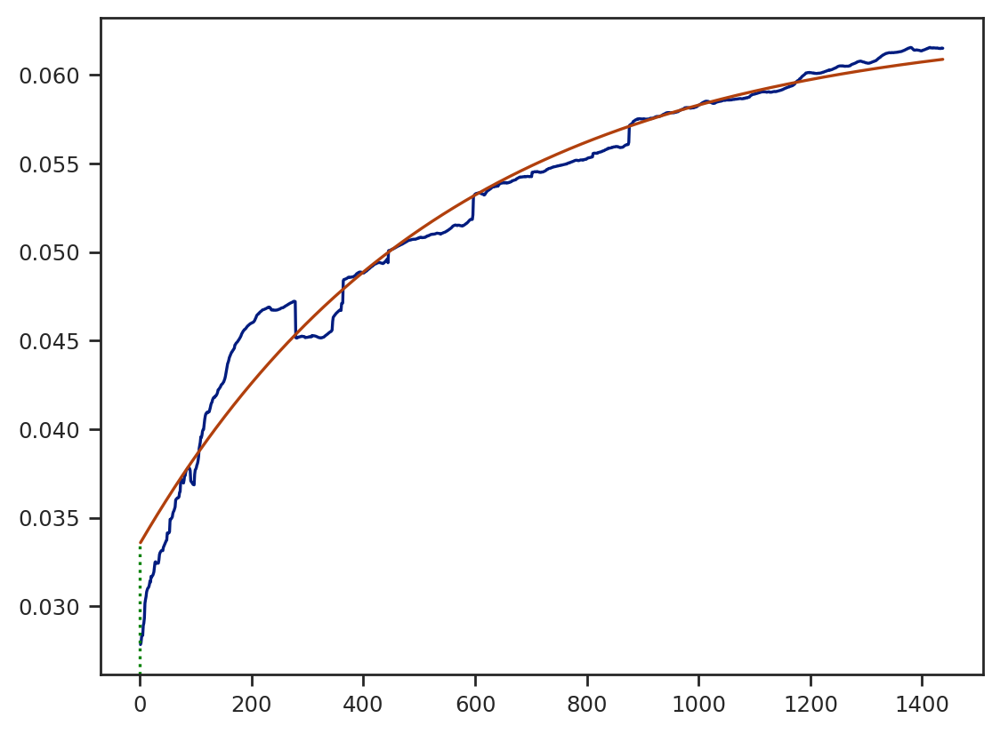

In [142]:
###SRHA N2 07-21 405

path_1 = 'data/7_21_405nm/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='7/23/2022 07:47:00',f0=5004177.197,f1=4994514.443,time_frame=['7/23/2022 4:00:00','7/24/2022 12:00:00'],fit_time=['7/23/2022 7:52:00','7/24/2022 07:49:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-07-26 12:00:25.148  5.000545e+06
2022-07-26 12:01:25.148  5.000545e+06
2022-07-26 12:02:25.148  5.000545e+06
2022-07-26 12:03:25.148  5.000545e+06
2022-07-26 12:04:25.148  5.000545e+06
...                               ...
2022-07-28 05:53:25.148  5.000812e+06
2022-07-28 05:54:25.148  5.000812e+06
2022-07-28 05:55:25.148  5.000812e+06
2022-07-28 05:56:25.148  5.000812e+06
2022-07-28 05:57:25.148  5.000812e+06

[2518 rows x 1 columns]
Loading 3980.0800000000745
[-6.31086687e-02  8.63305992e+02  1.44877197e-01]
[[2.38921684e-04            nan            nan]
 [           nan 8.12614442e+00 4.75359021e-02]
 [           nan 4.75359021e-02 2.85405369e-04]]
top speed: 0.0043809919387826305 end speed: 0.0008388923139381567


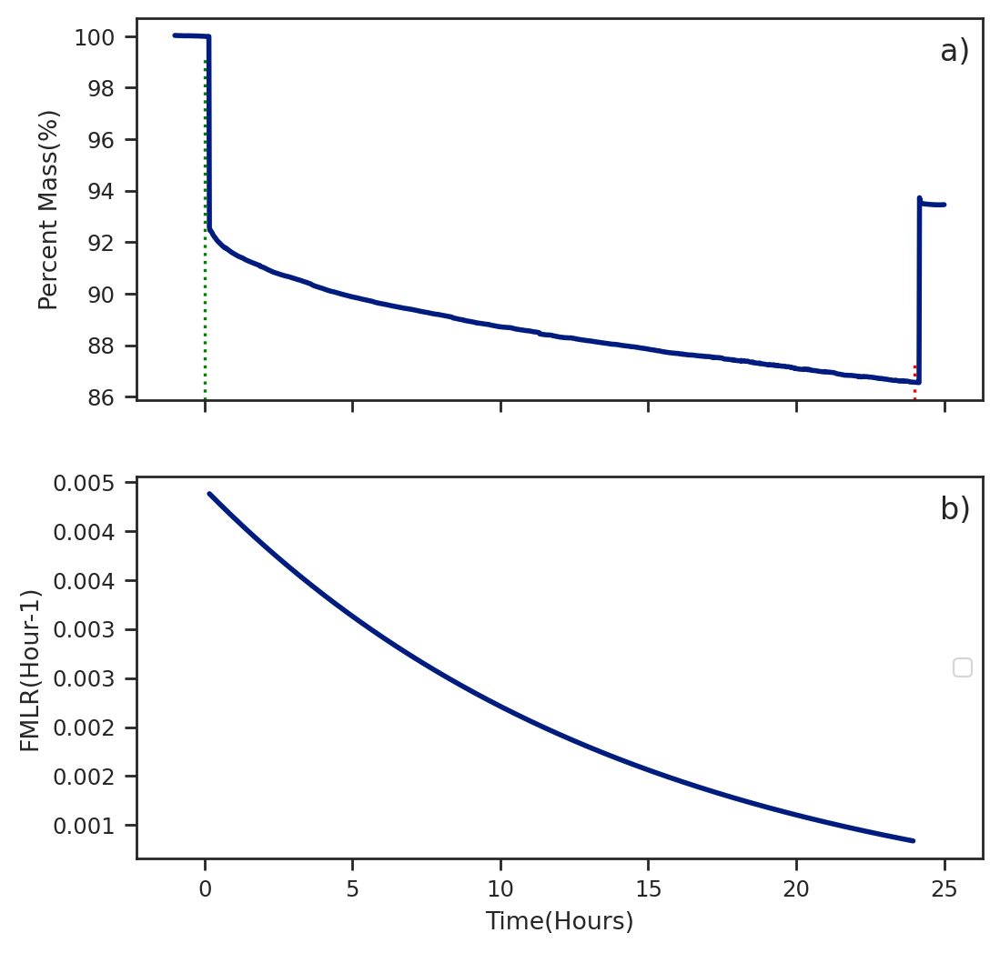

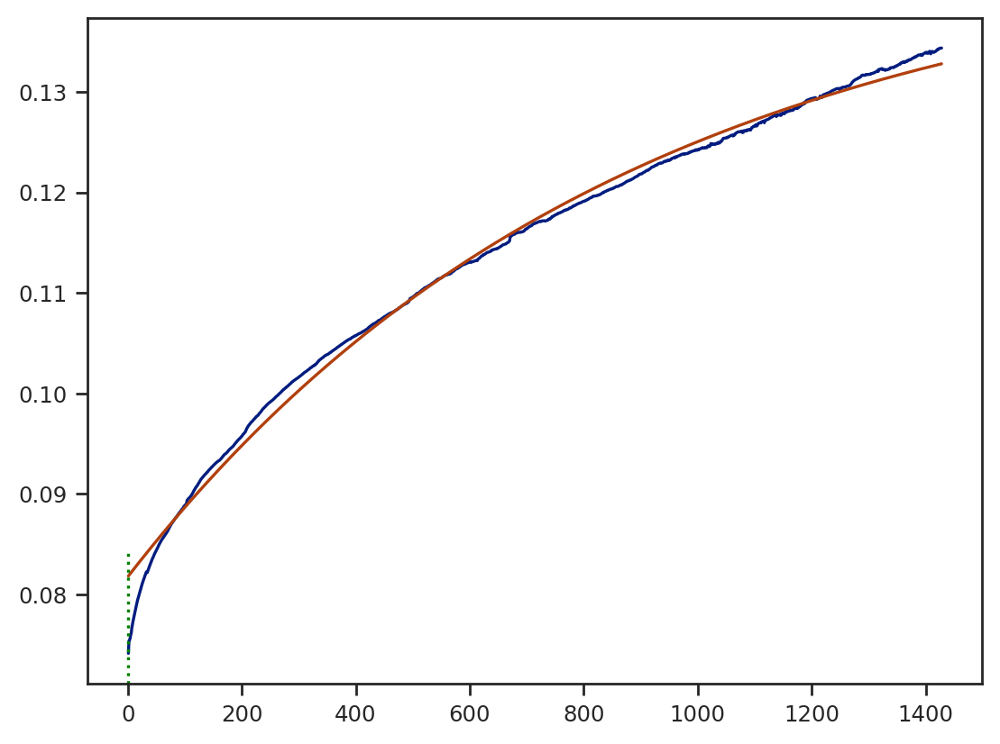

In [144]:
###SRHA N2 07-25 405

path_1 = 'data/7_25_405nm_SRHA/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='7/26/2022 16:51:00',f0=5004531.592,f1=5000551.512,time_frame=['7/26/2022 12:00:00','7/28/2022 12:00:00'],fit_time=['7/26/2022 17:00:00','7/27/2022 16:48:00'])

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-08-12 04:00:49.329  5.000638e+06
2022-08-12 04:01:49.329  5.000638e+06
2022-08-12 04:02:49.329  5.000638e+06
2022-08-12 04:03:49.329  5.000638e+06
2022-08-12 04:04:49.329  5.000639e+06
...                               ...
2022-08-13 11:55:49.329  5.000964e+06
2022-08-13 11:56:49.329  5.000964e+06
2022-08-13 11:57:49.329  5.000964e+06
2022-08-13 11:58:49.329  5.000964e+06
2022-08-13 11:59:49.329  5.000964e+06

[1920 rows x 1 columns]
Loading 3540.938000000082
[-8.08682114e-02  7.02719231e+02  1.70938195e-01]
[[3.09127041e-04            nan            nan]
 [           nan 7.88417510e+00 5.34241945e-02]
 [           nan 5.34241945e-02 3.77472717e-04]]
top speed: 0.0068949199614788265 end speed: 0.0008921432755285532


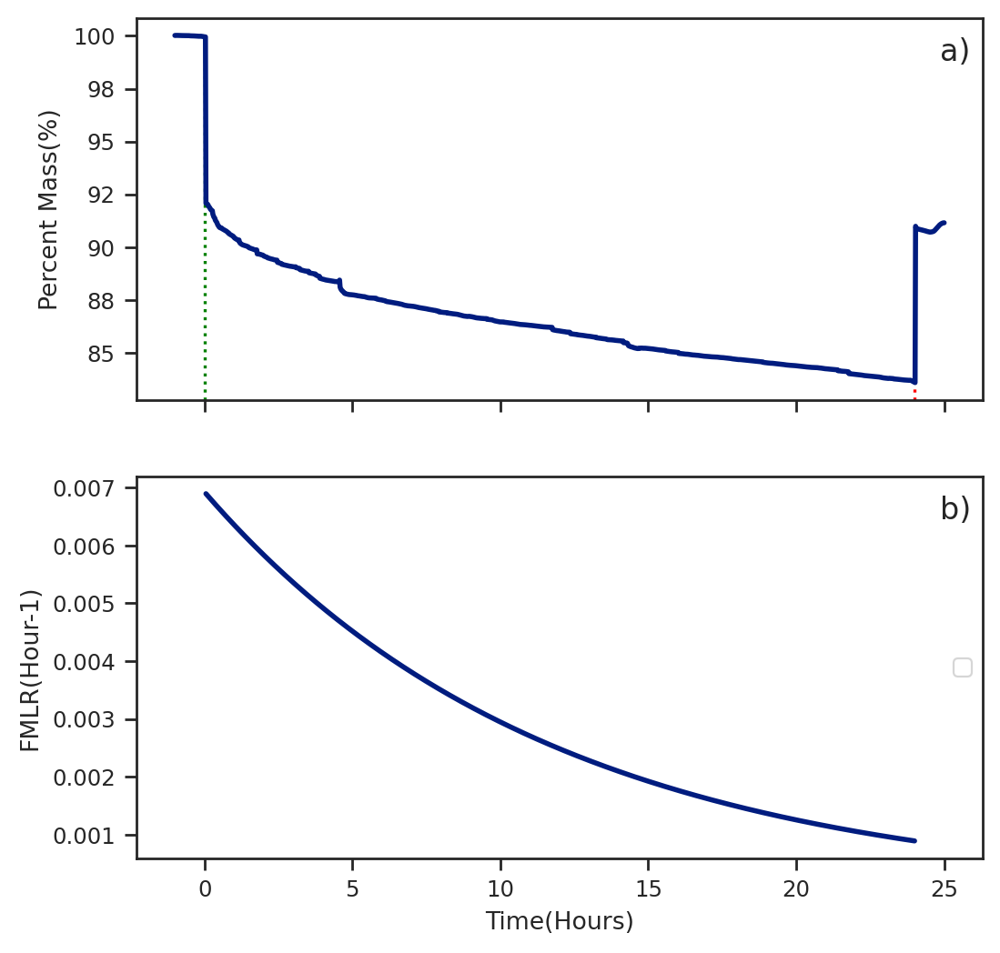

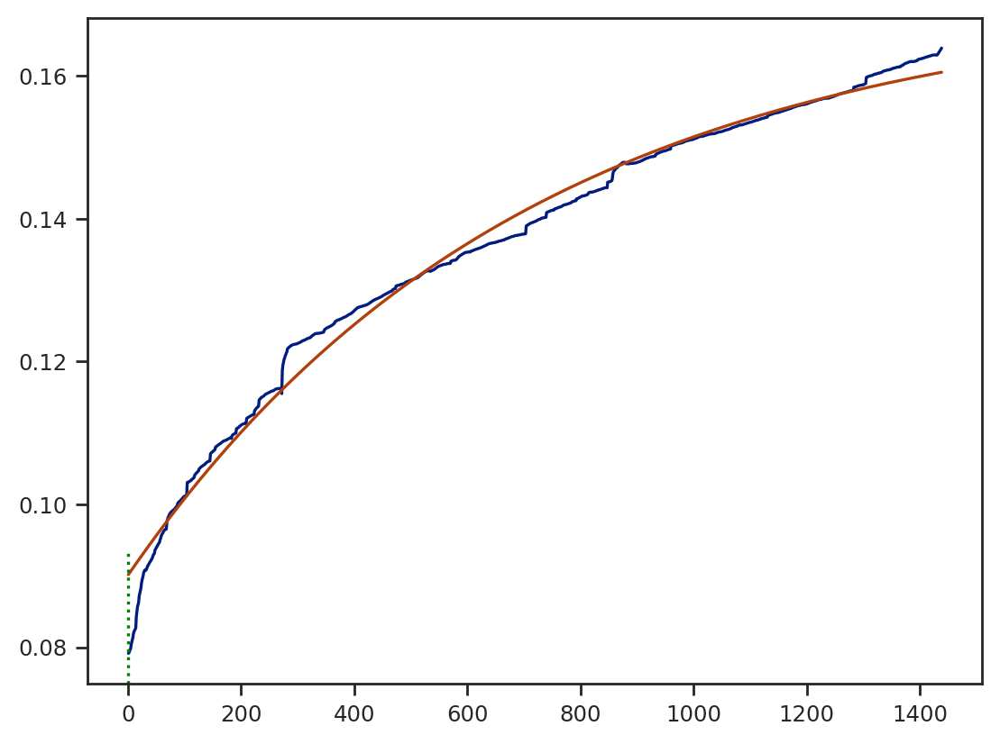

In [145]:
###SRHA N2 08-12 405
path_1 = 'data/8_12_SRHA_405_crystal_4b/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='8/12/2022 6:59:00',f0=5004183.775,f1=5000642.837,time_frame=['8/12/2022 4:00:00','8/13/2022 12:00:00'],fit_time=['8/12/2022 7:01:00','8/13/2022 6:59:00'])

In [146]:
#####SRFA N2

###
###
####

/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-08-22 15:00:11.070  5.001422e+06
2022-08-22 15:01:11.070  5.001423e+06
2022-08-22 15:02:11.070  5.001423e+06
2022-08-22 15:03:11.070  5.001424e+06
2022-08-22 15:04:11.070  5.001424e+06
...                               ...
2022-08-23 17:55:11.070  5.002036e+06
2022-08-23 17:56:11.070  5.002036e+06
2022-08-23 17:57:11.070  5.002036e+06
2022-08-23 17:58:11.070  5.002036e+06
2022-08-23 17:59:11.070  5.002036e+06

[1620 rows x 1 columns]
Loading 2817.3919999999925
[-1.84180977e-01  5.04650606e+02  2.04602384e-01]
[[4.39398245e-04            nan            nan]
 [           nan 3.80170910e+00 3.94986579e-02]
 [           nan 3.94986579e-02 4.47948288e-04]]
top speed: 0.021854689422808715 end speed: 0.001279934236673059


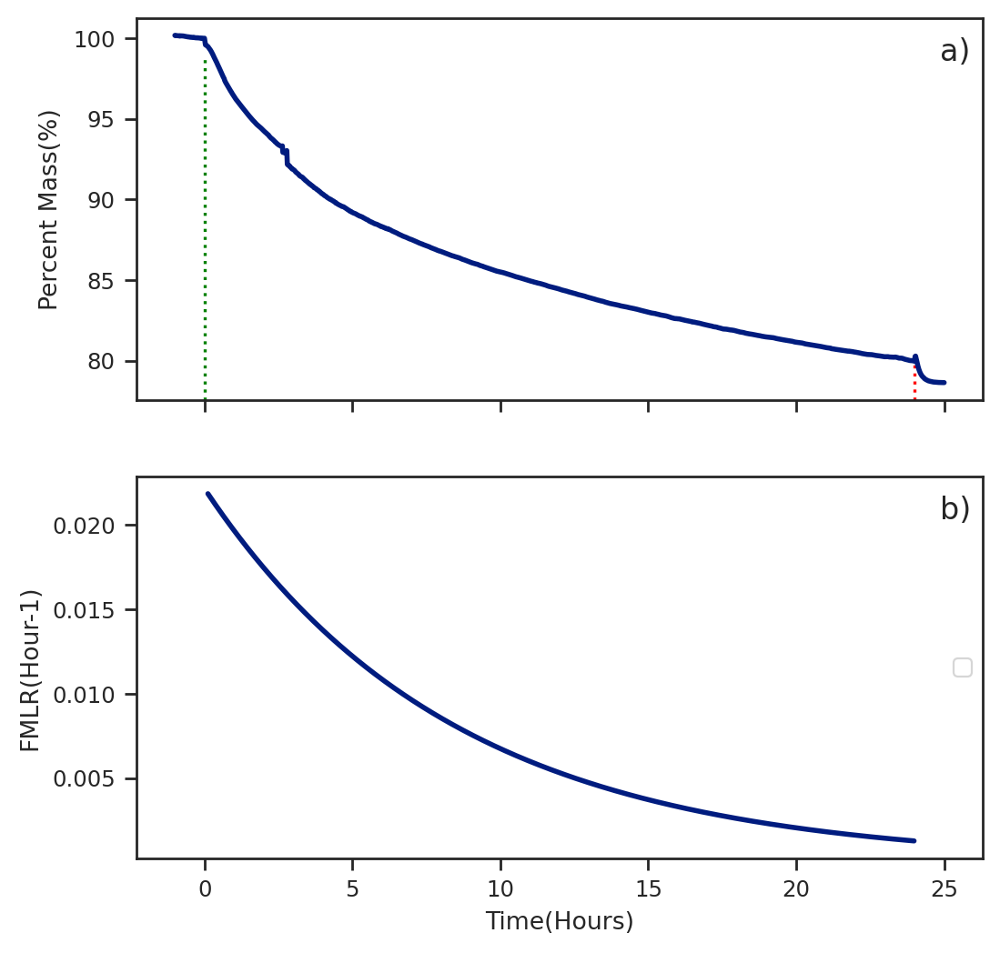

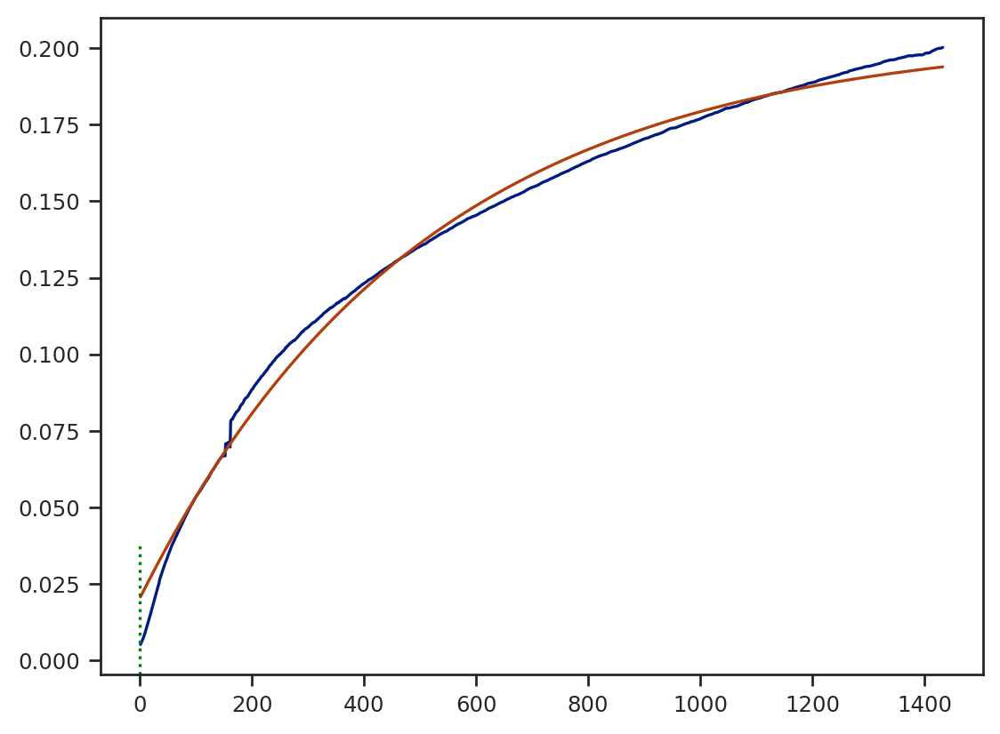

In [147]:
#### 8-22 254


path_1 = 'data/8_22_SRFA_254_4a/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='8/22/2022 17:00:00',f0=5004252.263,f1=5001434.871,time_frame=['8/22/2022 15:00:00','8/23/2022 18:00:00'],fit_time=['8/22/2022 17:06:00','8/23/2022 16:59:00'])


/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-08-24 07:00:12.125  5.000594e+06
2022-08-24 07:01:12.125  5.000594e+06
2022-08-24 07:02:12.125  5.000594e+06
2022-08-24 07:03:12.125  5.000594e+06
2022-08-24 07:04:12.125  5.000594e+06
...                               ...
2022-08-25 08:55:12.125  5.001148e+06
2022-08-25 08:56:12.125  5.001148e+06
2022-08-25 08:57:12.125  5.001148e+06
2022-08-25 08:58:12.125  5.001148e+06
2022-08-25 08:59:12.125  5.001148e+06

[1560 rows x 1 columns]
Loading 2446.097000000067
[-1.82214023e-01  5.53225583e+02  2.18991751e-01]
[[4.56853227e-04            nan            nan]
 [           nan 4.44314239e+00 4.60415925e-02]
 [           nan 4.60415925e-02 5.11750159e-04]]
top speed: 0.01972630614257506 end speed: 0.0015091899299783764


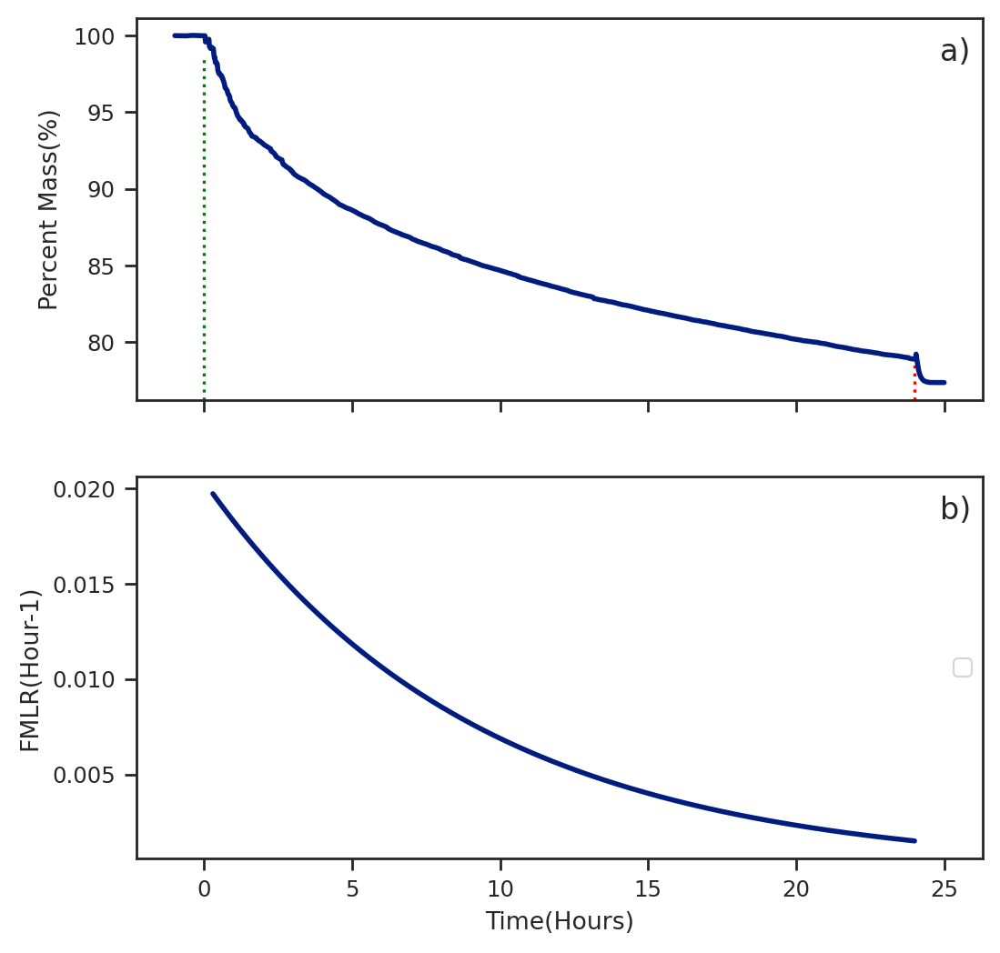

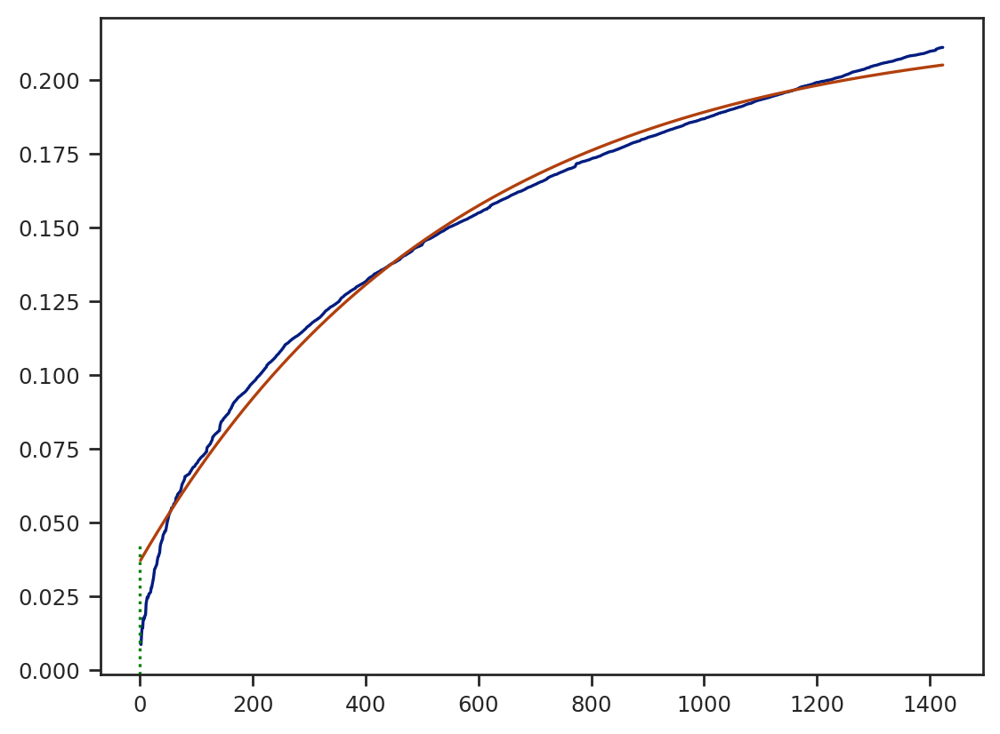

In [148]:
#### 8-24 254


path_1 = 'data/8_24_SRFA_254_1b/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='8/24/2022 8:00:00',f0=5003040.37,f1=5000594.273,time_frame=['8/24/2022 7:00:00','8/25/2022 9:00:00'],fit_time=['8/24/2022 8:17:00','8/25/2022 8:00:00'])


/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-09-08 13:00:06.439  5.000770e+06
2022-09-08 13:01:06.439  5.000770e+06
2022-09-08 13:02:06.439  5.000771e+06
2022-09-08 13:03:06.439  5.000771e+06
2022-09-08 13:04:06.439  5.000771e+06
...                               ...
2022-09-09 15:55:06.439  5.001635e+06
2022-09-09 15:56:06.439  5.001635e+06
2022-09-09 15:57:06.439  5.001635e+06
2022-09-09 15:58:06.439  5.001635e+06
2022-09-09 15:59:06.439  5.001635e+06

[1620 rows x 1 columns]
Loading 3798.7960000000894
[-1.93184621e-01  5.51146007e+02  2.23436623e-01]
[[4.97575541e-04            nan            nan]
 [           nan 4.54760730e+00 4.84285044e-02]
 [           nan 4.84285044e-02 5.53885383e-04]]
top speed: 0.020992741148000704 end speed: 0.001573357302814612


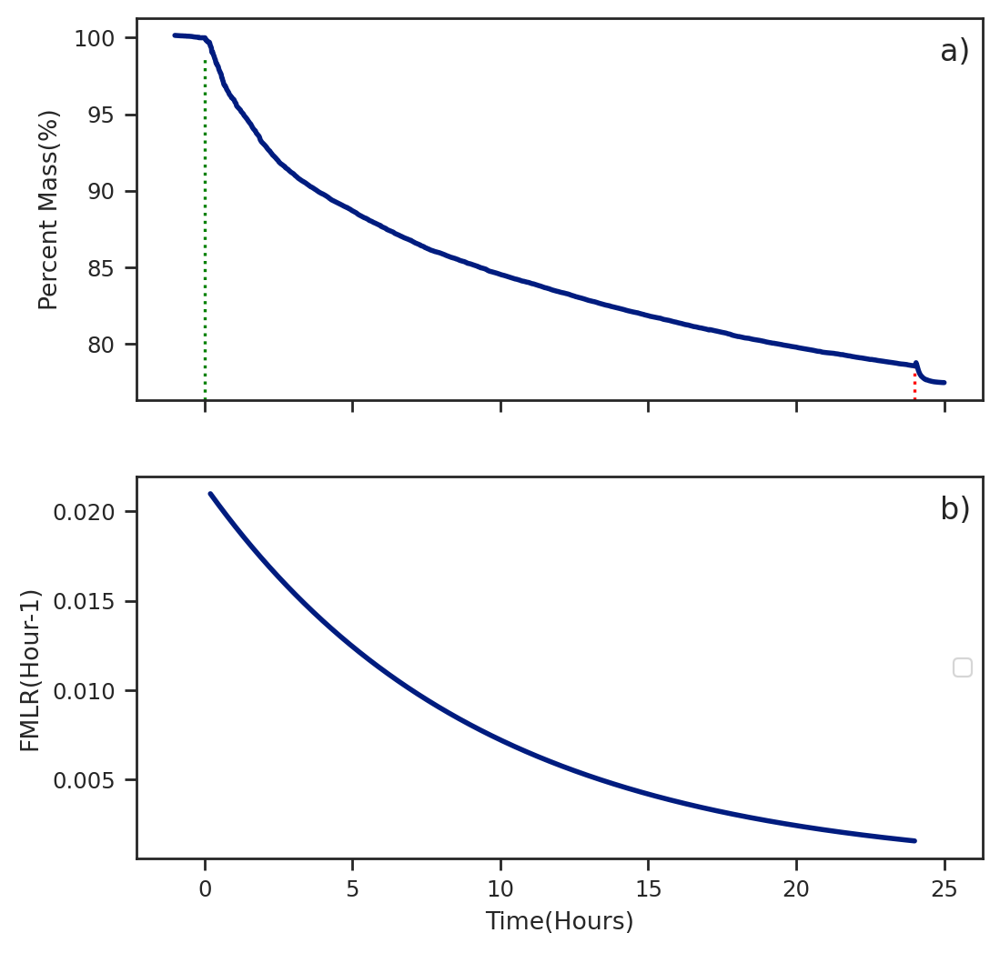

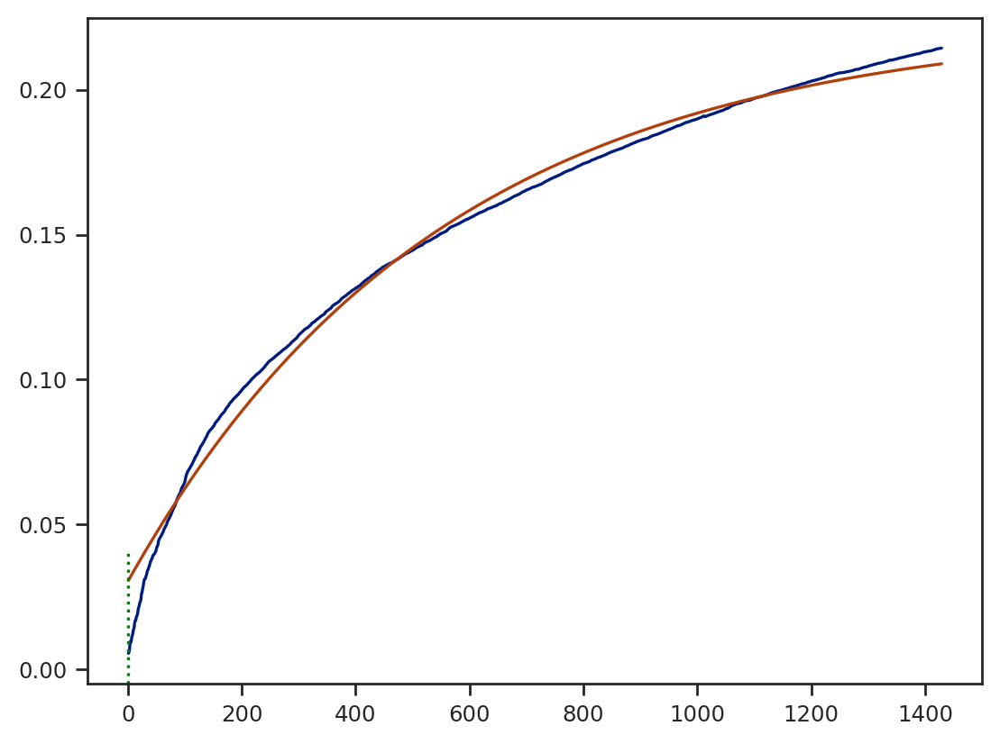

In [149]:
#### 9-08 254




path_1 = 'data/9_8_SRFA_254_3b/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='9/8/2022 14:03:00',f0=5004575.21,f1=5000776.414,time_frame=['9/8/2022 13:00:00','9/9/2022 16:00:00'],fit_time=['9/8/2022 14:14:00','9/9/2022 14:03:00'])


/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2022-08-28 06:00:11.253  5.008066e+06
2022-08-28 06:01:11.253  5.008066e+06
2022-08-28 06:02:11.253  5.008066e+06
2022-08-28 06:03:11.253  5.008066e+06
2022-08-28 06:04:11.253  5.008066e+06
...                               ...
2022-08-29 08:55:11.253  5.008307e+06
2022-08-29 08:56:11.253  5.008307e+06
2022-08-29 08:57:11.253  5.008307e+06
2022-08-29 08:58:11.253  5.008307e+06
2022-08-29 08:59:11.253  5.008307e+06

[1620 rows x 1 columns]
Loading 2040.5029999995604
[-1.26135114e-01  8.83089100e+02  1.32867798e-01]
[[4.17647980e-04            nan            nan]
 [           nan 7.15937782e+00 5.89133086e-02]
 [           nan 5.89133086e-02 4.97054096e-04]]
top speed: 0.008560338568666401 end speed: 0.0016894903671028547


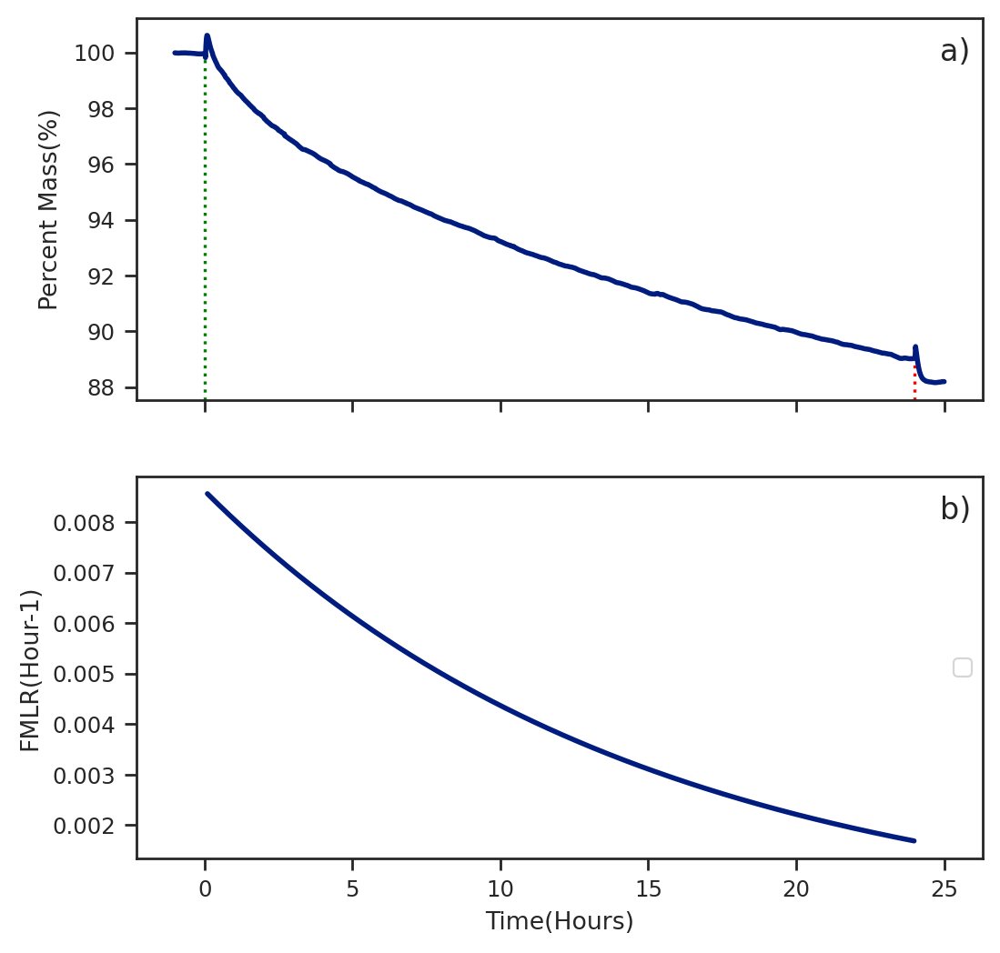

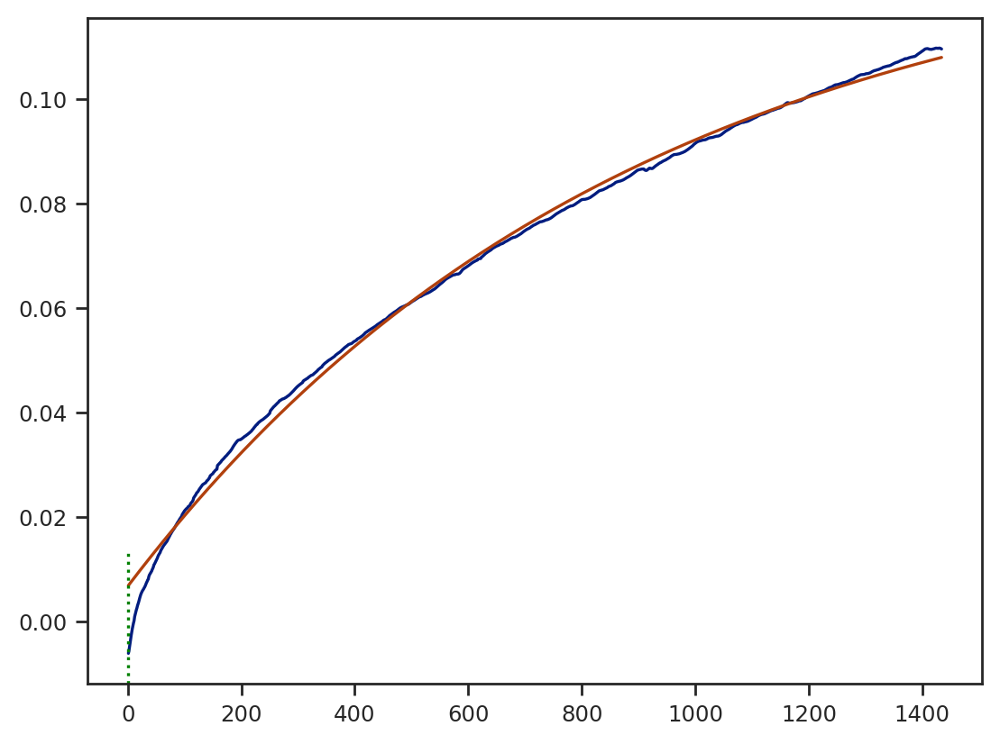

In [150]:
###305 08-28

path_1 = 'data/8_28_SRFA_305_4b/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='8/28/2022 07:10:00',f0=5010106.679,f1=5008066.176,time_frame=['8/28/2022 06:00:00','8/29/2022 9:00:00'],fit_time=['8/28/2022 07:15:00','8/29/2022 07:09:00'])


/tmp/ipykernel_238543/266386895.py:82: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


                                    A
Time                                 
2023-03-25 20:00:56.081  5.005160e+06
2023-03-25 20:01:56.081  5.005160e+06
2023-03-25 20:02:56.081  5.005160e+06
2023-03-25 20:03:56.081  5.005160e+06
2023-03-25 20:04:56.081  5.005160e+06
...                               ...
2023-03-26 22:25:56.081  5.005423e+06
2023-03-26 22:26:56.081  5.005423e+06
2023-03-26 22:27:56.081  5.005423e+06
2023-03-26 22:28:56.081  5.005423e+06
2023-03-26 22:29:56.081  5.005423e+06

[1590 rows x 1 columns]
Loading 3509.55700000003
[-8.73028813e-02  1.01250085e+03  8.36637913e-02]
[[4.23408098e-04            nan            nan]
 [           nan 1.07705031e+01 7.19285106e-02]
 [           nan 7.19285106e-02 4.89368852e-04]]
top speed: 0.005168392633012254 end speed: 0.0012526721324583024


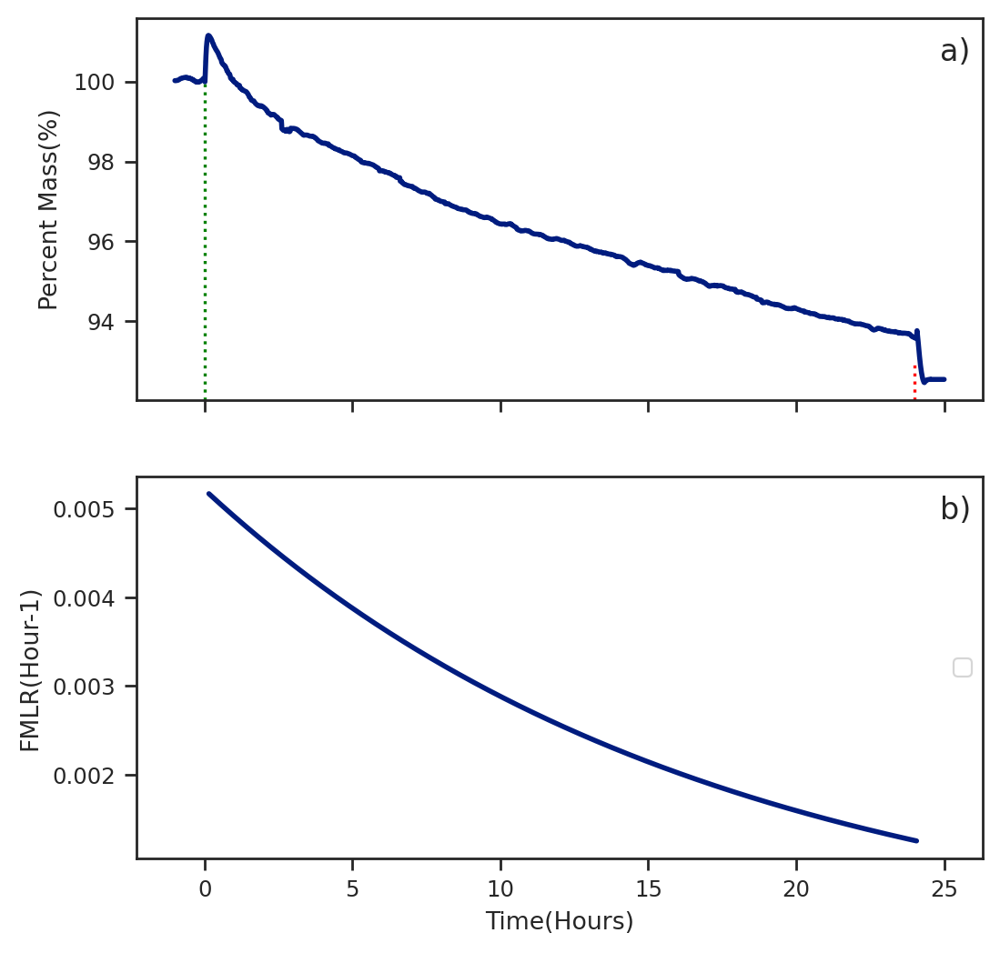

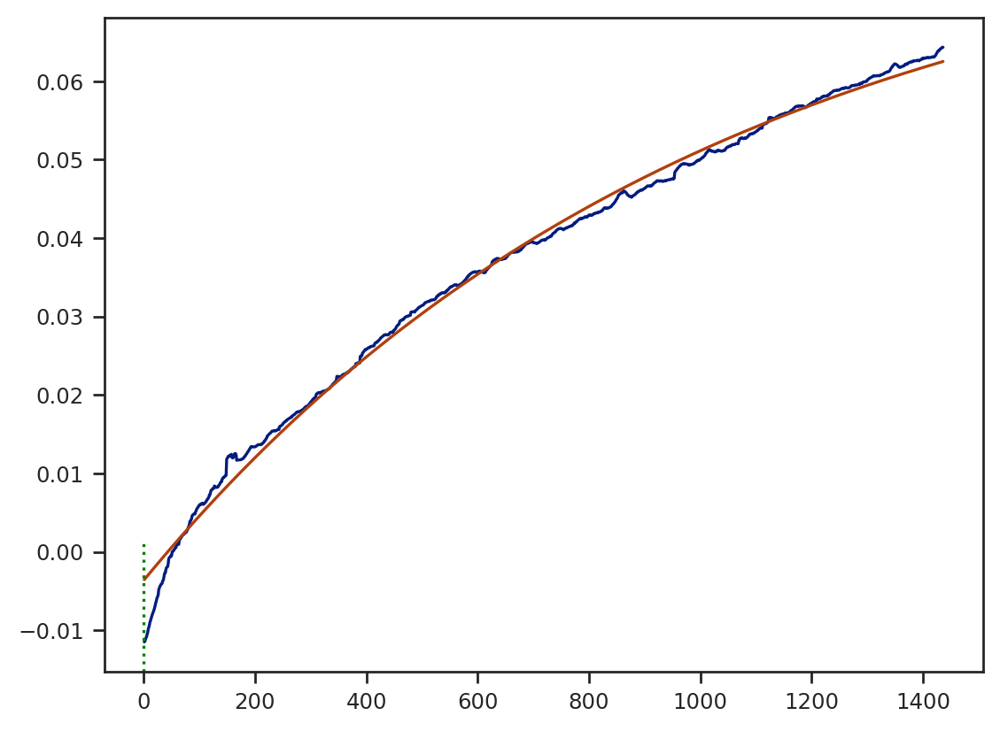

In [154]:
###305 23 03-25


path_1 = 'data/3_25_SRFA_405_305_N2_2A_B/B.xlsx'
_=qcm_to_speed_plot(path_1,t0='3/25/2023 21:55:00',f0=5008670.579,f1=5005161.022,time_frame=['3/25/23 20:00:00','3/26/2023 22:30:00'],fit_time=['3/25/2023 22:03:00','3/26/2023 21:59:00'])


/tmp/ipykernel_238543/1117680905.py:83: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 4183.915000000037
                          A
-1 days +23:00:00  1.000450
-1 days +23:01:00  1.000453
-1 days +23:02:00  1.000449
-1 days +23:03:00  1.000412
-1 days +23:04:00  1.000392
...                     ...
1 days 03:56:00    0.918087
1 days 03:57:00    0.918087
1 days 03:58:00    0.918087
1 days 03:59:00    0.918087
1 days 04:00:00    0.918087

[1741 rows x 1 columns]
[-8.39409584e-02  8.83472619e+02  8.69071207e-02]
[[3.57589162e-04            nan            nan]
 [           nan 9.21709857e+00 6.18540722e-02]
 [           nan 6.18540722e-02 4.25599160e-04]]
top speed: 0.005694302089085637 end speed: 0.0011233617523654592


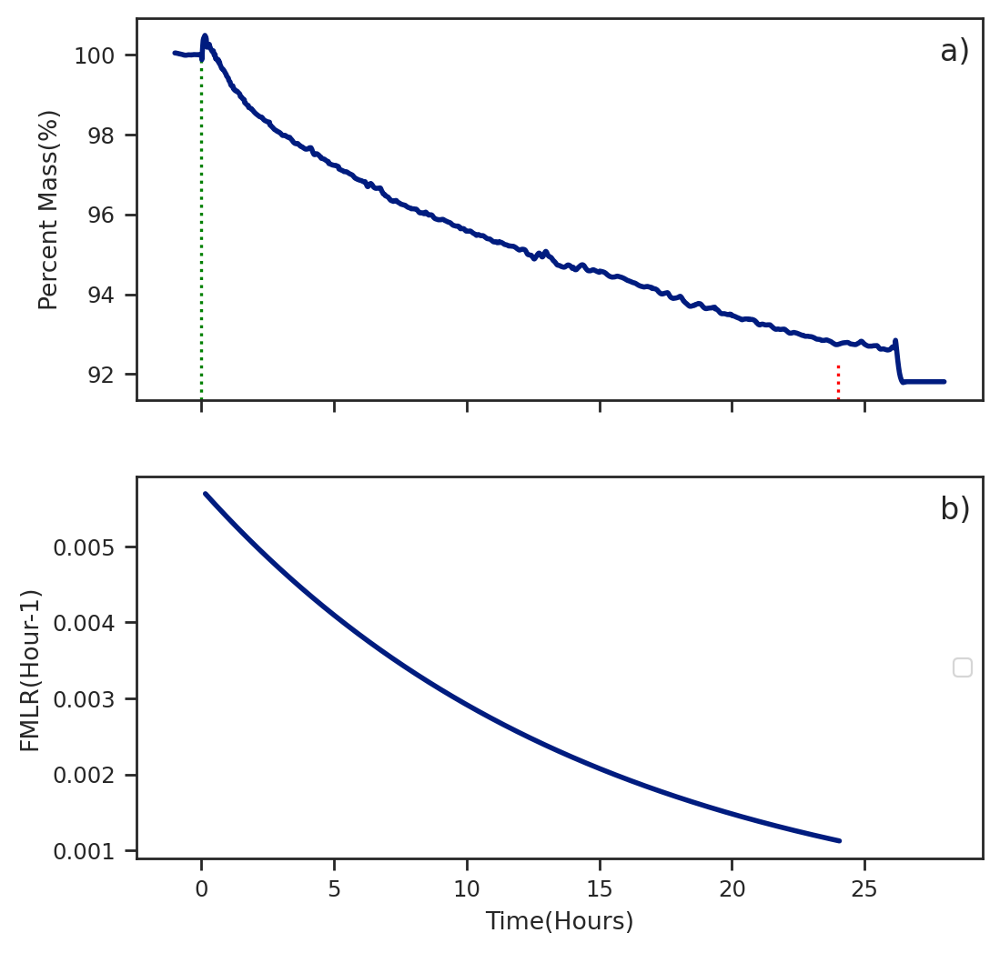

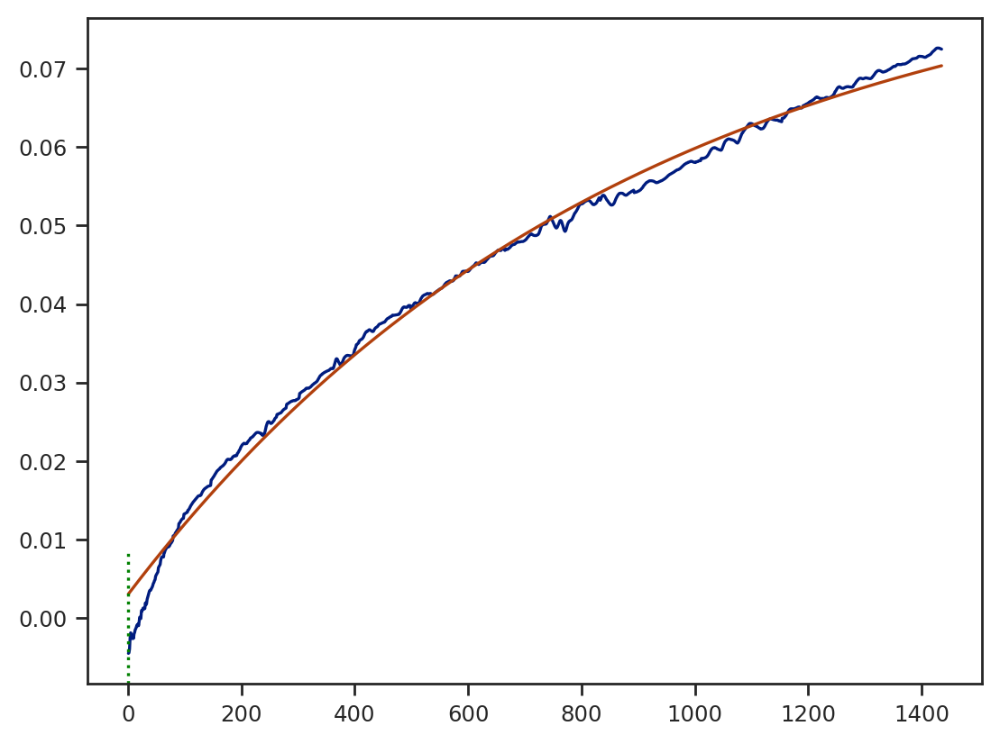

In [166]:
###305 23 03-28


path_1 = 'data/3_28_SRFA_405_305_2C_2D/B.xlsx'
_=qcm_to_speed_plot(path_1,t0='3/29/2023 20:57:00',f0=5005582,f1=5001398.085,time_frame=['3/29/2023 19:00:00','3/30/2023 23:30:00'],fit_time=['3/29/2023 21:05:00','3/30/2023 21:00:00'])


/tmp/ipykernel_238543/1117680905.py:83: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 3000.849000000395
                          A
-1 days +23:00:00  1.000910
-1 days +23:01:00  1.000888
-1 days +23:02:00  1.000865
-1 days +23:03:00  1.000848
-1 days +23:04:00  1.000829
...                     ...
1 days 03:56:00    0.905874
1 days 03:57:00    0.905874
1 days 03:58:00    0.905874
1 days 03:59:00    0.905874
1 days 04:00:00    0.905874

[1741 rows x 1 columns]
[-9.40348961e-02  9.10611814e+02  1.77058376e-01]
[[3.43828462e-04            nan            nan]
 [           nan 7.95246851e+00 5.62054184e-02]
 [           nan 5.62054184e-02 4.06643180e-04]]
top speed: 0.00618913695305219 end speed: 0.0012814986667728772


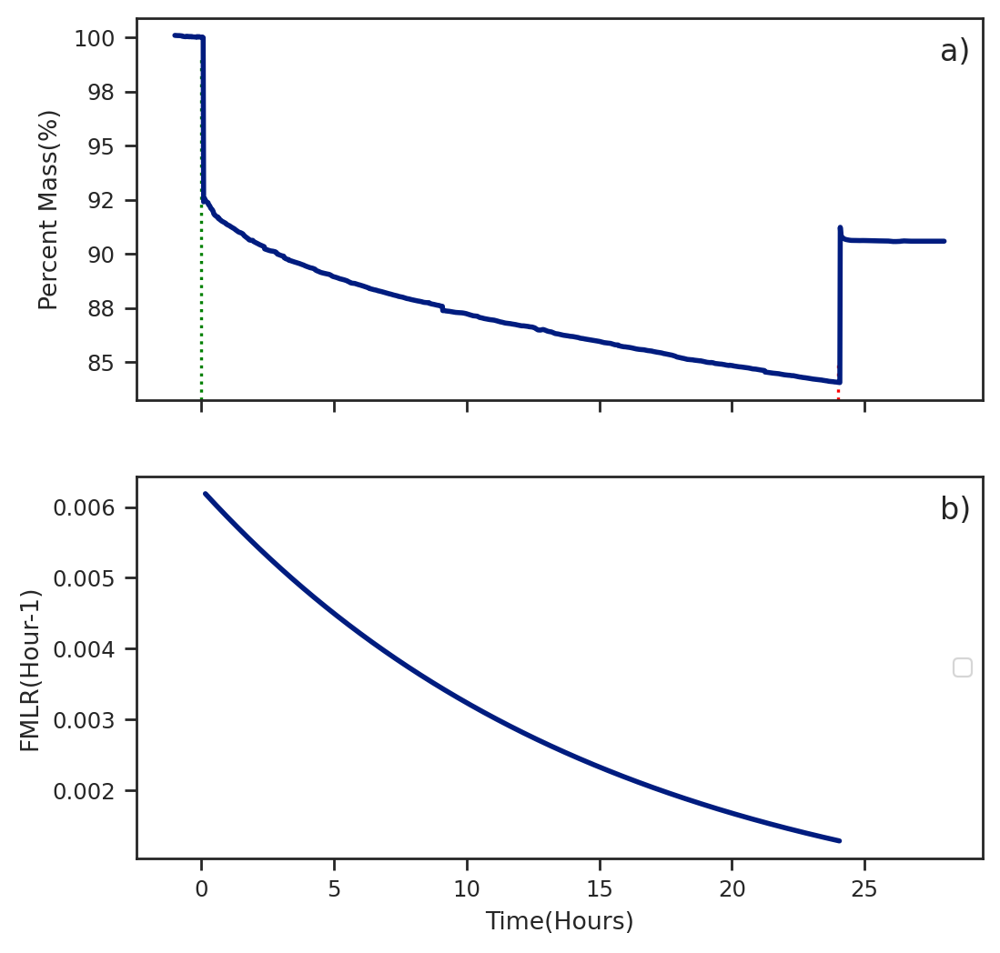

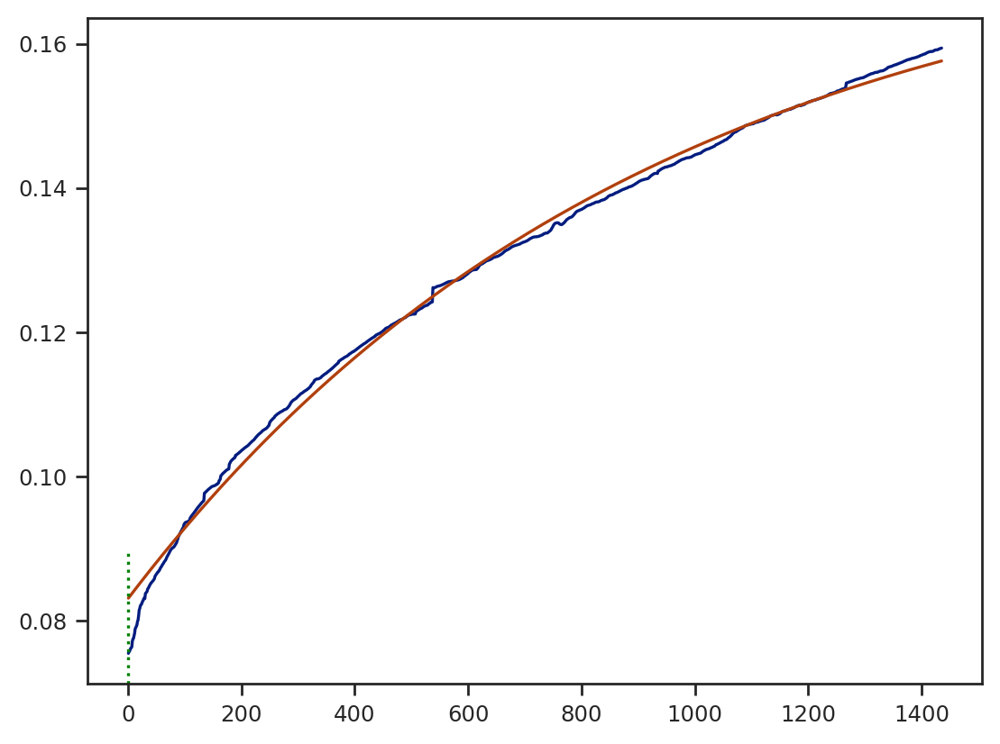

In [167]:
###405 22 9-03


path_1 = 'data/9_3_SRFA_405_3b/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='9/3/2022 05:20:00',f0=5004607,f1=5001606.151,time_frame=['9/3/2022 03:00:00','9/4/2022 08:00:00'],fit_time=['9/3/2022 05:28:00','9/4/2022 05:23:00'])


/tmp/ipykernel_238543/1117680905.py:83: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 2714.1450000004843
                          A
-1 days +23:00:00  0.999809
-1 days +23:01:00  0.999812
-1 days +23:02:00  0.999909
-1 days +23:03:00  0.999905
-1 days +23:04:00  0.999868
...                     ...
1 days 03:56:00    0.921500
1 days 03:57:00    0.921500
1 days 03:58:00    0.921500
1 days 03:59:00    0.921500
1 days 04:00:00    0.921500

[1741 rows x 1 columns]
[-9.50571481e-02  1.30638604e+03  2.02085397e-01]
[[5.75169895e-04            nan            nan]
 [           nan 1.44829121e+01 9.51879387e-02]
 [           nan 9.51879387e-02 6.32432743e-04]]
top speed: 0.004362466066801366 end speed: 0.0014488352499020057


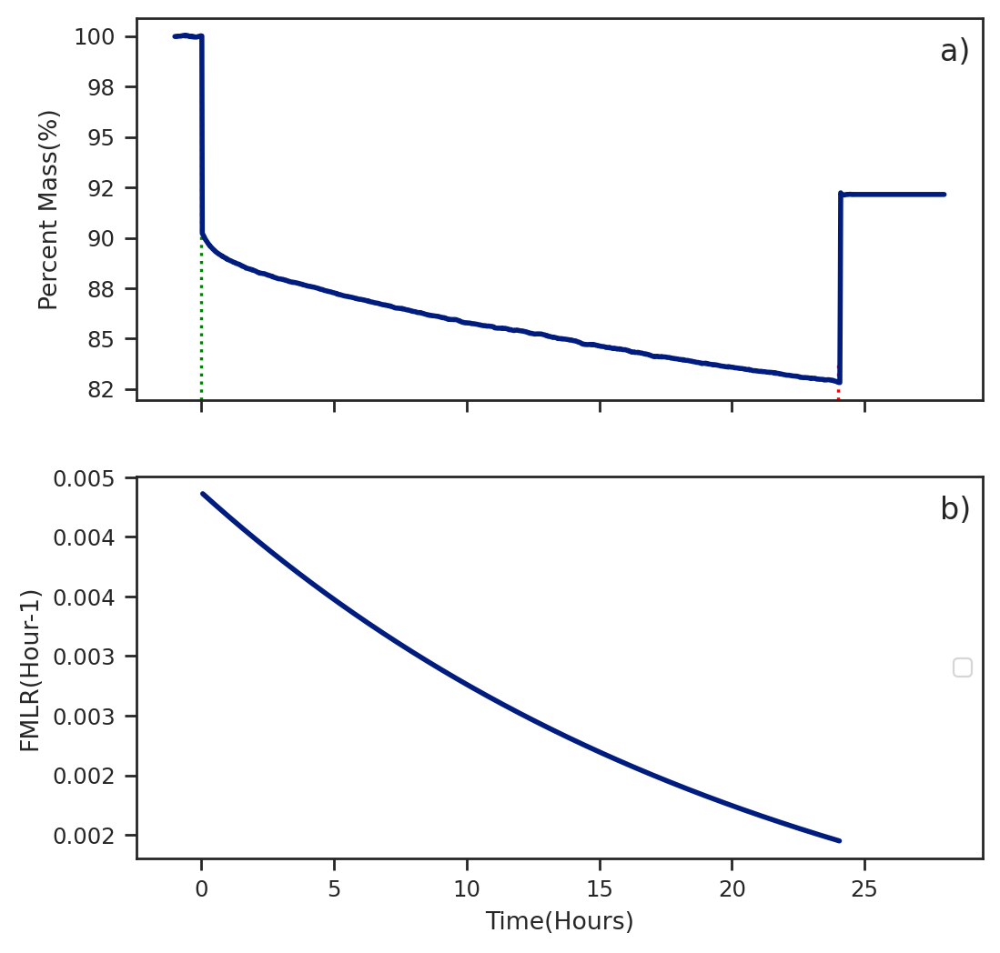

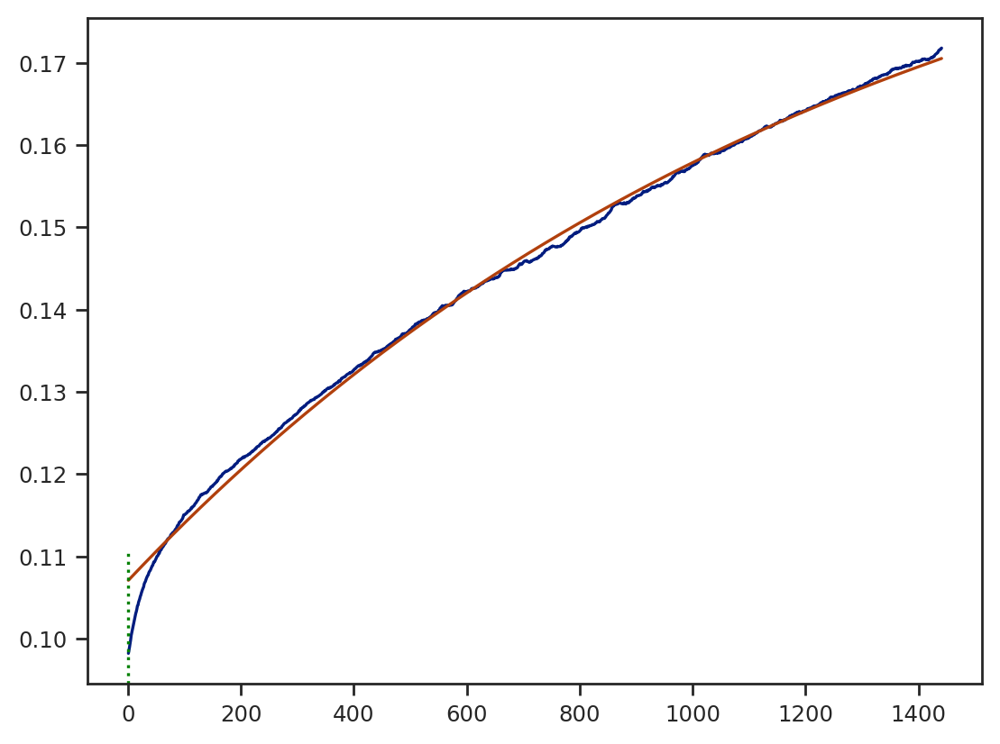

In [168]:
###405 23 03-25


path_1 = 'data/3_25_SRFA_405_305_N2_2A_B/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='3/25/2023 21:54:00',f0=5009401.756,f1=5006687.611,time_frame=['3/25/23 20:00:00','3/26/2023 22:30:00'],fit_time=['3/25/2023 21:56:00','3/26/2023 21:57:00'])


/tmp/ipykernel_238543/1117680905.py:83: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 3339.695000000298
                          A
-1 days +23:00:00  1.000313
-1 days +23:01:00  1.000286
-1 days +23:02:00  1.000288
-1 days +23:03:00  1.000277
-1 days +23:04:00  1.000253
...                     ...
1 days 03:56:00    0.915425
1 days 03:57:00    0.915425
1 days 03:58:00    0.915425
1 days 03:59:00    0.915425
1 days 04:00:00    0.915425

[1741 rows x 1 columns]
[-9.32918536e-02  1.08453066e+03  1.75849050e-01]
[[3.65002775e-04            nan            nan]
 [           nan 8.83665918e+00 6.01299336e-02]
 [           nan 6.01299336e-02 4.15784986e-04]]
top speed: 0.005156472343912557 end speed: 0.0013706095590102383


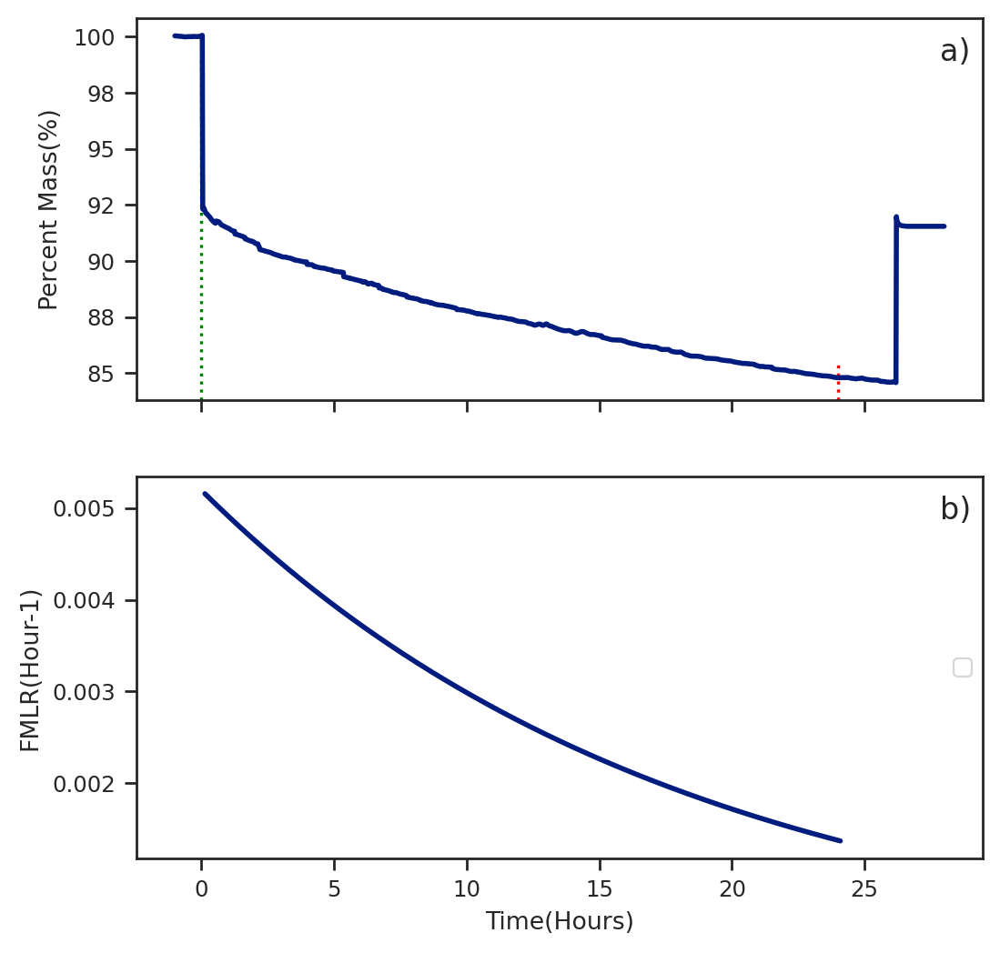

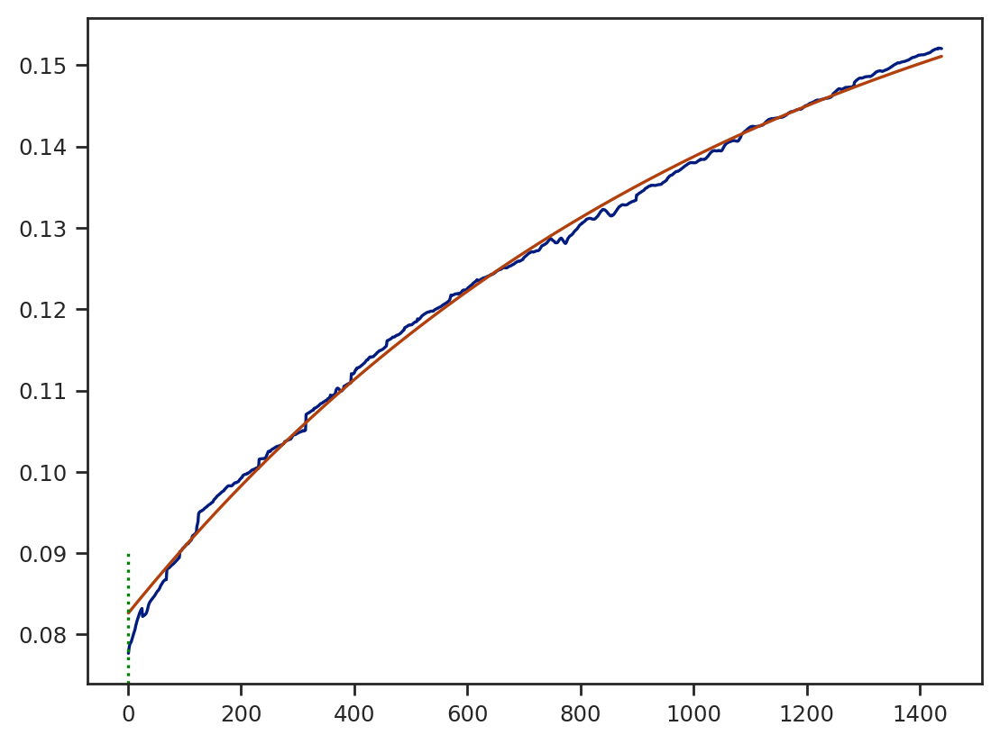

In [169]:
###405 23 03-28

path_1 = 'data/3_28_SRFA_405_305_2C_2D/A.xlsx'
_=qcm_to_speed_plot(path_1,t0='3/29/2023 20:55:00',f0=5001119.252,f1=4997779.557,time_frame=['3/29/2023 19:00:00','3/30/2023 23:30:00'],fit_time=['3/29/2023 21:02:00','3/30/2023 21:00:00'])


In [17]:
%matplotlib inline
plt.plot((1,2,3),(1,2,3))
#plt.show()

AttributeError: module 'PIL.Image' has no attribute 'Resampling'

<Figure size 640x480 with 1 Axes>

In [120]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import datetime as dt
import matplotlib as mpl
from matplotlib.ticker import FormatStrFormatter
import matplotlib.dates as mdates
from datetime import datetime, timedelta
from matplotlib.dates import DateFormatter
#plt.style.use('ggplot')
%matplotlib inline
%config InlineBackend.figure_format='retina'
from mpl_toolkits.axes_grid1 import make_axes_locatable
'''
def bi_exp(x, k_1,t_1,k_2,t_2,c):
    return c+k_1*np.exp(-x/t_1) + k_2*np.exp(-x/t_2)
def d_bi_exp(x, k_1,t_1,k_2,t_2,c):
    return -k_1*(1/t_1)*np.exp(-x/t_1) + -k_2*(1/t_2)*np.exp(-x/t_2)
'''

def bi_exp(x, k_1,t_1,c):
    return c+k_1*np.exp(-x/t_1) 
def d_bi_exp(x, k_1,t_1,c):
    return -k_1*(1/t_1)*np.exp(-x/t_1) 

def qcm_to_speed_plot(path_1,t0='02/23/2023 15:09:00',f0=500,f1=500,offset=0,loading=(5000000,5000000),sma_window_size=100,savgol_para=(61,4),fit_time=('2/25/2023 19:10:00','2/26/2023 20:06:00'),time_frame=['2022-06-08 14:00:00','2022-06-09 16:00:00'],plot_name='6_8_305nm_LED',b_switch=True,baseline_time=None,delta=10):
    data = pd.read_excel(path_1,header=0,parse_dates=True,usecols=['Time','Untitled'])
    #print(data)
    data=data.set_index('Time')
    data.rename(columns = {'Untitled':'A'}, inplace = True)
    data['A']=data['A'].dropna()
    data= data.asfreq(freq='60s',method='pad')
    #print('pass 1')
    fig, axes = plt.subplots(2, 1,sharex=True,figsize=(6,6))
    axes[1].set_xlabel('Time(Hours)')
    axes[0].set_ylabel('Percent Mass(%)')
    #axes[0].set_ylim([0.75,1.02])
    axes[0].text(0.95, 0.95, 'a)',transform=axes[0].transAxes, fontsize=12,verticalalignment='top')
    axes[1].text(0.95, 0.95, 'b)',transform=axes[1].transAxes, fontsize=12,verticalalignment='top')
    
    axes[0].axvline(x=0, color='g', linestyle='dotted',ymax=0.9)
    axes[0].axvline(x=168, color='r', linestyle='dotted',ymax=0.1)
    axes[1].set_ylabel('FMLR(Hour-1)')
    roi = data[(data.index > time_frame[0]) & (data.index <= time_frame[1])]
    
    #print(roi)
    roi.index = pd.to_timedelta(roi.index - pd.to_datetime(t0))
    new_index = pd.timedelta_range(start='-60min', end='171hours', freq='1min')
    #(td / np.timedelta64(1, 'D')).astype(int)
    #print(new_index/np.timedelta64(1, 'h').astype(int))
    # Reindex the DataFrame using the new index, filling missing values with NaN
    
    roi = roi.reindex(new_index,method='ffill',fill_value=pd.NaT)
    num_index = np.linspace(0,10080,num=10081)
    roi = roi.reindex(new_index,method='ffill',fill_value=pd.NaT)
    roi = roi.reindex(new_index)

    norm_roi = (f0-roi)/(f0-f1)
    print('Loading',f0-f1)
    print(norm_roi)
    axes[0].plot(roi.index.total_seconds()/(60*60),norm_roi['A'].values,linewidth=2)
    fmt = lambda x, pos: '{:.0f}'.format(x*100, pos)
    axes[0].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
    #fit_time = ('2/25/2023 19:10:00','2/26/2023 20:06:00')
    delta_time = (datetime.strptime(fit_time[0],"%m/%d/%Y %H:%M:%S")-datetime.strptime(t0,"%m/%d/%Y %H:%M:%S"),datetime.strptime(fit_time[1],"%m/%d/%Y %H:%M:%S")-datetime.strptime(t0,"%m/%d/%Y %H:%M:%S"))
    #print(delta_time)
    roi_fit = 1-norm_roi[(norm_roi.index > delta_time[0]) & (norm_roi.index <= delta_time[1])]
    #print(roi_fit)
    roi_fit.fillna(method='ffill',inplace=True)
    x = np.linspace(1,len(roi_fit),num=len(roi_fit))
    y = (roi_fit['A'].values)
    #print(y)
    
    #popt, pcov = curve_fit(bi_exp, x, y,p0=[-0.1,0.1,-0.1,0.1,0.1],bounds=(-1.2,np.inf),maxfev=50000)
    popt, pcov = curve_fit(bi_exp, x, y,p0=[-0.1,0.1,0.1],bounds=(-1.2,np.inf),maxfev=50000)
    
    #popt, pcov = curve_fit(bi_exp, x, y,p0=[0.1,0.1,0.1,0.1,0],bounds=(0,1),maxfev=50000)
    print(popt)
    print(np.sqrt(pcov))
    roi_fit['speed'] = d_bi_exp(x,*popt)
    print('top speed:',60*roi_fit['speed'].iloc[0],'end speed:',60*roi_fit['speed'].iloc[-1])
    axes[1].plot(roi_fit.index.total_seconds()/(60*60),60*(roi_fit['speed']),linewidth=2)
    fmt = lambda x, pos: '{:.3f}'.format(x, pos)
    axes[1].yaxis.set_major_formatter(mpl.ticker.FuncFormatter(fmt))
    axes[1].legend(loc=7)
    
    #axes[2].set_xlim([roi.index.total_seconds()[0]/(60*60),roi.index.total_seconds()[-1]/(60*60)])
    
    plt.figure()
    plt.plot(x,y,label='data')
    plt.plot(x,bi_exp(x,*popt),label='fit')
    plt.axvline(x=0, color='g', linestyle='dotted',ymax=0.2)
    return roi_fit,norm_roi,popt


/var/folders/zh/6yg0122j0tlgz3_2t6x64jkh0000gn/T/ipykernel_13003/1657485822.py:83: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 2839.4720099996775
                          A
-1 days +23:00:00  1.000016
-1 days +23:01:00  1.000048
-1 days +23:02:00  0.999991
-1 days +23:03:00  0.999977
-1 days +23:04:00  0.999928
...                     ...
7 days 02:56:00    0.409607
7 days 02:57:00    0.409607
7 days 02:58:00    0.409607
7 days 02:59:00    0.409607
7 days 03:00:00    0.409607

[10321 rows x 1 columns]
[-6.55985007e-01  4.81837160e+03  6.61811996e-01]
[[4.24570883e-05            nan            nan]
 [           nan 9.27036902e-01 6.77444231e-03]
 [           nan 6.77444231e-03 5.17272649e-05]]
top speed: 0.008166853041581901 end speed: 0.0010093795267735208


/var/folders/zh/6yg0122j0tlgz3_2t6x64jkh0000gn/T/ipykernel_13003/1657485822.py:83: RuntimeWarning: invalid value encountered in sqrt
  print(np.sqrt(pcov))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Loading 2937.328799999319
                          A
-1 days +23:00:00  0.999871
-1 days +23:01:00  0.999853
-1 days +23:02:00  0.999830
-1 days +23:03:00  0.999790
-1 days +23:04:00  0.999774
...                     ...
7 days 02:56:00    0.320701
7 days 02:57:00    0.320701
7 days 02:58:00    0.320701
7 days 02:59:00    0.320701
7 days 03:00:00    0.320701

[10321 rows x 1 columns]
[-6.59548771e-01  2.00316343e+03  6.65130110e-01]
[[2.20801400e-04 1.16311799e-02            nan]
 [1.16311799e-02 1.43941888e+00 1.01766411e-02]
 [           nan 1.01766411e-02 9.56169061e-05]]
top speed: 0.01974535645861361 end speed: 0.00012916994384961147


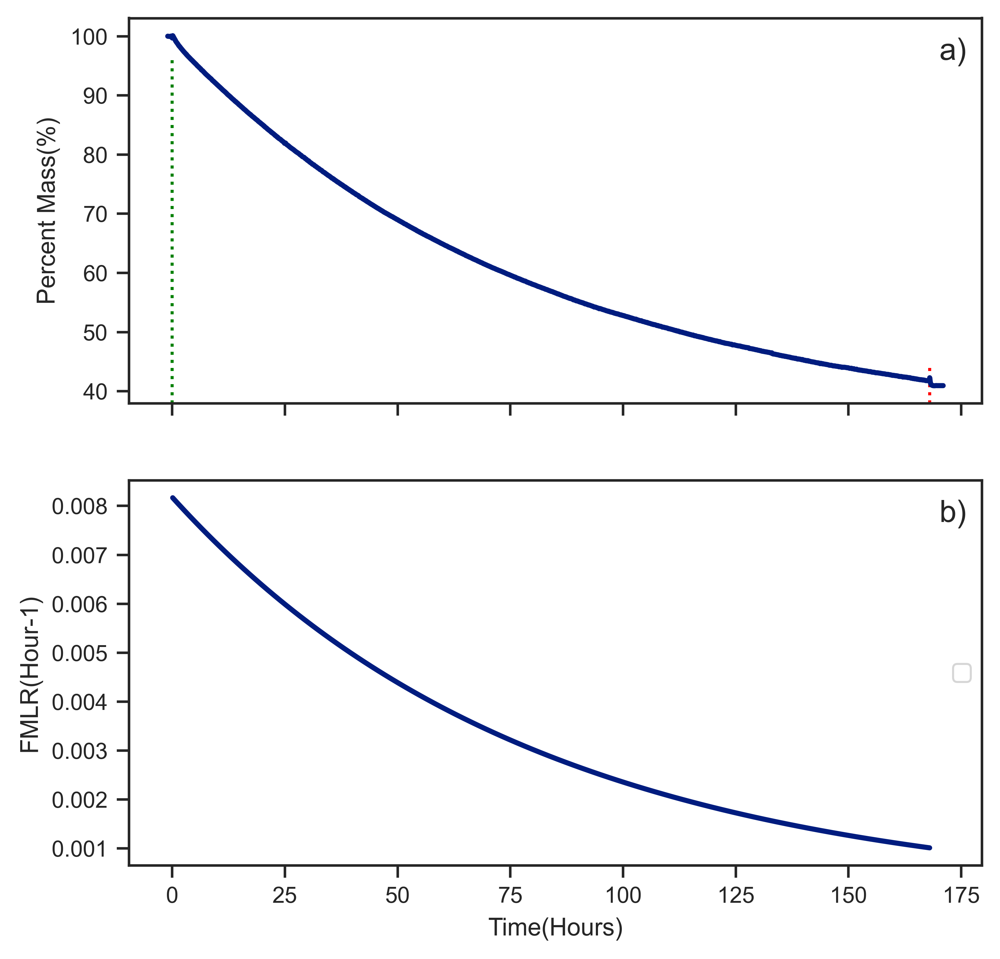

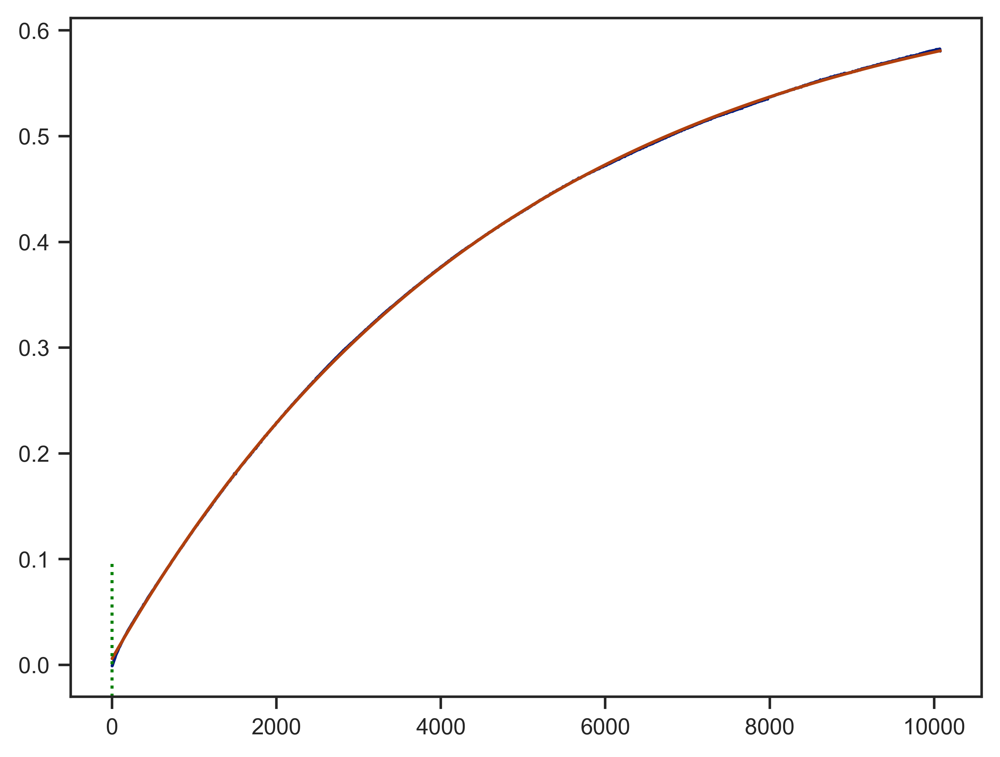

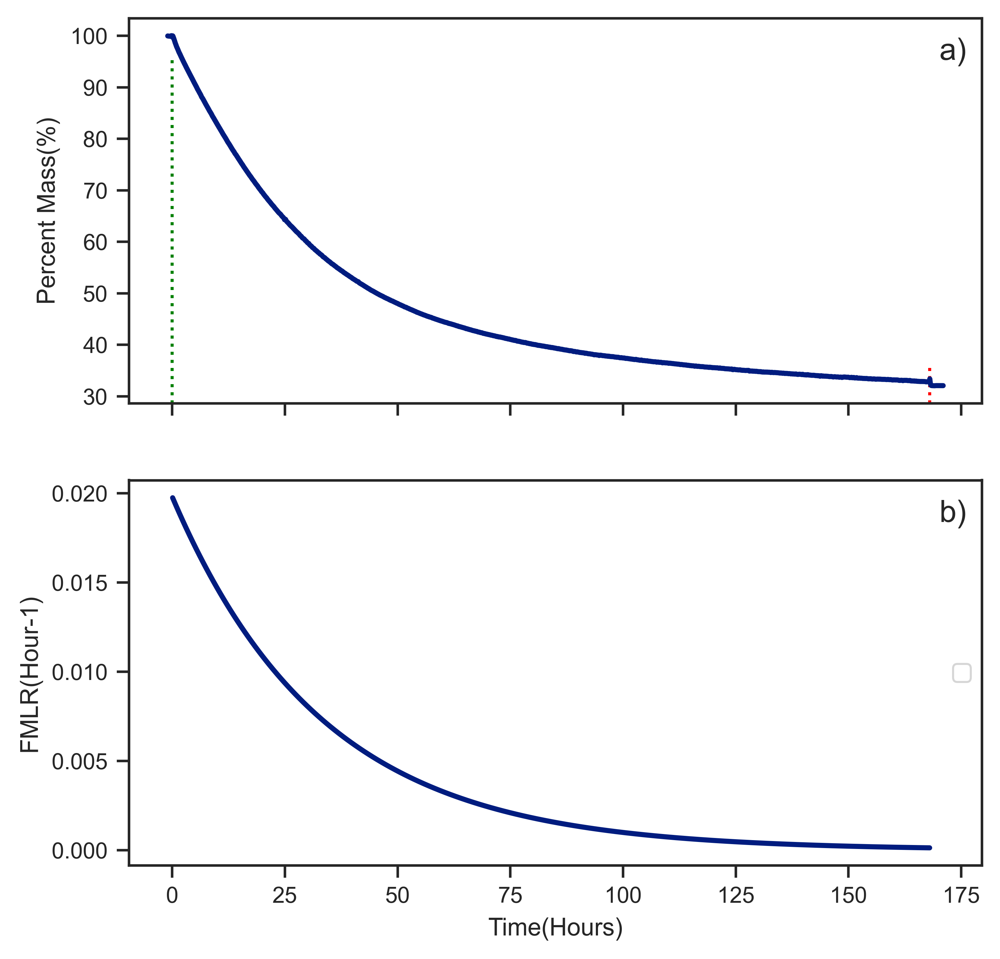

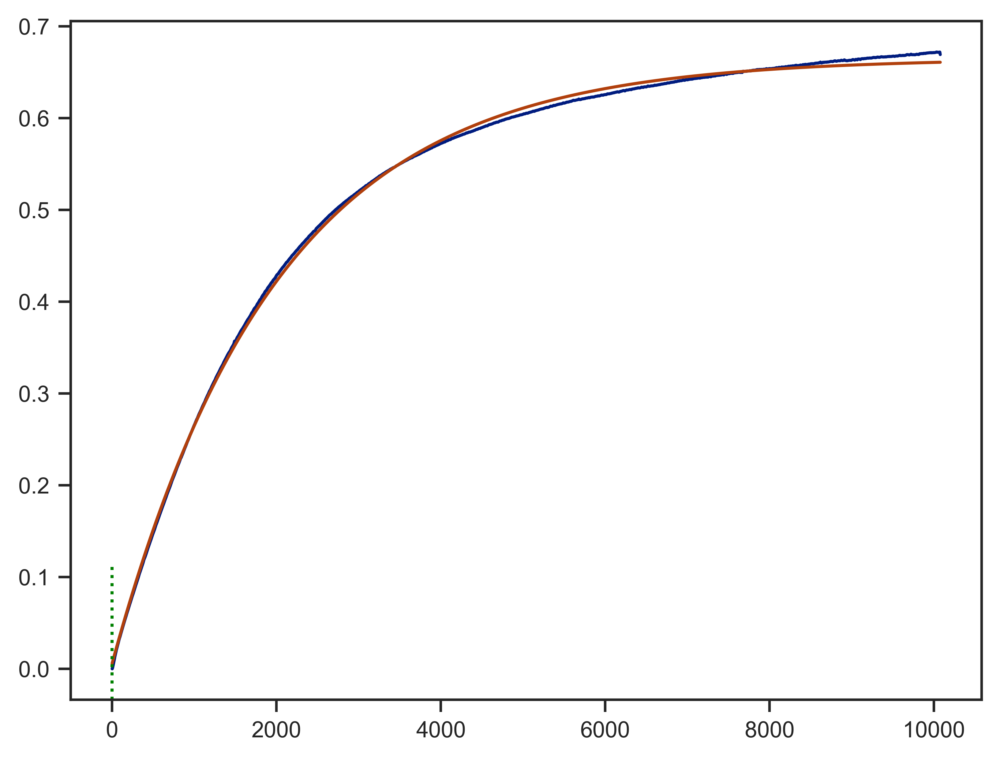

In [121]:
####for the one week data

path_1 = 'data/Special/5_17_SRFA_305_254_1week/A.xlsx'
FA_week_305,FA_week_norm_305,FA_week_305_popt= qcm_to_speed_plot(path_1,t0='05/19/2023 08:25:0',f0=4998633.68201,f1=4995794.21,fit_time=('5/19/2023 08:30:30','5/26/2023 08:25:00'),time_frame=['05/19/2023 06:24:0','05/26/2023 10:00:0'])

 
path_2 = 'data/Special/5_17_SRFA_305_254_1week/B.xlsx'
FA_week_254,FA_week_norm_254,FA_week_254_popt= qcm_to_speed_plot(path_2,t0='05/19/2023 08:25:0',f0=5000158.9098,f1=4997221.581,fit_time=('5/19/2023 08:29:30','5/26/2023 08:25:00'),time_frame=['05/19/2023 06:24:0','05/26/2023 10:00:0'])

In [122]:
print(FA_week_254['A']['1 days 00:00:00'])
print(FA_week_305['A']['1 days 00:00:00'])

0.3462827212262225
0.1742897335340794


In [136]:
print(FA_week_254['A']['7 days 00:00:00'])
print(FA_week_305['A']['7 days 00:00:00'])

0.669222635205089
0.580387753144461


In [129]:
print(FA_week_254['A']['3 days 12:00:00'])
print(FA_week_305['A']['3 days 12:00:00'])

0.6052173662001339
0.43098343836134423
